# Наш набор данных

## Макроэкономические и рыночные факторы

| **Фактор**                                   |         | **Описание**                                                        |
|---------------------------------------------|---------|----------------------------------------------------------------------|
| USD/RUB                                     |         | Курс доллара США к рублю                                            |
| EUR/RUB                                     |         | Курс евро к рублю                                                   |
| Индекс доллара (DXY)                        |         | Индекс стоимости доллара США относительно корзины валют            |
| Цена на нефть (Brent)                       |         | Цена барреля нефти марки Brent                                      |
| Золото                                      |         | Цена золота за тройскую унцию                                       |
| Цена на нефть WTI (West Texas Intermediate) |         | Цена барреля нефти марки WTI                                        |
| Волатильность VXD                           |         | Индекс волатильности по индексу Dow Jones                           |
| Волатильность RVI                           |         | Российский индекс волатильности                                     |
| Волатильность на рынке (VIX)                |         | Индекс волатильности по S&P 500                                     |
| Ключевая ставка ЦБ РФ                       |         | Основной инструмент денежно-кредитной политики Банка России         |
| S&P 500                                     |         | Американский фондовый индекс                                        |
| NASDAQ                                      |         | Фондовый индекс высокотехнологичных компаний США                    |

## Отраслевые индексы Московской биржи

| **Название индекса**                        | **Код**  | **Описание**                                                        |
|---------------------------------------------|----------|----------------------------------------------------------------------|
| Нефти и газа                                | MOEXOG   | Лукойл, Роснефть, Газпром, Татнефть - наиболее весомый сектор       |
| Электроэнергетики                           | MOEXEU   | Россети, ИнтерРАО, Русгидро - капиталоёмкий и регулируемый сектор   |
| Телекоммуникаций                            | MOEXTL   | МТС, Ростелеком и др. - устойчивые компании, низкая волатильность   |
| Металлов и добычи                           | MOEXMM   | Норникель, Полюс, СевСталь, Алроса - чувствителен к сырьевым рынкам |
| Финансов                                    | MOEXFN   | Банки, страховые и инвесткомпании (Сбер, ВТБ, Тинькофф и др.)       |
| Потребительского сектора                    | MOEXCN   | Магнит, X5, Детский мир, Белуга - зависят от спроса и инфляции      |
| Химии и нефтехимии                          | MOEXCH   | Акрон, ФосАгро, Уралкалий - чувствителен к экспортным ценам         |
| Информационных технологий                   | MOEXIT   | Яндекс, Циан и др. - немногочисленные, но быстрорастущие бумаги     |
| Строительных компаний                       | MOEXRE   | ПИК, Эталон и др. - зависят от ставок ЦБ и инфляции                 |
| Транспорта                                  | MOEXTN   | Аэрофлот, ГТЛК - волатилен, зависит от цен на топливо и спроса      |

## Процентные ставки

| **Ставка**                                  |         | **Описание**                                                        |
|---------------------------------------------|---------|----------------------------------------------------------------------|
| Ключевая ставка ЦБ РФ                       |         | Уровень процентной ставки, определяемый Центральным Банком России   |

## Целевая переменная

| **Ставка** |         | **Описание**                                                           |
|------------|---------|------------------------------------------------------------------------|
| IMOEX      |         | Индекс Московской биржи, отражающий совокупную динамику акций крупнейших российских компанй |


## Доработанные модели можно найти в ноутбуке `IMOEX_valuation_and_tuning`!

### Импорт библиотек

In [3]:
# Базовые библиотеки и утилиты
import numpy as np
import pandas as pd
import datetime
import os
import time
import time as time_module
import warnings
from copy import deepcopy
from bisect import bisect_left
from itertools import product
from typing import Union, Optional

# Настройки pandas
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_columns', None)

# Отображение в Jupyter
from IPython.display import display
%matplotlib inline

# Визуализация
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from utilsforecast.plotting import plot_series

# Работа с календарём
import holidays

# Прогресс-бары
from tqdm import tqdm

# SciPy
import scipy as sp
from scipy import stats
from scipy.stats import ttest_1samp, shapiro, ks_2samp, zscore
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import squareform

# Statsmodels
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.datasets import longley
from statsmodels.formula.api import ols
from statsmodels.graphics import tsaplots
from statsmodels.graphics.gofplots import qqplot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox, het_breuschpagan
from statsmodels.tsa.stattools import acf, adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.ar_model import ar_select_order
from statsmodels.tsa.arima.model import ARIMA

# StatsForecast
from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA, _TS

# Scikit-learn: модели, препроцессинг, метрики
from sklearn.cluster import DBSCAN
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    f1_score, mean_absolute_error, mean_squared_error, precision_score,
    r2_score, recall_score, roc_auc_score, roc_curve
)
from sklearn.model_selection import (
    GridSearchCV, ParameterGrid, RandomizedSearchCV,
    TimeSeriesSplit, train_test_split
)
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.tree import DecisionTreeClassifier

# Boosting модели
from catboost import CatBoostRegressor
import catboost as cb
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier, XGBRegressor
import xgboost as xgb

# Гиперпараметрический поиск
from hyperopt import fmin, tpe, Trials, STATUS_OK, hp

# Кодировщики категориальных признаков
import category_encoders as ce

# Дополнительные утилиты
from sktime.utils.plotting import plot_correlations

# SHAP
import shap

In [4]:
# имя и фамилию в эту переменную
image_name_prefix = 'Владимир_Смирнов'

# сюда будут сохраняться изображения
path_to_save_images = 'C:\\Users\\smirn\\OneDrive\\Рабочий стол\\FQW_GSOM_PICTURES'

# этот код сохраняет картинку
# plt.savefig(
#     os.path.join(path_to_save_images, f'{image_name_prefix}_image_5.png')
# )

### Ряд используемых функций

#### KPSS и ADF тесты

In [7]:
def adf_test(timeseries, alpha=0.05):
    """
    Augmented Dickey-Fuller Test with выводом интерпретации результата.
    """
    print("ADF Test (Augmented Dickey-Fuller)")
    print("H0: Временной ряд нестационарен (есть единичный корень)")
    print("H1: Временной ряд стационарен\n")
    
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '# Lags Used', 'Number of Observations Used'])

    for key, value in dftest[4].items():
        dfoutput[f'Critical Value ({key})'] = value

    print(dfoutput)
    
    print("\nИнтерпретация:")
    if dftest[1] < alpha:
        print(f"p-value = {dftest[1]:.4f} < {alpha} => Отклоняем H0: ряд считается стационарным.")
    else:
        print(f"p-value = {dftest[1]:.4f} >= {alpha} => Не отклоняем H0: ряд считается нестационарным.")
    

def kpss_test(timeseries, alpha=0.05, regression='c'):
    """
    KPSS Test с интерпретацией результата.
    regression='c' - проверка на стационарность относительно уровня
    regression='ct' - проверка на стационарность относительно тренда
    """
    print(f"KPSS Test (regression='{regression}')")
    print("H0: Временной ряд тренд-стационарен")
    print("H1: Временной ряд тренд-нестационарен\n")
    
    kpsstest = kpss(timeseries, regression=regression, nlags="auto")
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic', 'p-value', 'Lags Used'])

    for key, value in kpsstest[3].items():
        kpss_output[f'Critical Value ({key})'] = value

    print(kpss_output)

    print("\nИнтерпретация:")
    if kpsstest[1] < alpha:
        print(f"p-value = {kpsstest[1]:.4f} < {alpha} => Отклоняем H0: ряд считается тренд-нестационарным.")
    else:
        print(f"p-value = {kpsstest[1]:.4f} ≥ {alpha} => Не отклоняем H0: ряд считается тренд-стационарным.")

#### Функция для репорта по метрикам

In [9]:
def metrics_report(y_true, y_pred, seasonality=1, model_name='Модель'):
    """
    Отчёт по метрикам качества прогноза модели.

    Выводит:
    - Таблицу с основными метриками (локализовано)
    - Визуализацию в виде таблицы без цветовой иерархии

    :param y_true: Истинные значения
    :param y_pred: Предсказания модели
    :param seasonality: Сезонность (для MASE)
    :param model_name: Название модели (для заголовка)
    :return: pd.DataFrame с метриками
    """

    # Приводим данные к Series без индексов
    y_true = pd.Series(y_true).reset_index(drop=True)
    y_pred = pd.Series(y_pred).reset_index(drop=True)

    # Метрики
    def mase(y_true, y_pred, seasonality=1):
        naive = y_true.shift(seasonality)
        mask = ~naive.isna()
        naive_mae = np.mean(np.abs(y_true[mask] - naive[mask]))
        model_mae = np.mean(np.abs(y_true[mask] - y_pred[mask]))
        return model_mae / naive_mae if naive_mae != 0 else np.nan

    def smape(y_true, y_pred):
        denominator = (np.abs(y_true) + np.abs(y_pred)) / 2
        mask = denominator != 0
        return np.mean(np.abs(y_true[mask] - y_pred[mask]) / denominator[mask]) * 100

    def mdape(y_true, y_pred):
        mask = y_true != 0
        return np.median(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

    def mape(y_true, y_pred):
        mask = y_true != 0
        return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

    # Формируем таблицу метрик
    metrics = [
        ['MAE', mean_absolute_error(y_true, y_pred)],
        ['MSE', mean_squared_error(y_true, y_pred)],
        ['RMSE', np.sqrt(mean_squared_error(y_true, y_pred))],
        ['MAPE (%)', mape(y_true, y_pred)],
        ['MDAPE (%)', mdape(y_true, y_pred)],
        ['SMAPE (%)', smape(y_true, y_pred)],
        ['R2', r2_score(y_true, y_pred)],
        ['MASE', mase(y_true, y_pred, seasonality=seasonality)]
    ]

    df = pd.DataFrame(metrics, columns=['Метрика', 'Значение'])
    df['Значение'] = df['Значение'].round(4)

    # Визуализация таблицы
    fig, ax = plt.subplots(figsize=(5, len(df) * 0.5 + 1))
    ax.axis('off')

    table = ax.table(
        cellText=df.values,
        colLabels=df.columns,
        cellLoc='center',
        loc='center'
    )

    # Настройка шрифта
    table.auto_set_font_size(False)
    table.set_fontsize(10)

    # Стиль
    for (row, col), cell in table.get_celld().items():
        if row == 0:
            cell.set_text_props(weight='bold')
            cell.set_facecolor('#f0f0f0')
        elif col == 1:
            cell.set_text_props(weight='bold', color='black')

    plt.tight_layout()
    plt.show()

    return df

#### График

In [11]:
def plotly_single_feature(
    df,
    column,
    index_col='ds',
    title=None,
    yaxis_title='Значение',
    line_name=None,
    color='#636EFA',
    show_mean=True,
    show_median=True,
    save=False,
    save_path='feature_plot.html'
):
    """
    Универсальный график временного ряда с возможностью отобразить среднее и медиану.

    Параметры:
    - df: DataFrame с данными
    - column: имя числового столбца для отображения
    - index_col: колонка с временным индексом (по умолчанию 'ds')
    - title: заголовок графика
    - yaxis_title: подпись оси Y
    - line_name: имя основного ряда (по умолчанию = column)
    - color: цвет линии (по умолчанию Plotly синий)
    - show_mean: показать линию среднего
    - show_median: показать линию медианы
    - save: сохранить график в HTML
    - save_path: путь к файлу (если save=True)
    """
    df = df.copy()

    if index_col in df.columns:
        df = df.set_index(index_col)

    line_name = line_name or column
    title = title or f'График: {column}'

    mean_val = df[column].mean()
    median_val = df[column].median()

    traces = []

    # Основная линия
    traces.append(go.Scatter(
        x=df.index,
        y=df[column],
        mode='lines',
        name=line_name,
        line=dict(color=color, width=2)
    ))

    # Медиана
    if show_median:
        traces.append(go.Scatter(
            x=[df.index.min(), df.index.max()],
            y=[median_val, median_val],
            mode='lines',
            name='Медиана',
            line=dict(color='orange', width=2, dash='dash')
        ))

    # Среднее
    if show_mean:
        traces.append(go.Scatter(
            x=[df.index.min(), df.index.max()],
            y=[mean_val, mean_val],
            mode='lines',
            name='Среднее',
            line=dict(color='blue', width=2, dash='dot')
        ))

    layout = go.Layout(
        title=title,
        xaxis=dict(title='Дата'),
        yaxis=dict(title=yaxis_title),
        template='plotly_white',
        hovermode='x unified',
        legend=dict(
            title='Легенда',
            orientation='v',
            x=1.02,
            y=1,
            xanchor='left',
            yanchor='top',
            bgcolor='rgba(255,255,255,0.8)',
            bordercolor='lightgray',
            borderwidth=1
        )
    )

    fig = go.Figure(data=traces, layout=layout)
    iplot(fig)

    if save:
        dir_to_save = os.path.dirname(save_path)
        if dir_to_save:
            os.makedirs(dir_to_save, exist_ok=True)
        plot(fig, filename=save_path, auto_open=False)
        print(f'Сохранено в файл: {os.path.abspath(save_path)}')

#### График IMOEX

In [13]:
def plotly_single_feature_IMOEX(df, column='y', title='График индекса IMOEX', save=False, save_path='imoex_plot.html'):
    df = df.copy()

    if 'ds' in df.columns:
        df = df.set_index('ds')

    median_val = df[column].median()
    mean_val = df[column].mean()

    trace_line = go.Scatter(
        x=df.index,
        y=df[column],
        mode='lines',
        name='IMOEX',
        line=dict(color='#636EFA', width=2)
    )

    trace_median = go.Scatter(
        x=[df.index.min(), df.index.max()],
        y=[median_val, median_val],
        mode='lines',
        name='Медиана (IMOEX)',
        line=dict(color='orange', width=2, dash='dash')
    )

    trace_mean = go.Scatter(
        x=[df.index.min(), df.index.max()],
        y=[mean_val, mean_val],
        mode='lines',
        name='Среднее (IMOEX)',
        line=dict(color='blue', width=2, dash='dot')
    )

    layout = go.Layout(
        title=title,
        xaxis=dict(title='Дата'),
        yaxis=dict(title='Значение индекса'),
        template='plotly_white',
        hovermode='x unified',
        legend=dict(
            title='Легенда',
            orientation='v',
            x=1.02,
            y=1,
            xanchor='left',
            yanchor='top',
            bgcolor='rgba(255,255,255,0.8)',
            bordercolor='lightgray',
            borderwidth=1
        )
    )

    fig = go.Figure(data=[trace_line, trace_median, trace_mean], layout=layout)
    iplot(fig)

    if save:
        dir_to_save = os.path.dirname(save_path)
        if dir_to_save:
            os.makedirs(dir_to_save, exist_ok=True)
        plot(fig, filename=save_path, auto_open=False)
        print(f'Сохранено в файл: {os.path.abspath(save_path)}')

#### Оценка SARIMAX

In [246]:
def check_fit(resids):
    resids = np.asarray(resids)
    
    # Проверка: среднее = 0
    mean_t, mean_pval = ttest_1samp(resids, 0)

    # ADF тест на стационарность
    stat_t, stat_pval = adfuller(resids, maxlag=6)[:2]

    # Shapiro–Wilk тест на нормальность
    norm_stat, norm_pval = shapiro(resids)

    # Ljung–Box тест на автокорреляцию
    lb_ok = (acorr_ljungbox(resids, model_df=0, return_df=True)['lb_pvalue'] > 0.05).all()

    # Breusch–Pagan тест на гетероскедастичность (по индексу времени)
    time_index = np.arange(len(resids))
    exog = sm.add_constant(time_index)
    _, _, f_stat, f_pval = het_breuschpagan(resids, exog)

    # Финальный результат
    records = {
        "mean_resids": np.mean(resids),
        "mean_t": mean_t,
        "mean_pval": mean_pval,
        "stationary_t": stat_t,
        "stationary_pval": stat_pval,
        "norm_stat": norm_stat,
        "norm_pval": norm_pval,
        "autocor_pass": lb_ok,
        "heteroscedasticity_f": f_stat,
        "heteroscedasticity_pval": f_pval,
        "check_result": (mean_pval > 0.05) & (stat_pval < 0.05) & (norm_pval > 0.05) & (f_pval > 0.05) & lb_ok
    }

    return records

##_________________________________________________________##

def plot_diagnostics(data, dt_col, resid_col, lags=20, suptitle_suffix=""):
    fig, ax = plt.subplots(3, 2, figsize=(16, 14))
    
    # Опциональная подпись
    extra = f" {suptitle_suffix}" if suptitle_suffix else ""
    
    # 1. Динамика ошибок
    sns.lineplot(data=data, x=dt_col, y=resid_col, ax=ax[0][0])
    ax[0][0].axhline(0, c="k", linestyle="--")
    ax[0][0].set_title("Динамика ошибок прогноза" + extra, fontweight='bold')
    ax[0][0].set_xlabel(None)
    ax[0][0].set_ylabel("Остатки")
    ax[0][0].xaxis.set_major_locator(plt.MaxNLocator(6))
    
    # 2. Гистограмма остатков
    ax[0][1].hist(data[resid_col], bins=500, edgecolor='k', alpha=1.0)
    ax[0][1].set_xlim(-200, 200)
    ax[0][1].set_title("Гистограмма ошибок прогноза" + extra, fontweight='bold')
    ax[0][1].set_xlabel("Остатки")
    ax[0][1].set_ylabel("Частота")

    # 3. ACF с p-value из Ljung-Box
    plot_acf(data[resid_col], lags=lags, ax=ax[1][0])
    ax[1][0].set_title("ACF ошибок прогноза" + extra, fontweight='bold')
    
    lb_test = acorr_ljungbox(data[resid_col], lags=[lags], return_df=True)
    lb_pvalue = lb_test['lb_pvalue'].values[0]
    ax[1][0].text(0.95, 0.95, f"Ljung–Box p = {lb_pvalue:.3f}",
                  horizontalalignment='right',
                  verticalalignment='top',
                  transform=ax[1][0].transAxes,
                  fontsize=10,
                  bbox=dict(facecolor='white', alpha=0.8))

    print(f"\nLjung–Box test (lag={lags}) p-value: {lb_pvalue:.4f}")

    # 4. PACF
    plot_pacf(data[resid_col], lags=lags, ax=ax[1][1])
    ax[1][1].set_title("PACF ошибок прогноза" + extra, fontweight='bold')

    # 5. Q–Q график
    qqplot(data[resid_col], line='s', ax=ax[2][0])
    ax[2][0].set_title("Q–Q график остатков" + extra, fontweight='bold')

    # 6. Пустой subplot
    ax[2][1].axis('off')

    plt.tight_layout()
    plt.show()

### Начало анализа

In [17]:
df = pd.read_excel("data_df.xlsx")

In [18]:
df.head()

,date,imoex_price,imoex_open,imoex_high,imoex_low,imoex_change_percent,cb_rate,dxy_price,dxy_open,dxy_high,dxy_low,dxy_change_percent,gold_price,west_price,brent_price,eur_rub_price,eur_rub_open,eur_rub_high,eur_rub_low,eur_rub_change_percent,usd_rub_price,usd_rub_open,usd_rub_high,usd_rub_low,usd_rub_change_percent,moexog_open,moexog_high,moexog_low,moexog_close,moexog_value,moexeu_open,moexeu_high,moexeu_low,moexeu_close,moexeu_value,moextl_open,moextl_high,moextl_low,moextl_close,moextl_value,moexmm_open,moexmm_high,moexmm_low,moexmm_close,moexmm_value,moexfn_open,moexfn_high,moexfn_low,moexfn_close,moexfn_value,moexcn_open,moexcn_high,moexcn_low,moexcn_close,moexcn_value,moexch_open,moexch_high,moexch_low,moexch_close,moexch_value,moexit_open,moexit_high,moexit_low,moexit_close,moexre_open,moexre_high,moexre_low,moexre_close,moextn_open,moextn_high,moextn_low,moextn_close,moextn_value,vix_price,vix_open,vix_high,vix_low,vix_change_percent,djia_price,djia_open,djia_high,djia_low,djia_change_percent,rvi_price,rvi_open,rvi_high,rvi_low,rvi_change_percent,sp500_price,sp500_open,sp500_high,sp500_low,sp500_change_percent,nasdaq_price,nasdaq_open,nasdaq_high,nasdaq_low,nasdaq_change_percent
0,2022-04-01,2759.640,2714.620,2817.720,2714.620,0.021,0.200,98.630,98.330,98.740,98.310,0.003,5159.820,99.320,106.130,94.677,90.530,98.533,89.647,0.046,83.250,81.000,89.894,81.000,0.051,7196.890,7426.130,7155.300,7182.950,21907823883.000,1438.600,1484.480,1427.540,1480.360,2254936276.850,1643.540,1695.960,1604.710,1613.620,511577043.500,9155.610,9294.450,9078.520,9171.270,11158796505.920,6730.850,7258.120,6730.850,7160.390,29721635860.600,6697.720,7004.000,6671.750,6698.790,2960220951.100,38191.800,38191.800,35130.360,35582.710,3011110002.200,2271.470,2271.470,2271.470,2271.470,7681.430,7681.430,7681.430,7681.430,976.160,1033.880,976.160,1003.180,1447782826.900,19.630,20.620,20.860,19.410,-0.045,18.270,18.830,19.280,15.580,-0.028,97.030,93.940,97.730,90.550,0.044,4545.860,4540.320,4548.700,4507.570,0.003,14261.500,14269.530,14306.940,14131.810,0.003
1,2022-04-04,2787.690,2775.060,2835.460,2682.340,0.010,0.200,99.000,98.570,99.080,98.520,0.004,5185.800,103.290,108.150,91.920,93.063,99.129,91.027,-0.029,81.495,80.000,89.750,79.550,-0.021,7263.440,7353.650,7029.550,7192.490,17433810186.200,1496.230,1511.990,1448.930,1477.140,1557943790.600,1610.840,1652.810,1557.910,1589.390,495081058.000,9291.710,9373.660,9018.650,9278.810,7857568107.560,7316.290,7580.610,7025.760,7487.570,31348019721.000,6865.260,6865.260,6472.400,6622.470,1801202659.560,35736.130,36558.600,34362.450,34738.470,1457321656.000,2223.420,2223.420,2223.420,2223.420,7441.640,7441.640,7441.640,7441.640,1027.170,1043.450,979.700,1033.290,2443441076.000,18.570,20.750,20.780,18.450,-0.054,17.380,17.810,19.310,16.420,-0.049,95.910,96.250,102.230,95.160,-0.011,4582.640,4547.970,4583.500,4539.210,0.008,14532.550,14304.350,14534.380,14286.450,0.019
2,2022-04-05,2662.790,2796.560,2808.270,2576.340,-0.045,0.200,99.470,99.000,99.520,98.840,0.005,5185.420,101.980,106.600,91.611,91.916,94.464,90.740,-0.003,81.750,83.495,86.297,82.019,0.003,7241.720,7241.720,6672.320,6865.910,16554806352.350,1480.970,1483.920,1385.080,1426.090,1622786413.700,1589.940,1589.940,1493.990,1509.070,405740249.300,9282.170,9304.650,8837.860,9095.940,8270245984.090,7585.210,7644.420,6813.870,7062.270,34813913130.450,6616.950,6616.950,6019.700,6241.010,1650199008.460,34708.730,34832.520,32263.470,33156.480,1496126068.600,2095.040,2095.040,2095.040,2095.040,6845.510,6845.510,6845.510,6845.510,1040.410,1040.410,968.480,984.290,1145120607.550,21.030,18.790,21.570,18.550,0.133,19.620,17.380,19.880,16.590,0.129,95.520,96.060,99.490,90.140,-0.004,4525.120,4572.450,4593.450,4514.170,-0.013,14204.170,14490.260,14500.290,14169.120,-0.023
3,2022-04-06,2611.430,2641.790,2696.970,2594.950,-0.019,0.200,99.600,99.470,99.770,99.310,0.001,5172.870,96.390,100.810,89.500,91.611,92.552,88.396,-0.023,80.000,84.000,85.743,80.733,-0.021,6777.3

#### Лишнее

In [20]:
# Удалю
df = df.drop(['imoex_open','imoex_high','imoex_low', 'imoex_change_percent'], axis=1)

# Список суффиксов, которые нужно исключить
suffixes_to_exclude = ['_open', '_high', '_low', '_percent']

# Фильтрация колонок: исключаем те, что заканчиваются на указанные суффиксы
filtered_columns = [col for col in df.columns if not any(col.endswith(suffix) for suffix in suffixes_to_exclude)]

# Новый датафрейм только с нужными колонками
df_filtered = df[filtered_columns]

df = df_filtered
# Удаление всех колонок с суффиксом '_value'
df = df.drop(columns=[col for col in df.columns if col.endswith('_value')])
df.columns

Index(['date', 'imoex_price', 'cb_rate', 'dxy_price', 'gold_price',
       'west_price', 'brent_price', 'eur_rub_price', 'usd_rub_price',
       'moexog_close', 'moexeu_close', 'moextl_close', 'moexmm_close',
       'moexfn_close', 'moexcn_close', 'moexch_close', 'moexit_close',
       'moexre_close', 'moextn_close', 'vix_price', 'djia_price', 'rvi_price',
       'sp500_price', 'nasdaq_price'],
      dtype='object')

In [21]:
df.head()

,date,imoex_price,cb_rate,dxy_price,gold_price,west_price,brent_price,eur_rub_price,usd_rub_price,moexog_close,moexeu_close,moextl_close,moexmm_close,moexfn_close,moexcn_close,moexch_close,moexit_close,moexre_close,moextn_close,vix_price,djia_price,rvi_price,sp500_price,nasdaq_price
0,2022-04-01,2759.640,0.200,98.630,5159.820,99.320,106.130,94.677,83.250,7182.950,1480.360,1613.620,9171.270,7160.390,6698.790,35582.710,2271.470,7681.430,1003.180,19.630,18.270,97.030,4545.860,14261.500
1,2022-04-04,2787.690,0.200,99.000,5185.800,103.290,108.150,91.920,81.495,7192.490,1477.140,1589.390,9278.810,7487.570,6622.470,34738.470,2223.420,7441.640,1033.290,18.570,17.380,95.910,4582.640,14532.550
2,2022-04-05,2662.790,0.200,99.470,5185.420,101.980,106.600,91.611,81.750,6865.910,1426.090,1509.070,9095.940,7062.270,6241.010,33156.480,2095.040,6845.510,984.290,21.030,19.620,95.520,4525.120,14204.170
3,2022-04-06,2611.430,0.200,99.600,5172.870,96.390,100.810,89.500,80.000,6766.870,1427.670,1485.620,9023.810,6788.570,6177.800,35470.780,2015.430,6634.590,991.440,22.100,20.100,98.000,4481.150,13888.820
4,2022-04-07,2635.390,0.200,99.750,5162.480,96.050,99.830,86.106,76.750,6774.050,1436.500,1493.930,9024.140,6902.900,6143.590,34764.850,2051.020,6954.560,1007.510,21.550,20.040,91.000,4500.210,13897.300


#### Переименуем таргет

In [23]:
df['y'] = df['imoex_price']
df['ds'] = df['date']

df = df.drop('imoex_price', axis=1)
df = df.drop('date', axis=1)

df.columns

Index(['cb_rate', 'dxy_price', 'gold_price', 'west_price', 'brent_price',
       'eur_rub_price', 'usd_rub_price', 'moexog_close', 'moexeu_close',
       'moextl_close', 'moexmm_close', 'moexfn_close', 'moexcn_close',
       'moexch_close', 'moexit_close', 'moexre_close', 'moextn_close',
       'vix_price', 'djia_price', 'rvi_price', 'sp500_price', 'nasdaq_price',
       'y', 'ds'],
      dtype='object')

### EDA

Сохранено: C:\Users\smirn\OneDrive\Рабочий стол\FQW_GSOM_PICTURES\Владимир_Смирнов_image_1.png


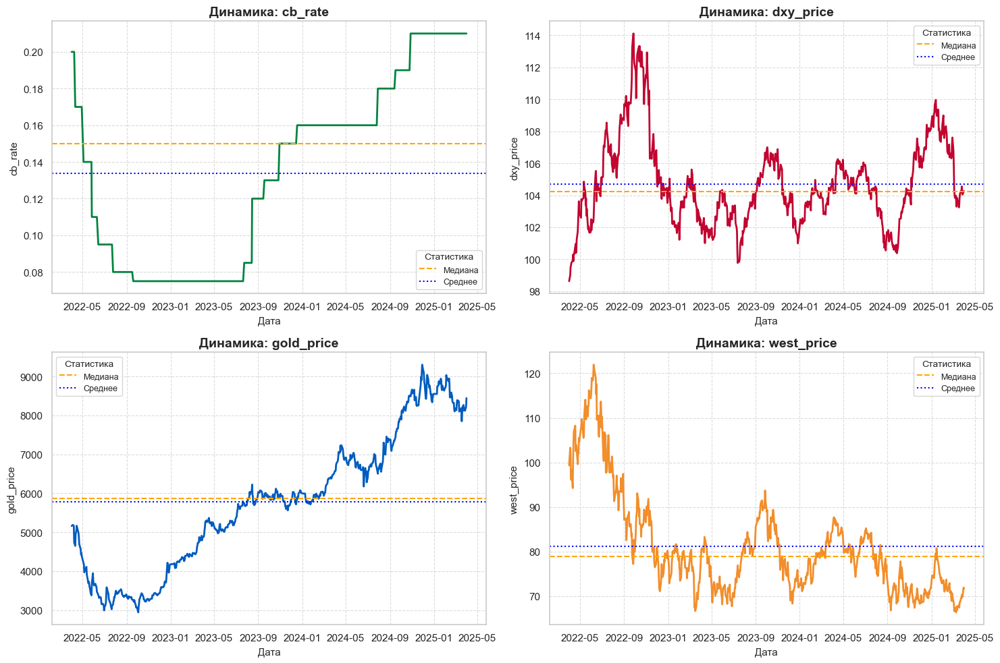

Сохранено: C:\Users\smirn\OneDrive\Рабочий стол\FQW_GSOM_PICTURES\Владимир_Смирнов_image_2.png


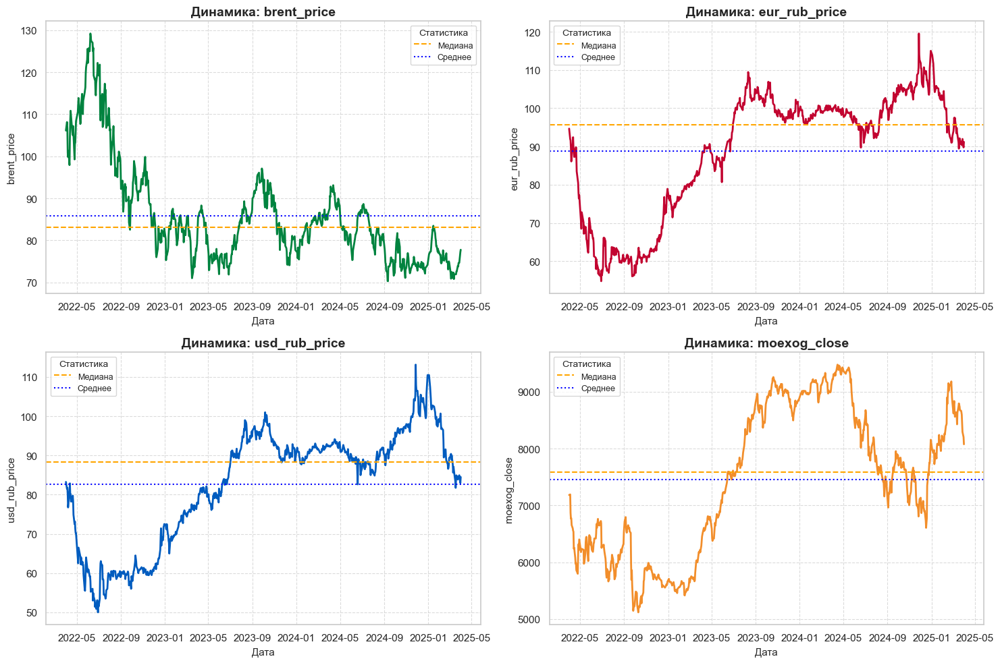

Сохранено: C:\Users\smirn\OneDrive\Рабочий стол\FQW_GSOM_PICTURES\Владимир_Смирнов_image_3.png


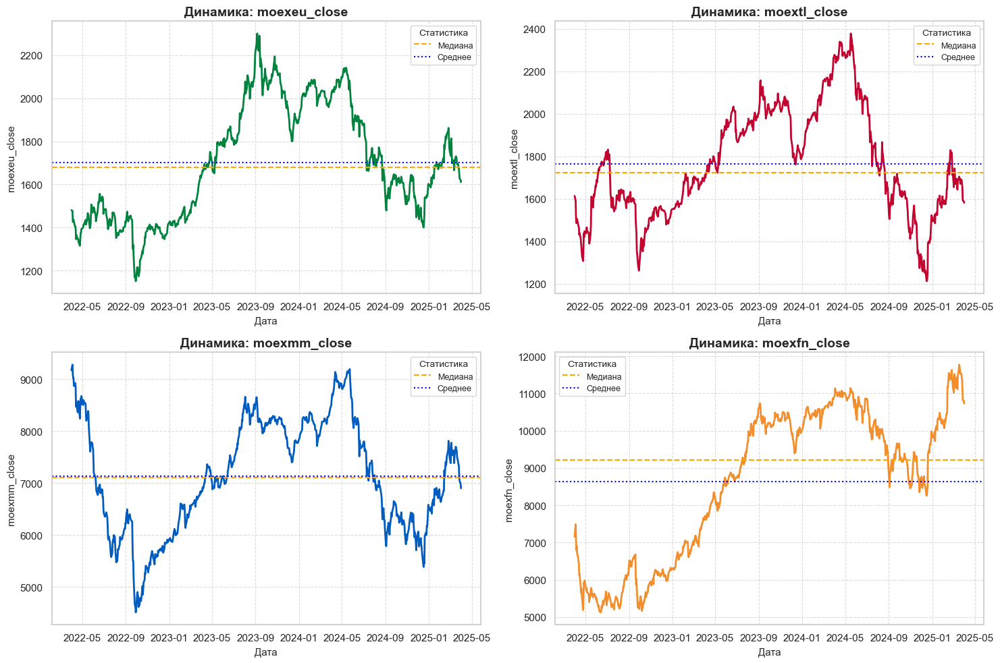

Сохранено: C:\Users\smirn\OneDrive\Рабочий стол\FQW_GSOM_PICTURES\Владимир_Смирнов_image_4.png


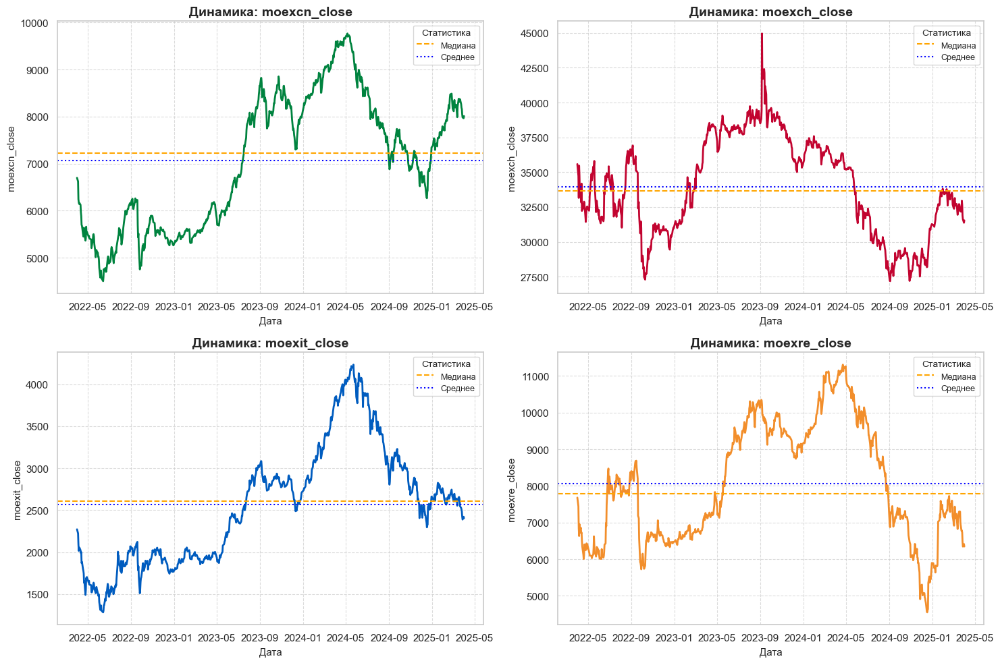

Сохранено: C:\Users\smirn\OneDrive\Рабочий стол\FQW_GSOM_PICTURES\Владимир_Смирнов_image_5.png


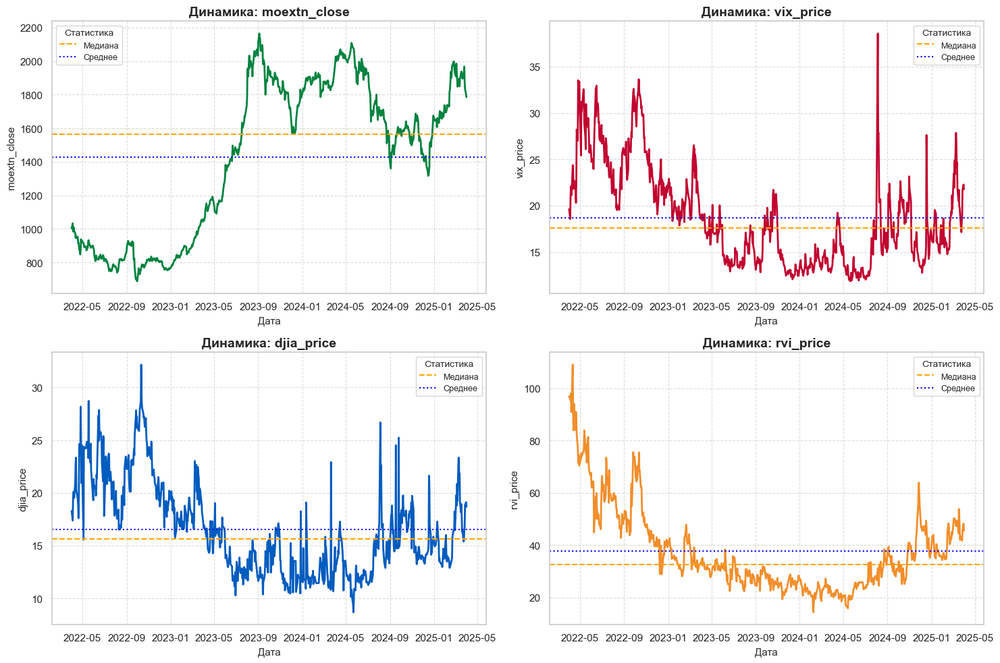

Сохранено: C:\Users\smirn\OneDrive\Рабочий стол\FQW_GSOM_PICTURES\Владимир_Смирнов_image_6.png


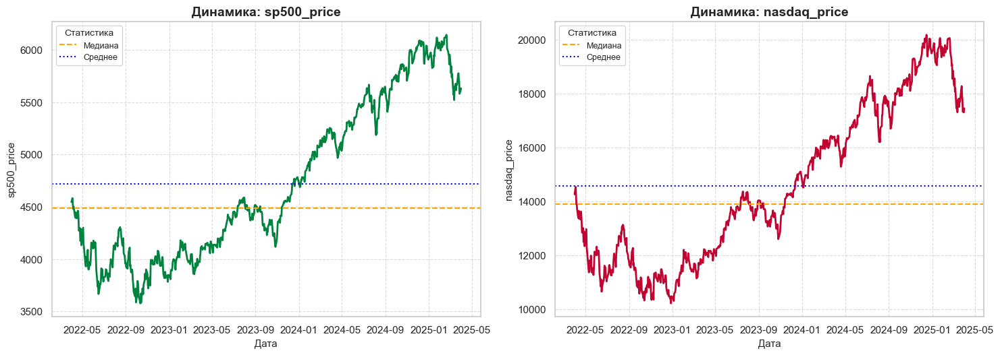

In [25]:
# Стилизация
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 5)

# Цветовая палитра
colors = ['#00833f', '#c20430', '#005cbf', '#f28e2b', '#76b7b2', '#e15759',
          '#59a14f', '#edc948', '#af7aa1', '#ff9da7', '#9c755f', '#bab0ab']

# Создание директории
os.makedirs(path_to_save_images, exist_ok=True)

# Признаки, которые нужно исключить
exclude_columns = {'year', 'month', 'day', 'week', 'weekday', 'season', 'quarter', 'holiday_name', 'y', 'ds'}
features_to_plot = [col for col in df.columns if col not in exclude_columns]

# Временная ось
time = df['ds'] if 'ds' in df.columns else range(len(df))

# Параметры разбиения
plots_per_fig = 4
n_figs = (len(features_to_plot) + plots_per_fig - 1) // plots_per_fig

# Построение и сохранение графиков
for fig_index in range(n_figs):
    start_idx = fig_index * plots_per_fig
    end_idx = min(start_idx + plots_per_fig, len(features_to_plot))
    cols_in_fig = features_to_plot[start_idx:end_idx]

    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))
    axes = axes.flatten()

    for i, col in enumerate(cols_in_fig):
        ax = axes[i]
        sns.lineplot(x=time, y=df[col], color=colors[i % len(colors)], linewidth=2.0, ax=ax)
        ax.axhline(df[col].median(), color='orange', linestyle='--', label='Медиана')
        ax.axhline(df[col].mean(), color='blue', linestyle=':', label='Среднее')
        ax.set_title(f"Динамика: {col}", fontsize=14, fontweight='bold')
        ax.set_xlabel("Дата" if 'ds' in df.columns else "Индекс времени", fontsize=11)
        ax.set_ylabel(col, fontsize=11)
        ax.grid(True, linestyle='--', alpha=0.7, linewidth=0.8)
        ax.legend(title="Статистика", fontsize=9, title_fontsize=10)

    # Удаление лишних подграфиков
    for j in range(len(cols_in_fig), 4):
        fig.delaxes(axes[j])

    fig.tight_layout()

    # Сохраняем график перед отображением
    save_path = os.path.join(path_to_save_images, f"{image_name_prefix}_image_{fig_index+1}.png")
    fig.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Сохранено: {save_path}")  # подтверждение сохранения

    plt.show()

#### Статистики

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 762 entries, 0 to 761
Data columns (total 24 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   cb_rate        762 non-null    float64       
 1   dxy_price      756 non-null    float64       
 2   gold_price     751 non-null    float64       
 3   west_price     727 non-null    float64       
 4   brent_price    738 non-null    float64       
 5   eur_rub_price  759 non-null    float64       
 6   usd_rub_price  759 non-null    float64       
 7   moexog_close   762 non-null    float64       
 8   moexeu_close   762 non-null    float64       
 9   moextl_close   762 non-null    float64       
 10  moexmm_close   762 non-null    float64       
 11  moexfn_close   762 non-null    float64       
 12  moexcn_close   762 non-null    float64       
 13  moexch_close   762 non-null    float64       
 14  moexit_close   762 non-null    float64       
 15  moexre_close   762 non-

In [28]:
df.describe(include='all').drop(columns=['ds', 'year', 'month', 'day', 'week', 'weekday', 'quarter', 'season', 'holiday_name'], errors='ignore')

,cb_rate,dxy_price,gold_price,west_price,brent_price,eur_rub_price,usd_rub_price,moexog_close,moexeu_close,moextl_close,moexmm_close,moexfn_close,moexcn_close,moexch_close,moexit_close,moexre_close,moextn_close,vix_price,djia_price,rvi_price,sp500_price,nasdaq_price,y
count,762.000,756.000,751.000,727.000,738.000,759.000,759.000,762.000,762.000,762.000,762.000,762.000,762.000,762.000,762.000,762.000,762.000,758.000,731.000,755.000,731.000,731.000,762.000
mean,0.134,104.683,5785.866,81.075,85.832,88.813,82.575,7460.606,1702.012,1765.968,7128.347,8633.264,7066.414,33932.414,2568.060,8068.257,1428.560,18.721,16.530,37.665,4721.865,14558.220,2751.176
min,0.075,98.630,2942.060,66.310,70.310,54.816,50.000,5117.120,1151.100,1212.170,4509.190,5124.620,4499.870,27180.130,1282.870,4551.120,688.270,11.860,8.670,14.230,3577.030,10213.290,1916.970
25%,0.075,102.898,4355.415,72.805,76.990,76.865,71.460,6236.995,1454.970,1575.730,6251.010,6595.620,5627.500,31133.020,1935.355,6703.797,896.288,14.242,13.000,25.900,4090.395,11989.490,2354.423
50%,0.150,104.250,5861.900,78.860,83.135,95.748,88.395,7586.075,1679.885,1721.915,7106.765,9221.360,7222.040,33669.370,2607.445,7794.035,1565.595,17.580,15.660,32.620,4487.460,13888.820,2773.700
75%,0.170,106.150,6900.355,85.480,90.100,100.450,92.471,8728.038,1954.770,1977.967,8134.290,10337.475,8247.470,36918.298,2985.840,9482.725,1868.297,21.810,19.240,44.905,5435.435,17187.755,3154.765
max,0.210,114.110,9303.760,121.940,129.200,119.527,113.145,9477.010,2300.080,2378.450,9278.810,11770.390,9767.550,44955.570,4231.850,11307.930,2164.980,38.570,32.150,109.110,6144.150,20173.890,3501.890
std,0.050,2.689,1728.215,11.268,11.972,15.967,14.332,1291.359,265.982,256.288,1080.152,1982.992,1396.767,3503.118,705.037,1616.383,462.432,5.249,4.361,16.026,747.499,2871.347,428.679


### Работа с пропусками

In [30]:
df.isna().sum()

cb_rate           0
dxy_price         6
gold_price       11
west_price       35
brent_price      24
eur_rub_price     3
usd_rub_price     3
moexog_close      0
moexeu_close      0
moextl_close      0
moexmm_close      0
moexfn_close      0
moexcn_close      0
moexch_close      0
moexit_close      0
moexre_close      0
moextn_close      0
vix_price         4
djia_price       31
rvi_price         7
sp500_price      31
nasdaq_price     31
y                 0
ds                0
dtype: int64

#### Полиномиальная интерполяция 2-го порядка для заполнения пропусков

In [32]:
# Колонки с пропусками, которые нужно интерполировать
columns_to_interpolate = [
    'dxy_price', 'gold_price', 'west_price', 'brent_price', 
    'eur_rub_price', 'usd_rub_price', 'vix_price', 'djia_price', 
    'rvi_price', 'sp500_price', 'nasdaq_price'
]

# Интерполяция
for col in columns_to_interpolate:
    df[col] = df[col].interpolate(method='polynomial', order=2, limit_direction='both')

In [33]:
df.isna().sum()

cb_rate          0
dxy_price        0
gold_price       0
west_price       0
brent_price      0
eur_rub_price    0
usd_rub_price    0
moexog_close     0
moexeu_close     0
moextl_close     0
moexmm_close     0
moexfn_close     0
moexcn_close     0
moexch_close     0
moexit_close     0
moexre_close     0
moextn_close     0
vix_price        0
djia_price       0
rvi_price        0
sp500_price      0
nasdaq_price     0
y                0
ds               0
dtype: int64

### Работа с датами

#### Праздники
https://www.cbr.ru/eng/other/holidays/#y2025

Добавляем вручную, так как неудовлетворен готовым решением в `holidays`

In [36]:
manual_holidays = {
    # 2022
    "2022-01-01": "New_Year_Holidays",
    "2022-01-02": "New_Year_Holidays",
    "2022-01-03": "New_Year_Holidays",
    "2022-01-04": "New_Year_Holidays",
    "2022-01-05": "New_Year_Holidays",
    "2022-01-06": "New_Year_Holidays",
    "2022-01-08": "New_Year_Holidays",
    "2022-01-07": "Christmas_Day",
    "2022-02-23": "Defender_of_the_Fatherland_Day",
    "2022-03-08": "International_Womens_Day",
    "2022-05-01": "Spring_and_Labour_Holiday",
    "2022-05-02": "Holiday",
    "2022-05-09": "Victory_Day",
    "2022-06-12": "Day_of_Russia",
    "2022-06-13": "Holiday",
    "2022-11-04": "National_Unity_Day",
    "2022-03-07": "Additional_Holiday",
    "2022-05-03": "Additional_Holiday",
    "2022-05-10": "Additional_Holiday",

    # 2023
    "2023-01-01": "New_Year_Holidays",
    "2023-01-02": "New_Year_Holidays",
    "2023-01-03": "New_Year_Holidays",
    "2023-01-04": "New_Year_Holidays",
    "2023-01-05": "New_Year_Holidays",
    "2023-01-06": "New_Year_Holidays",
    "2023-01-08": "New_Year_Holidays",
    "2023-01-07": "Christmas_Day",
    "2023-02-23": "Defender_of_the_Fatherland_Day",
    "2023-03-08": "International_Womens_Day",
    "2023-05-01": "Spring_and_Labour_Holiday",
    "2023-05-09": "Victory_Day",
    "2023-06-12": "Day_of_Russia",
    "2023-11-04": "National_Unity_Day",
    "2023-02-24": "Additional_Holiday",
    "2023-05-08": "Additional_Holiday",
    "2023-11-06": "Additional_Holiday",

    # 2024
    "2024-01-01": "New_Year_Holidays",
    "2024-01-02": "New_Year_Holidays",
    "2024-01-03": "New_Year_Holidays",
    "2024-01-04": "New_Year_Holidays",
    "2024-01-05": "New_Year_Holidays",
    "2024-01-06": "New_Year_Holidays",
    "2024-01-08": "New_Year_Holidays",
    "2024-01-07": "Christmas_Day",
    "2024-02-23": "Defender_of_the_Fatherland_Day",
    "2024-03-08": "International_Womens_Day",
    "2024-05-01": "Spring_and_Labour_Holiday",
    "2024-05-09": "Victory_Day",
    "2024-06-12": "Day_of_Russia",
    "2024-11-04": "National_Unity_Day",
    "2024-04-29": "Additional_Holiday",
    "2024-04-30": "Additional_Holiday",
    "2024-05-10": "Additional_Holiday",
    "2024-12-30": "Additional_Holiday",
    "2024-12-31": "Additional_Holiday",

    # 2025
    "2025-01-01": "New_Year_Holidays",
    "2025-01-02": "New_Year_Holidays",
    "2025-01-03": "New_Year_Holidays",
    "2025-01-04": "New_Year_Holidays",
    "2025-01-05": "New_Year_Holidays",
    "2025-01-06": "New_Year_Holidays",
    "2025-01-08": "New_Year_Holidays",
    "2025-01-07": "Christmas_Day",
    "2025-02-23": "Defender_of_the_Fatherland_Day",
    "2025-03-08": "International_Womens_Day",
    "2025-05-01": "Spring_and_Labour_Holiday",
    "2025-05-09": "Victory_Day",
    "2025-06-12": "Day_of_Russia",
    "2025-11-04": "National_Unity_Day",
    "2025-05-02": "Additional_Holiday",
    "2025-05-08": "Additional_Holiday",
    "2025-06-13": "Additional_Holiday",
    "2025-11-03": "Additional_Holiday",
    "2025-12-31": "Additional_Holiday"
}

In [37]:
def create_time_features(df, date_col='ds'):

    # Преобразование в datetime
    df[date_col] = pd.to_datetime(df[date_col], errors='coerce')
    df = df[df[date_col].notna()]

    # Основные компоненты даты
    df['month'] = df[date_col].dt.month
    df['day'] = df[date_col].dt.day
    df['week'] = df[date_col].dt.isocalendar().week.astype(int)
    df['weekday'] = df[date_col].dt.dayofweek
    df['dayofyear'] = df[date_col].dt.dayofyear

    # Сезон и квартал
    df['season'] = df['month'].map({12: 'Winter', 1: 'Winter', 2: 'Winter',
                                    3: 'Spring', 4: 'Spring', 5: 'Spring',
                                    6: 'Summer', 7: 'Summer', 8: 'Summer',
                                    9: 'Autumn', 10: 'Autumn', 11: 'Autumn'})
    df['quarter'] = ((df['month'] - 1) // 3 + 1).astype(int)

    # Ручные праздники
    df['holiday_name'] = df[date_col].dt.strftime('%Y-%m-%d').map(manual_holidays).fillna("No_Holiday")
    df['is_holiday'] = (df['holiday_name'] != 'No_Holiday').astype(int)
    df['is_holiday_int'] = df['is_holiday']

    # Булевы признаки начала/конца периода
    df['is_month_start'] = df[date_col].dt.is_month_start
    df['is_month_end'] = df[date_col].dt.is_month_end
    df['is_quarter_start'] = df[date_col].dt.is_quarter_start
    df['is_quarter_end'] = df[date_col].dt.is_quarter_end

    # Циклические признаки
    df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
    df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)
    df['weekday_sin'] = np.sin(2 * np.pi * df['weekday'] / 7)
    df['weekday_cos'] = np.cos(2 * np.pi * df['weekday'] / 7)
    df['dayofyear_sin'] = np.sin(2 * np.pi * df['dayofyear'] / 365)
    df['dayofyear_cos'] = np.cos(2 * np.pi * df['dayofyear'] / 365)

    # Положение в неделе и месяце
    df['is_friday'] = (df['weekday'] == 4).astype(int)
    df['is_monday'] = (df['weekday'] == 0).astype(int)
    df['weekday_group'] = df['weekday'].map({0: 'Start', 1: 'Start', 2: 'Mid', 3: 'Mid',
                                             4: 'End', 5: 'Weekend', 6: 'Weekend'})
    df['week_of_month'] = df[date_col].apply(lambda d: (d.day - 1) // 7 + 1)

    # Относительное положение
    df['days_since_start'] = (df[date_col] - df[date_col].min()).dt.days

    # Расстояния до ближайших праздников
    holiday_dates = sorted([pd.to_datetime(d) for d in manual_holidays.keys()])

    def days_until_next_holiday(date):
        pos = bisect_left(holiday_dates, date)
        return (holiday_dates[pos] - date).days if pos < len(holiday_dates) else np.nan

    def days_since_previous_holiday(date):
        pos = bisect_left(holiday_dates, date)
        return (date - holiday_dates[pos - 1]).days if pos > 0 else np.nan

    df['days_until_holiday'] = df[date_col].apply(lambda x: days_until_next_holiday(x.normalize()))
    df['days_since_holiday'] = df[date_col].apply(lambda x: days_since_previous_holiday(x.normalize()))

    # Флаг длинных выходных
    df['is_long_weekend'] = df['is_holiday_int'].rolling(window=3, center=True, min_periods=1).sum() >= 2
    df['is_long_weekend'] = df['is_long_weekend'].astype(int)

    # Новые флаги: до / после длинных выходных
    df['is_day_before_long_weekend'] = df['is_long_weekend'].shift(-1).fillna(0).astype(int)
    df['is_day_after_long_weekend'] = df['is_long_weekend'].shift(1).fillna(0).astype(int)

    # Флаги до/после праздников (1–3–7–14 дней)
    for offset in [1, 2, 3, 7, 14]:
        df[f'before_holiday_{offset}d'] = df[date_col].shift(-offset).dt.strftime('%Y-%m-%d').map(manual_holidays).notna().astype(int)
        df[f'after_holiday_{offset}d'] = df[date_col].shift(offset).dt.strftime('%Y-%m-%d').map(manual_holidays).notna().astype(int)

    return df

In [38]:
df = create_time_features(df, date_col='ds')

# Преобразование всех булевых столбцов в int
bool_cols = df.select_dtypes(include='bool').columns
df[bool_cols] = df[bool_cols].astype(int)

df.head()

,cb_rate,dxy_price,gold_price,west_price,brent_price,eur_rub_price,usd_rub_price,moexog_close,moexeu_close,moextl_close,moexmm_close,moexfn_close,moexcn_close,moexch_close,moexit_close,moexre_close,moextn_close,vix_price,djia_price,rvi_price,sp500_price,nasdaq_price,y,ds,month,day,week,weekday,dayofyear,season,quarter,holiday_name,is_holiday,is_holiday_int,is_month_start,is_month_end,is_quarter_start,is_quarter_end,month_sin,month_cos,weekday_sin,weekday_cos,dayofyear_sin,dayofyear_cos,is_friday,is_monday,weekday_group,week_of_month,days_since_start,days_until_holiday,days_since_holiday,is_long_weekend,is_day_before_long_weekend,is_day_after_long_weekend,before_holiday_1d,after_holiday_1d,before_holiday_2d,after_holiday_2d,before_holiday_3d,after_holiday_3d,before_holiday_7d,after_holiday_7d,before_holiday_14d,after_holiday_14d
0,0.200,98.630,5159.820,99.320,106.130,94.677,83.250,7182.950,1480.360,1613.620,9171.270,7160.390,6698.790,35582.710,2271.470,7681.430,1003.180,19.630,18.270,97.030,4545.860,14261.500,2759.640,2022-04-01,4,1,13,4,91,Spring,2,No_Holiday,0,0,1,0,1,0,0.866,-0.500,-0.434,-0.901,1.000,0.004,1,0,End,1,0,30,24,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0.200,99.000,5185.800,103.290,108.150,91.920,81.495,7192.490,1477.140,1589.390,9278.810,7487.570,6622.470,34738.470,2223.420,7441.640,1033.290,18.570,17.380,95.910,4582.640,14532.550,2787.690,2022-04-04,4,4,14,0,94,Spring,2,No_Holiday,0,0,0,0,0,0,0.866,-0.500,0.000,1.000,0.999,-0.047,0,1,Start,1,3,27,27,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0.200,99.470,5185.420,101.980,106.600,91.611,81.750,6865.910,1426.090,1509.070,9095.940,7062.270,6241.010,33156.480,2095.040,6845.510,984.290,21.030,19.620,95.520,4525.120,14204.170,2662.790,2022-04-05,4,5,14,1,95,Spring,2,No_Holiday,0,0,0,0,0,0,0.866,-0.500,0.782,0.623,0.998,-0.065,0,0,Start,1,4,26,28,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0.200,99.600,5172.870,96.390,100.810,89.500,80.000,6766.870,1427.670,1485.620,9023.810,6788.570,6177.800,35470.780,2015.430,6634.590,991.440,22.100,20.100,98.000,4481.150,13888.820,2611.430,2022-04-06,4,6,14,2,96,Spring,2,No_Holiday,0,0,0,0,0,0,0.866,-0.500,0.975,-0.223,0.997,-0.082,0,0,Mid,1,5,25,29,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0.200,99.750,5162.480,96.050,99.830,86.106,76.750,6774.050,1436.500,1493.930,9024.140,6902.900,6143.590,34764.850,2051.020,6954.560,1007.510,21.550,20.040,91.000,4500.210,13897.300,2635.390,2022-04-07,4,7,14,3,97,Spring,2,No_Holiday,0,0,0,0,0,0,0.866,-0.500,0.434,-0.901,0.995,-0.099,0,0,Mid,1,6,24,30,0,0,0,0,0,0,0,0,0,0,0,0,0


In [39]:
df['week'].unique()

array([13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
       30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46,
       47, 48, 49, 50, 51, 52,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11,
       12])

### Описание для добавленных признаков из дат

| Признак                      | Тип       | Описание                                                                              |
| ---------------------------- | --------- | ------------------------------------------------------------------------------------- |
| `month`                      | int       | Месяц года (1–12)                                                                     |
| `day`                        | int       | День месяца (1–31)                                                                    |
| `week`                       | int       | Номер недели в году по ISO (1–53)                                                     |
| `weekday`                    | int       | День недели (0 – понедельник, 6 – воскресенье)                                        |
| `dayofyear`                  | int       | День года (1–365/366)                                                                 |
| `season`                     | category  | Сезон года: Winter, Spring, Summer, Autumn                                            |
| `quarter`                    | int       | Квартал года (1–4)                                                                    |
| `holiday_name`               | category  | Название праздника, если дата является праздничной, иначе `No_Holiday`                |
| `is_holiday`                 | int       | Флаг: 1, если дата - праздничный день, иначе 0                                        |
| `is_holiday_int`             | int       | Дублирующий бинарный флаг `is_holiday` для rolling-операций                           |
| `is_long_weekend`            | int       | Флаг: 1, если дата входит в длинные выходные (≥2 праздника в 3-дневном окне), иначе 0 |
| `is_day_before_long_weekend` | int       | Флаг: 1, если следующий день - начало длинных выходных                                |
| `is_day_after_long_weekend`  | int       | Флаг: 1, если предыдущий день был в длинных выходных                                  |
| `before_holiday_1d`          | int       | Флаг: 1, есл- через 1 день - праздник                                                 |
| `before_holiday_2d`          | int       | Флаг: 1, е-ли через 2 дня - праздник                                                  |
| `before_holiday_3d`          | int       | Флаг: 1, -сли через 3 дня - праздник                                                  |
| `before_holiday_7d`          | int       | Флаг: 1, -сли через 7 дней - праздник                                                 |
| `before_holiday_14d`         | int       | Флаг: 1, -сли через 14 дней - праздник                                                |
| `after_holiday_1d`           | int       | Флаг: 1, если 1 день назад был праздник                                               |
| `after_holiday_2d`           | int       | Флаг: 1, если 2 дня назад был праздник                                                |
| `after_holiday_3d`           | int       | Флаг: 1, если 3 дня назад был праздник                                                |
| `after_holiday_7d`           | int       | Флаг: 1, если 7 дней назад был праздник                                               |
| `after_holiday_14d`          | int       | Флаг: 1, если 14 дней назад был праздник                                              |
| `is_month_start`             - bool      | Флаг: дата - первый день месяца                                                       |
| `is_month_end`              -| bool      | Флаг: дата - последний день месяца                                                    |
| `is_quarter_start`         - | bool      | Флаг: дата - начало квартала                                                          |
| `is_quarter_end`          -  | bool      | Флаг: дата - конец квартала                                                           |
| `month_sin`                  | float     | Циклическое синус-преобразование месяца                                               |
| `month_cos`                  | float     | Циклическое косинус-преобразование месяца                                             |
| `weekday_sin`                | float     | Циклическое синус-преобразование дня недели                                           |
| `weekday_cos`                | float     | Циклическое косинус-преобразование дня недели                                         |
| `dayofyear_sin`              | float     | Циклическое синус-преобразование дня года                                             |
| `dayofyear_cos`              | float     | Циклическое косинус-преобразование дня года                                           |
| `is_friday`                - | int       | Флаг: 1, если дата - пятница                                                          |
| `is_monday`               -  | int       | Флаг: 1, если дата - понедельник                                                      |
| `weekday_group`              | category  | Категория дня недели: Start (пн–вт), Mid (ср–чт), End (пт), Weekend (сб–вс)           |
| `week_of_month`              | int       | Номер недели внутри месяца (1–5)                                                      |
| `days_since_start`           | int       | Количество дней с начала доступной выборки                                            |
| `days_until_holiday`         | int/float | Количество дней до ближайшего праздника (NaN - если впереди нет праздников)           |
| `days_since_holiday`         | int/float | Количество дней с последнего праздника (NaN - сли праздников не было ранее)          |


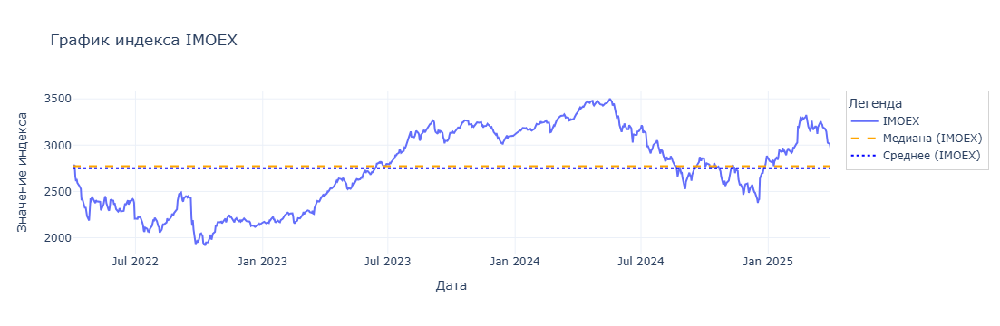

In [42]:
plotly_single_feature_IMOEX(df, column='y', title='График индекса IMOEX', save=False)

# Feature Engeneering для численных признаков

### Декомпозиции

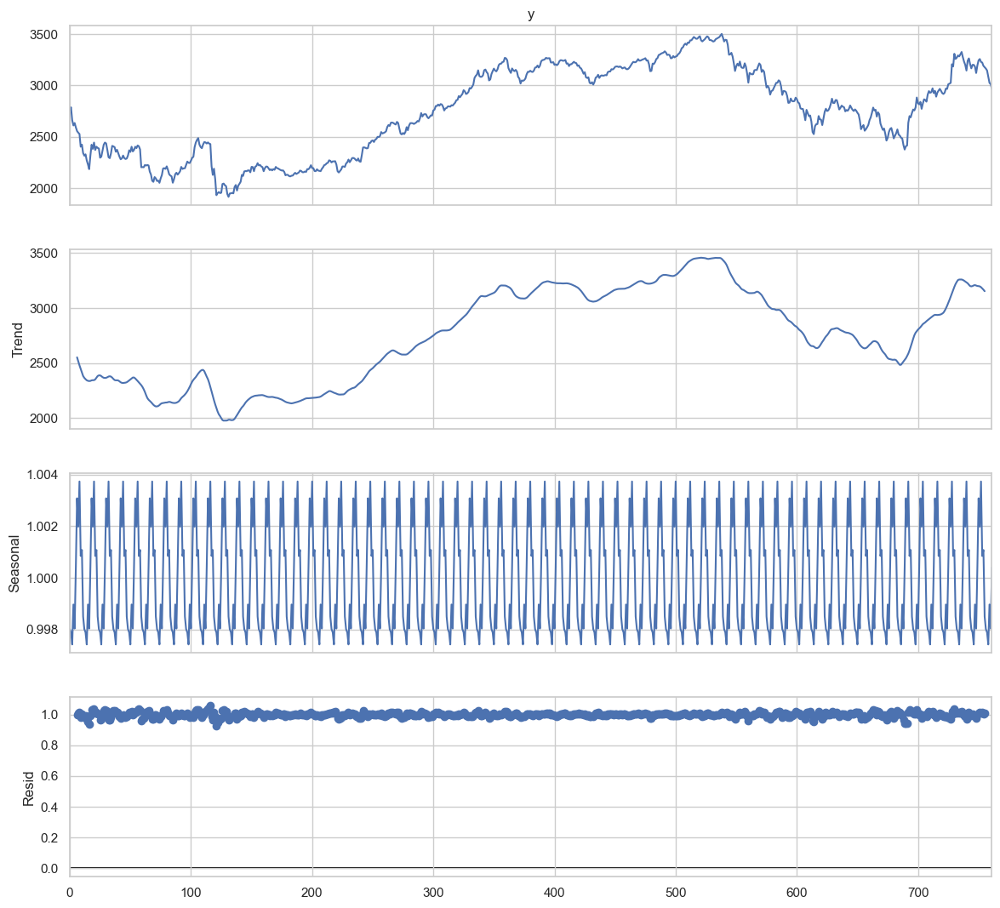

In [45]:
airline_mult = seasonal_decompose(df['y'],
                                  model='multiplicative',
                                  filt=None,
                                  period=12,
                                  two_sided=True,
                                  extrapolate_trend=0)

fig = airline_mult.plot();
fig.set_size_inches((12,12))

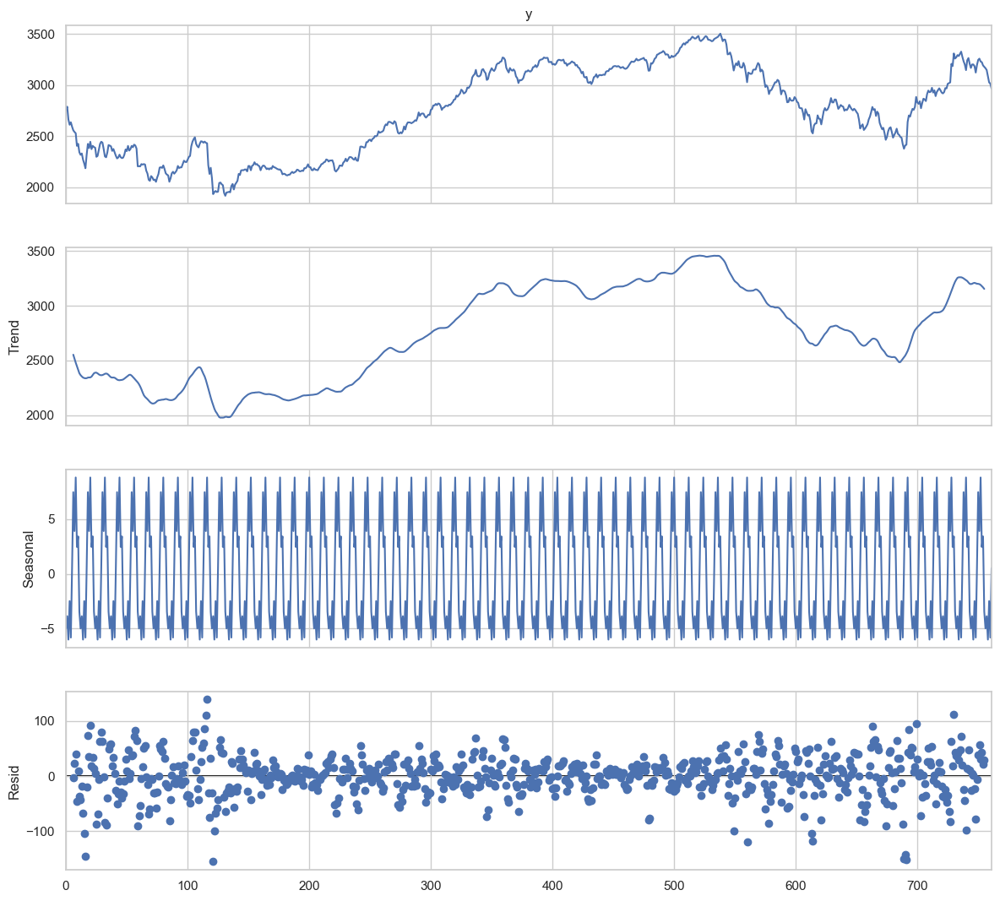

In [46]:
airline_add = seasonal_decompose(df['y'],
                                 model='additive',
                                 filt=None,
                                 period=12,
                                 two_sided=True,
                                 extrapolate_trend=0)

fig = airline_add.plot();
fig.set_size_inches((12,12))

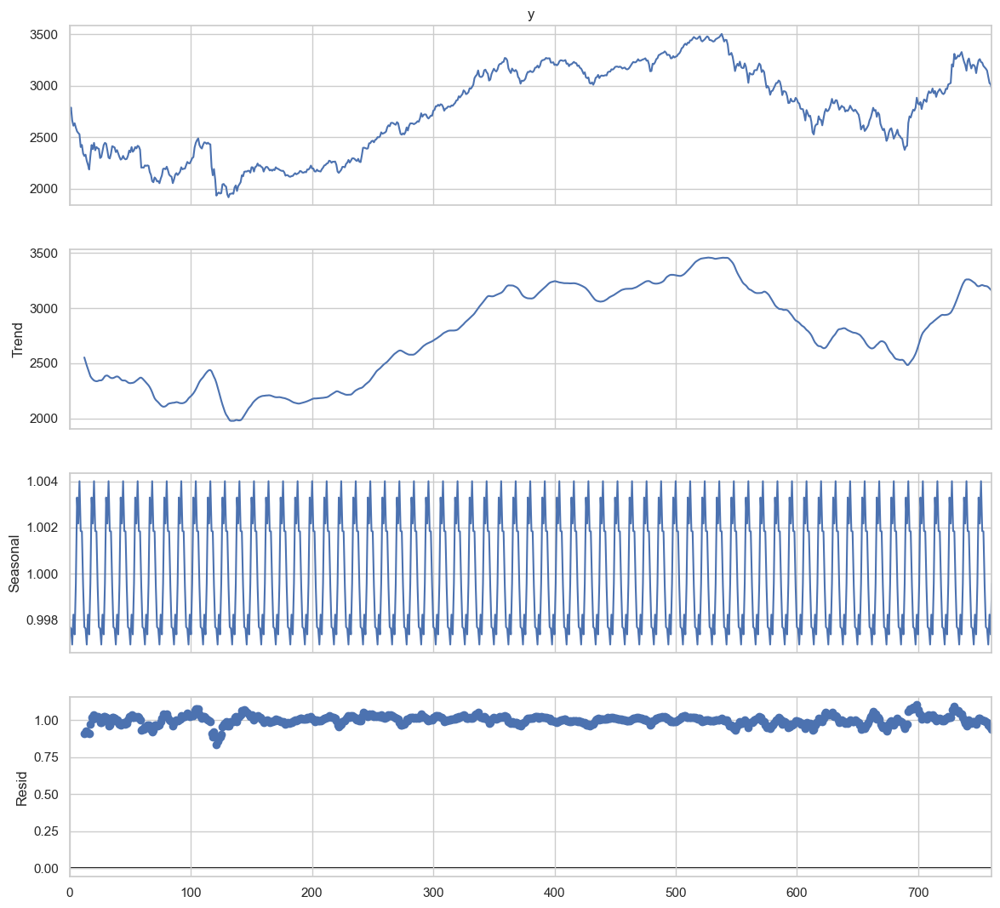

In [47]:
airline_mult_left = seasonal_decompose(df['y'],
                                       model='multiplicative',
                                       filt=None,
                                       period=12,
                                       two_sided=False,
                                       extrapolate_trend=0)

fig = airline_mult_left.plot();
fig.set_size_inches((12,12))

In [49]:
airline_stl_decomp = STL(df['y'], period=12, seasonal_deg=1)
airline_stl_decomp.config

{'period': 12,
 'seasonal': 7,
 'seasonal_deg': 1,
 'seasonal_jump': 1,
 'trend': 23,
 'trend_deg': 1,
 'trend_jump': 1,
 'low_pass': 13,
 'low_pass_deg': 1,
 'low_pass_jump': 1,
 'robust': False}

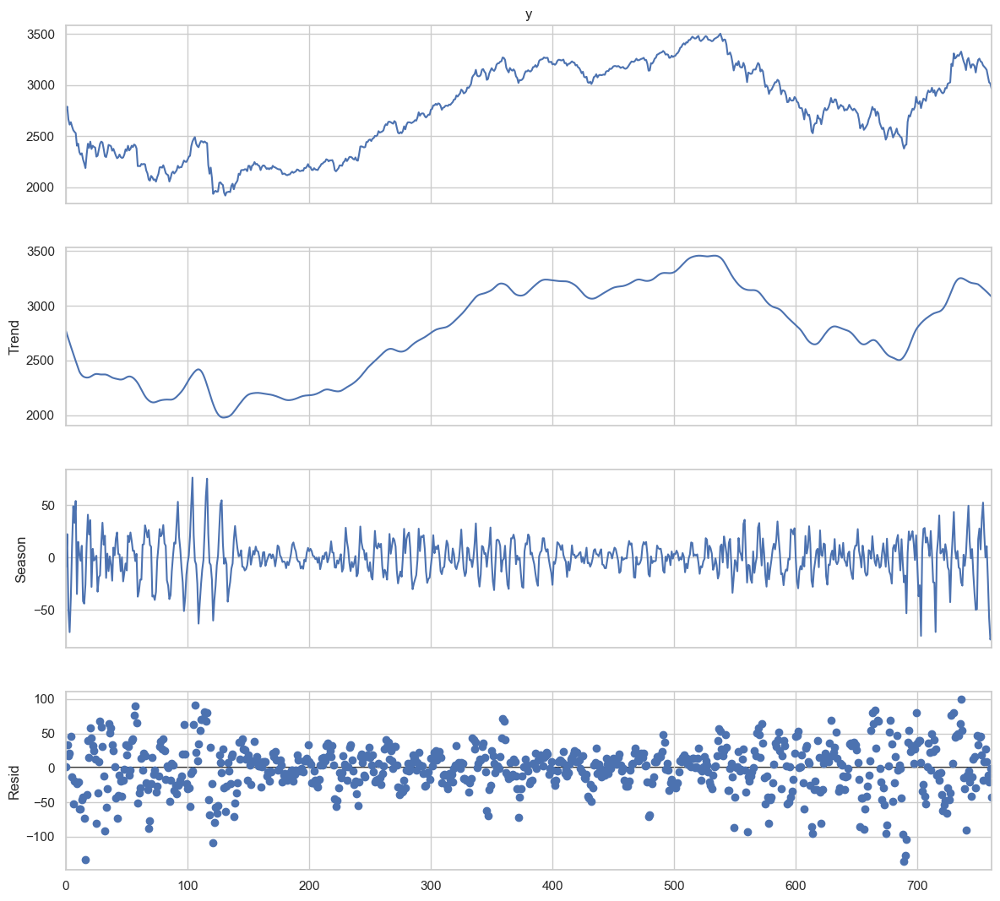

In [50]:
airline_stl_decomp = airline_stl_decomp.fit()
fig = airline_stl_decomp.plot();
fig.set_size_inches((12,12))

<Axes: >

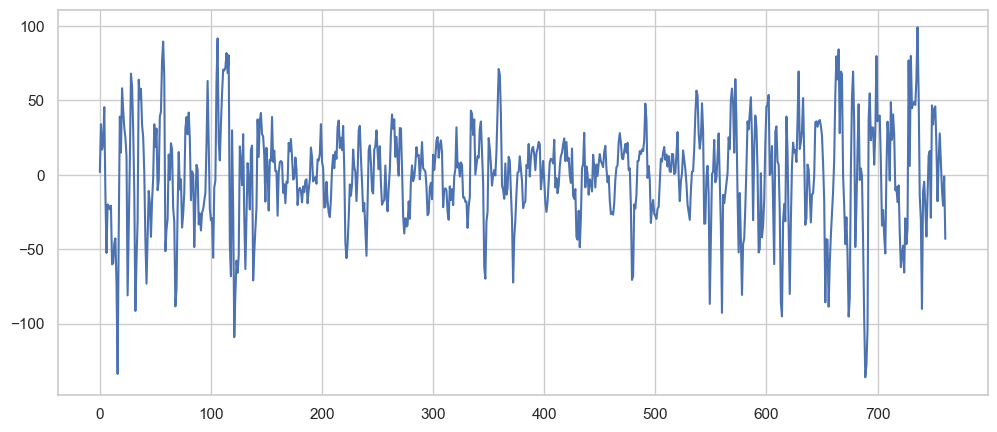

In [51]:
airline_stl_decomp.resid.plot()

## Проверки на стационарность

In [52]:
# Настройки для ACF/PACF графиков
acf_pacf_style = {
    'lines.linewidth': 4,
    'lines.solid_capstyle': 'butt',
    'axes.labelsize': 'large',
    'axes.axisbelow': True,
    'axes.grid': True,
    'axes.linewidth': 3.0,
    'axes.titlesize': 'x-large',
    'grid.linestyle': '-',
    'grid.linewidth': 1.0,
    'xtick.major.size': 0,
    'xtick.minor.size': 0,
    'ytick.major.size': 0,
    'ytick.minor.size': 0,
    'figure.subplot.left': 0.08,
    'figure.subplot.right': 0.95,
    'figure.subplot.bottom': 0.07,
    'figure.figsize': (15, 12),  # переопределяется при вызове
    'figure.autolayout': True,
    'figure.dpi': 300,
    'font.size': 24.0
}

# Функция для построения ACF и PACF
def plot_acf_pacf(series, lags=40, figsize=(15, 12), title_prefix=""):
    """
    Рисует ACF и PACF графики с локальными параметрами оформления.
    """
    with plt.rc_context(acf_pacf_style):
        fig, ax = plt.subplots(2, 1, figsize=figsize)
        
        tsaplots.plot_acf(series.dropna(), ax=ax[0], lags=lags)
        ax[0].set_title(f"{title_prefix} ACF")
        ax[0].set_ylim(-1.05, 1.05)

        tsaplots.plot_pacf(series.dropna(), ax=ax[1], lags=lags)
        ax[1].set_title(f"{title_prefix} PACF")
        ax[1].set_ylim(-1.05, 1.05)

        plt.show()

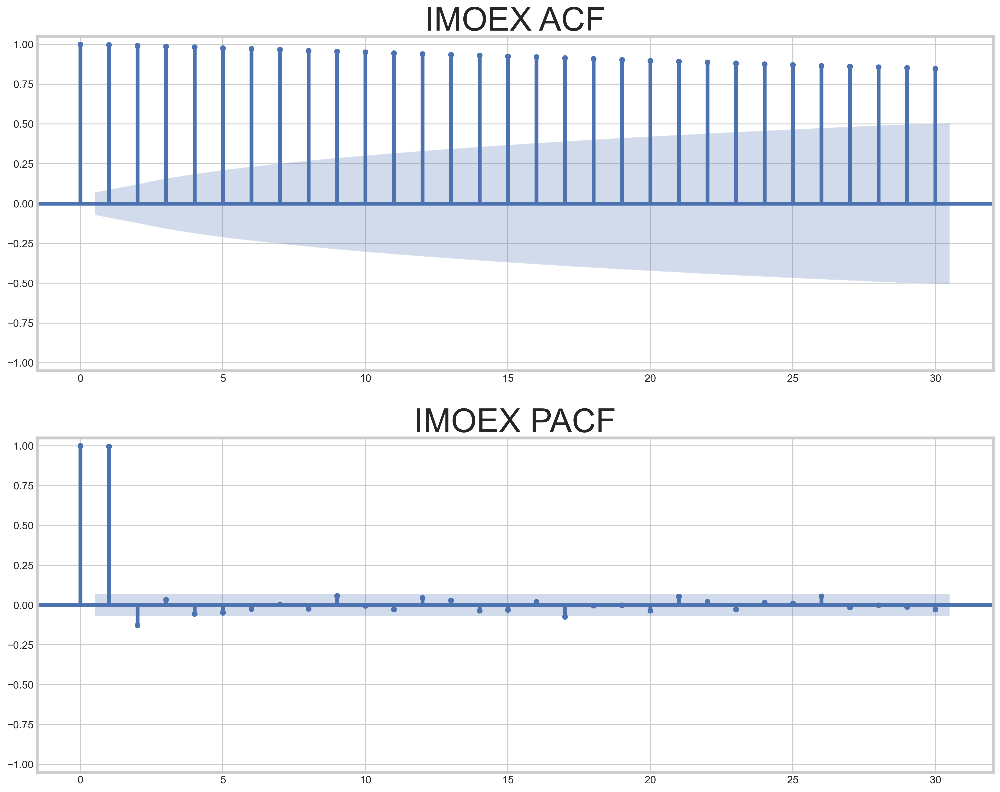

In [53]:
# Построить ACF/PACF
plot_acf_pacf(df['y'], lags=30, title_prefix="IMOEX")

#### Ряд нестационарен

In [55]:
adf_test(df.y) # Дики-Фуллера, тестирует наличие единичного корня
print()
print('-------------------------------------------------------------------------')
print()
kpss_test(df.y, regression='c') # проверяет тренд - тренд-стационарность, то есть, наличие или отсутствие тренда

ADF Test (Augmented Dickey-Fuller)
H0: Временной ряд нестационарен (есть единичный корень)
H1: Временной ряд стационарен

Test Statistic                 -1.271
p-value                         0.643
# Lags Used                     1.000
Number of Observations Used   760.000
Critical Value (1%)            -3.439
Critical Value (5%)            -2.865
Critical Value (10%)           -2.569
dtype: float64

Интерпретация:
p-value = 0.6425 ≥ 0.05 => Не отклоняем H0: ряд считается нестационарным.

-------------------------------------------------------------------------

KPSS Test (regression='c')
H0: Временной ряд тренд-стационарен
H1: Временной ряд тренд-нестационарен

Test Statistic           2.448
p-value                  0.010
Lags Used               17.000
Critical Value (10%)     0.347
Critical Value (5%)      0.463
Critical Value (2.5%)    0.574
Critical Value (1%)      0.739
dtype: float64

Интерпретация:
p-value = 0.0100 < 0.05 => Отклоняем H0: ряд считается тренд-нестационарным.


C:\Users\smirn\AppData\Local\Temp\ipykernel_34256\2433858563.py:34: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




#### Вывод: ряд нестационарен и тренд-нестационарен

#### Дифференцируем

In [58]:
# Вычисление первого дифференцирования
df['y_diff'] = df['y'].diff()

# Удаление строк с NaN после дифференцирования
df = df.dropna(subset=['y_diff'])

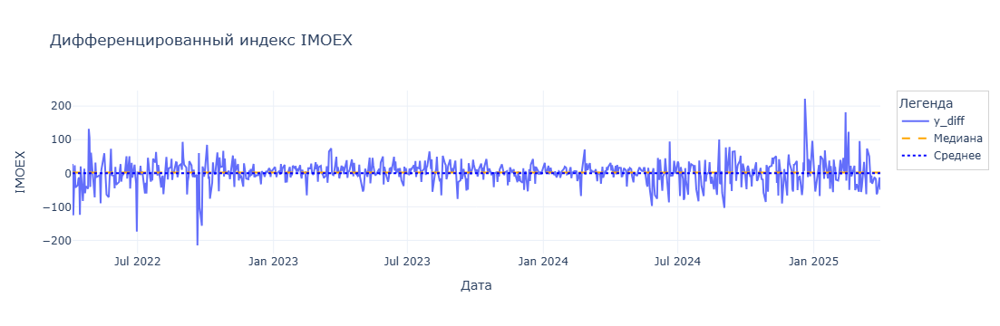

In [59]:
plotly_single_feature(df, column='y_diff', title='Дифференцированный индекс IMOEX', yaxis_title='IMOEX')

In [60]:
adf_test(df.y_diff) # Дики-Фуллера, тестирует наличие единичного корня
print()
print('-------------------------------------------------------------------------')
print()
kpss_test(df.y_diff, regression='c') # проверяет тренд - тренд-стационарность, то есть, наличие или отсутствие тренда

ADF Test (Augmented Dickey-Fuller)
H0: Временной ряд нестационарен (есть единичный корень)
H1: Временной ряд стационарен

Test Statistic                -24.398
p-value                         0.000
# Lags Used                     0.000
Number of Observations Used   760.000
Critical Value (1%)            -3.439
Critical Value (5%)            -2.865
Critical Value (10%)           -2.569
dtype: float64

Интерпретация:
p-value = 0.0000 < 0.05 => Отклоняем H0: ряд считается стационарным.

-------------------------------------------------------------------------

KPSS Test (regression='c')
H0: Временной ряд тренд-стационарен
H1: Временной ряд тренд-нестационарен

Test Statistic          0.131
p-value                 0.100
Lags Used               6.000
Critical Value (10%)    0.347
Critical Value (5%)     0.463
Critical Value (2.5%)   0.574
Critical Value (1%)     0.739
dtype: float64

Интерпретация:
p-value = 0.1000 ≥ 0.05 => Не отклоняем H0: ряд считается тренд-стационарным.


C:\Users\smirn\AppData\Local\Temp\ipykernel_34256\2433858563.py:34: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




#### Кажется, все получилось!
Есть совсем незначительные пробития без особо выраженной сезонности

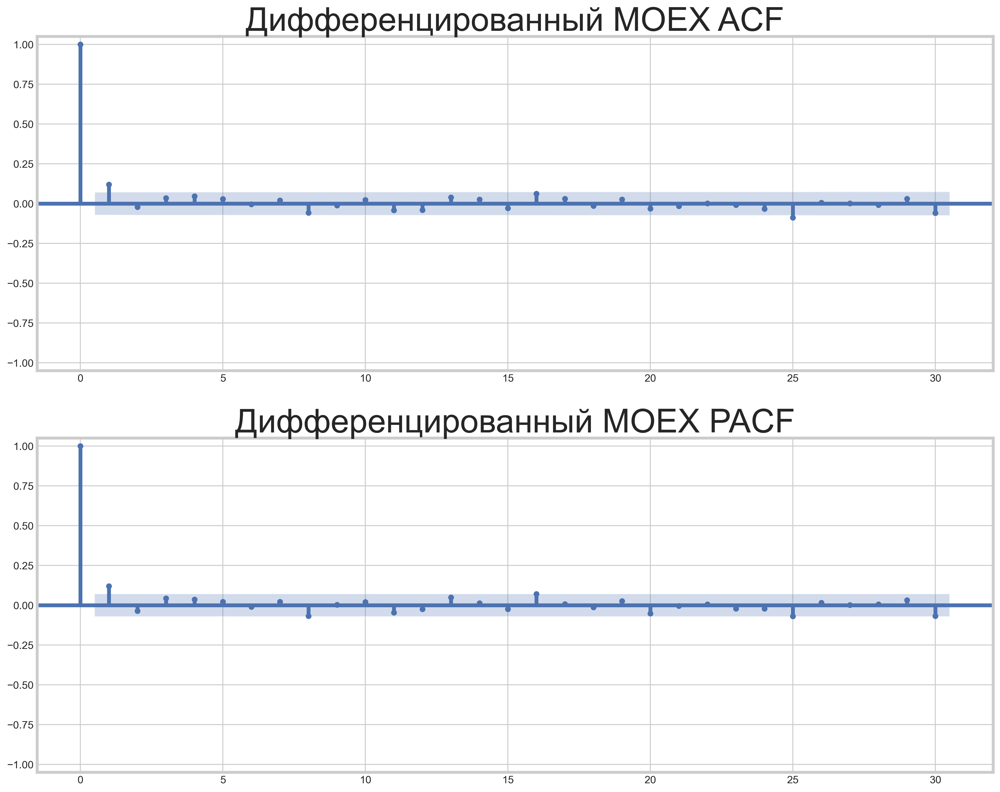

In [62]:
# Построить ACF/PACF
plot_acf_pacf(df['y_diff'], lags=30, title_prefix="Дифференцированный MOEX")

### Параметры модели ARIMAX/SARIMAX (на основе ACF/PACF и анализа сезонности)

| Параметр | Значение | Обоснование |
|----------|----------|-------------|
| p        | 1        | Первый лаг PACF значим => признак AR(1) |
| d        | 1        | Используется 1-е дифференцирование для стационарности |
| q        | 1        | Первый лаг ACF значим => признак MA(1) |
| P        | 0 или 1  | Возможна слабая сезонная автокорреляция по PACF |
| D        | 0 или 1  | Зависит от сезонности ряда, можно протестировать |
| Q        | 0 или 1  | Возможна сезонная MA-компонента по ACF |
| s        | 8        | Предполагаемый сезонный цикл длиной 8 шагов |

**Итог:**  
Рассматриваемая модель: SARIMAX(1, 1, 1) * (0/1, 0/1, 0/1, 5)

**Что попробуем дальше:**
- Начать с модели SARIMAX(1, 1, 1)*(1, 0, 1, 5) или ARIMAX(1, 1, 1)

### Полиномы, логарифмы

In [65]:
df.columns

Index(['cb_rate', 'dxy_price', 'gold_price', 'west_price', 'brent_price',
       'eur_rub_price', 'usd_rub_price', 'moexog_close', 'moexeu_close',
       'moextl_close', 'moexmm_close', 'moexfn_close', 'moexcn_close',
       'moexch_close', 'moexit_close', 'moexre_close', 'moextn_close',
       'vix_price', 'djia_price', 'rvi_price', 'sp500_price', 'nasdaq_price',
       'y', 'ds', 'month', 'day', 'week', 'weekday', 'dayofyear', 'season',
       'quarter', 'holiday_name', 'is_holiday', 'is_holiday_int',
       'is_month_start', 'is_month_end', 'is_quarter_start', 'is_quarter_end',
       'month_sin', 'month_cos', 'weekday_sin', 'weekday_cos', 'dayofyear_sin',
       'dayofyear_cos', 'is_friday', 'is_monday', 'weekday_group',
       'week_of_month', 'days_since_start', 'days_until_holiday',
       'days_since_holiday', 'is_long_weekend', 'is_day_before_long_weekend',
       'is_day_after_long_weekend', 'before_holiday_1d', 'after_holiday_1d',
       'before_holiday_2d', 'after_holiday_2

In [66]:
def add_nonlinear_variations(df, columns):
    """
    Добавляет логарифмы, квадраты и кубы для указанных признаков.

    Параметры:
    - df: DataFrame
    - columns: список названий столбцов, к которым применяются преобразования

    Преобразования:
    - log: log1p(abs(x)) - безопасно для отрицательных и нулей
    - squared: x^2
    - cubed: x^3

    Возвращает:
    - DataFrame с новыми признаками
    """
    df = df.copy()

    for col in columns:
        df[f'{col}_log'] = np.log1p(np.abs(df[col]))
        df[f'{col}_squared'] = df[col] ** 2
        df[f'{col}_cubed'] = df[col] ** 3

    return df

In [67]:
# Явно указываем нужные признаки
nonlinear_cols = [
    'dxy_price', 'gold_price', 'west_price', 'brent_price',
    'eur_rub_price', 'usd_rub_price', 'moexog_close', 'moexeu_close',
    'moextl_close', 'moexmm_close', 'moexfn_close', 'moexcn_close',
    'moexch_close', 'moexit_close', 'moexre_close', 'moextn_close',
    'vix_price', 'djia_price', 'rvi_price', 'sp500_price', 'nasdaq_price'
]

# Применяем нелинейные преобразования
df = add_nonlinear_variations(df, nonlinear_cols)

### Лаги - не беру

### Скользящие окна

#### Нелинейность для лагов и окон - решил не перегружать

In [71]:
# def add_nonlinear_variations_lags_features(df: pd.DataFrame, columns: list, suffixes: list = None) -> pd.DataFrame:
#     """
#     Добавляет логарифмы, квадраты и кубы для указанных признаков.
#     Работает без фрагментации DataFrame - через batch concat.
#     """
#     df = df.copy()
#     new_features = {}

#     if suffixes:
#         target_cols = [
#             col for col in df.columns
#             if any(col.startswith(base) and suffix in col for base in columns for suffix in suffixes)
#         ]
#     else:
#         target_cols = columns

#     for col in target_cols:
#         new_features[f'{col}_log'] = np.log1p(np.abs(df[col]))
#         new_features[f'{col}_squared'] = df[col] ** 2
#         new_features[f'{col}_cubed'] = df[col] ** 3

#     # объединяем всё разом, чтобы избежать фрагментации
#     df = pd.concat([df, pd.DataFrame(new_features, index=df.index)], axis=1)
#     return df

In [72]:
# nonlinear_cols = [
#     'dxy_price', 'gold_price', 'west_price', 'brent_price',
#     'eur_rub_price', 'usd_rub_price', 'moexog_close', 'moexeu_close',
#     'moextl_close', 'moexmm_close', 'moexfn_close', 'moexcn_close',
#     'moexch_close', 'moexit_close', 'moexre_close', 'moextn_close',
#     'vix_price', 'djia_price', 'rvi_price', 'sp500_price', 'nasdaq_price'
# ]

# # Применяем к лагам и скользящим окнам
# df = add_nonlinear_variations_lags_features(df, columns=nonlinear_cols, suffixes=['_lag_', '_roll'])

#### Дифференцирование других временных меток - в ходе работы отказался от данной идеи

In [75]:
# def is_nonstationary(series, alpha=0.05):
#     """
#     Возвращает True, если хотя бы один из тестов говорит, что ряд нестационарен.
#     ADF: H0 - ряд нестационарен (есть единичный корень)
#     KPSS: H0 - ряд тренд-стационарен
#     """
#     try:
#         s = series.dropna()
#         adf_p = adfuller(s, autolag='AIC')[1]
#         kpss_p = kpss(s, regression='c', nlags='auto')[1]
        
#         adf_status = 'нестационарен' if adf_p >= alpha else 'стационарен'
#         kpss_status = 'нестационарен' if kpss_p < alpha else 'стационарен'
        
#         print(f"  ADF p-value: {adf_p:.4f} -> {adf_status}")
#         print(f"  KPSS p-value: {kpss_p:.4f} -> {kpss_status}")
        
#         return adf_p >= alpha or kpss_p < alpha
#     except Exception as e:
#         print(f"  Не удалось протестировать ряд '{series.name}': {e}")
#         return False

# def apply_conditional_diff(df, columns, alpha=0.05):
#     """
#     Добавляет *_diff к нестационарным признакам по ADF или KPSS.
#     Удаляет строки с NaN из новых признаков.
#     """
#     for col in columns:
#         print(f"\nПроверка стационарности для: {col}")
#         if is_nonstationary(df[col], alpha):
#             df[f'{col}_diff'] = df[col].diff()
#             print(f"=> Признак {col} нестационарен - добавлен {col}_diff")
#         else:
#             print(f"=> Признак {col} стационарен - оставлен без изменений")
    
#     diff_cols = [f'{col}_diff' for col in columns if f'{col}_diff' in df.columns]
#     df = df.dropna(subset=diff_cols)
#     return df

# # Список временных признаков (исключая целевую переменную и дату)
# temporal_cols = [
#     'dxy_price', 'gold_price', 'west_price', 'brent_price',
#     'eur_rub_price', 'usd_rub_price',
#     'moexog_close', 'moexeu_close', 'moextl_close', 'moexmm_close',
#     'moexfn_close', 'moexcn_close', 'moexch_close', 'moexit_close',
#     'moexre_close', 'moextn_close',
#     'vix_price', 'djia_price', 'rvi_price',
#     'sp500_price', 'nasdaq_price'
# ]

# # Применение
# df = apply_conditional_diff(df, temporal_cols)

# def test_stationarity(series, alpha=0.05):
#     """
#     Возвращает словарь с p-value и статусами по ADF и KPSS.
#     """
#     result = {}
#     try:
#         s = series.dropna()
#         adf_p = adfuller(s, autolag='AIC')[1]
#         kpss_p = kpss(s, regression='c', nlags='auto')[1]

#         result['adf_p'] = adf_p
#         result['adf_status'] = 'стационарен' if adf_p < alpha else 'нестационарен'
#         result['kpss_p'] = kpss_p
#         result['kpss_status'] = 'стационарен' if kpss_p >= alpha else 'нестационарен'
#     except Exception as e:
#         result['error'] = str(e)
    
#     return result

### Выполним повторную проверку

# def check_diff_features(df, suffix='_diff', alpha=0.05):
#     """
#     Проверяет все признаки с указанным суффиксом на стационарность.
#     Выводит результаты по ADF и KPSS.
#     """
#     diff_cols = [col for col in df.columns if col.endswith(suffix)]
#     print(f"Найдено признаков с '{suffix}': {len(diff_cols)}")

#     for col in diff_cols:
#         print(f"\nПроверка признака: {col}")
#         res = test_stationarity(df[col], alpha)
#         if 'error' in res:
#             print(f"  Ошибка при проверке: {res['error']}")
#         else:
#             print(f"  ADF p-value: {res['adf_p']:.4f} -> {res['adf_status']}")
#             print(f"  KPSS p-value: {res['kpss_p']:.4f} -> {res['kpss_status']}")

# check_diff_features(df)

#### Все получилось!!!

### TRAIN / TEST SPLIT. Фактически, делаем OOT выборку, так как test отделен во времени от train

In [77]:
df = df.reset_index(drop=True)

In [78]:
def split_train_test(df, train_ratio, target_col='y_diff', original_target_col='y', sort_by=None):
    """
    Делит датафрейм на обучающую и тестовую выборки.
    Сохраняет оригинальную метку отдельно и делит её на train/test.
    Исключает обе метки из признаков.

    Параметры:
    - df: исходный DataFrame
    - train_ratio: доля данных для обучения (например, 0.8)
    - target_col: имя целевой переменной для обучения (по умолчанию 'y_diff')
    - original_target_col: имя оригинальной метки (по умолчанию 'y')
    - sort_by: имя временной колонки для сортировки (например, 'ds'), если требуется

    Возвращает:
    - y_original_train, y_original_test: оригинальные значения целевой переменной
    - X_train, y_train, X_test, y_test: обучающие и тестовые признаки и метки
    """
    if sort_by:
        df = df.sort_values(by=sort_by).reset_index(drop=True)

    split_t = int(len(df) * train_ratio)

    y = df[target_col]
    y_original = df[original_target_col]

    y_train = y[:split_t]
    y_test = y[split_t:]

    y_original_train = y_original[:split_t]
    y_original_test = y_original[split_t:]

    drop_cols = set([target_col, original_target_col])
    X = df.drop(columns=drop_cols)
    X_train = X[:split_t]
    X_test = X[split_t:]

    return y_original_train, y_original_test, X_train, y_train, X_test, y_test

In [79]:
y_original_train, y_original_test, X_train, y_train, X_test, y_test = split_train_test(
    df,
    train_ratio=0.8,
    target_col='y_diff',
    original_target_col='y',
    sort_by='ds'
)

In [80]:
y_original_train

0     2787.690
1     2662.790
2     2611.430
3     2635.390
4     2592.720
        ...   
603   2772.710
604   2772.400
605   2726.810
606   2662.580
607   2763.210
Name: y, Length: 608, dtype: float64

In [81]:
y_original_test

608   2733.580
609   2701.690
610   2708.380
611   2649.960
612   2547.020
        ...   
756   3146.310
757   3083.990
758   3025.650
759   3013.360
760   2964.430
Name: y, Length: 153, dtype: float64

## Продолжим Feature Engineering

#### Target-Encoding

In [84]:
X_train

,cb_rate,dxy_price,gold_price,west_price,brent_price,eur_rub_price,usd_rub_price,moexog_close,moexeu_close,moextl_close,moexmm_close,moexfn_close,moexcn_close,moexch_close,moexit_close,moexre_close,moextn_close,vix_price,djia_price,rvi_price,sp500_price,nasdaq_price,ds,month,day,week,weekday,dayofyear,season,quarter,holiday_name,is_holiday,is_holiday_int,is_month_start,is_month_end,is_quarter_start,is_quarter_end,month_sin,month_cos,weekday_sin,weekday_cos,dayofyear_sin,dayofyear_cos,is_friday,is_monday,weekday_group,week_of_month,days_since_start,days_until_holiday,days_since_holiday,is_long_weekend,is_day_before_long_weekend,is_day_after_long_weekend,before_holiday_1d,after_holiday_1d,before_holiday_2d,after_holiday_2d,before_holiday_3d,after_holiday_3d,before_holiday_7d,after_holiday_7d,before_holiday_14d,after_holiday_14d,dxy_price_log,dxy_price_squared,dxy_price_cubed,gold_price_log,gold_price_squared,gold_price_cubed,west_price_log,west_price_squared,west_price_cubed,brent_price_log,brent_price_squared,brent_price_cubed,eur_rub_price_log,eur_rub_price_squared,eur_rub_price_cubed,usd_rub_price_log,usd_rub_price_squared,usd_rub_price_cubed,moexog_close_log,moexog_close_squared,moexog_close_cubed,moexeu_close_log,moexeu_close_squared,moexeu_close_cubed,moextl_close_log,moextl_close_squared,moextl_close_cubed,moexmm_close_log,moexmm_close_squared,moexmm_close_cubed,moexfn_close_log,moexfn_close_squared,moexfn_close_cubed,moexcn_close_log,moexcn_close_squared,moexcn_close_cubed,moexch_close_log,moexch_close_squared,moexch_close_cubed,moexit_close_log,moexit_close_squared,moexit_close_cubed,moexre_close_log,moexre_close_squared,moexre_close_cubed,moextn_close_log,moextn_close_squared,moextn_close_cubed,vix_price_log,vix_price_squared,vix_price_cubed,djia_price_log,djia_price_squared,djia_price_cubed,rvi_price_log,rvi_price_squared,rvi_price_cubed,sp500_price_log,sp500_price_squared,sp500_price_cubed,nasdaq_price_log,nasdaq_price_squared,nasdaq_price_cubed
0,0.200,99.000,5185.800,103.290,108.150,91.920,81.495,7192.490,1477.140,1589.390,9278.810,7487.570,6622.470,34738.470,2223.420,7441.640,1033.290,18.570,17.380,95.910,4582.640,14532.550,2022-04-04,4,4,14,0,94,Spring,2,No_Holiday,0,0,0,0,0,0,0.866,-0.500,0.000,1.000,0.999,-0.047,0,1,Start,1,3,27,27,0,0,0,0,0,0,0,0,0,0,0,0,0,4.605,9801.000,970299.000,8.554,26892521.640,139459238720.712,4.647,10668.824,1101982.841,4.693,11696.423,1264968.093,4.532,8449.286,776658.406,4.413,6641.435,541243.747,8.881,51731912.400,372081262618.595,7.299,2181942.580,3223034662.030,7.372,2526160.572,4015054351.690,9.136,86096315.016,798871348734.539,8.921,56063704.505,419780911939.754,8.798,43857108.901,290442387982.943,10.456,1206761297.941,41921041145681.023,7.707,4943596.496,10991691322.026,8.915,55378005.890,412103183748.283,6.941,1067688.224,1103231565.080,2.974,344.845,6403.770,2.911,302.064,5249.879,4.574,9198.728,882250.012,8.430,21000589.370,96238140868.704,9.584,211195009.502,3069202035345.556
1,0.200,99.470,5185.420,101.980,106.600,91.611,81.750,6865.910,1426.090,1509.070,9095.940,7062.270,6241.010,33156.480,2095.040,6845.510,984.290,21.030,19.620,95.520,4525.120,14204.170,2022-04-05,4,5,14,1,95,Spring,2,No_Holiday,0,0,0,0,0,0,0.866,-0.500,0.782,0.623,0.998,-0.065,0,0,Start,1,4,26,28,0,0,0,0,0,0,0,0,0,0,0,0,0,4.610,9894.281,984184.121,8.554,26888580.576,139428583492.476,4.635,10399.920,1060583.882,4.678,11363.560,1211355.496,4.528,8392.575,768852.218,4.416,6683.062,546340.359,8.834,47140720.128,323663941734.723,7.263,2033732.688,2900285849.173,7.320,2277292.265,3436593438.193,9.116,82736124.484,752562824135.357,8.863,49875657.553,352235360066.119,8.739,38950205.820,243088624025.302,10.409,1099352165.990,36450648104617.391,7.648,4389192.602,9195534068.056,8.831,46861007.160,320787493124.536,6.893,968826.804,953606535.008,3.092,442.261,9300.747,3.026,384.944,7552.609,4.570,9124.070,871531.205,8.418,20476711.014,92659574545.482,9.561,201758445.389,2865811257239.652
2,0.200,99.600,5172.870,96.3

In [85]:
(X_train.dtypes == 'object').sum()

3

In [86]:
# Категориальные признаки
cat_features = [
    'holiday_name',
    'season',
    'weekday_group'
]

# Кодировщик
cb_enc = ce.CatBoostEncoder(cols=cat_features)
cb_enc = cb_enc.fit(X_train[cat_features], y_train)

# Кодируем и присоединяем закодированные фичи
X_train = X_train.join(cb_enc.transform(X_train[cat_features]).add_suffix('_cb'))
X_test = X_test.join(cb_enc.transform(X_test[cat_features]).add_suffix('_cb'))

# Удаляем оригинальные категориальные признаки
X_train = X_train.drop(columns=cat_features)
X_test = X_test.drop(columns=cat_features)

In [87]:
X_train

,cb_rate,dxy_price,gold_price,west_price,brent_price,eur_rub_price,usd_rub_price,moexog_close,moexeu_close,moextl_close,moexmm_close,moexfn_close,moexcn_close,moexch_close,moexit_close,moexre_close,moextn_close,vix_price,djia_price,rvi_price,sp500_price,nasdaq_price,ds,month,day,week,weekday,dayofyear,quarter,is_holiday,is_holiday_int,is_month_start,is_month_end,is_quarter_start,is_quarter_end,month_sin,month_cos,weekday_sin,weekday_cos,dayofyear_sin,dayofyear_cos,is_friday,is_monday,week_of_month,days_since_start,days_until_holiday,days_since_holiday,is_long_weekend,is_day_before_long_weekend,is_day_after_long_weekend,before_holiday_1d,after_holiday_1d,before_holiday_2d,after_holiday_2d,before_holiday_3d,after_holiday_3d,before_holiday_7d,after_holiday_7d,before_holiday_14d,after_holiday_14d,dxy_price_log,dxy_price_squared,dxy_price_cubed,gold_price_log,gold_price_squared,gold_price_cubed,west_price_log,west_price_squared,west_price_cubed,brent_price_log,brent_price_squared,brent_price_cubed,eur_rub_price_log,eur_rub_price_squared,eur_rub_price_cubed,usd_rub_price_log,usd_rub_price_squared,usd_rub_price_cubed,moexog_close_log,moexog_close_squared,moexog_close_cubed,moexeu_close_log,moexeu_close_squared,moexeu_close_cubed,moextl_close_log,moextl_close_squared,moextl_close_cubed,moexmm_close_log,moexmm_close_squared,moexmm_close_cubed,moexfn_close_log,moexfn_close_squared,moexfn_close_cubed,moexcn_close_log,moexcn_close_squared,moexcn_close_cubed,moexch_close_log,moexch_close_squared,moexch_close_cubed,moexit_close_log,moexit_close_squared,moexit_close_cubed,moexre_close_log,moexre_close_squared,moexre_close_cubed,moextn_close_log,moextn_close_squared,moextn_close_cubed,vix_price_log,vix_price_squared,vix_price_cubed,djia_price_log,djia_price_squared,djia_price_cubed,rvi_price_log,rvi_price_squared,rvi_price_cubed,sp500_price_log,sp500_price_squared,sp500_price_cubed,nasdaq_price_log,nasdaq_price_squared,nasdaq_price_cubed,holiday_name_cb,season_cb,weekday_group_cb
0,0.200,99.000,5185.800,103.290,108.150,91.920,81.495,7192.490,1477.140,1589.390,9278.810,7487.570,6622.470,34738.470,2223.420,7441.640,1033.290,18.570,17.380,95.910,4582.640,14532.550,2022-04-04,4,4,14,0,94,2,0,0,0,0,0,0,0.866,-0.500,0.000,1.000,0.999,-0.047,0,1,1,3,27,27,0,0,0,0,0,0,0,0,0,0,0,0,0,4.605,9801.000,970299.000,8.554,26892521.640,139459238720.712,4.647,10668.824,1101982.841,4.693,11696.423,1264968.093,4.532,8449.286,776658.406,4.413,6641.435,541243.747,8.881,51731912.400,372081262618.595,7.299,2181942.580,3223034662.030,7.372,2526160.572,4015054351.690,9.136,86096315.016,798871348734.539,8.921,56063704.505,419780911939.754,8.798,43857108.901,290442387982.943,10.456,1206761297.941,41921041145681.023,7.707,4943596.496,10991691322.026,8.915,55378005.890,412103183748.283,6.941,1067688.224,1103231565.080,2.974,344.845,6403.770,2.911,302.064,5249.879,4.574,9198.728,882250.012,8.430,21000589.370,96238140868.704,9.584,211195009.502,3069202035345.556,-0.153,0.126,1.837
1,0.200,99.470,5185.420,101.980,106.600,91.611,81.750,6865.910,1426.090,1509.070,9095.940,7062.270,6241.010,33156.480,2095.040,6845.510,984.290,21.030,19.620,95.520,4525.120,14204.170,2022-04-05,4,5,14,1,95,2,0,0,0,0,0,0,0.866,-0.500,0.782,0.623,0.998,-0.065,0,0,1,4,26,28,0,0,0,0,0,0,0,0,0,0,0,0,0,4.610,9894.281,984184.121,8.554,26888580.576,139428583492.476,4.635,10399.920,1060583.882,4.678,11363.560,1211355.496,4.528,8392.575,768852.218,4.416,6683.062,546340.359,8.834,47140720.128,323663941734.723,7.263,2033732.688,2900285849.173,7.320,2277292.265,3436593438.193,9.116,82736124.484,752562824135.357,8.863,49875657.553,352235360066.119,8.739,38950205.820,243088624025.302,10.409,1099352165.990,36450648104617.391,7.648,4389192.602,9195534068.056,8.831,46861007.160,320787493124.536,6.893,968826.804,953606535.008,3.092,442.261,9300.747,3.026,384.944,7552.609,4.570,9124.070,871531.205,8.418,20476711.014,92659574545.482,9.561,201758445.389,2865811257239.652,-0.153,0.126,1.837
2,0.200,99.600,5172.870,96.39

### SHAP-оценка признаков

By default, TreeExplainer in the SHAP (SHapley Additive exPlanations) library uses feature_perturbation = "interventional". This choice is based on the work by Janzing et al. (2020) which addresses the misconception regarding the use of conditional expectation in SHAP values.

According to Janzing et al. 2020, the author argue

... Our arguments are phrased in terms of the causal language introduced by Pearl (2000). We argue that parts of the package SHAP from Lundberg and Lee (2017) are unaffected by this misconception (although the corresponding theory part of the paper suffers from this issue) since they ‘approximates’ the observational expectations by an expression that would have been the right one in the first place.

In their work, Janzing et al. elaborate on the flaws of using conditional expectation and emphasize the importance of interventional expectation. However, they find that the usage of TreeExplainer in the SHAP package is appropriate and aligns with the correct approach.

In summary, if you are using the TreeExplainer in the SHAP library, you can have confidence in the correctness of the SHAP values it provides, as it accounts for interventional expectations as recommended by Janzing et al.

The source code is here for your perusal.

https://stats.stackexchange.com/questions/535624/are-shap-values-potentially-misleading-when-predictors-are-highly-correlated

In [90]:
columns = list(X_train.columns.difference(['ds']))

In [91]:
model_features = columns

SHAP summary plot for IMOEX


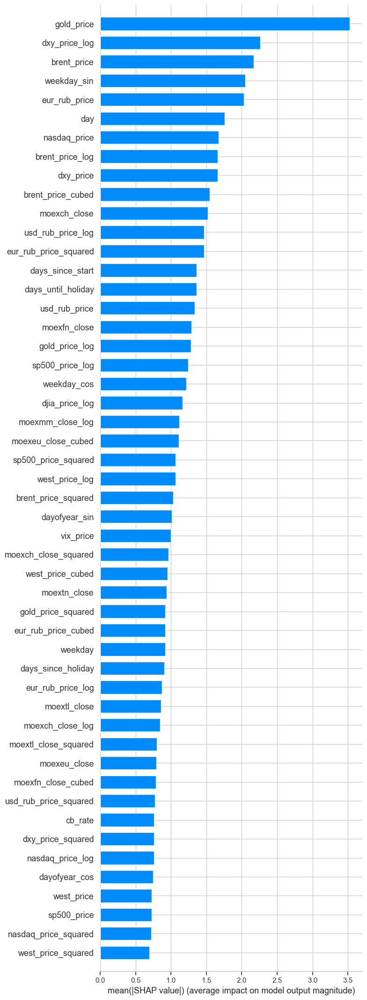

In [92]:
def calculate_shap_feature_importance(
    X_train: pd.DataFrame,
    y_train: Union[pd.Series, np.ndarray],
    X_shap: Optional[pd.DataFrame] = None,
    y_shap: Optional[Union[pd.Series, np.ndarray]] = None,
    model_params: Optional[dict] = None,
    max_display: int = 30,
    plot: bool = True,
    sample_size: int = 1000,
    target_name: Optional[str] = None,
    plot_type: str = "bar",
    cat_features: Optional[list] = None,
    sampling_strategy: str = "last",  # or "random"
    shap_mode: str = "interventional"  # or "tree_path_dependent"
) -> tuple[pd.DataFrame, np.ndarray]:
    """
    Fits a CatBoostRegressor on X_train/y_train and computes SHAP values on X_shap.
    Supports interventional mode for more accurate SHAP values on correlated time series data.
    """

    assert shap_mode in ["tree_path_dependent", "interventional"], \
        "shap_mode must be 'tree_path_dependent' or 'interventional'"

    assert isinstance(X_train, pd.DataFrame), "X_train must be a pandas DataFrame"
    assert isinstance(y_train, (pd.Series, np.ndarray)), "y_train must be Series or ndarray"
    assert X_train.shape[0] == len(y_train), "X_train and y_train must have the same number of samples"

    if model_params is None:
        model_params = {
            'iterations': 1000,
            'learning_rate': 0.1,
            'depth': 5, 
            'random_seed': 42,
            'verbose': False,
            'task_type': 'CPU'
        }

    if X_shap is None:
        X_shap = X_train.copy()
        y_shap = y_train

    if X_shap.shape[0] > sample_size:
        warnings.warn(
            f"X_shap contains {X_shap.shape[0]} rows. Sampling {sample_size} rows for SHAP.",
            UserWarning
        )
        if sampling_strategy == "last":
            X_sample = X_shap.iloc[-sample_size:].copy()
            y_sample = y_shap[-sample_size:] if isinstance(y_shap, (pd.Series, np.ndarray)) else y_shap.iloc[-sample_size:]
        elif sampling_strategy == "random":
            X_sample = X_shap.sample(n=sample_size, random_state=42)
            y_sample = y_shap[X_sample.index]
        else:
            raise ValueError(f"Unknown sampling_strategy: {sampling_strategy}")
    else:
        X_sample = X_shap.copy()
        y_sample = y_shap

    model = CatBoostRegressor(**model_params)
    model.fit(X_train, y_train, cat_features=cat_features)

    if shap_mode == "interventional":
        explainer = shap.TreeExplainer(model, data=X_train, feature_perturbation="interventional")
    else:
        explainer = shap.TreeExplainer(model, feature_perturbation="tree_path_dependent")

    shap_values = explainer.shap_values(X_sample)

    if isinstance(shap_values, list):
        if len(shap_values) > 1:
            warnings.warn("Multiple outputs detected. Using the first output.", UserWarning)
        shap_values = shap_values[0]

    assert shap_values.shape[1] == X_sample.shape[1], \
        "Mismatch between SHAP values and feature dimensions."

    if plot:
        title = f"SHAP summary plot{' for ' + target_name if target_name else ''}"
        print(title)
        shap.summary_plot(
            shap_values,
            X_sample,
            max_display=max_display,
            plot_type=plot_type if plot_type == "beeswarm" else "bar",
            show=False
        )
        plt.show()

    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    shap_df = pd.DataFrame({
        'feature': X_sample.columns,
        'mean_abs_shap': mean_abs_shap
    }).sort_values(by='mean_abs_shap', ascending=False).reset_index(drop=True)

    return shap_df, shap_values

shap_df, shap_values = calculate_shap_feature_importance(
    X_train=X_train[model_features],
    y_train=y_train,
    X_shap=X_test[model_features],
    y_shap=y_test,
    max_display=50,
    target_name='IMOEX',
    sampling_strategy='last',
    shap_mode='interventional'
)

In [93]:
shap_df[shap_df['mean_abs_shap'] > 0.5]

,feature,mean_abs_shap
0,gold_price,3.527
1,dxy_price_log,2.261
2,brent_price,2.166
3,weekday_sin,2.049
4,eur_rub_price,2.032
5,day,1.757
6,nasdaq_price,1.676
7,brent_price_log,1.661
8,dxy_price,1.657
9,brent_price_cubed,1.549


#### Отобранные признаки

In [9]:
def filter_features_by_shap_and_correlation(
    shap_df: pd.DataFrame,
    X: pd.DataFrame,
    shap_values: np.ndarray,
    threshold: float = 0.9,
    corr_threshold: float = 0.9
) -> list:
    """
    Отбирает признаки по SHAP важности и устраняет коррелированные (через кластеризацию).

    Преобразования:
    - SHAP отбор по кумулятивной важности
    - корреляционная матрица очищается от NaN (заполняется 0)
    - кластеризация по 1 - |corr|

    Возвращает:
    - List[str]: финальный список отобранных признаков
    """

    # Step 1: Top SHAP features
    shap_df_sorted = shap_df.sort_values(by='mean_abs_shap', ascending=False).reset_index(drop=True)
    total = shap_df_sorted['mean_abs_shap'].sum()
    shap_df_sorted['cumulative'] = shap_df_sorted['mean_abs_shap'].cumsum() / total

    selected = shap_df_sorted[shap_df_sorted['cumulative'] <= threshold]
    if not selected.empty and selected.shape[0] < shap_df_sorted.shape[0]:
        selected = shap_df_sorted.iloc[:selected.shape[0] + 1]

    selected_features = selected['feature'].tolist()
    X_selected = X[selected_features]

    # Step 2: Correlation clustering with safe handling
    corr_matrix = X_selected.corr().abs().fillna(0)          
    distance_matrix = 1 - corr_matrix
    distance_matrix = (distance_matrix + distance_matrix.T) / 2
    np.fill_diagonal(distance_matrix.values, 0)

    # Step 3: Convert to condensed distance matrix
    condensed = squareform(distance_matrix.values, checks=False)
    linkage_matrix = linkage(condensed, method='average')
    clusters = fcluster(linkage_matrix, t=1 - corr_threshold, criterion='distance')

    # Step 4: Retain top SHAP feature per cluster
    cluster_df = pd.DataFrame({'feature': selected_features, 'cluster': clusters})
    retained = []
    for cluster_id in cluster_df['cluster'].unique():
        cluster_features = cluster_df[cluster_df['cluster'] == cluster_id]['feature']
        top = shap_df_sorted[shap_df_sorted['feature'].isin(cluster_features)].iloc[0]['feature']
        retained.append(top)

    return retained

NameError: name 'np' is not defined

In [96]:
selected_features = filter_features_by_shap_and_pearson(
    shap_df=shap_df,
    X=X_test[model_features],
    shap_values=shap_values,
    threshold=0.95,
    corr_threshold=0.95
)
print(selected_features)

['gold_price', 'dxy_price_log', 'brent_price', 'weekday_sin', 'eur_rub_price', 'day', 'nasdaq_price', 'moexch_close', 'usd_rub_price_log', 'days_since_start', 'days_until_holiday', 'moexfn_close', 'weekday_cos', 'djia_price_log', 'moexeu_close_cubed', 'vix_price', 'weekday', 'days_since_holiday', 'moextl_close', 'cb_rate', 'dayofyear_cos', 'moexre_close', 'weekday_group_cb', 'dayofyear', 'rvi_price_squared', 'moexit_close', 'month_cos']


In [97]:
len(selected_features)

27

In [98]:
# model_features = selected_features

In [99]:
# X_train[model_features].isna().sum()

#### Данный набор признаков показал себя лучше всего

In [101]:
model_features_arima = [
    'nasdaq_price',
    'eur_rub_price',
    'brent_price',
    'gold_price',
    'day',
    'weekday_sin',
    'weekday',
    'usd_rub_price',
    'moexch_close_squared',
    'moexre_close',
    'moexeu_close_log',
    'days_since_start',
    'dxy_price',
    'weekday_cos',
    'djia_price_squared',
    'days_until_holiday',
    'weekday_group_cb',
    'moextl_close',
    'moexmm_close',
    'dayofyear_cos',
    'vix_price',
    'dayofyear',
    'days_since_holiday',
    'season_cb',
    'rvi_price'
]

# ARIMA

In [103]:
# model_arima = auto_arima(
#     y=y_original_train,
#     X=X_train[model_features_arima],
#     start_p=0, start_q=0, start_P=0, start_Q=0,
#     max_p=1, max_q=1, max_d=2,
#     # max_P=6, max_Q=6, max_D=2,
#     # seasonal=True,
#     # m=7,
#     ic='aicc',
#     stepwise=False,          
#     trace=True,
#     n_jobs=-1,                
#     suppress_warnings=True,
#     error_action='ignore'
# )
# model_arima.fit(y=y_original_train.values, X=X_train[model_features_arima].values)

In [104]:
# print()
# print('==============================================================================')
# print("Best model order (p, d, q):", model_arima.order)
# print("Best seasonal order (P, D, Q, m):", model_arima.seasonal_order)
# print('==============================================================================')
# print()
# print(model_arima.summary())

### ARIMA но с `diff = 1` - лучше!

In [106]:
# best_arima = ARIMA(endog=y_original_train.values, exog=X_train[model_features_arima].values, order=(1, 1, 0))
# best_arima =  best_arima.fit()
# best_arima.summary()

### Снова попробуем улучшить. `Финальная спецификация`.
#### Важное уточнение: оптимизация AIC/BIC не соответствует оптимизации точности прогноза! Поэтому используем перебор с оптимизацией `RMSE`!

In [108]:
# def calc_optimum_sarima_rmse(y_train, X_train, y_test, X_test,
#                                          max_p, max_P, max_q, max_Q,
#                                          d, D,
#                                          min_s=1, max_s=12):

#     if isinstance(y_train, np.ndarray):
#         y_train = pd.Series(y_train)
#     if isinstance(y_test, np.ndarray):
#         y_test = pd.Series(y_test)

#     ps = range(0, max_p + 1)
#     qs = range(0, max_q + 1)
#     Ps = range(0, max_P + 1)
#     Qs = range(0, max_Q + 1)
#     Ss = [s for s in range(min_s, max_s + 1) if s >= 1]

#     parameters = list(product(ps, qs, Ps, Qs, Ss))

#     best_rmse = float('inf')
#     best_model = None
#     best_param = None
#     results = []

#     print(f"Total combinations to check: {len(parameters)}")

#     for param in tqdm(parameters, desc="Grid search SARIMA"):
#         try:
#             p, q, P, Q, s = param
#             with warnings.catch_warnings():
#                 warnings.simplefilter("ignore")
#                 model = SARIMAX(
#                     y_train,
#                     exog=X_train,
#                     order=(p, d, q),
#                     seasonal_order=(P, D, Q, s),
#                     enforce_stationarity=False,
#                     enforce_invertibility=False
#                 ).fit(disp=False)

#             forecast = model.forecast(steps=len(y_test), exog=X_test)
#             rmse = np.sqrt(mean_squared_error(y_test, forecast))

#             results.append({'params': param, 'rmse': rmse})

#             if rmse < best_rmse:
#                 best_rmse = rmse
#                 best_model = model
#                 best_param = param

#         except Exception as e:
#             print(f"Failed for parameters {param}: {e}")
#             continue

#     print("\nBest model specification:")
#     print(f"order=({best_param[0]}, {d}, {best_param[1]}), seasonal_order=({best_param[2]}, {D}, {best_param[3]}, {best_param[4]})")
#     print(f"Best RMSE: {best_rmse:.4f}")

#     return results, best_model, best_param

# results, final_arima_model, best_param = calc_optimum_sarima_rmse(
#     y_train=y_original_train,
#     X_train=X_train[model_features_arima],
#     y_test=y_original_test,
#     X_test=X_test[model_features_arima],
#     max_p=1, 
#     max_P=1, 
#     max_q=1, 
#     max_Q=1,
#     d=1,
#     D=1,
#     min_s=14, 
#     max_s=14
# )

In [109]:
final_arima_model = SARIMAX(
    endog=y_original_train,
    exog=X_train[model_features_arima],
    order=(0, 1, 1),
    seasonal_order=(0, 1, 0, 14),
    enforce_stationarity=False,
    enforce_invertibility=False
).fit()

final_arima_model.summary()

D:\Anaconda\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  608
Model:             SARIMAX(0, 1, 1)x(0, 1, [], 14)   Log Likelihood               -2591.181
Date:                             Fri, 23 May 2025   AIC                           5236.363
Time:                                     17:24:52   BIC                           5354.672
Sample:                                          0   HQIC                          5282.449
                                             - 608                                         
Covariance Type:                               opg                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
nasdaq_price             0.0002      0.003      0.047      0.962      -0.006       0.006
eur_rub_price            1.5820      0.229      6.909      0.000       1.133       2.031
brent_price             -0.2870      0.274     -1.048      0.295      -0.824       0.250
gold_price              -0.0004      0.008     -0.056      0.956      -0.016       0.015
day                     -0.0114      0.092     -0.123      0.902      -0.192       0.169
weekday_sin              1.6613      0.039     42.274      0.000       1.584       1.738
weekday                  0.9025      0.233      3.875      0.000       0.446       1.359
usd_rub_price           -1.3284      0.172     -7.715      0.000      -1.666      -0.991
moexch_close_squared  3.785e-08   1.95e-08      1.940      0.052   -3.93e-10    7.61e-08
moexre_close             0.0293      0.004      7.378      0.000       0.021       0.037
moexeu_close_log       539.8082      0.000    1.7e+06      0.000     539.808     539.809
days_since_start        -6.1250      0.095    -64.653      0.000      -6.311      -5.939
dxy_price                1.6856      0.020     83.418      0.000       1.646       1.725
weekday_cos              6.9696      0.094     73.851      0.000       6.785       7.155
djia_price_squared       0.0346      0.008      4.396      0.000       0.019       0.050
days_until_holiday       0.0089      0.102      0.088      0.930      -0.190       0.208
weekday_group_cb        -0.5252      0.331     -1.589      0.112      -1.173       0.123
moextl_close             0.1020      0.026      3.857      0.000       0.050       0.154
moexmm_close             0.1806      0.008     23.553      0.000       0.166       0.196
dayofyear_cos          -42.5627      0.000  -8.81e+04      0.000     -42.564     -42.562
vix_price               -0.7711      0.042    -18.440      0.000      -0.853      -0.689
dayofyear               -0.0215      0.043     -0.499      0.618      -0.106       0.063
days_since_holiday      -0.0949      0.086     -1.106      0.269      -0.263       0.073
season_cb               -2.8143      0.004   -687.981      0.000      -2.822      -2.806
rvi_price               -1.0160      0.173     -5.887      0.000      -1.354      -0.678
ma.L1                    0.1226      0.036      3.399      0.001       0.052       0.193
sigma2                 373.9177      0.001   5.56e+05      0.000     373.916     373.919
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):               140.01
Prob(Q):                              0.92   Prob(JB):                         0.00
Heteroskedasticity (H):               0.47   Skew:                            -0.08
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.38
==================================


Ljung–Box test (lag=50) p-value: 0.0000


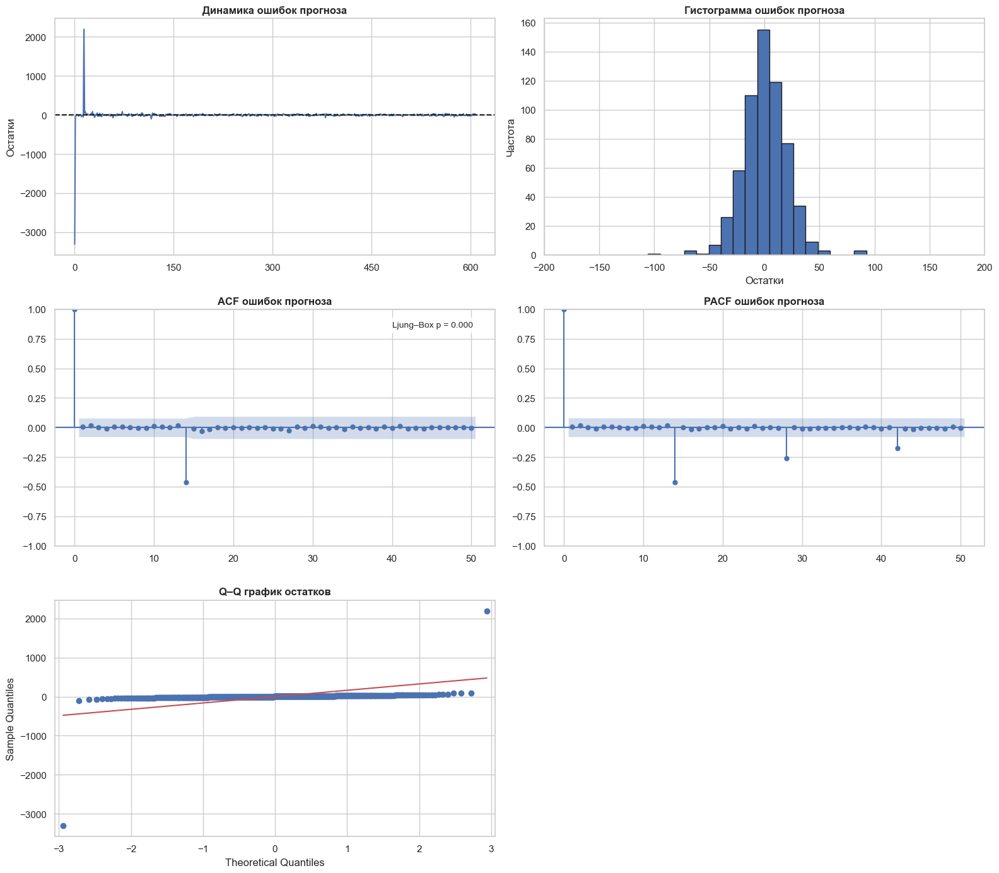

In [110]:
final_arima_model_residuals = pd.Series(final_arima_model.resid, name='resid')
df_diagnostics = pd.DataFrame({
    'date': y_train.index,
    'resid': final_arima_model_residuals.values
})

plot_diagnostics(df_diagnostics, dt_col='date', resid_col='resid', lags=50)

In [112]:
results = check_fit(final_arima_model_residuals.values)
pd.DataFrame([results]).T

,0
mean_resids,-1.618
mean_t,-0.246
mean_pval,0.806
stationary_t,-43.452
stationary_pval,0.000
norm_stat,0.092
norm_pval,0.000
autocor_pass,True
heteroscedasticity_f,5.126
heteroscedasticity_pval,0.024


#### Визуализируем предсказание

In [114]:
# Предсказание на тестовом наборе
n_test = len(X_test)
arima_forecast = final_arima_model.forecast(steps=n_test, 
                                            exog=X_test[model_features_arima].values
                                           )

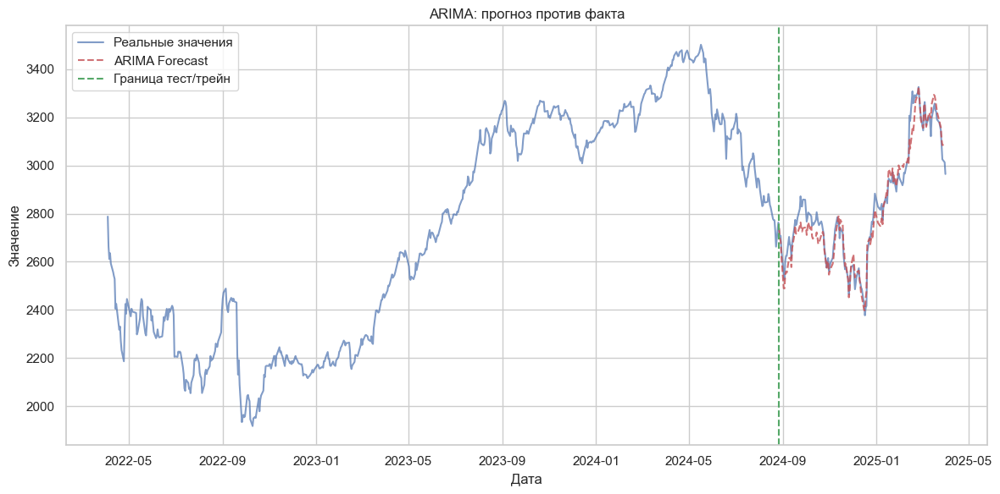

In [115]:
def plot_forecast_with_dates(y_train, y_test, forecast, df, title="Прогноз vs Истина", label="Прогноз"):
    """
    Строит график прогноза vs факта с временной осью по df['ds'].

    Параметры:
    - y_train, y_test: реальные значения (pd.Series или np.ndarray)
    - forecast: прогноз модели на тестовом интервале
    - df: DataFrame, содержащий колонку 'ds' (даты)
    - title: заголовок графика
    - label: подпись прогноза в легенде
    """

    # Даты для оси X
    dates_train = df['ds'].iloc[:len(y_train)]
    dates_test = df['ds'].iloc[len(y_train):len(y_train) + len(y_test)]

    # Объединяем в единый временной ряд
    all_dates = np.concatenate([dates_train, dates_test])
    all_actual = np.concatenate([y_train, y_test])
    all_predictions = np.concatenate([np.full(len(y_train), np.nan), forecast])

    # Построение графика
    plt.figure(figsize=(12, 6))
    plt.plot(all_dates, all_actual, 'b-', alpha=0.7, label='Реальные значения')
    plt.plot(all_dates, all_predictions, 'r--', alpha=0.8, label=label)

    # Вертикальная линия между train и test
    plt.axvline(x=dates_test.iloc[0], color='g', linestyle='--', label='Граница тест/трейн')

    plt.title(title)
    plt.xlabel('Дата')
    plt.ylabel('Значение')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


plot_forecast_with_dates(
    y_train=y_original_train.values,
    y_test=y_original_test.values,
    forecast=arima_forecast,
    df=df,
    title="ARIMA: прогноз против факта",
    label="ARIMA Forecast"
)


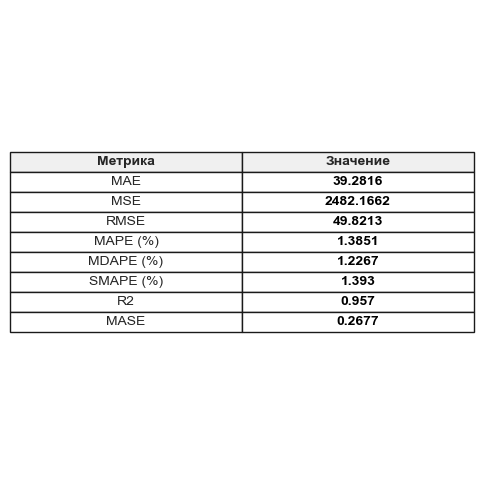

,Метрика,Значение
0,MAE,39.282
1,MSE,2482.166
2,RMSE,49.821
3,MAPE (%),1.385
4,MDAPE (%),1.227
5,SMAPE (%),1.393
6,R2,0.957
7,MASE,0.268


In [116]:
metrics_report(y_true=y_original_test, y_pred=arima_forecast, seasonality=14)

# Градиентный бустинг над решающими деревьями (CatBoost)

### Feature Engeneering для бустинга

In [119]:
df_gbdt = df

In [120]:
df_gbdt

,cb_rate,dxy_price,gold_price,west_price,brent_price,eur_rub_price,usd_rub_price,moexog_close,moexeu_close,moextl_close,moexmm_close,moexfn_close,moexcn_close,moexch_close,moexit_close,moexre_close,moextn_close,vix_price,djia_price,rvi_price,sp500_price,nasdaq_price,y,ds,month,day,week,weekday,dayofyear,season,quarter,holiday_name,is_holiday,is_holiday_int,is_month_start,is_month_end,is_quarter_start,is_quarter_end,month_sin,month_cos,weekday_sin,weekday_cos,dayofyear_sin,dayofyear_cos,is_friday,is_monday,weekday_group,week_of_month,days_since_start,days_until_holiday,days_since_holiday,is_long_weekend,is_day_before_long_weekend,is_day_after_long_weekend,before_holiday_1d,after_holiday_1d,before_holiday_2d,after_holiday_2d,before_holiday_3d,after_holiday_3d,before_holiday_7d,after_holiday_7d,before_holiday_14d,after_holiday_14d,y_diff,dxy_price_log,dxy_price_squared,dxy_price_cubed,gold_price_log,gold_price_squared,gold_price_cubed,west_price_log,west_price_squared,west_price_cubed,brent_price_log,brent_price_squared,brent_price_cubed,eur_rub_price_log,eur_rub_price_squared,eur_rub_price_cubed,usd_rub_price_log,usd_rub_price_squared,usd_rub_price_cubed,moexog_close_log,moexog_close_squared,moexog_close_cubed,moexeu_close_log,moexeu_close_squared,moexeu_close_cubed,moextl_close_log,moextl_close_squared,moextl_close_cubed,moexmm_close_log,moexmm_close_squared,moexmm_close_cubed,moexfn_close_log,moexfn_close_squared,moexfn_close_cubed,moexcn_close_log,moexcn_close_squared,moexcn_close_cubed,moexch_close_log,moexch_close_squared,moexch_close_cubed,moexit_close_log,moexit_close_squared,moexit_close_cubed,moexre_close_log,moexre_close_squared,moexre_close_cubed,moextn_close_log,moextn_close_squared,moextn_close_cubed,vix_price_log,vix_price_squared,vix_price_cubed,djia_price_log,djia_price_squared,djia_price_cubed,rvi_price_log,rvi_price_squared,rvi_price_cubed,sp500_price_log,sp500_price_squared,sp500_price_cubed,nasdaq_price_log,nasdaq_price_squared,nasdaq_price_cubed
0,0.200,99.000,5185.800,103.290,108.150,91.920,81.495,7192.490,1477.140,1589.390,9278.810,7487.570,6622.470,34738.470,2223.420,7441.640,1033.290,18.570,17.380,95.910,4582.640,14532.550,2787.690,2022-04-04,4,4,14,0,94,Spring,2,No_Holiday,0,0,0,0,0,0,0.866,-0.500,0.000,1.000,0.999,-0.047,0,1,Start,1,3,27,27,0,0,0,0,0,0,0,0,0,0,0,0,0,28.050,4.605,9801.000,970299.000,8.554,26892521.640,139459238720.712,4.647,10668.824,1101982.841,4.693,11696.423,1264968.093,4.532,8449.286,776658.406,4.413,6641.435,541243.747,8.881,51731912.400,372081262618.595,7.299,2181942.580,3223034662.030,7.372,2526160.572,4015054351.690,9.136,86096315.016,798871348734.539,8.921,56063704.505,419780911939.754,8.798,43857108.901,290442387982.943,10.456,1206761297.941,41921041145681.023,7.707,4943596.496,10991691322.026,8.915,55378005.890,412103183748.283,6.941,1067688.224,1103231565.080,2.974,344.845,6403.770,2.911,302.064,5249.879,4.574,9198.728,882250.012,8.430,21000589.370,96238140868.704,9.584,211195009.502,3069202035345.556
1,0.200,99.470,5185.420,101.980,106.600,91.611,81.750,6865.910,1426.090,1509.070,9095.940,7062.270,6241.010,33156.480,2095.040,6845.510,984.290,21.030,19.620,95.520,4525.120,14204.170,2662.790,2022-04-05,4,5,14,1,95,Spring,2,No_Holiday,0,0,0,0,0,0,0.866,-0.500,0.782,0.623,0.998,-0.065,0,0,Start,1,4,26,28,0,0,0,0,0,0,0,0,0,0,0,0,0,-124.900,4.610,9894.281,984184.121,8.554,26888580.576,139428583492.476,4.635,10399.920,1060583.882,4.678,11363.560,1211355.496,4.528,8392.575,768852.218,4.416,6683.062,546340.359,8.834,47140720.128,323663941734.723,7.263,2033732.688,2900285849.173,7.320,2277292.265,3436593438.193,9.116,82736124.484,752562824135.357,8.863,49875657.553,352235360066.119,8.739,38950205.820,243088624025.302,10.409,1099352165.990,36450648104617.391,7.648,4389192.602,9195534068.056,8.831,46861007.160,320787493124.536,6.893,968826.804,953606535.008,3.092,442.261,9300.747,3.026,384.944,7552.609,4.570,9124.070,871531.205,8.418,20476711.014,92659574545.482,9.561,201758445.389,286

In [121]:
def create_lag_features(
    df,
    columns,
    lags,
    X_test_len,
    drop_na=True,
    in_place=True
):
    """
    Добавляет лаги к нескольким признакам, безопасно и без фрагментации DataFrame.
    """
    if not in_place:
        df = df.copy()

    new_features = {}

    for col in columns:
        safe_col = df[col].copy()
        safe_col.iloc[-X_test_len:] = np.nan  # защита от утечки

        for lag in lags:
            new_col = f'{col}_lag_{lag}'
            new_features[new_col] = safe_col.shift(lag)

    lag_df = pd.DataFrame(new_features, index=df.index)
    df = pd.concat([df, lag_df], axis=1)

    if drop_na:
        df.dropna(subset=lag_df.columns, inplace=True)
        df.reset_index(drop=True, inplace=True)

    return df

In [122]:
numeric_columns = ['y']

lags = [1, 7, 14, 28]

df_gbdt = create_lag_features(
    df=df_gbdt,
    columns=numeric_columns,
    lags=lags,
    X_test_len=153,
    drop_na=False,
    in_place=False
)

In [123]:
df_gbdt

,cb_rate,dxy_price,gold_price,west_price,brent_price,eur_rub_price,usd_rub_price,moexog_close,moexeu_close,moextl_close,moexmm_close,moexfn_close,moexcn_close,moexch_close,moexit_close,moexre_close,moextn_close,vix_price,djia_price,rvi_price,sp500_price,nasdaq_price,y,ds,month,day,week,weekday,dayofyear,season,quarter,holiday_name,is_holiday,is_holiday_int,is_month_start,is_month_end,is_quarter_start,is_quarter_end,month_sin,month_cos,weekday_sin,weekday_cos,dayofyear_sin,dayofyear_cos,is_friday,is_monday,weekday_group,week_of_month,days_since_start,days_until_holiday,days_since_holiday,is_long_weekend,is_day_before_long_weekend,is_day_after_long_weekend,before_holiday_1d,after_holiday_1d,before_holiday_2d,after_holiday_2d,before_holiday_3d,after_holiday_3d,before_holiday_7d,after_holiday_7d,before_holiday_14d,after_holiday_14d,y_diff,dxy_price_log,dxy_price_squared,dxy_price_cubed,gold_price_log,gold_price_squared,gold_price_cubed,west_price_log,west_price_squared,west_price_cubed,brent_price_log,brent_price_squared,brent_price_cubed,eur_rub_price_log,eur_rub_price_squared,eur_rub_price_cubed,usd_rub_price_log,usd_rub_price_squared,usd_rub_price_cubed,moexog_close_log,moexog_close_squared,moexog_close_cubed,moexeu_close_log,moexeu_close_squared,moexeu_close_cubed,moextl_close_log,moextl_close_squared,moextl_close_cubed,moexmm_close_log,moexmm_close_squared,moexmm_close_cubed,moexfn_close_log,moexfn_close_squared,moexfn_close_cubed,moexcn_close_log,moexcn_close_squared,moexcn_close_cubed,moexch_close_log,moexch_close_squared,moexch_close_cubed,moexit_close_log,moexit_close_squared,moexit_close_cubed,moexre_close_log,moexre_close_squared,moexre_close_cubed,moextn_close_log,moextn_close_squared,moextn_close_cubed,vix_price_log,vix_price_squared,vix_price_cubed,djia_price_log,djia_price_squared,djia_price_cubed,rvi_price_log,rvi_price_squared,rvi_price_cubed,sp500_price_log,sp500_price_squared,sp500_price_cubed,nasdaq_price_log,nasdaq_price_squared,nasdaq_price_cubed,y_lag_1,y_lag_7,y_lag_14,y_lag_28
0,0.200,99.000,5185.800,103.290,108.150,91.920,81.495,7192.490,1477.140,1589.390,9278.810,7487.570,6622.470,34738.470,2223.420,7441.640,1033.290,18.570,17.380,95.910,4582.640,14532.550,2787.690,2022-04-04,4,4,14,0,94,Spring,2,No_Holiday,0,0,0,0,0,0,0.866,-0.500,0.000,1.000,0.999,-0.047,0,1,Start,1,3,27,27,0,0,0,0,0,0,0,0,0,0,0,0,0,28.050,4.605,9801.000,970299.000,8.554,26892521.640,139459238720.712,4.647,10668.824,1101982.841,4.693,11696.423,1264968.093,4.532,8449.286,776658.406,4.413,6641.435,541243.747,8.881,51731912.400,372081262618.595,7.299,2181942.580,3223034662.030,7.372,2526160.572,4015054351.690,9.136,86096315.016,798871348734.539,8.921,56063704.505,419780911939.754,8.798,43857108.901,290442387982.943,10.456,1206761297.941,41921041145681.023,7.707,4943596.496,10991691322.026,8.915,55378005.890,412103183748.283,6.941,1067688.224,1103231565.080,2.974,344.845,6403.770,2.911,302.064,5249.879,4.574,9198.728,882250.012,8.430,21000589.370,96238140868.704,9.584,211195009.502,3069202035345.556,NaN,NaN,NaN,NaN
1,0.200,99.470,5185.420,101.980,106.600,91.611,81.750,6865.910,1426.090,1509.070,9095.940,7062.270,6241.010,33156.480,2095.040,6845.510,984.290,21.030,19.620,95.520,4525.120,14204.170,2662.790,2022-04-05,4,5,14,1,95,Spring,2,No_Holiday,0,0,0,0,0,0,0.866,-0.500,0.782,0.623,0.998,-0.065,0,0,Start,1,4,26,28,0,0,0,0,0,0,0,0,0,0,0,0,0,-124.900,4.610,9894.281,984184.121,8.554,26888580.576,139428583492.476,4.635,10399.920,1060583.882,4.678,11363.560,1211355.496,4.528,8392.575,768852.218,4.416,6683.062,546340.359,8.834,47140720.128,323663941734.723,7.263,2033732.688,2900285849.173,7.320,2277292.265,3436593438.193,9.116,82736124.484,752562824135.357,8.863,49875657.553,352235360066.119,8.739,38950205.820,243088624025.302,10.409,1099352165.990,36450648104617.391,7.648,4389192.602,9195534068.056,8.831,46861007.160,320787493124.536,6.893,968826.804,953606535.008,3.092,442.261,9300.747,3.026,384.944,7552.609,4.570,9124.070,871531.205,8.418,20

#### От скольлящих окон отказался
### Сплит

In [125]:
y_original_train_gbdt, y_original_test_gbdt, X_train_gbdt, y_train_gbdt, X_test_gbdt, y_test_gbdt = split_train_test(
    df=df_gbdt,
    train_ratio=0.8,
    target_col='y_diff',
    original_target_col='y',
    sort_by='ds'
)

In [126]:
X_train_gbdt

,cb_rate,dxy_price,gold_price,west_price,brent_price,eur_rub_price,usd_rub_price,moexog_close,moexeu_close,moextl_close,moexmm_close,moexfn_close,moexcn_close,moexch_close,moexit_close,moexre_close,moextn_close,vix_price,djia_price,rvi_price,sp500_price,nasdaq_price,ds,month,day,week,weekday,dayofyear,season,quarter,holiday_name,is_holiday,is_holiday_int,is_month_start,is_month_end,is_quarter_start,is_quarter_end,month_sin,month_cos,weekday_sin,weekday_cos,dayofyear_sin,dayofyear_cos,is_friday,is_monday,weekday_group,week_of_month,days_since_start,days_until_holiday,days_since_holiday,is_long_weekend,is_day_before_long_weekend,is_day_after_long_weekend,before_holiday_1d,after_holiday_1d,before_holiday_2d,after_holiday_2d,before_holiday_3d,after_holiday_3d,before_holiday_7d,after_holiday_7d,before_holiday_14d,after_holiday_14d,dxy_price_log,dxy_price_squared,dxy_price_cubed,gold_price_log,gold_price_squared,gold_price_cubed,west_price_log,west_price_squared,west_price_cubed,brent_price_log,brent_price_squared,brent_price_cubed,eur_rub_price_log,eur_rub_price_squared,eur_rub_price_cubed,usd_rub_price_log,usd_rub_price_squared,usd_rub_price_cubed,moexog_close_log,moexog_close_squared,moexog_close_cubed,moexeu_close_log,moexeu_close_squared,moexeu_close_cubed,moextl_close_log,moextl_close_squared,moextl_close_cubed,moexmm_close_log,moexmm_close_squared,moexmm_close_cubed,moexfn_close_log,moexfn_close_squared,moexfn_close_cubed,moexcn_close_log,moexcn_close_squared,moexcn_close_cubed,moexch_close_log,moexch_close_squared,moexch_close_cubed,moexit_close_log,moexit_close_squared,moexit_close_cubed,moexre_close_log,moexre_close_squared,moexre_close_cubed,moextn_close_log,moextn_close_squared,moextn_close_cubed,vix_price_log,vix_price_squared,vix_price_cubed,djia_price_log,djia_price_squared,djia_price_cubed,rvi_price_log,rvi_price_squared,rvi_price_cubed,sp500_price_log,sp500_price_squared,sp500_price_cubed,nasdaq_price_log,nasdaq_price_squared,nasdaq_price_cubed,y_lag_1,y_lag_7,y_lag_14,y_lag_28
0,0.200,99.000,5185.800,103.290,108.150,91.920,81.495,7192.490,1477.140,1589.390,9278.810,7487.570,6622.470,34738.470,2223.420,7441.640,1033.290,18.570,17.380,95.910,4582.640,14532.550,2022-04-04,4,4,14,0,94,Spring,2,No_Holiday,0,0,0,0,0,0,0.866,-0.500,0.000,1.000,0.999,-0.047,0,1,Start,1,3,27,27,0,0,0,0,0,0,0,0,0,0,0,0,0,4.605,9801.000,970299.000,8.554,26892521.640,139459238720.712,4.647,10668.824,1101982.841,4.693,11696.423,1264968.093,4.532,8449.286,776658.406,4.413,6641.435,541243.747,8.881,51731912.400,372081262618.595,7.299,2181942.580,3223034662.030,7.372,2526160.572,4015054351.690,9.136,86096315.016,798871348734.539,8.921,56063704.505,419780911939.754,8.798,43857108.901,290442387982.943,10.456,1206761297.941,41921041145681.023,7.707,4943596.496,10991691322.026,8.915,55378005.890,412103183748.283,6.941,1067688.224,1103231565.080,2.974,344.845,6403.770,2.911,302.064,5249.879,4.574,9198.728,882250.012,8.430,21000589.370,96238140868.704,9.584,211195009.502,3069202035345.556,NaN,NaN,NaN,NaN
1,0.200,99.470,5185.420,101.980,106.600,91.611,81.750,6865.910,1426.090,1509.070,9095.940,7062.270,6241.010,33156.480,2095.040,6845.510,984.290,21.030,19.620,95.520,4525.120,14204.170,2022-04-05,4,5,14,1,95,Spring,2,No_Holiday,0,0,0,0,0,0,0.866,-0.500,0.782,0.623,0.998,-0.065,0,0,Start,1,4,26,28,0,0,0,0,0,0,0,0,0,0,0,0,0,4.610,9894.281,984184.121,8.554,26888580.576,139428583492.476,4.635,10399.920,1060583.882,4.678,11363.560,1211355.496,4.528,8392.575,768852.218,4.416,6683.062,546340.359,8.834,47140720.128,323663941734.723,7.263,2033732.688,2900285849.173,7.320,2277292.265,3436593438.193,9.116,82736124.484,752562824135.357,8.863,49875657.553,352235360066.119,8.739,38950205.820,243088624025.302,10.409,1099352165.990,36450648104617.391,7.648,4389192.602,9195534068.056,8.831,46861007.160,320787493124.536,6.893,968826.804,953606535.008,3.092,442.261,9300.747,3.026,384.944,7552.609,4.570,9124.070,871531.205,8.418,20476711.014,92659574545.482,9.561,201758445.

### Encoding

In [128]:
# Категориальные признаки
cat_features = [
    'holiday_name',
    'season',
    'weekday_group'
]

# Кодировщик
cb_enc = ce.CatBoostEncoder(cols=cat_features)
cb_enc = cb_enc.fit(X_train_gbdt[cat_features], y_train_gbdt)

# Кодируем и присоединяем закодированные фичи
X_train_gbdt = X_train_gbdt.join(cb_enc.transform(X_train_gbdt[cat_features]).add_suffix('_cb'))
X_test_gbdt = X_test_gbdt.join(cb_enc.transform(X_test_gbdt[cat_features]).add_suffix('_cb'))

# Удаляем оригинальные категориальные признаки
X_train_gbdt = X_train_gbdt.drop(columns=cat_features)
X_test_gbdt = X_test_gbdt.drop(columns=cat_features)

In [129]:
columns_gbdt = list(X_train_gbdt.columns.difference(['ds']))
model_features_gbdt = columns_gbdt
X_train_gbdt[model_features_gbdt]

,after_holiday_14d,after_holiday_1d,after_holiday_2d,after_holiday_3d,after_holiday_7d,before_holiday_14d,before_holiday_1d,before_holiday_2d,before_holiday_3d,before_holiday_7d,brent_price,brent_price_cubed,brent_price_log,brent_price_squared,cb_rate,day,dayofyear,dayofyear_cos,dayofyear_sin,days_since_holiday,days_since_start,days_until_holiday,djia_price,djia_price_cubed,djia_price_log,djia_price_squared,dxy_price,dxy_price_cubed,dxy_price_log,dxy_price_squared,eur_rub_price,eur_rub_price_cubed,eur_rub_price_log,eur_rub_price_squared,gold_price,gold_price_cubed,gold_price_log,gold_price_squared,holiday_name_cb,is_day_after_long_weekend,is_day_before_long_weekend,is_friday,is_holiday,is_holiday_int,is_long_weekend,is_monday,is_month_end,is_month_start,is_quarter_end,is_quarter_start,moexch_close,moexch_close_cubed,moexch_close_log,moexch_close_squared,moexcn_close,moexcn_close_cubed,moexcn_close_log,moexcn_close_squared,moexeu_close,moexeu_close_cubed,moexeu_close_log,moexeu_close_squared,moexfn_close,moexfn_close_cubed,moexfn_close_log,moexfn_close_squared,moexit_close,moexit_close_cubed,moexit_close_log,moexit_close_squared,moexmm_close,moexmm_close_cubed,moexmm_close_log,moexmm_close_squared,moexog_close,moexog_close_cubed,moexog_close_log,moexog_close_squared,moexre_close,moexre_close_cubed,moexre_close_log,moexre_close_squared,moextl_close,moextl_close_cubed,moextl_close_log,moextl_close_squared,moextn_close,moextn_close_cubed,moextn_close_log,moextn_close_squared,month,month_cos,month_sin,nasdaq_price,nasdaq_price_cubed,nasdaq_price_log,nasdaq_price_squared,quarter,rvi_price,rvi_price_cubed,rvi_price_log,rvi_price_squared,season_cb,sp500_price,sp500_price_cubed,sp500_price_log,sp500_price_squared,usd_rub_price,usd_rub_price_cubed,usd_rub_price_log,usd_rub_price_squared,vix_price,vix_price_cubed,vix_price_log,vix_price_squared,week,week_of_month,weekday,weekday_cos,weekday_group_cb,weekday_sin,west_price,west_price_cubed,west_price_log,west_price_squared,y_lag_1,y_lag_14,y_lag_28,y_lag_7
0,0,0,0,0,0,0,0,0,0,0,108.150,1264968.093,4.693,11696.423,0.200,4,94,-0.047,0.999,27,3,27,17.380,5249.879,2.911,302.064,99.000,970299.000,4.605,9801.000,91.920,776658.406,4.532,8449.286,5185.800,139459238720.712,8.554,26892521.640,-0.153,0,0,0,0,0,0,1,0,0,0,0,34738.470,41921041145681.023,10.456,1206761297.941,6622.470,290442387982.943,8.798,43857108.901,1477.140,3223034662.030,7.299,2181942.580,7487.570,419780911939.754,8.921,56063704.505,2223.420,10991691322.026,7.707,4943596.496,9278.810,798871348734.539,9.136,86096315.016,7192.490,372081262618.595,8.881,51731912.400,7441.640,412103183748.283,8.915,55378005.890,1589.390,4015054351.690,7.372,2526160.572,1033.290,1103231565.080,6.941,1067688.224,4,-0.500,0.866,14532.550,3069202035345.556,9.584,211195009.502,2,95.910,882250.012,4.574,9198.728,0.126,4582.640,96238140868.704,8.430,21000589.370,81.495,541243.747,4.413,6641.435,18.570,6403.770,2.974,344.845,14,1,0,1.000,1.837,0.000,103.290,1101982.841,4.647,10668.824,NaN,NaN,NaN,NaN
1,0,0,0,0,0,0,0,0,0,0,106.600,1211355.496,4.678,11363.560,0.200,5,95,-0.065,0.998,28,4,26,19.620,7552.609,3.026,384.944,99.470,984184.121,4.610,9894.281,91.611,768852.218,4.528,8392.575,5185.420,139428583492.476,8.554,26888580.576,-0.153,0,0,0,0,0,0,0,0,0,0,0,33156.480,36450648104617.391,10.409,1099352165.990,6241.010,243088624025.302,8.739,38950205.820,1426.090,2900285849.173,7.263,2033732.688,7062.270,352235360066.119,8.863,49875657.553,2095.040,9195534068.056,7.648,4389192.602,9095.940,752562824135.357,9.116,82736124.484,6865.910,323663941734.723,8.834,47140720.128,6845.510,320787493124.536,8.831,46861007.160,1509.070,3436593438.193,7.320,2277292.265,984.290,953606535.008,6.893,968826.804,4,-0.500,0.866,14204.170,2865811257239.652,9.561,201758445.389,2,95.520,871531.205,4.570,9124.070,0.126,4525.120,92659574545.482,8.418,20476711.014,81.750,546340.359,4.416,6683.062,21.030,9300.747,3.092,442.261,14,1,1,0.623,1.837,0.782,101.980,1060583.882,4.635,10399.920,2787

In [130]:
def calculate_shap_feature_importance(
    X_train: pd.DataFrame,
    y_train: Union[pd.Series, np.ndarray],
    X_shap: Optional[pd.DataFrame] = None,
    y_shap: Optional[Union[pd.Series, np.ndarray]] = None,
    model_params: Optional[dict] = None,
    max_display: int = 30,
    plot: bool = True,
    sample_size: int = 1000,
    target_name: Optional[str] = None,
    plot_type: str = "bar",
    cat_features: Optional[list] = None,
    sampling_strategy: str = "last",  # or "random"
    shap_mode: str = "interventional"  # or "tree_path_dependent"
) -> tuple[pd.DataFrame, np.ndarray]:
    """
    Fits a CatBoostRegressor on X_train/y_train and computes SHAP values on X_shap.
    Supports interventional mode for more accurate SHAP values on correlated time series data.
    """

    assert shap_mode in ["tree_path_dependent", "interventional"], \
        "shap_mode must be 'tree_path_dependent' or 'interventional'"

    assert isinstance(X_train, pd.DataFrame), "X_train must be a pandas DataFrame"
    assert isinstance(y_train, (pd.Series, np.ndarray)), "y_train must be Series or ndarray"
    assert X_train.shape[0] == len(y_train), "X_train and y_train must have the same number of samples"

    if model_params is None:
        model_params = {
            'iterations': 1000,
            'learning_rate': 0.1,
            'depth': 5, 
            'random_seed': 42,
            'verbose': False,
            'task_type': 'CPU'
        }

    if X_shap is None:
        X_shap = X_train.copy()
        y_shap = y_train

    if X_shap.shape[0] > sample_size:
        warnings.warn(
            f"X_shap contains {X_shap.shape[0]} rows. Sampling {sample_size} rows for SHAP.",
            UserWarning
        )
        if sampling_strategy == "last":
            X_sample = X_shap.iloc[-sample_size:].copy()
            y_sample = y_shap[-sample_size:] if isinstance(y_shap, (pd.Series, np.ndarray)) else y_shap.iloc[-sample_size:]
        elif sampling_strategy == "random":
            X_sample = X_shap.sample(n=sample_size, random_state=42)
            y_sample = y_shap[X_sample.index]
        else:
            raise ValueError(f"Unknown sampling_strategy: {sampling_strategy}")
    else:
        X_sample = X_shap.copy()
        y_sample = y_shap

    model = CatBoostRegressor(**model_params)
    model.fit(X_train, y_train, cat_features=cat_features)

    if shap_mode == "interventional":
        explainer = shap.TreeExplainer(model, data=X_train, feature_perturbation="interventional")
    else:
        explainer = shap.TreeExplainer(model, feature_perturbation="tree_path_dependent")

    shap_values = explainer.shap_values(X_sample)

    if isinstance(shap_values, list):
        if len(shap_values) > 1:
            warnings.warn("Multiple outputs detected. Using the first output.", UserWarning)
        shap_values = shap_values[0]

    assert shap_values.shape[1] == X_sample.shape[1], \
        "Mismatch between SHAP values and feature dimensions."

    # Plot
    if plot:
        title = f"SHAP summary plot{' for ' + target_name if target_name else ''}"
        print(title)
        shap.summary_plot(
            shap_values,
            X_sample,
            max_display=max_display,
            plot_type=plot_type if plot_type == "beeswarm" else "bar",
            show=False
        )
        plt.show()

    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    shap_df = pd.DataFrame({
        'feature': X_sample.columns,
        'mean_abs_shap': mean_abs_shap
    }).sort_values(by='mean_abs_shap', ascending=False).reset_index(drop=True)

    return shap_df, shap_values

SHAP summary plot for IMOEX


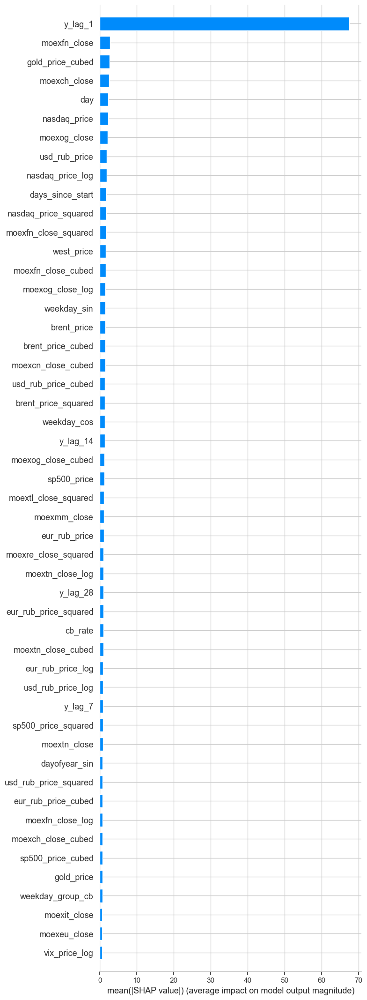

In [131]:
shap_df, shap_values = calculate_shap_feature_importance(
    X_train=X_train_gbdt[model_features_gbdt],
    y_train=y_train_gbdt,
    X_shap=X_test_gbdt[model_features_gbdt],
    y_shap=y_test_gbdt,
    max_display=50,
    target_name='IMOEX',
    sampling_strategy='last',
    shap_mode='interventional'
)

In [132]:
model_features_gbdt = list(shap_df[shap_df['mean_abs_shap'] > 0.1]['feature'])

In [135]:
model_features_gbdt

['y_lag_1',
 'moexfn_close',
 'gold_price_cubed',
 'moexch_close',
 'day',
 'nasdaq_price',
 'moexog_close',
 'usd_rub_price',
 'nasdaq_price_log',
 'days_since_start',
 'nasdaq_price_squared',
 'moexfn_close_squared',
 'west_price',
 'moexfn_close_cubed',
 'moexog_close_log',
 'weekday_sin',
 'brent_price',
 'brent_price_cubed',
 'moexcn_close_cubed',
 'usd_rub_price_cubed',
 'brent_price_squared',
 'weekday_cos',
 'y_lag_14',
 'moexog_close_cubed',
 'sp500_price',
 'moextl_close_squared',
 'moexmm_close',
 'eur_rub_price',
 'moexre_close_squared',
 'moextn_close_log',
 'y_lag_28',
 'eur_rub_price_squared',
 'cb_rate',
 'moextn_close_cubed',
 'eur_rub_price_log',
 'usd_rub_price_log',
 'y_lag_7',
 'sp500_price_squared',
 'moextn_close',
 'dayofyear_sin',
 'usd_rub_price_squared',
 'eur_rub_price_cubed',
 'moexfn_close_log',
 'moexch_close_cubed',
 'sp500_price_cubed',
 'gold_price',
 'weekday_group_cb',
 'moexit_close',
 'moexeu_close',
 'vix_price_log',
 'moexmm_close_squared',
 'moe

### Функции для градиентного бустинга

In [137]:
def visualize_time_series_cv(cv_results, n_splits, time_col=None):
    """
    Функция для визуализации результатов кросс-валидации временных рядов

    Параметры:
    cv_results - словарь с результатами кросс-валидации
    n_splits - количество разбиений
    time_col - название столбца с временной меткой (если None, используется индекс)
    """
    # Настраиваем стиль графиков
    sns.set(style="whitegrid")

    # 1. График MSE по разбиениям
    plt.figure(figsize=(10, 6))
    plt.bar(range(1, n_splits+1), cv_results['fold_mse'], color='skyblue')
    plt.axhline(y=np.mean(cv_results['fold_mse']), color='r', linestyle='-',
               label=f'Среднее: {np.mean(cv_results["fold_mse"]):.4f}')
    plt.title('MSE по разбиениям временного ряда')
    plt.xlabel('Номер разбиения')
    plt.ylabel('MSE')
    plt.xticks(range(1, n_splits+1))
    plt.legend()
    plt.grid(True)
    plt.show()

    # 2. Визуализация разбиений временного ряда
    if time_col is not None and 'fold_timestamps' in cv_results:
        plt.figure(figsize=(12, 8))

        # Получаем все временные метки
        all_timestamps = cv_results['train_timestamps']

        # Создаем цветовую палитру для разбиений
        colors = plt.cm.tab10(np.linspace(0, 1, n_splits))

        for i, (train_indices, test_indices) in enumerate(zip(cv_results['fold_train_indices'], cv_results['fold_test_indices'])):
            # Получаем временные метки для этого разбиения
            train_times = cv_results['fold_timestamps'][i]['train']
            test_times = cv_results['fold_timestamps'][i]['test']

            # Находим минимальную и максимальную временные метки
            min_time = min(train_times) if len(train_times) > 0 else min(test_times)
            max_time = max(test_times) if len(test_times) > 0 else max(train_times)

            # Рисуем горизонтальные линии для обучающей и тестовой выборок
            plt.plot([min_time, max_time], [i+0.2, i+0.2], 'o-', color=colors[i],
                    label=f'Разбиение {i+1}' if i == 0 else "", linewidth=0.4)

            # Отмечаем обучающую и тестовую выборки
            plt.scatter(train_times, [i+0.2]*len(train_times), marker='o', color=colors[i], alpha=0.5)
            plt.scatter(test_times, [i+0.2]*len(test_times), marker='x', color=colors[i], s=50)

        # Добавляем легенду
        plt.plot([], [], 'o', color='gray', label='Обучающая выборка')
        plt.plot([], [], 'x', color='gray', label='Тестовая выборка')

        plt.title('Схема разбиений временного ряда')
        plt.xlabel('Временная метка')
        plt.ylabel('Номер разбиения')
        plt.yticks(np.arange(0.2, n_splits+0.2, 1), [f'Разбиение {i+1}' for i in range(n_splits)])
        plt.legend()
        plt.grid(True)
        plt.show()

    # 3. Сравнение предсказаний и реальных значений на тренировочных данных
    plt.figure(figsize=(10, 6))

    # Если есть временные метки, используем их для оси X
    if time_col is not None and 'train_timestamps' in cv_results:
        plt.scatter(cv_results['train_timestamps'], cv_results['train_actual'], alpha=0.5, label='Реальные значения')
        plt.scatter(cv_results['train_timestamps'], cv_results['train_predictions'], alpha=0.5, label='Предсказания')
        plt.title('Предсказания vs Реальные значения (Тренировочные данные)')
        plt.xlabel('Временная метка')
    else:
        plt.scatter(range(len(cv_results['train_actual'])), cv_results['train_actual'], alpha=0.5, label='Реальные значения')
        plt.scatter(range(len(cv_results['train_predictions'])), cv_results['train_predictions'], alpha=0.5, label='Предсказания')
        plt.title('Предсказания vs Реальные значения (Тренировочные данные)')
        plt.xlabel('Индекс')

    plt.ylabel('Значение')
    plt.legend()
    plt.grid(True)
    plt.show()

        # 4. Сравнение предсказаний и реальных значений на тестовых данных
    plt.figure(figsize=(10, 6))

    # Если есть временные метки, используем их для оси X
    if time_col is not None and 'test_timestamps' in cv_results:
        plt.scatter(cv_results['test_timestamps'], cv_results['test_actual'], alpha=0.5, label='Реальные значения')
        plt.scatter(cv_results['test_timestamps'], cv_results['test_predictions'], alpha=0.5, label='Предсказания')
        plt.title('Предсказания vs Реальные значения (Тестовые данные)')
        plt.xlabel('Временная метка')
    else:
        plt.scatter(range(len(cv_results['test_actual'])), cv_results['test_actual'], alpha=0.5, label='Реальные значения')
        plt.scatter(range(len(cv_results['test_predictions'])), cv_results['test_predictions'], alpha=0.5, label='Предсказания')
        plt.title('Предсказания vs Реальные значения (Тестовые данные)')
        plt.xlabel('Индекс')

    plt.ylabel('Значение')
    plt.legend()
    plt.grid(True)
    plt.show()

    # 5. Если есть OOT данные, визуализируем их
    if cv_results['oot_predictions'] is not None:
        plt.figure(figsize=(10, 6))

        # Если есть временные метки, используем их для оси X
        if time_col is not None and 'oot_timestamps' in cv_results:
            plt.scatter(cv_results['oot_timestamps'], cv_results['oot_actual'], alpha=0.5, label='Реальные значения')
            plt.scatter(cv_results['oot_timestamps'], cv_results['oot_predictions'], alpha=0.5, label='Предсказания')
            plt.title('Предсказания vs Реальные значения (OOT данные)')
            plt.xlabel('Временная метка')
        else:
            plt.scatter(range(len(cv_results['oot_actual'])), cv_results['oot_actual'], alpha=0.5, label='Реальные значения')
            plt.scatter(range(len(cv_results['oot_predictions'])), cv_results['oot_predictions'], alpha=0.5, label='Предсказания')
            plt.title('Предсказания vs Реальные значения (OOT данные)')
            plt.xlabel('Индекс')

        plt.ylabel('Значение')
        plt.legend()
        plt.grid(True)
        plt.show()

    # 6. Временной ряд предсказаний и реальных значений
    plt.figure(figsize=(12, 6))

    # Если есть временные метки, создаем временной ряд
    if time_col is not None:
        # Объединяем тренировочные и тестовые данные для визуализации
        all_timestamps = np.concatenate([cv_results['train_timestamps'], cv_results['test_timestamps']])
        all_actual = np.concatenate([cv_results['train_actual'], cv_results['test_actual']])
        all_predictions = np.concatenate([cv_results['train_predictions'], cv_results['test_predictions']])

        # Сортируем по времени
        sort_idx = np.argsort(all_timestamps)
        all_timestamps = all_timestamps[sort_idx]
        all_actual = all_actual[sort_idx]
        all_predictions = all_predictions[sort_idx]

        # Рисуем временной ряд
        plt.plot(all_timestamps, all_actual, 'b-', alpha=0.7, label='Реальные значения')
        plt.plot(all_timestamps, all_predictions, 'r-', alpha=0.7, label='Предсказания')

        # Добавляем вертикальную линию, разделяющую тренировочные и тестовые данные
        split_time = cv_results['test_timestamps'][0]
        plt.axvline(x=split_time, color='g', linestyle='--', label='Граница тест/трейн')

        plt.title('Временной ряд: реальные значения и предсказания')
        plt.xlabel('Временная метка')
    else:
        # Если нет временных меток, используем индексы
        train_size = len(cv_results['train_actual'])
        test_size = len(cv_results['test_actual'])

        plt.plot(range(train_size), cv_results['train_actual'], 'b-', alpha=0.7, label='Реальные значения (трейн)')
        plt.plot(range(train_size), cv_results['train_predictions'], 'r-', alpha=0.7, label='Предсказания (трейн)')

        plt.plot(range(train_size, train_size + test_size), cv_results['test_actual'], 'b-', alpha=0.7, label='Реальные значения (тест)')
        plt.plot(range(train_size, train_size + test_size), cv_results['test_predictions'], 'r-', alpha=0.7, label='Предсказания (тест)')

        # Добавляем вертикальную линию, разделяющую тренировочные и тестовые данные
        plt.axvline(x=train_size, color='g', linestyle='--', label='Граница тест/трейн')

        plt.title('Временной ряд: реальные значения и предсказания')
        plt.xlabel('Индекс')

    plt.ylabel('Значение')
    plt.legend()
    plt.grid(True)
    plt.show()

    # 7. Сравнение MSE на разных наборах данных
    plt.figure(figsize=(10, 6))

    # Собираем метрики для всех наборов данных
    datasets = ['Кросс-валидация', 'Тест']
    mse_values = [cv_results['val_mse'], cv_results['test_mse']]

    if cv_results['oot_mse'] is not None:
        datasets.append('OOT')
        mse_values.append(cv_results['oot_mse'])

    plt.bar(datasets, mse_values, color='skyblue')
    plt.title('Сравнение MSE на разных наборах данных')
    plt.ylabel('MSE')
    plt.grid(True)

    # Добавляем значения MSE над столбцами
    for i, v in enumerate(mse_values):
        plt.text(i, v + 0.01, f'{v:.4f}', ha='center')

    plt.show()

In [138]:
def visualize_residuals(y_true, y_pred, dataset_name=""):
    """
    Функция для визуализации остатков регрессионной модели

    Параметры:
    y_true - истинные значения целевой переменной
    y_pred - предсказанные значения
    dataset_name - название набора данных для заголовков графиков
    """
    # Вычисляем остатки
    residuals = y_true - y_pred

    # Создаем фигуру с подграфиками
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle(f'Анализ остатков ({dataset_name})', fontsize=16)

    # 1. График остатков относительно предсказанных значений
    axes[0, 0].scatter(y_pred, residuals, alpha=0.5)
    axes[0, 0].axhline(y=0, color='r', linestyle='-')
    axes[0, 0].set_title('Остатки vs Предсказанные значения')
    axes[0, 0].set_xlabel('Предсказанные значения')
    axes[0, 0].set_ylabel('Остатки')
    axes[0, 0].grid(True)

    # 2. Гистограмма остатков
    axes[0, 1].hist(residuals, bins=30, alpha=0.7, color='skyblue', edgecolor='black')
    axes[0, 1].set_title('Гистограмма остатков')
    axes[0, 1].set_xlabel('Остатки')
    axes[0, 1].set_ylabel('Частота')
    axes[0, 1].grid(True)

    # 3. QQ-график для проверки нормальности остатков
    stats.probplot(residuals, dist="norm", plot=axes[1, 0])
    axes[1, 0].set_title('QQ-график остатков')
    axes[1, 0].grid(True)

    # 4. Предсказанные vs Истинные значения
    axes[1, 1].scatter(y_true, y_pred, alpha=0.5)
    min_val = min(min(y_true), min(y_pred))
    max_val = max(max(y_true), max(y_pred))
    axes[1, 1].plot([min_val, max_val], [min_val, max_val], 'r--')
    axes[1, 1].set_title('Предсказанные vs Истинные значения')
    axes[1, 1].set_xlabel('Истинные значения')
    axes[1, 1].set_ylabel('Предсказанные значения')
    axes[1, 1].grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [139]:
def time_series_cross_validation(X_train, y_train, X_test, y_test, X_oot=None, y_oot=None,
                                time_col=None, n_splits=5, gap=0, test_size=None,
                                model=None, random_state=42):
    """
    Функция для проведения кросс-валидации временных рядов с отслеживанием MSE и визуализацией остатков

    Параметры:
    X_train - признаки обучающей выборки (pandas DataFrame)
    y_train - целевая переменная обучающей выборки (pandas Series или numpy array)
    X_test - признаки тестовой выборки (pandas DataFrame)
    y_test - целевая переменная тестовой выборки (pandas Series или numpy array)
    X_oot - признаки out-of-time выборки (pandas DataFrame), опционально
    y_oot - целевая переменная out-of-time выборки (pandas Series или numpy array), опционально
    time_col - название столбца с временной меткой (если None, используется индекс)
    n_splits - количество разбиений для кросс-валидации временных рядов
    gap - количество сэмплов между тренировочным и тестовым наборами
    test_size - размер тестового набора для каждого разбиения (если None, используется по умолчанию)
    model - модель машинного обучения (по умолчанию RandomForestRegressor)
    random_state - фиксированное значение для воспроизводимости результатов

    Возвращает:
    cv_results - словарь с результатами кросс-валидации
    final_model - обученная модель на всех тренировочных данных
    """

    # Проверка входных данных
    if not isinstance(X_train, pd.DataFrame):
        raise TypeError("X_train должен быть pandas DataFrame")

    if not isinstance(X_test, pd.DataFrame):
        raise TypeError("X_test должен быть pandas DataFrame")

    if X_oot is not None and not isinstance(X_oot, pd.DataFrame):
        raise TypeError("X_oot должен быть pandas DataFrame")

    # Проверка, что все наборы данных имеют одинаковые колонки
    train_cols = set(X_train.columns)
    test_cols = set(X_test.columns)

    # Если указан time_col, проверяем его наличие
    if time_col is not None:
        if time_col not in X_train.columns:
            raise ValueError(f"Столбец времени '{time_col}' отсутствует в X_train")
        if time_col not in X_test.columns:
            raise ValueError(f"Столбец времени '{time_col}' отсутствует в X_test")
        if X_oot is not None and time_col not in X_oot.columns:
            raise ValueError(f"Столбец времени '{time_col}' отсутствует в X_oot")

        # Удаляем столбец времени из проверки колонок
        train_cols.remove(time_col)
        test_cols.remove(time_col)

    if train_cols != test_cols:
        raise ValueError("Колонки в X_train и X_test должны совпадать (кроме столбца времени)")

    if X_oot is not None:
        oot_cols = set(X_oot.columns)
        if time_col is not None:
            oot_cols.remove(time_col)
        if train_cols != oot_cols:
            raise ValueError("Колонки в X_train и X_oot должны совпадать (кроме столбца времени)")

    # Если модель не задана, используем RandomForestRegressor по умолчанию
    if model is None:
        model = RandomForestRegressor(n_estimators=100, random_state=random_state)

    # Создаем копии данных для работы
    X_train_copy = X_train.copy()
    X_test_copy = X_test.copy()

    # Если указан time_col, сортируем данные по времени
    if time_col is not None:
        X_train_copy = X_train_copy.sort_values(by=time_col).reset_index(drop=True)
        y_train = y_train.iloc[X_train_copy.index] if isinstance(y_train, pd.Series) else y_train[X_train_copy.index]

        X_test_copy = X_test_copy.sort_values(by=time_col).reset_index(drop=True)
        y_test = y_test.iloc[X_test_copy.index] if isinstance(y_test, pd.Series) else y_test[X_test_copy.index]

        if X_oot is not None:
            X_oot = X_oot.sort_values(by=time_col).reset_index(drop=True)
            y_oot = y_oot.iloc[X_oot.index] if isinstance(y_oot, pd.Series) else y_oot[X_oot.index]

    # Инициализируем TimeSeriesSplit
    tscv = TimeSeriesSplit(n_splits=n_splits, gap=gap, test_size=test_size)

    # Словарь для хранения результатов
    cv_results = {
        'train_predictions': np.zeros(len(y_train)),
        'train_actual': y_train,
        'test_predictions': None,
        'test_actual': y_test,
        'oot_predictions': None,
        'oot_actual': y_oot if y_oot is not None else None,
        'fold_mse': [],
        'fold_train_indices': [],
        'fold_test_indices': [],
        'fold_timestamps': [],
        'train_mse': 0,
        'test_mse': 0,
        'oot_mse': 0 if y_oot is not None else None
    }

    # Если указан time_col, сохраняем временные метки
    if time_col is not None:
        cv_results['train_timestamps'] = X_train_copy[time_col].values
        cv_results['test_timestamps'] = X_test_copy[time_col].values
        if X_oot is not None:
            cv_results['oot_timestamps'] = X_oot[time_col].values

    # Удаляем столбец времени из данных для обучения, если он указан
    if time_col is not None:
        X_train_model = X_train_copy.drop(time_col, axis=1)
        X_test_model = X_test_copy.drop(time_col, axis=1)
        if X_oot is not None:
            X_oot_model = X_oot.drop(time_col, axis=1)
    else:
        X_train_model = X_train_copy
        X_test_model = X_test_copy
        if X_oot is not None:
            X_oot_model = X_oot

    # Массивы для хранения предсказаний и истинных значений по фолдам
    fold_train_mse = []
    fold_val_mse = []

    print("Начинаем процесс кросс-валидации временных рядов...")

    # Проходим по всем разбиениям
    for fold, (train_idx, val_idx) in enumerate(tqdm(tscv.split(X_train_model), total=n_splits, desc="Разбиения")):
        # Сохраняем индексы для визуализации
        cv_results['fold_train_indices'].append(train_idx)
        cv_results['fold_test_indices'].append(val_idx)

        # Если указан time_col, сохраняем временные метки для этого фолда
        if time_col is not None:
            cv_results['fold_timestamps'].append({
                'train': X_train_copy.iloc[train_idx][time_col].values,
                'test': X_train_copy.iloc[val_idx][time_col].values
            })

        # Разделяем данные на обучающую и валидационную выборки
        X_fold_train, X_fold_val = X_train_model.iloc[train_idx], X_train_model.iloc[val_idx]
        y_fold_train, y_fold_val = y_train.iloc[train_idx] if isinstance(y_train, pd.Series) else y_train[train_idx], \
                                  y_train.iloc[val_idx] if isinstance(y_train, pd.Series) else y_train[val_idx]

        # Обучаем модель
        model.fit(X_fold_train, y_fold_train)

        # Делаем предсказания на обучающей и валидационной выборках
        y_fold_train_pred = model.predict(X_fold_train)
        y_fold_val_pred = model.predict(X_fold_val)

        # Сохраняем предсказания для этого фолда
        cv_results['train_predictions'][val_idx] = y_fold_val_pred

        # Вычисляем MSE для этого фолда
        train_mse = mean_squared_error(y_fold_train, y_fold_train_pred)
        val_mse = mean_squared_error(y_fold_val, y_fold_val_pred)

        fold_train_mse.append(train_mse)
        fold_val_mse.append(val_mse)
        cv_results['fold_mse'].append(val_mse)

        print(f"Разбиение {fold+1}/{n_splits}:")
        print(f"  Размер обучающей выборки: {len(train_idx)}")
        print(f"  Размер валидационной выборки: {len(val_idx)}")
        print(f"  MSE на обучающей выборке: {train_mse:.4f}")
        print(f"  MSE на валидационной выборке: {val_mse:.4f}")

    # Вычисляем средние значения MSE
    cv_results['train_mse'] = np.mean(fold_train_mse)
    cv_results['val_mse'] = np.mean(fold_val_mse)

    print(f"\nСредняя MSE на обучающей выборке: {cv_results['train_mse']:.4f}")
    print(f"Средняя MSE на валидационной выборке: {cv_results['val_mse']:.4f}")

    # Обучаем финальную модель на всех тренировочных данных
    print("\nОбучаем финальную модель на всех тренировочных данных...")
    final_model = model.fit(X_train_model, y_train)

    # Делаем предсказания на тестовой выборке
    cv_results['test_predictions'] = final_model.predict(X_test_model)

    # Вычисляем MSE на тестовой выборке
    cv_results['test_mse'] = mean_squared_error(y_test, cv_results['test_predictions'])
    print(f"MSE на тестовой выборке: {cv_results['test_mse']:.4f}")

    # Если есть OOT данные, делаем предсказания на них
    if X_oot is not None and y_oot is not None:
        cv_results['oot_predictions'] = final_model.predict(X_oot_model)
        cv_results['oot_mse'] = mean_squared_error(y_oot, cv_results['oot_predictions'])
        print(f"MSE на OOT выборке: {cv_results['oot_mse']:.4f}")

    # Визуализация результатов
    visualize_time_series_cv(cv_results, n_splits, time_col)

    # Визуализация остатков
    visualize_residuals(y_test, cv_results['test_predictions'], "Тестовая выборка")

    # Если есть OOT данные, визуализируем остатки для них
    if X_oot is not None and y_oot is not None:
        visualize_residuals(y_oot, cv_results['oot_predictions'], "OOT выборка")

    return cv_results, final_model

### Функция для восстановления ряда

In [141]:
def reconstruct_from_diff_preds(diff_preds, y_original_last_train_value):
    """
    Восстанавливает прогноз уровня временного ряда из дифференцированного прогноза.
    
    Parameters:
    -----------
    diff_preds : array-like
        Прогнозные значения разностей (y_diff).
    y_original_last_train_value : float
        Последнее значение исходного (недифференцированного) ряда перед началом прогноза.
    
    Returns:
    --------
    np.ndarray
        Восстановленный прогноз исходного ряда.
    """
    diff_preds = np.array(diff_preds)
    return y_original_last_train_value + np.cumsum(diff_preds)

### Кросс-валидация с восстановлением - подготовка

In [143]:
def reconstruct_cv_results(cv_results, y_original_train, y_original_test):
    """
    Возвращает копию cv_results с восстановленными значениями исходного ряда.
    """
    def reconstruct(diff, last_val):
        return reconstruct_from_diff_preds(diff, last_val)

    cv_results_rec = cv_results.copy()

    # Последнее значение оригинального train-таргета
    last_val = y_original_train.iloc[-1]

    # Восстановление
    cv_results_rec['train_actual'] = reconstruct(cv_results['train_actual'], y_original_train.iloc[0])
    cv_results_rec['train_predictions'] = reconstruct(cv_results['train_predictions'], y_original_train.iloc[0])

    cv_results_rec['test_actual'] = reconstruct(cv_results['test_actual'], last_val)
    cv_results_rec['test_predictions'] = reconstruct(cv_results['test_predictions'], last_val)

    # Если есть OOT - восстанавливаем и его
    if cv_results.get('oot_actual') is not None and cv_results.get('oot_predictions') is not None:
        last_val_test = cv_results_rec['test_actual'][-1]
        cv_results_rec['oot_actual'] = reconstruct(cv_results['oot_actual'], last_val_test)
        cv_results_rec['oot_predictions'] = reconstruct(cv_results['oot_predictions'], last_val_test)

    return cv_results_rec

### График

In [145]:
def time_series_cross_validation(X_train, y_train, X_test, y_test, X_oot=None, y_oot=None,
                                time_col=None, n_splits=5, gap=0, test_size=None,
                                model=None, random_state=42):
    """
    Функция для проведения кросс-валидации временных рядов с отслеживанием MSE и визуализацией остатков

    Параметры:
    X_train - признаки обучающей выборки (pandas DataFrame)
    y_train - целевая переменная обучающей выборки (pandas Series или numpy array)
    X_test - признаки тестовой выборки (pandas DataFrame)
    y_test - целевая переменная тестовой выборки (pandas Series или numpy array)
    X_oot - признаки out-of-time выборки (pandas DataFrame), опционально
    y_oot - целевая переменная out-of-time выборки (pandas Series или numpy array), опционально
    time_col - название столбца с временной меткой (если None, используется индекс)
    n_splits - количество разбиений для кросс-валидации временных рядов
    gap - количество сэмплов между тренировочным и тестовым наборами
    test_size - размер тестового набора для каждого разбиения (если None, используется по умолчанию)
    model - модель машинного обучения (по умолчанию RandomForestRegressor)
    random_state - фиксированное значение для воспроизводимости результатов

    Возвращает:
    cv_results - словарь с результатами кросс-валидации
    final_model - обученная модель на всех тренировочных данных
    """

    # Проверка входных данных
    if not isinstance(X_train, pd.DataFrame):
        raise TypeError("X_train должен быть pandas DataFrame")

    if not isinstance(X_test, pd.DataFrame):
        raise TypeError("X_test должен быть pandas DataFrame")

    if X_oot is not None and not isinstance(X_oot, pd.DataFrame):
        raise TypeError("X_oot должен быть pandas DataFrame")

    # Проверка, что все наборы данных имеют одинаковые колонки
    train_cols = set(X_train.columns)
    test_cols = set(X_test.columns)

    # Если указан time_col, проверяем его наличие
    if time_col is not None:
        if time_col not in X_train.columns:
            raise ValueError(f"Столбец времени '{time_col}' отсутствует в X_train")
        if time_col not in X_test.columns:
            raise ValueError(f"Столбец времени '{time_col}' отсутствует в X_test")
        if X_oot is not None and time_col not in X_oot.columns:
            raise ValueError(f"Столбец времени '{time_col}' отсутствует в X_oot")

        # Удаляем столбец времени из проверки колонок
        train_cols.remove(time_col)
        test_cols.remove(time_col)

    if train_cols != test_cols:
        raise ValueError("Колонки в X_train и X_test должны совпадать (кроме столбца времени)")

    if X_oot is not None:
        oot_cols = set(X_oot.columns)
        if time_col is not None:
            oot_cols.remove(time_col)
        if train_cols != oot_cols:
            raise ValueError("Колонки в X_train и X_oot должны совпадать (кроме столбца времени)")

    # Если модель не задана, используем RandomForestRegressor по умолчанию
    if model is None:
        model = RandomForestRegressor(n_estimators=100, random_state=random_state)

    # Создаем копии данных для работы
    X_train_copy = X_train.copy()
    X_test_copy = X_test.copy()

    # Если указан time_col, сортируем данные по времени
    if time_col is not None:
        X_train_copy = X_train_copy.sort_values(by=time_col).reset_index(drop=True)
        y_train = y_train.iloc[X_train_copy.index] if isinstance(y_train, pd.Series) else y_train[X_train_copy.index]

        X_test_copy = X_test_copy.sort_values(by=time_col).reset_index(drop=True)
        y_test = y_test.iloc[X_test_copy.index] if isinstance(y_test, pd.Series) else y_test[X_test_copy.index]

        if X_oot is not None:
            X_oot = X_oot.sort_values(by=time_col).reset_index(drop=True)
            y_oot = y_oot.iloc[X_oot.index] if isinstance(y_oot, pd.Series) else y_oot[X_oot.index]

    # Инициализируем TimeSeriesSplit
    tscv = TimeSeriesSplit(n_splits=n_splits, gap=gap, test_size=test_size)

    # Словарь для хранения результатов
    cv_results = {
        'train_predictions': np.zeros(len(y_train)),
        'train_actual': y_train,
        'test_predictions': None,
        'test_actual': y_test,
        'oot_predictions': None,
        'oot_actual': y_oot if y_oot is not None else None,
        'fold_mse': [],
        'fold_train_indices': [],
        'fold_test_indices': [],
        'fold_timestamps': [],
        'train_mse': 0,
        'test_mse': 0,
        'oot_mse': 0 if y_oot is not None else None
    }

    # Если указан time_col, сохраняем временные метки
    if time_col is not None:
        cv_results['train_timestamps'] = X_train_copy[time_col].values
        cv_results['test_timestamps'] = X_test_copy[time_col].values
        if X_oot is not None:
            cv_results['oot_timestamps'] = X_oot[time_col].values

    # Удаляем столбец времени из данных для обучения, если он указан
    if time_col is not None:
        X_train_model = X_train_copy.drop(time_col, axis=1)
        X_test_model = X_test_copy.drop(time_col, axis=1)
        if X_oot is not None:
            X_oot_model = X_oot.drop(time_col, axis=1)
    else:
        X_train_model = X_train_copy
        X_test_model = X_test_copy
        if X_oot is not None:
            X_oot_model = X_oot

    # Массивы для хранения предсказаний и истинных значений по фолдам
    fold_train_mse = []
    fold_val_mse = []

    print("Начинаем процесс кросс-валидации временных рядов...")

    # Проходим по всем разбиениям
    for fold, (train_idx, val_idx) in enumerate(tqdm(tscv.split(X_train_model), total=n_splits, desc="Разбиения")):
        # Сохраняем индексы для визуализации
        cv_results['fold_train_indices'].append(train_idx)
        cv_results['fold_test_indices'].append(val_idx)

        # Если указан time_col, сохраняем временные метки для этого фолда
        if time_col is not None:
            cv_results['fold_timestamps'].append({
                'train': X_train_copy.iloc[train_idx][time_col].values,
                'test': X_train_copy.iloc[val_idx][time_col].values
            })

        # Разделяем данные на обучающую и валидационную выборки
        X_fold_train, X_fold_val = X_train_model.iloc[train_idx], X_train_model.iloc[val_idx]
        y_fold_train, y_fold_val = y_train.iloc[train_idx] if isinstance(y_train, pd.Series) else y_train[train_idx], \
                                  y_train.iloc[val_idx] if isinstance(y_train, pd.Series) else y_train[val_idx]

        # Обучаем модель
        model.fit(X_fold_train, y_fold_train)

        # Делаем предсказания на обучающей и валидационной выборках
        y_fold_train_pred = model.predict(X_fold_train)
        y_fold_val_pred = model.predict(X_fold_val)

        # Сохраняем предсказания для этого фолда
        cv_results['train_predictions'][val_idx] = y_fold_val_pred

        # Вычисляем MSE для этого фолда
        train_mse = mean_squared_error(y_fold_train, y_fold_train_pred)
        val_mse = mean_squared_error(y_fold_val, y_fold_val_pred)

        fold_train_mse.append(train_mse)
        fold_val_mse.append(val_mse)
        cv_results['fold_mse'].append(val_mse)

        print(f"Разбиение {fold+1}/{n_splits}:")
        print(f"  Размер обучающей выборки: {len(train_idx)}")
        print(f"  Размер валидационной выборки: {len(val_idx)}")
        print(f"  MSE на обучающей выборке: {train_mse:.4f}")
        print(f"  MSE на валидационной выборке: {val_mse:.4f}")

    # Вычисляем средние значения MSE
    cv_results['train_mse'] = np.mean(fold_train_mse)
    cv_results['val_mse'] = np.mean(fold_val_mse)

    print(f"\nСредняя MSE на обучающей выборке: {cv_results['train_mse']:.4f}")
    print(f"Средняя MSE на валидационной выборке: {cv_results['val_mse']:.4f}")

    # Обучаем финальную модель на всех тренировочных данных
    print("\nОбучаем финальную модель на всех тренировочных данных...")
    final_model = model.fit(X_train_model, y_train)

    # Делаем предсказания на тестовой выборке
    cv_results['test_predictions'] = final_model.predict(X_test_model)

    # Вычисляем MSE на тестовой выборке
    cv_results['test_mse'] = mean_squared_error(y_test, cv_results['test_predictions'])
    print(f"MSE на тестовой выборке: {cv_results['test_mse']:.4f}")

    # Если есть OOT данные, делаем предсказания на них
    if X_oot is not None and y_oot is not None:
        cv_results['oot_predictions'] = final_model.predict(X_oot_model)
        cv_results['oot_mse'] = mean_squared_error(y_oot, cv_results['oot_predictions'])
        print(f"MSE на OOT выборке: {cv_results['oot_mse']:.4f}")

    # Визуализация результатов
    visualize_time_series_cv(cv_results, n_splits, time_col)

    # Визуализация остатков
    visualize_residuals(y_test, cv_results['test_predictions'], "Тестовая выборка")

    # Если есть OOT данные, визуализируем остатки для них
    if X_oot is not None and y_oot is not None:
        visualize_residuals(y_oot, cv_results['oot_predictions'], "OOT выборка")

    return cv_results, final_model

In [146]:
def time_series_cross_validation(X_train, y_train, X_test, y_test,
                                 X_oot=None, y_oot=None,
                                 y_original_train=None, y_original_test=None, y_original_oot=None,
                                 time_col=None, n_splits=5, gap=0, test_size=None,
                                 model=None, random_state=42):
    """
    Кросс-валидация временных рядов с MSE, визуализацией остатков и восстановлением уровня ряда
    """

    if model is None:
        model = RandomForestRegressor(n_estimators=100, random_state=random_state)

    X_train_copy = X_train.copy()
    X_test_copy = X_test.copy()

    if time_col is not None:
        X_train_copy = X_train_copy.sort_values(by=time_col).reset_index(drop=True)
        y_train = y_train.iloc[X_train_copy.index] if isinstance(y_train, pd.Series) else y_train[X_train_copy.index]

        X_test_copy = X_test_copy.sort_values(by=time_col).reset_index(drop=True)
        y_test = y_test.iloc[X_test_copy.index] if isinstance(y_test, pd.Series) else y_test[X_test_copy.index]

        if X_oot is not None:
            X_oot = X_oot.sort_values(by=time_col).reset_index(drop=True)
            y_oot = y_oot.iloc[X_oot.index] if isinstance(y_oot, pd.Series) else y_oot[X_oot.index]

    tscv = TimeSeriesSplit(n_splits=n_splits, gap=gap, test_size=test_size)

    cv_results = {
        'train_predictions': np.zeros(len(y_train)),
        'train_actual': y_train,
        'test_predictions': None,
        'test_actual': y_test,
        'oot_predictions': None,
        'oot_actual': y_oot if y_oot is not None else None,
        'fold_mse': [],
        'fold_train_indices': [],
        'fold_test_indices': [],
        'fold_timestamps': [],
        'train_mse': 0,
        'test_mse': 0,
        'oot_mse': 0 if y_oot is not None else None
    }

    if time_col is not None:
        cv_results['train_timestamps'] = X_train_copy[time_col].values
        cv_results['test_timestamps'] = X_test_copy[time_col].values
        if X_oot is not None:
            cv_results['oot_timestamps'] = X_oot[time_col].values

    if time_col is not None:
        X_train_model = X_train_copy.drop(time_col, axis=1)
        X_test_model = X_test_copy.drop(time_col, axis=1)
        if X_oot is not None:
            X_oot_model = X_oot.drop(time_col, axis=1)
    else:
        X_train_model = X_train_copy
        X_test_model = X_test_copy
        if X_oot is not None:
            X_oot_model = X_oot

    fold_train_mse = []
    fold_val_mse = []

    print("Начинаем процесс кросс-валидации временных рядов...")

    for fold, (train_idx, val_idx) in enumerate(tqdm(tscv.split(X_train_model), total=n_splits, desc="Разбиения")):
        cv_results['fold_train_indices'].append(train_idx)
        cv_results['fold_test_indices'].append(val_idx)

        if time_col is not None:
            cv_results['fold_timestamps'].append({
                'train': X_train_copy.iloc[train_idx][time_col].values,
                'test': X_train_copy.iloc[val_idx][time_col].values
            })

        X_fold_train, X_fold_val = X_train_model.iloc[train_idx], X_train_model.iloc[val_idx]
        y_fold_train = y_train.iloc[train_idx] if isinstance(y_train, pd.Series) else y_train[train_idx]
        y_fold_val = y_train.iloc[val_idx] if isinstance(y_train, pd.Series) else y_train[val_idx]

        model.fit(X_fold_train, y_fold_train)

        y_fold_train_pred = model.predict(X_fold_train)
        y_fold_val_pred = model.predict(X_fold_val)

        cv_results['train_predictions'][val_idx] = y_fold_val_pred

        train_mse = mean_squared_error(y_fold_train, y_fold_train_pred)
        val_mse = mean_squared_error(y_fold_val, y_fold_val_pred)

        fold_train_mse.append(train_mse)
        fold_val_mse.append(val_mse)
        cv_results['fold_mse'].append(val_mse)

        print(f"Разбиение {fold+1}/{n_splits}:")
        print(f"  Обучающая выборка: {len(train_idx)}, Валидационная выборка: {len(val_idx)}")
        print(f"  MSE (train): {train_mse:.4f}, MSE (val): {val_mse:.4f}")

    cv_results['train_mse'] = np.mean(fold_train_mse)
    cv_results['val_mse'] = np.mean(fold_val_mse)

    print(f"\nСредняя MSE (train): {cv_results['train_mse']:.4f}")
    print(f"Средняя MSE (val): {cv_results['val_mse']:.4f}")

    print("\nФинальное обучение модели...")
    final_model = model.fit(X_train_model, y_train)

    cv_results['test_predictions'] = final_model.predict(X_test_model)
    cv_results['test_mse'] = mean_squared_error(y_test, cv_results['test_predictions'])
    print(f"MSE (test): {cv_results['test_mse']:.4f}")

    if X_oot is not None and y_oot is not None:
        cv_results['oot_predictions'] = final_model.predict(X_oot_model)
        cv_results['oot_mse'] = mean_squared_error(y_oot, cv_results['oot_predictions'])
        print(f"MSE (OOT): {cv_results['oot_mse']:.4f}")

    # === Восстановление и визуализация ===
    if y_original_train is not None and y_original_test is not None:
        from copy import deepcopy
        cv_results_rec = deepcopy(cv_results)

        cv_results_rec['train_actual'] = reconstruct_from_diff_preds(cv_results['train_actual'], y_original_train.iloc[0])
        cv_results_rec['train_predictions'] = reconstruct_from_diff_preds(cv_results['train_predictions'], y_original_train.iloc[0])

        last_val = y_original_train.iloc[-1]
        cv_results_rec['test_actual'] = reconstruct_from_diff_preds(cv_results['test_actual'], last_val)
        cv_results_rec['test_predictions'] = reconstruct_from_diff_preds(cv_results['test_predictions'], last_val)

        if y_original_oot is not None and cv_results['oot_predictions'] is not None:
            last_val_test = cv_results_rec['test_actual'][-1]
            cv_results_rec['oot_actual'] = reconstruct_from_diff_preds(cv_results['oot_actual'], last_val_test)
            cv_results_rec['oot_predictions'] = reconstruct_from_diff_preds(cv_results['oot_predictions'], last_val_test)

        visualize_time_series_cv(cv_results_rec, n_splits, time_col)
        visualize_residuals(cv_results_rec['test_actual'], cv_results_rec['test_predictions'], "Тест (восстановленный)")

        if y_original_oot is not None and cv_results_rec['oot_predictions'] is not None:
            visualize_residuals(cv_results_rec['oot_actual'], cv_results_rec['oot_predictions'], "OOT (восстановленный)")
    else:
        visualize_time_series_cv(cv_results, n_splits, time_col)
        visualize_residuals(y_test, cv_results['test_predictions'], "Тестовая выборка")
        if X_oot is not None and y_oot is not None:
            visualize_residuals(y_oot, cv_results['oot_predictions'], "OOT выборка")

    return cv_results, final_model

### Hyperopt

In [190]:
import time

In [376]:
def run_hyperopt_with_reconstruction(
    X_train, y_train_diff, y_original_train,
    X_test, y_test_diff, y_original_test,
    model_class,
    space,
    n_iter=30,
    random_state=42,
    n_splits_cv=5,
    time_col=None,
    early_stopping_rounds=50
):
    from hyperopt import fmin, tpe, Trials, STATUS_OK
    from sklearn.model_selection import TimeSeriesSplit
    from sklearn.metrics import mean_squared_error
    from tqdm import tqdm
    import pandas as pd
    import numpy as np
    import time
    from copy import deepcopy

    def reconstruct_from_diff_preds(diff_preds, y_original_last_value):
        return y_original_last_value + np.cumsum(diff_preds)

    def get_model_params(params, model_class):
        if model_class.__name__ == 'CatBoostRegressor':
            dct = {
                'iterations': int(params['iterations']),
                'depth': int(params['depth']) if 'depth' in params else 2,
                'learning_rate': params['learning_rate'],
                'l2_leaf_reg': int(params['l2_leaf_reg']),
                'random_strength': params['random_strength'],
                'bagging_temperature': params['bagging_temperature'],
                'random_seed': random_state,
                'verbose': 0,
                'bootstrap_type': params['bootstrap_type'] if 'bootstrap_type' in params else 'Bayesian',
            }
            # subsample только если задан Bernoulli
            if 'subsample' in params and dct['bootstrap_type'] == 'Bernoulli':
                dct['subsample'] = params['subsample']
            return dct
        else:
            raise ValueError("Только CatBoost поддержан в этой функции!")

    log_rows = []
    trials = Trials()
    pbar = tqdm(total=n_iter, desc="Hyperopt", position=0, leave=True)
    iteration = 0

    def objective(params):
        nonlocal iteration
        print(f"\n===> Запуск objective, итерация {iteration + 1} <===", flush=True)
        try:
            model_params = get_model_params(params, model_class)
            print(f"  [Objective] Параметры: {model_params}", flush=True)
            tscv = TimeSeriesSplit(n_splits=n_splits_cv)
            val_scores = []

            for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
                print(f"  [CV] fold {fold+1}: train={len(train_idx)}, val={len(val_idx)}", flush=True)
                t1 = time.time()
                model = model_class(**model_params)
                model.fit(
                    X_train.iloc[train_idx], y_train_diff.iloc[train_idx],
                    eval_set=(X_train.iloc[val_idx], y_train_diff.iloc[val_idx]),
                    early_stopping_rounds=early_stopping_rounds,
                    use_best_model=True
                )
                print(f"    fit OK за {time.time() - t1:.2f} сек", flush=True)
                preds_diff = model.predict(X_train.iloc[val_idx])
                last_val = y_original_train.iloc[train_idx[-1]]
                preds_rec = reconstruct_from_diff_preds(preds_diff, last_val)
                true_rec = reconstruct_from_diff_preds(y_train_diff.iloc[val_idx].values, last_val)
                rmse = np.sqrt(mean_squared_error(true_rec, preds_rec))
                val_scores.append(rmse)

            mean_cv_rmse = np.mean(val_scores)
            print(f"  [Objective] mean_cv_rmse: {mean_cv_rmse:.4f}", flush=True)

            # Финальная модель и оценка на тесте (тоже с early stopping)
            print("  [Objective] Финальное обучение на всём трейне...", flush=True)
            final_model = model_class(**model_params)
            # тут early stopping на тесте не используется, если нет валидации
            final_model.fit(
                X_train, y_train_diff,
                # eval_set можно задать, если есть X_test, y_test_diff
                # eval_set=(X_test, y_test_diff),
                # early_stopping_rounds=early_stopping_rounds,
                # use_best_model=True
            )
            y_pred_diff = final_model.predict(X_test)
            last_val_test = y_original_train.iloc[-1]
            y_pred_rec = reconstruct_from_diff_preds(y_pred_diff, last_val_test)
            y_test_rec = reconstruct_from_diff_preds(y_test_diff.values, last_val_test)
            test_rmse = np.sqrt(mean_squared_error(y_test_rec, y_pred_rec))

            row = {
                'iteration': iteration + 1,
                **model_params,
                'cv_rmse': mean_cv_rmse,
                'test_rmse': test_rmse
            }
            log_rows.append(row)

            print(f"[{iteration + 1}] Params: {model_params} | CV RMSE: {mean_cv_rmse:.4f} | Test RMSE: {test_rmse:.4f}", flush=True)
            iteration += 1
            pbar.update(1)
            return {'loss': mean_cv_rmse, 'status': STATUS_OK}
        except Exception as e:
            print(f"Итерация {iteration+1} завершилась с ошибкой: {e}", flush=True)
            import traceback
            traceback.print_exc()
            pbar.update(1)
            iteration += 1
            return {'loss': np.inf, 'status': STATUS_OK}

    start_time = time.time()
    try:
        best = fmin(
            fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=n_iter,
            trials=trials,
            rstate=np.random.default_rng(random_state),
            verbose=0
        )
    except Exception as e:
        print("Hyperopt завершился с ошибкой:")
        import traceback
        traceback.print_exc()
        pbar.close()
        return None
    pbar.close()

    if len(log_rows) == 0:
        print("Нет успешных итераций Hyperopt.")
        return None

    results_df = pd.DataFrame(log_rows)
    duration = time.time() - start_time

    # Добавим выбор по test_rmse
    best_cv_idx = np.argmin([t['result']['loss'] for t in trials.trials])
    best_test_idx = results_df['test_rmse'].idxmin()
    best_params_cv = log_rows[best_cv_idx]
    best_params_test = results_df.loc[best_test_idx].to_dict()

    # Итоговую модель (и графики) строим по лучшему test_rmse!
    best_model = model_class(**{k: v for k, v in best_params_test.items() if k not in ['iteration', 'cv_rmse', 'test_rmse']})
    best_model.fit(X_train, y_train_diff)

    print(f"\nЛучшие параметры по test_rmse: {best_params_test}")
    print(f"Hyperopt завершен за {duration:.2f} секунд")

    # Итоговая кросс-валидация и графики для лучшей модели

    def build_final_cv_results(
        model, X_train, y_train_diff, y_original_train,
        X_test, y_test_diff, y_original_test,
        n_splits=5, time_col=None
    ):
        tscv = TimeSeriesSplit(n_splits=n_splits)
        train_predictions = np.zeros(len(y_train_diff))
        fold_mse = []
        fold_train_indices, fold_test_indices, fold_timestamps = [], [], []

        for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
            model_fold = deepcopy(model)
            model_fold.fit(
                X_train.iloc[train_idx], y_train_diff.iloc[train_idx],
                eval_set=(X_train.iloc[val_idx], y_train_diff.iloc[val_idx]),
                early_stopping_rounds=early_stopping_rounds,
                use_best_model=True
            )
            preds_diff = model_fold.predict(X_train.iloc[val_idx])
            last_val = y_original_train.iloc[train_idx[-1]]
            preds_rec = reconstruct_from_diff_preds(preds_diff, last_val)
            train_predictions[val_idx] = preds_rec
            true_rec = reconstruct_from_diff_preds(y_train_diff.iloc[val_idx].values, last_val)
            mse = np.mean((true_rec - preds_rec) ** 2)
            fold_mse.append(mse)
            fold_train_indices.append(train_idx)
            fold_test_indices.append(val_idx)
            fold_timestamps.append(None)

        # Test
        y_pred_diff = model.predict(X_test)
        last_val_test = y_original_train.iloc[-1]
        test_predictions = reconstruct_from_diff_preds(y_pred_diff, last_val_test)
        test_actual = reconstruct_from_diff_preds(y_test_diff.values, last_val_test)

        cv_results = {
            'train_predictions': train_predictions,
            'train_actual': reconstruct_from_diff_preds(y_train_diff.values, y_original_train.iloc[0]),
            'test_predictions': test_predictions,
            'test_actual': test_actual,
            'fold_mse': fold_mse,
            'fold_train_indices': fold_train_indices,
            'fold_test_indices': fold_test_indices,
            'fold_timestamps': fold_timestamps,
            'train_mse': np.mean(fold_mse),
            'test_mse': np.mean((test_actual - test_predictions) ** 2),
            'val_mse': np.mean(fold_mse),
            'train_timestamps': X_train.index if time_col is None else X_train[time_col].values,
            'test_timestamps': X_test.index if time_col is None else X_test[time_col].values,
            'oot_predictions': None,
            'oot_actual': None,
            'oot_mse': None
        }
        return cv_results

    cv_results = build_final_cv_results(
        best_model,
        X_train, y_train_diff, y_original_train,
        X_test, y_test_diff, y_original_test,
        n_splits=n_splits_cv, time_col=time_col
    )

    visualize_time_series_cv(cv_results, n_splits=n_splits_cv, time_col=time_col)
    visualize_residuals(cv_results['test_actual'], cv_results['test_predictions'], dataset_name="Тест (восстановленный)")

    return {
        'best_model': best_model,
        'best_params_cv': best_params_cv,
        'best_params_test': best_params_test,
        'log_df': results_df,
        'duration': duration,
        'cv_results': cv_results
    }


In [171]:
def run_hyperopt_with_reconstruction(
    X_train, y_train_diff, y_original_train,
    X_test, y_test_diff, y_original_test,
    model_class,
    space,
    n_iter=30,
    random_state=42,
    n_splits_cv=5,
    time_col=None
):
    def reconstruct_from_diff_preds(diff_preds, y_original_last_value):
        return y_original_last_value + np.cumsum(diff_preds)

    def get_model_params(params, model_class):
        """Автоматический выбор параметров для CatBoost или XGBoost."""
        if model_class.__name__ == 'CatBoostRegressor':
            return {
                'iterations': int(params['iterations']),
                'depth': int(params['depth']),
                'learning_rate': params['learning_rate'],
                'l2_leaf_reg': int(params['l2_leaf_reg']),
                'random_strength': params['random_strength'],
                'bagging_temperature': params['bagging_temperature'],
                'random_seed': random_state,
                'verbose': 0
            }
        elif model_class.__name__ == 'XGBRegressor':
            return {
                'n_estimators': int(params['n_estimators']),
                'max_depth': int(params['max_depth']),
                'learning_rate': params['learning_rate'],
                'subsample': params['subsample'],
                'colsample_bytree': params.get('colsample_bytree', 1.0),
                'min_child_weight': int(params.get('min_child_weight', 1)),
                'gamma': params.get('gamma', 0),
                'random_state': random_state,
            }
        else:
            raise ValueError("model_class должен быть CatBoostRegressor или XGBRegressor")

    log_rows = []
    trials = Trials()
    pbar = tqdm(total=n_iter, desc="Hyperopt", position=0, leave=True)
    iteration = 0

    def objective(params):
        nonlocal iteration
        print(f"\n===> Запуск objective, итерация {iteration + 1} <===", flush=True)
        try:
            model_params = get_model_params(params, model_class)
            print(f"  [Objective] Параметры: {model_params}", flush=True)
            model = model_class(**model_params)
            tscv = TimeSeriesSplit(n_splits=n_splits_cv)
            val_scores = []

            for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
                print(f"  [CV] fold {fold+1}: train={len(train_idx)}, val={len(val_idx)}", flush=True)
                t1 = time.time()
                model.fit(X_train.iloc[train_idx], y_train_diff.iloc[train_idx])
                print(f"    fit OK за {time.time() - t1:.2f} сек", flush=True)
                preds_diff = model.predict(X_train.iloc[val_idx])
                last_val = y_original_train.iloc[train_idx[-1]]
                preds_rec = reconstruct_from_diff_preds(preds_diff, last_val)
                true_rec = reconstruct_from_diff_preds(y_train_diff.iloc[val_idx].values, last_val)
                rmse = np.sqrt(mean_squared_error(true_rec, preds_rec))
                val_scores.append(rmse)

            mean_cv_rmse = np.mean(val_scores)
            print(f"  [Objective] mean_cv_rmse: {mean_cv_rmse:.4f}", flush=True)

            # Финальная модель и оценка на тесте
            print("  [Objective] Финальное обучение на всём трейне...", flush=True)
            model.fit(X_train, y_train_diff)
            y_pred_diff = model.predict(X_test)
            last_val_test = y_original_train.iloc[-1]
            y_pred_rec = reconstruct_from_diff_preds(y_pred_diff, last_val_test)
            y_test_rec = reconstruct_from_diff_preds(y_test_diff.values, last_val_test)
            test_rmse = np.sqrt(mean_squared_error(y_test_rec, y_pred_rec))

            row = {
                'iteration': iteration + 1,
                **model_params,
                'cv_rmse': mean_cv_rmse,
                'test_rmse': test_rmse
            }
            log_rows.append(row)

            print(f"[{iteration + 1}] Params: {model_params} | CV RMSE: {mean_cv_rmse:.4f} | Test RMSE: {test_rmse:.4f}", flush=True)
            iteration += 1
            pbar.update(1)
            return {'loss': mean_cv_rmse, 'status': STATUS_OK}
        except Exception as e:
            print(f"Итерация {iteration+1} завершилась с ошибкой: {e}", flush=True)
            import traceback
            traceback.print_exc()
            pbar.update(1)
            iteration += 1
            return {'loss': np.inf, 'status': STATUS_OK}

    start_time = time.time()
    try:
        best = fmin(
            fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=n_iter,
            trials=trials,
            rstate=np.random.default_rng(random_state),
            verbose=0
        )
    except Exception as e:
        print("Hyperopt завершился с ошибкой:")
        import traceback
        traceback.print_exc()
        pbar.close()
        return None
    pbar.close()

    if len(log_rows) == 0:
        print("Нет успешных итераций Hyperopt.")
        return None

    best_trial_idx = np.argmin([t['result']['loss'] for t in trials.trials])
    best_params = log_rows[best_trial_idx]
    best_model = model_class(**{k: v for k, v in best_params.items() if k not in {'iteration', 'cv_rmse', 'test_rmse'}})
    best_model.fit(X_train, y_train_diff)

    results_df = pd.DataFrame(log_rows)
    duration = time.time() - start_time

    print(f"\nЛучшие параметры: {best_params}")
    print(f"Hyperopt завершен за {duration:.2f} секунд")

    # Итоговая кросс-валидация и графики для лучшей модели =====

    def build_final_cv_results(
        model, X_train, y_train_diff, y_original_train,
        X_test, y_test_diff, y_original_test,
        n_splits=5, time_col=None
    ):
        tscv = TimeSeriesSplit(n_splits=n_splits)
        train_predictions = np.zeros(len(y_train_diff))
        fold_mse = []
        fold_train_indices, fold_test_indices, fold_timestamps = [], [], []

        for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
            model_fold = deepcopy(model)
            model_fold.fit(X_train.iloc[train_idx], y_train_diff.iloc[train_idx])
            preds_diff = model_fold.predict(X_train.iloc[val_idx])
            last_val = y_original_train.iloc[train_idx[-1]]
            preds_rec = reconstruct_from_diff_preds(preds_diff, last_val)
            train_predictions[val_idx] = preds_rec
            true_rec = reconstruct_from_diff_preds(y_train_diff.iloc[val_idx].values, last_val)
            mse = np.mean((true_rec - preds_rec) ** 2)
            fold_mse.append(mse)
            fold_train_indices.append(train_idx)
            fold_test_indices.append(val_idx)
            fold_timestamps.append(None)

        # Test
        y_pred_diff = model.predict(X_test)
        last_val_test = y_original_train.iloc[-1]
        test_predictions = reconstruct_from_diff_preds(y_pred_diff, last_val_test)
        test_actual = reconstruct_from_diff_preds(y_test_diff.values, last_val_test)

        cv_results = {
            'train_predictions': train_predictions,
            'train_actual': reconstruct_from_diff_preds(y_train_diff.values, y_original_train.iloc[0]),
            'test_predictions': test_predictions,
            'test_actual': test_actual,
            'fold_mse': fold_mse,
            'fold_train_indices': fold_train_indices,
            'fold_test_indices': fold_test_indices,
            'fold_timestamps': fold_timestamps,
            'train_mse': np.mean(fold_mse),
            'test_mse': np.mean((test_actual - test_predictions) ** 2),
            'val_mse': np.mean(fold_mse),
            'train_timestamps': X_train.index if time_col is None else X_train[time_col].values,
            'test_timestamps': X_test.index if time_col is None else X_test[time_col].values,
            'oot_predictions': None,
            'oot_actual': None,
            'oot_mse': None
        }
        return cv_results

    cv_results = build_final_cv_results(
        best_model,
        X_train, y_train_diff, y_original_train,
        X_test, y_test_diff, y_original_test,
        n_splits=n_splits_cv, time_col=time_col
    )

    # Основные графики (разбиения, итоговые предсказания и остатки)
    visualize_time_series_cv(cv_results, n_splits=n_splits_cv, time_col=time_col)
    visualize_residuals(cv_results['test_actual'], cv_results['test_predictions'], dataset_name="Тест (восстановленный)")

    return {
        'best_model': best_model,
        'best_params': best_params,
        'log_df': results_df,
        'duration': duration,
        'cv_results': cv_results
    }

In [378]:
def run_hyperopt_on_original(
    X_train, y_train, X_test, y_test,
    model_class,
    space,
    n_iter=30,
    random_state=42,
    n_splits_cv=5,
    time_col=None,
    early_stopping_rounds=10
):
    from hyperopt import fmin, tpe, Trials, STATUS_OK
    from sklearn.model_selection import TimeSeriesSplit
    from sklearn.metrics import mean_squared_error
    from tqdm import tqdm
    import pandas as pd
    import numpy as np
    import time
    from copy import deepcopy

    def get_model_params(params, model_class):
        if model_class.__name__ == 'CatBoostRegressor':
            dct = {
                'iterations': int(params['iterations']),
                'depth': int(params['depth']),
                'learning_rate': params['learning_rate'],
                'l2_leaf_reg': int(params['l2_leaf_reg']),
                'random_strength': params['random_strength'],
                'bagging_temperature': params['bagging_temperature'],
                'random_seed': random_state,
                'verbose': 0
            }
            if 'bootstrap_type' in params:
                dct['bootstrap_type'] = params['bootstrap_type']
            if 'subsample' in params and dct.get('bootstrap_type', 'Bayesian') == 'Bernoulli':
                dct['subsample'] = params['subsample']
            return dct
        elif model_class.__name__ == 'XGBRegressor':
            return {
                'n_estimators': int(params['n_estimators']),
                'max_depth': int(params['max_depth']),
                'learning_rate': params['learning_rate'],
                'subsample': params['subsample'],
                'colsample_bytree': params.get('colsample_bytree', 1.0),
                'min_child_weight': int(params.get('min_child_weight', 1)),
                'gamma': params.get('gamma', 0),
                'random_state': random_state,
            }
        else:
            raise ValueError("model_class должен быть CatBoostRegressor или XGBRegressor")

    log_rows = []
    trials = Trials()
    pbar = tqdm(total=n_iter, desc="Hyperopt", position=0, leave=True)
    iteration = 0

    def objective(params):
        nonlocal iteration
        print(f"\n===> Запуск objective, итерация {iteration + 1} <===", flush=True)
        try:
            model_params = get_model_params(params, model_class)
            print(f"  [Objective] Параметры: {model_params}", flush=True)
            tscv = TimeSeriesSplit(n_splits=n_splits_cv)
            val_scores = []

            for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
                print(f"  [CV] fold {fold+1}: train={len(train_idx)}, val={len(val_idx)}", flush=True)
                t1 = time.time()
                model = model_class(**model_params)
                if model_class.__name__ == 'CatBoostRegressor':
                    model.fit(
                        X_train.iloc[train_idx], y_train.iloc[train_idx],
                        eval_set=(X_train.iloc[val_idx], y_train.iloc[val_idx]),
                        early_stopping_rounds=early_stopping_rounds,
                        use_best_model=True
                    )
                else:
                    model.fit(X_train.iloc[train_idx], y_train.iloc[train_idx])
                print(f"    fit OK за {time.time() - t1:.2f} сек", flush=True)
                preds = model.predict(X_train.iloc[val_idx])
                rmse = np.sqrt(mean_squared_error(y_train.iloc[val_idx].values, preds))
                val_scores.append(rmse)

            mean_cv_rmse = np.mean(val_scores)
            print(f"  [Objective] mean_cv_rmse: {mean_cv_rmse:.4f}", flush=True)

            # Финальная модель и оценка на тесте
            print("  [Objective] Финальное обучение на всём трейне...", flush=True)
            model = model_class(**model_params)
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            test_rmse = np.sqrt(mean_squared_error(y_test.values, y_pred))

            row = {
                'iteration': iteration + 1,
                **model_params,
                'cv_rmse': mean_cv_rmse,
                'test_rmse': test_rmse
            }
            log_rows.append(row)

            print(f"[{iteration + 1}] Params: {model_params} | CV RMSE: {mean_cv_rmse:.4f} | Test RMSE: {test_rmse:.4f}", flush=True)
            iteration += 1
            pbar.update(1)
            return {'loss': mean_cv_rmse, 'status': STATUS_OK}
        except Exception as e:
            print(f"Итерация {iteration+1} завершилась с ошибкой: {e}", flush=True)
            import traceback
            traceback.print_exc()
            pbar.update(1)
            iteration += 1
            return {'loss': np.inf, 'status': STATUS_OK}

    start_time = time.time()
    try:
        best = fmin(
            fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=n_iter,
            trials=trials,
            rstate=np.random.default_rng(random_state),
            verbose=0
        )
    except Exception as e:
        print("Hyperopt завершился с ошибкой:")
        import traceback
        traceback.print_exc()
        pbar.close()
        return None
    pbar.close()

    if len(log_rows) == 0:
        print("Нет успешных итераций Hyperopt.")
        return None

    results_df = pd.DataFrame(log_rows)
    duration = time.time() - start_time

    best_cv_idx = np.argmin([t['result']['loss'] for t in trials.trials])
    best_test_idx = results_df['test_rmse'].idxmin()
    best_params_cv = log_rows[best_cv_idx]
    best_params_test = results_df.loc[best_test_idx].to_dict()

    # Итоговую модель строим по лучшему test_rmse!
    best_model = model_class(**{k: v for k, v in best_params_test.items() if k not in ['iteration', 'cv_rmse', 'test_rmse']})
    best_model.fit(X_train, y_train)

    print(f"\nЛучшие параметры по test_rmse: {best_params_test}")
    print(f"Hyperopt завершен за {duration:.2f} секунд")

    def build_final_cv_results(
        model, X_train, y_train,
        X_test, y_test,
        n_splits=5, time_col=None
    ):
        tscv = TimeSeriesSplit(n_splits=n_splits)
        train_predictions = np.zeros(len(y_train))
        fold_mse = []
        fold_train_indices, fold_test_indices, fold_timestamps = [], [], []

        for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
            model_fold = deepcopy(model)
            if model_class.__name__ == 'CatBoostRegressor':
                model_fold.fit(
                    X_train.iloc[train_idx], y_train.iloc[train_idx],
                    eval_set=(X_train.iloc[val_idx], y_train.iloc[val_idx]),
                    early_stopping_rounds=early_stopping_rounds,
                    use_best_model=True
                )
            else:
                model_fold.fit(X_train.iloc[train_idx], y_train.iloc[train_idx])
            preds = model_fold.predict(X_train.iloc[val_idx])
            train_predictions[val_idx] = preds
            mse = np.mean((y_train.iloc[val_idx].values - preds) ** 2)
            fold_mse.append(mse)
            fold_train_indices.append(train_idx)
            fold_test_indices.append(val_idx)
            fold_timestamps.append(None)

        # Тест
        test_predictions = model.predict(X_test)
        test_actual = y_test.values

        cv_results = {
            'train_predictions': train_predictions,
            'train_actual': y_train.values,
            'test_predictions': test_predictions,
            'test_actual': test_actual,
            'fold_mse': fold_mse,
            'fold_train_indices': fold_train_indices,
            'fold_test_indices': fold_test_indices,
            'fold_timestamps': fold_timestamps,
            'train_mse': np.mean(fold_mse),
            'test_mse': np.mean((test_actual - test_predictions) ** 2),
            'val_mse': np.mean(fold_mse),
            'train_timestamps': X_train.index if time_col is None else X_train[time_col].values,
            'test_timestamps': X_test.index if time_col is None else X_test[time_col].values,
            'oot_predictions': None,
            'oot_actual': None,
            'oot_mse': None
        }
        return cv_results

    cv_results = build_final_cv_results(
        best_model,
        X_train, y_train,
        X_test, y_test,
        n_splits=n_splits_cv, time_col=time_col
    )

    visualize_time_series_cv(cv_results, n_splits=n_splits_cv, time_col=time_col)
    visualize_residuals(cv_results['test_actual'], cv_results['test_predictions'], dataset_name="Тест")

    return {
        'best_model': best_model,
        'best_params_cv': best_params_cv,
        'best_params_test': best_params_test,
        'log_df': results_df,
        'duration': duration,
        'cv_results': cv_results
    }

In [180]:
model_features_gbdt

['y_lag_1',
 'moexfn_close',
 'gold_price_cubed',
 'moexch_close',
 'day',
 'nasdaq_price',
 'moexog_close',
 'usd_rub_price',
 'nasdaq_price_log',
 'days_since_start',
 'nasdaq_price_squared',
 'moexfn_close_squared',
 'west_price',
 'moexfn_close_cubed',
 'moexog_close_log',
 'weekday_sin',
 'brent_price',
 'brent_price_cubed',
 'moexcn_close_cubed',
 'usd_rub_price_cubed',
 'brent_price_squared',
 'weekday_cos',
 'y_lag_14',
 'moexog_close_cubed',
 'sp500_price',
 'moextl_close_squared',
 'moexmm_close',
 'eur_rub_price',
 'moexre_close_squared',
 'moextn_close_log',
 'y_lag_28',
 'eur_rub_price_squared',
 'cb_rate',
 'moextn_close_cubed',
 'eur_rub_price_log',
 'usd_rub_price_log',
 'y_lag_7',
 'sp500_price_squared',
 'moextn_close',
 'dayofyear_sin',
 'usd_rub_price_squared',
 'eur_rub_price_cubed',
 'moexfn_close_log',
 'moexch_close_cubed',
 'sp500_price_cubed',
 'gold_price',
 'weekday_group_cb',
 'moexit_close',
 'moexeu_close',
 'vix_price_log',
 'moexmm_close_squared',
 'moe

In [242]:
model_features_gbdt = [
    # 'y_lag_1',
 'moexfn_close',
 'gold_price_cubed',
 'moexch_close',
 'day',
 'nasdaq_price',
 'moexog_close',
 'usd_rub_price',
 'nasdaq_price_log',
 'days_since_start',
 'nasdaq_price_squared',
 'moexfn_close_squared',
 'west_price',
 'moexfn_close_cubed',
 'moexog_close_log',
 'weekday_sin',
 'brent_price',
 'brent_price_cubed',
 'moexcn_close_cubed',
 'usd_rub_price_cubed',
 'brent_price_squared',
 'weekday_cos',
 # 'y_lag_14',
 'moexog_close_cubed',
 'sp500_price',
 'moextl_close_squared',
 'moexmm_close',
 'eur_rub_price',
 'moexre_close_squared',
 'moextn_close_log',
 # 'y_lag_28',
 'eur_rub_price_squared',
 'cb_rate',
 'moextn_close_cubed',
 'eur_rub_price_log',
 'usd_rub_price_log',
 # 'y_lag_7',
 'sp500_price_squared',
 'moextn_close',
 'dayofyear_sin',
 'usd_rub_price_squared',
 'eur_rub_price_cubed',
 'moexfn_close_log',
 'moexch_close_cubed',
 'sp500_price_cubed',
 'gold_price',
 'weekday_group_cb',
 'moexit_close',
 'moexeu_close',
 'vix_price_log',
 'moexmm_close_squared',
 'moexcn_close',
 'gold_price_log',
 'gold_price_squared',
 'west_price_cubed',
 'moexre_close',
 'west_price_squared',
 'moextn_close_squared',
 'moextl_close',
 'moexre_close_cubed',
 'moextl_close_log',
 'moexit_close_squared',
 'moexre_close_log',
 'dxy_price_log',
 'brent_price_log',
 'weekday',
 'dxy_price',
 'days_since_holiday',
 'dayofyear',
 'rvi_price',
 'moexch_close_squared',
 'west_price_log',
 'dxy_price_cubed',
 'days_until_holiday',
 'moexeu_close_cubed',
 'moextl_close_cubed',
 'rvi_price_cubed',
 'moexog_close_squared',
 'djia_price',
 'djia_price_log',
 'moexmm_close_log',
 'djia_price_squared',
 'moexmm_close_cubed',
 'nasdaq_price_cubed',
 'rvi_price_squared',
 'sp500_price_log',
 'month_sin',
 'rvi_price_log',
 'vix_price',
 'vix_price_cubed',
 'season_cb',
 'dayofyear_cos',
 'moexch_close_log',
 'moexeu_close_log',
 'moexcn_close_log',
 'is_monday',
 'is_quarter_end',
 'moexit_close_log',
 'djia_price_cubed',
 'week_of_month',
 'moexit_close_cubed',
 'week',
 'moexeu_close_squared',
 'dxy_price_squared',
 'before_holiday_7d',
 'is_quarter_start',
 'moexcn_close_squared',
 'vix_price_squared']

Hyperopt:   0%|                                                                                 | 0/50 [00:00<?, ?it/s]


===> Запуск objective, итерация 1 <===
  [Objective] Параметры: {'iterations': 2150, 'depth': 5, 'learning_rate': 0.05030773484898167, 'l2_leaf_reg': 11, 'random_strength': 0.8136554076402878, 'bagging_temperature': 0.3353472003877054, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 3.67 сек
  [CV] fold 2: train=204, val=101
    fit OK за 5.76 сек
  [CV] fold 3: train=305, val=101
    fit OK за 7.89 сек
  [CV] fold 4: train=406, val=101
    fit OK за 8.99 сек
  [CV] fold 5: train=507, val=101
    fit OK за 8.25 сек
  [Objective] mean_cv_rmse: 167.3619
  [Objective] Финальное обучение на всём трейне...
[1] Params: {'iterations': 2150, 'depth': 5, 'learning_rate': 0.05030773484898167, 'l2_leaf_reg': 11, 'random_strength': 0.8136554076402878, 'bagging_temperature': 0.3353472003877054, 'random_seed': 42, 'verbose': 0} | CV RMSE: 167.3619 | Test RMSE: 141.6771


Hyperopt:   2%|█▍                                                                       | 1/50 [00:42<34:22, 42.09s/it]


===> Запуск objective, итерация 2 <===
  [Objective] Параметры: {'iterations': 650, 'depth': 4, 'learning_rate': 0.04953619554112388, 'l2_leaf_reg': 11, 'random_strength': 0.30042135479050835, 'bagging_temperature': 0.30923745987680984, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.03 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.47 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.46 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.49 сек
  [Objective] mean_cv_rmse: 159.1932
  [Objective] Финальное обучение на всём трейне...
[2] Params: {'iterations': 650, 'depth': 4, 'learning_rate': 0.04953619554112388, 'l2_leaf_reg': 11, 'random_strength': 0.30042135479050835, 'bagging_temperature': 0.30923745987680984, 'random_seed': 42, 'verbose': 0} | CV RMSE: 159.1932 | Test RMSE: 122.3564


Hyperopt:   4%|██▉                                                                      | 2/50 [00:50<17:48, 22.25s/it]


===> Запуск objective, итерация 3 <===
  [Objective] Параметры: {'iterations': 900, 'depth': 4, 'learning_rate': 0.014787966654284068, 'l2_leaf_reg': 9, 'random_strength': 0.14696278728502776, 'bagging_temperature': 0.8675740096434263, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.75 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.04 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.06 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.11 сек
  [Objective] mean_cv_rmse: 162.3181
  [Objective] Финальное обучение на всём трейне...
[3] Params: {'iterations': 900, 'depth': 4, 'learning_rate': 0.014787966654284068, 'l2_leaf_reg': 9, 'random_strength': 0.14696278728502776, 'bagging_temperature': 0.8675740096434263, 'random_seed': 42, 'verbose': 0} | CV RMSE: 162.3181 | Test RMSE: 98.9973


Hyperopt:   6%|████▍                                                                    | 3/50 [01:01<13:33, 17.31s/it]


===> Запуск objective, итерация 4 <===
  [Objective] Параметры: {'iterations': 2250, 'depth': 1, 'learning_rate': 0.02379411260456679, 'l2_leaf_reg': 8, 'random_strength': 0.4037776702619792, 'bagging_temperature': 0.6255629574213046, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.87 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.09 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.18 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.16 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.21 сек
  [Objective] mean_cv_rmse: 133.2889
  [Objective] Финальное обучение на всём трейне...
[4] Params: {'iterations': 2250, 'depth': 1, 'learning_rate': 0.02379411260456679, 'l2_leaf_reg': 8, 'random_strength': 0.4037776702619792, 'bagging_temperature': 0.6255629574213046, 'random_seed': 42, 'verbose': 0} | CV RMSE: 133.2889 | Test RMSE: 101.7252


Hyperopt:   8%|█████▊                                                                   | 4/50 [01:08<10:04, 13.14s/it]


===> Запуск objective, итерация 5 <===
  [Objective] Параметры: {'iterations': 1350, 'depth': 3, 'learning_rate': 0.016281901969005596, 'l2_leaf_reg': 6, 'random_strength': 0.5029037546614818, 'bagging_temperature': 0.5526771559933648, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.77 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.98 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.01 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.17 сек
  [Objective] mean_cv_rmse: 144.1222
  [Objective] Финальное обучение на всём трейне...
[5] Params: {'iterations': 1350, 'depth': 3, 'learning_rate': 0.016281901969005596, 'l2_leaf_reg': 6, 'random_strength': 0.5029037546614818, 'bagging_temperature': 0.5526771559933648, 'random_seed': 42, 'verbose': 0} | CV RMSE: 144.1222 | Test RMSE: 107.7031


Hyperopt:  10%|███████▎                                                                 | 5/50 [01:20<09:23, 12.53s/it]


===> Запуск objective, итерация 6 <===
  [Objective] Параметры: {'iterations': 2300, 'depth': 6, 'learning_rate': 0.02046656706013647, 'l2_leaf_reg': 7, 'random_strength': 0.754727360264789, 'bagging_temperature': 0.6723133186585076, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 6.85 сек
  [CV] fold 2: train=204, val=101
    fit OK за 10.63 сек
  [CV] fold 3: train=305, val=101
    fit OK за 13.74 сек
  [CV] fold 4: train=406, val=101
    fit OK за 13.79 сек
  [CV] fold 5: train=507, val=101
    fit OK за 13.27 сек
  [Objective] mean_cv_rmse: 188.8578
  [Objective] Финальное обучение на всём трейне...
[6] Params: {'iterations': 2300, 'depth': 6, 'learning_rate': 0.02046656706013647, 'l2_leaf_reg': 7, 'random_strength': 0.754727360264789, 'bagging_temperature': 0.6723133186585076, 'random_seed': 42, 'verbose': 0} | CV RMSE: 188.8578 | Test RMSE: 166.1319


Hyperopt:  12%|████████▊                                                                | 6/50 [02:32<24:00, 32.74s/it]


===> Запуск objective, итерация 7 <===
  [Objective] Параметры: {'iterations': 2650, 'depth': 4, 'learning_rate': 0.07480416864350686, 'l2_leaf_reg': 4, 'random_strength': 0.6990785947415082, 'bagging_temperature': 0.9607808039897694, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 3.76 сек
  [CV] fold 2: train=204, val=101
    fit OK за 5.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 6.20 сек
  [CV] fold 4: train=406, val=101
    fit OK за 6.74 сек
  [CV] fold 5: train=507, val=101
    fit OK за 6.44 сек
  [Objective] mean_cv_rmse: 165.1913
  [Objective] Финальное обучение на всём трейне...
[7] Params: {'iterations': 2650, 'depth': 4, 'learning_rate': 0.07480416864350686, 'l2_leaf_reg': 4, 'random_strength': 0.6990785947415082, 'bagging_temperature': 0.9607808039897694, 'random_seed': 42, 'verbose': 0} | CV RMSE: 165.1913 | Test RMSE: 127.3491


Hyperopt:  14%|██████████▏                                                              | 7/50 [03:07<24:01, 33.53s/it]


===> Запуск objective, итерация 8 <===
  [Objective] Параметры: {'iterations': 1350, 'depth': 2, 'learning_rate': 0.06395582610421123, 'l2_leaf_reg': 10, 'random_strength': 0.06428686330954925, 'bagging_temperature': 0.8031863115059663, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.01 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.54 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.57 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.47 сек
  [Objective] mean_cv_rmse: 149.4164
  [Objective] Финальное обучение на всём трейне...
[8] Params: {'iterations': 1350, 'depth': 2, 'learning_rate': 0.06395582610421123, 'l2_leaf_reg': 10, 'random_strength': 0.06428686330954925, 'bagging_temperature': 0.8031863115059663, 'random_seed': 42, 'verbose': 0} | CV RMSE: 149.4164 | Test RMSE: 104.3425


Hyperopt:  16%|███████████▋                                                             | 8/50 [03:15<17:53, 25.55s/it]


===> Запуск objective, итерация 9 <===
  [Objective] Параметры: {'iterations': 1950, 'depth': 6, 'learning_rate': 0.06013975314372943, 'l2_leaf_reg': 3, 'random_strength': 0.7232984036743606, 'bagging_temperature': 0.5119427101264535, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 6.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 10.33 сек
  [CV] fold 3: train=305, val=101
    fit OK за 12.10 сек
  [CV] fold 4: train=406, val=101
    fit OK за 12.16 сек
  [CV] fold 5: train=507, val=101
    fit OK за 12.98 сек
  [Objective] mean_cv_rmse: 191.8164
  [Objective] Финальное обучение на всём трейне...
[9] Params: {'iterations': 1950, 'depth': 6, 'learning_rate': 0.06013975314372943, 'l2_leaf_reg': 3, 'random_strength': 0.7232984036743606, 'bagging_temperature': 0.5119427101264535, 'random_seed': 42, 'verbose': 0} | CV RMSE: 191.8164 | Test RMSE: 157.0580


Hyperopt:  18%|█████████████▏                                                           | 9/50 [04:21<26:04, 38.17s/it]


===> Запуск objective, итерация 10 <===
  [Objective] Параметры: {'iterations': 2250, 'depth': 4, 'learning_rate': 0.04123621596623068, 'l2_leaf_reg': 7, 'random_strength': 0.32503239273547446, 'bagging_temperature': 0.7739184311336015, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 3.61 сек
  [CV] fold 2: train=204, val=101
    fit OK за 5.13 сек
  [CV] fold 3: train=305, val=101
    fit OK за 5.46 сек
  [CV] fold 4: train=406, val=101
    fit OK за 5.68 сек
  [CV] fold 5: train=507, val=101
    fit OK за 5.98 сек
  [Objective] mean_cv_rmse: 151.7760
  [Objective] Финальное обучение на всём трейне...
[10] Params: {'iterations': 2250, 'depth': 4, 'learning_rate': 0.04123621596623068, 'l2_leaf_reg': 7, 'random_strength': 0.32503239273547446, 'bagging_temperature': 0.7739184311336015, 'random_seed': 42, 'verbose': 0} | CV RMSE: 151.7760 | Test RMSE: 103.7877


Hyperopt:  20%|██████████████▍                                                         | 10/50 [04:53<24:03, 36.10s/it]


===> Запуск objective, итерация 11 <===
  [Objective] Параметры: {'iterations': 2900, 'depth': 6, 'learning_rate': 0.012681923229109326, 'l2_leaf_reg': 5, 'random_strength': 0.0347034358568199, 'bagging_temperature': 0.6644877411131515, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 9.17 сек
  [CV] fold 2: train=204, val=101
    fit OK за 14.81 сек
  [CV] fold 3: train=305, val=101
    fit OK за 17.11 сек
  [CV] fold 4: train=406, val=101
    fit OK за 17.85 сек
  [CV] fold 5: train=507, val=101
    fit OK за 17.74 сек
  [Objective] mean_cv_rmse: 208.7451
  [Objective] Финальное обучение на всём трейне...
[11] Params: {'iterations': 2900, 'depth': 6, 'learning_rate': 0.012681923229109326, 'l2_leaf_reg': 5, 'random_strength': 0.0347034358568199, 'bagging_temperature': 0.6644877411131515, 'random_seed': 42, 'verbose': 0} | CV RMSE: 208.7451 | Test RMSE: 105.4724


Hyperopt:  22%|███████████████▊                                                        | 11/50 [06:27<35:05, 53.99s/it]


===> Запуск objective, итерация 12 <===
  [Objective] Параметры: {'iterations': 1250, 'depth': 2, 'learning_rate': 0.049529905019153865, 'l2_leaf_reg': 4, 'random_strength': 0.7810878336638913, 'bagging_temperature': 0.9909348830578351, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.87 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.19 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.22 сек
  [Objective] mean_cv_rmse: 149.2847
  [Objective] Финальное обучение на всём трейне...
[12] Params: {'iterations': 1250, 'depth': 2, 'learning_rate': 0.049529905019153865, 'l2_leaf_reg': 4, 'random_strength': 0.7810878336638913, 'bagging_temperature': 0.9909348830578351, 'random_seed': 42, 'verbose': 0} | CV RMSE: 149.2847 | Test RMSE: 93.3630


Hyperopt:  24%|█████████████████▎                                                      | 12/50 [06:34<25:10, 39.74s/it]


===> Запуск objective, итерация 13 <===
  [Objective] Параметры: {'iterations': 1050, 'depth': 5, 'learning_rate': 0.05745257402353351, 'l2_leaf_reg': 8, 'random_strength': 0.2831609380301049, 'bagging_temperature': 0.7079684796214647, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 3.39 сек
  [CV] fold 3: train=305, val=101
    fit OK за 3.86 сек
  [CV] fold 4: train=406, val=101
    fit OK за 3.82 сек
  [CV] fold 5: train=507, val=101
    fit OK за 3.97 сек
  [Objective] mean_cv_rmse: 164.8187
  [Objective] Финальное обучение на всём трейне...
[13] Params: {'iterations': 1050, 'depth': 5, 'learning_rate': 0.05745257402353351, 'l2_leaf_reg': 8, 'random_strength': 0.2831609380301049, 'bagging_temperature': 0.7079684796214647, 'random_seed': 42, 'verbose': 0} | CV RMSE: 164.8187 | Test RMSE: 105.8055


Hyperopt:  26%|██████████████████▋                                                     | 13/50 [06:55<21:02, 34.12s/it]


===> Запуск objective, итерация 14 <===
  [Objective] Параметры: {'iterations': 2700, 'depth': 5, 'learning_rate': 0.04036465677930141, 'l2_leaf_reg': 4, 'random_strength': 0.06742292379410941, 'bagging_temperature': 0.37920325352081236, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 5.58 сек
  [CV] fold 2: train=204, val=101
    fit OK за 7.99 сек
  [CV] fold 3: train=305, val=101
    fit OK за 9.54 сек
  [CV] fold 4: train=406, val=101
    fit OK за 10.76 сек
  [CV] fold 5: train=507, val=101
    fit OK за 10.85 сек
  [Objective] mean_cv_rmse: 175.3977
  [Objective] Финальное обучение на всём трейне...
[14] Params: {'iterations': 2700, 'depth': 5, 'learning_rate': 0.04036465677930141, 'l2_leaf_reg': 4, 'random_strength': 0.06742292379410941, 'bagging_temperature': 0.37920325352081236, 'random_seed': 42, 'verbose': 0} | CV RMSE: 175.3977 | Test RMSE: 91.0468


Hyperopt:  28%|████████████████████▏                                                   | 14/50 [07:51<24:16, 40.45s/it]


===> Запуск objective, итерация 15 <===
  [Objective] Параметры: {'iterations': 2950, 'depth': 2, 'learning_rate': 0.06887255631622251, 'l2_leaf_reg': 3, 'random_strength': 0.232460637469597, 'bagging_temperature': 0.43564366930304804, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.11 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.78 сек
  [CV] fold 3: train=305, val=101
    fit OK за 3.05 сек
  [CV] fold 4: train=406, val=101
    fit OK за 3.01 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.94 сек
  [Objective] mean_cv_rmse: 147.8552
  [Objective] Финальное обучение на всём трейне...
[15] Params: {'iterations': 2950, 'depth': 2, 'learning_rate': 0.06887255631622251, 'l2_leaf_reg': 3, 'random_strength': 0.232460637469597, 'bagging_temperature': 0.43564366930304804, 'random_seed': 42, 'verbose': 0} | CV RMSE: 147.8552 | Test RMSE: 78.1151


Hyperopt:  30%|█████████████████████▌                                                  | 15/50 [08:08<19:28, 33.40s/it]


===> Запуск objective, итерация 16 <===
  [Objective] Параметры: {'iterations': 1350, 'depth': 5, 'learning_rate': 0.07420291877740229, 'l2_leaf_reg': 5, 'random_strength': 0.8752476091491476, 'bagging_temperature': 0.32917157365608585, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 3.11 сек
  [CV] fold 2: train=204, val=101
    fit OK за 4.44 сек
  [CV] fold 3: train=305, val=101
    fit OK за 5.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 5.44 сек
  [CV] fold 5: train=507, val=101
    fit OK за 4.92 сек
  [Objective] mean_cv_rmse: 180.6765
  [Objective] Финальное обучение на всём трейне...
[16] Params: {'iterations': 1350, 'depth': 5, 'learning_rate': 0.07420291877740229, 'l2_leaf_reg': 5, 'random_strength': 0.8752476091491476, 'bagging_temperature': 0.32917157365608585, 'random_seed': 42, 'verbose': 0} | CV RMSE: 180.6765 | Test RMSE: 124.3225


Hyperopt:  32%|███████████████████████                                                 | 16/50 [08:36<18:07, 31.99s/it]


===> Запуск objective, итерация 17 <===
  [Objective] Параметры: {'iterations': 1650, 'depth': 3, 'learning_rate': 0.06291542538407847, 'l2_leaf_reg': 10, 'random_strength': 0.882267604974632, 'bagging_temperature': 0.5232362844565162, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.75 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.56 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.72 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.67 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.62 сек
  [Objective] mean_cv_rmse: 148.0758
  [Objective] Финальное обучение на всём трейне...
[17] Params: {'iterations': 1650, 'depth': 3, 'learning_rate': 0.06291542538407847, 'l2_leaf_reg': 10, 'random_strength': 0.882267604974632, 'bagging_temperature': 0.5232362844565162, 'random_seed': 42, 'verbose': 0} | CV RMSE: 148.0758 | Test RMSE: 141.9597


Hyperopt:  34%|████████████████████████▍                                               | 17/50 [08:51<14:47, 26.91s/it]


===> Запуск objective, итерация 18 <===
  [Objective] Параметры: {'iterations': 2950, 'depth': 2, 'learning_rate': 0.016700334298876504, 'l2_leaf_reg': 6, 'random_strength': 0.3249490313631097, 'bagging_temperature': 0.36483846003928466, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.15 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.70 сек
  [CV] fold 3: train=305, val=101
    fit OK за 3.03 сек
  [CV] fold 4: train=406, val=101
    fit OK за 3.09 сек
  [CV] fold 5: train=507, val=101
    fit OK за 3.13 сек
  [Objective] mean_cv_rmse: 136.5164
  [Objective] Финальное обучение на всём трейне...
[18] Params: {'iterations': 2950, 'depth': 2, 'learning_rate': 0.016700334298876504, 'l2_leaf_reg': 6, 'random_strength': 0.3249490313631097, 'bagging_temperature': 0.36483846003928466, 'random_seed': 42, 'verbose': 0} | CV RMSE: 136.5164 | Test RMSE: 86.6503


Hyperopt:  36%|█████████████████████████▉                                              | 18/50 [09:09<12:49, 24.03s/it]


===> Запуск objective, итерация 19 <===
  [Objective] Параметры: {'iterations': 1550, 'depth': 3, 'learning_rate': 0.06524057021534155, 'l2_leaf_reg': 4, 'random_strength': 0.2452135488808661, 'bagging_temperature': 0.7424860532902351, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.61 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.15 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.49 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.50 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.56 сек
  [Objective] mean_cv_rmse: 153.5471
  [Objective] Финальное обучение на всём трейне...
[19] Params: {'iterations': 1550, 'depth': 3, 'learning_rate': 0.06524057021534155, 'l2_leaf_reg': 4, 'random_strength': 0.2452135488808661, 'bagging_temperature': 0.7424860532902351, 'random_seed': 42, 'verbose': 0} | CV RMSE: 153.5471 | Test RMSE: 105.7793


Hyperopt:  38%|███████████████████████████▎                                            | 19/50 [09:23<10:49, 20.96s/it]


===> Запуск objective, итерация 20 <===
  [Objective] Параметры: {'iterations': 1050, 'depth': 2, 'learning_rate': 0.0563478938984378, 'l2_leaf_reg': 12, 'random_strength': 0.4473235949869818, 'bagging_temperature': 0.6553480894116274, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.84 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.96 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.10 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.07 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.10 сек
  [Objective] mean_cv_rmse: 141.3861
  [Objective] Финальное обучение на всём трейне...
[20] Params: {'iterations': 1050, 'depth': 2, 'learning_rate': 0.0563478938984378, 'l2_leaf_reg': 12, 'random_strength': 0.4473235949869818, 'bagging_temperature': 0.6553480894116274, 'random_seed': 42, 'verbose': 0} | CV RMSE: 141.3861 | Test RMSE: 67.4866


Hyperopt:  40%|████████████████████████████▊                                           | 20/50 [09:29<08:16, 16.55s/it]


===> Запуск objective, итерация 21 <===
  [Objective] Параметры: {'iterations': 2550, 'depth': 1, 'learning_rate': 0.028369683753298423, 'l2_leaf_reg': 6, 'random_strength': 0.5655004259271564, 'bagging_temperature': 0.5796317032281934, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.98 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.41 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.61 сек
  [Objective] mean_cv_rmse: 131.4103
  [Objective] Финальное обучение на всём трейне...
[21] Params: {'iterations': 2550, 'depth': 1, 'learning_rate': 0.028369683753298423, 'l2_leaf_reg': 6, 'random_strength': 0.5655004259271564, 'bagging_temperature': 0.5796317032281934, 'random_seed': 42, 'verbose': 0} | CV RMSE: 131.4103 | Test RMSE: 114.2935


Hyperopt:  42%|██████████████████████████████▏                                         | 21/50 [09:37<06:46, 14.03s/it]


===> Запуск objective, итерация 22 <===
  [Objective] Параметры: {'iterations': 2500, 'depth': 1, 'learning_rate': 0.029238317240227532, 'l2_leaf_reg': 8, 'random_strength': 0.5924492304299764, 'bagging_temperature': 0.5939031043569241, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.07 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.39 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.50 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.54 сек
  [Objective] mean_cv_rmse: 137.5978
  [Objective] Финальное обучение на всём трейне...
[22] Params: {'iterations': 2500, 'depth': 1, 'learning_rate': 0.029238317240227532, 'l2_leaf_reg': 8, 'random_strength': 0.5924492304299764, 'bagging_temperature': 0.5939031043569241, 'random_seed': 42, 'verbose': 0} | CV RMSE: 137.5978 | Test RMSE: 103.8480


Hyperopt:  44%|███████████████████████████████▋                                        | 22/50 [09:45<05:46, 12.38s/it]


===> Запуск objective, итерация 23 <===
  [Objective] Параметры: {'iterations': 1900, 'depth': 1, 'learning_rate': 0.028149991587495305, 'l2_leaf_reg': 9, 'random_strength': 0.6049340902327538, 'bagging_temperature': 0.46361238708872815, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.84 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.99 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.17 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.16 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.21 сек
  [Objective] mean_cv_rmse: 135.9846
  [Objective] Финальное обучение на всём трейне...
[23] Params: {'iterations': 1900, 'depth': 1, 'learning_rate': 0.028149991587495305, 'l2_leaf_reg': 9, 'random_strength': 0.6049340902327538, 'bagging_temperature': 0.46361238708872815, 'random_seed': 42, 'verbose': 0} | CV RMSE: 135.9846 | Test RMSE: 108.0134


Hyperopt:  46%|█████████████████████████████████                                       | 23/50 [09:52<04:48, 10.67s/it]


===> Запуск objective, итерация 24 <===
  [Objective] Параметры: {'iterations': 2450, 'depth': 1, 'learning_rate': 0.032905848966262766, 'l2_leaf_reg': 6, 'random_strength': 0.4606258492513666, 'bagging_temperature': 0.8432413050520129, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.09 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.39 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.36 сек
  [Objective] mean_cv_rmse: 135.2496
  [Objective] Финальное обучение на всём трейне...
[24] Params: {'iterations': 2450, 'depth': 1, 'learning_rate': 0.032905848966262766, 'l2_leaf_reg': 6, 'random_strength': 0.4606258492513666, 'bagging_temperature': 0.8432413050520129, 'random_seed': 42, 'verbose': 0} | CV RMSE: 135.2496 | Test RMSE: 102.1465


Hyperopt:  48%|██████████████████████████████████▌                                     | 24/50 [10:01<04:20, 10.02s/it]


===> Запуск objective, итерация 25 <===
  [Objective] Параметры: {'iterations': 2050, 'depth': 2, 'learning_rate': 0.022699118588016588, 'l2_leaf_reg': 7, 'random_strength': 0.39301867741219565, 'bagging_temperature': 0.6103928410695412, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.67 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.92 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.19 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.20 сек
  [Objective] mean_cv_rmse: 143.2409
  [Objective] Финальное обучение на всём трейне...
[25] Params: {'iterations': 2050, 'depth': 2, 'learning_rate': 0.022699118588016588, 'l2_leaf_reg': 7, 'random_strength': 0.39301867741219565, 'bagging_temperature': 0.6103928410695412, 'random_seed': 42, 'verbose': 0} | CV RMSE: 143.2409 | Test RMSE: 85.3559


Hyperopt:  50%|████████████████████████████████████                                    | 25/50 [10:13<04:27, 10.69s/it]


===> Запуск objective, итерация 26 <===
  [Objective] Параметры: {'iterations': 2600, 'depth': 1, 'learning_rate': 0.03520173564319425, 'l2_leaf_reg': 9, 'random_strength': 0.5963240068981843, 'bagging_temperature': 0.43473124653792067, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.96 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.52 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.65 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.64 сек
  [Objective] mean_cv_rmse: 134.1908
  [Objective] Финальное обучение на всём трейне...
[26] Params: {'iterations': 2600, 'depth': 1, 'learning_rate': 0.03520173564319425, 'l2_leaf_reg': 9, 'random_strength': 0.5963240068981843, 'bagging_temperature': 0.43473124653792067, 'random_seed': 42, 'verbose': 0} | CV RMSE: 134.1908 | Test RMSE: 93.4145


Hyperopt:  52%|█████████████████████████████████████▍                                  | 26/50 [10:22<04:01, 10.07s/it]


===> Запуск objective, итерация 27 <===
  [Objective] Параметры: {'iterations': 1750, 'depth': 1, 'learning_rate': 0.02593152228690361, 'l2_leaf_reg': 8, 'random_strength': 0.5587098846305713, 'bagging_temperature': 0.2578962773301888, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.72 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.85 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.99 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.07 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.13 сек
  [Objective] mean_cv_rmse: 137.2650
  [Objective] Финальное обучение на всём трейне...
[27] Params: {'iterations': 1750, 'depth': 1, 'learning_rate': 0.02593152228690361, 'l2_leaf_reg': 8, 'random_strength': 0.5587098846305713, 'bagging_temperature': 0.2578962773301888, 'random_seed': 42, 'verbose': 0} | CV RMSE: 137.2650 | Test RMSE: 108.5189


Hyperopt:  54%|██████████████████████████████████████▉                                 | 27/50 [10:28<03:23,  8.87s/it]


===> Запуск objective, итерация 28 <===
  [Objective] Параметры: {'iterations': 2800, 'depth': 1, 'learning_rate': 0.02141325669858202, 'l2_leaf_reg': 5, 'random_strength': 0.9795116881599599, 'bagging_temperature': 0.5868580938524908, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.51 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.71 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.75 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.61 сек
  [Objective] mean_cv_rmse: 136.3930
  [Objective] Финальное обучение на всём трейне...
[28] Params: {'iterations': 2800, 'depth': 1, 'learning_rate': 0.02141325669858202, 'l2_leaf_reg': 5, 'random_strength': 0.9795116881599599, 'bagging_temperature': 0.5868580938524908, 'random_seed': 42, 'verbose': 0} | CV RMSE: 136.3930 | Test RMSE: 130.7502


Hyperopt:  56%|████████████████████████████████████████▎                               | 28/50 [10:37<03:20,  9.09s/it]


===> Запуск objective, итерация 29 <===
  [Objective] Параметры: {'iterations': 2350, 'depth': 3, 'learning_rate': 0.010107778529809647, 'l2_leaf_reg': 6, 'random_strength': 0.6683079331394952, 'bagging_temperature': 0.927433324897057, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.57 сек
  [CV] fold 2: train=204, val=101
    fit OK за 3.49 сек
  [CV] fold 3: train=305, val=101
    fit OK за 3.80 сек
  [CV] fold 4: train=406, val=101
    fit OK за 3.72 сек
  [CV] fold 5: train=507, val=101
    fit OK за 3.86 сек
  [Objective] mean_cv_rmse: 148.1116
  [Objective] Финальное обучение на всём трейне...
[29] Params: {'iterations': 2350, 'depth': 3, 'learning_rate': 0.010107778529809647, 'l2_leaf_reg': 6, 'random_strength': 0.6683079331394952, 'bagging_temperature': 0.927433324897057, 'random_seed': 42, 'verbose': 0} | CV RMSE: 148.1116 | Test RMSE: 112.0790


Hyperopt:  58%|█████████████████████████████████████████▊                              | 29/50 [10:59<04:29, 12.81s/it]


===> Запуск objective, итерация 30 <===
  [Objective] Параметры: {'iterations': 2050, 'depth': 1, 'learning_rate': 0.03626302410466224, 'l2_leaf_reg': 10, 'random_strength': 0.3855478077630482, 'bagging_temperature': 0.4853105205061319, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.87 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.17 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.16 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.47 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.36 сек
  [Objective] mean_cv_rmse: 131.0516
  [Objective] Финальное обучение на всём трейне...
[30] Params: {'iterations': 2050, 'depth': 1, 'learning_rate': 0.03626302410466224, 'l2_leaf_reg': 10, 'random_strength': 0.3855478077630482, 'bagging_temperature': 0.4853105205061319, 'random_seed': 42, 'verbose': 0} | CV RMSE: 131.0516 | Test RMSE: 111.5763


Hyperopt:  60%|███████████████████████████████████████████▏                            | 30/50 [11:06<03:43, 11.18s/it]


===> Запуск objective, итерация 31 <===
  [Objective] Параметры: {'iterations': 2050, 'depth': 2, 'learning_rate': 0.03737128938701878, 'l2_leaf_reg': 12, 'random_strength': 0.15782154986601402, 'bagging_temperature': 0.2581013895711314, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.54 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.90 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.19 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.14 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.10 сек
  [Objective] mean_cv_rmse: 136.5079
  [Objective] Финальное обучение на всём трейне...
[31] Params: {'iterations': 2050, 'depth': 2, 'learning_rate': 0.03737128938701878, 'l2_leaf_reg': 12, 'random_strength': 0.15782154986601402, 'bagging_temperature': 0.2581013895711314, 'random_seed': 42, 'verbose': 0} | CV RMSE: 136.5079 | Test RMSE: 69.9357


Hyperopt:  62%|████████████████████████████████████████████▋                           | 31/50 [11:18<03:38, 11.50s/it]


===> Запуск objective, итерация 32 <===
  [Objective] Параметры: {'iterations': 1800, 'depth': 1, 'learning_rate': 0.049337135254422654, 'l2_leaf_reg': 11, 'random_strength': 0.5340526557980427, 'bagging_temperature': 0.49695800458233486, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.93 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.93 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.20 сек
  [Objective] mean_cv_rmse: 128.4319
  [Objective] Финальное обучение на всём трейне...
[32] Params: {'iterations': 1800, 'depth': 1, 'learning_rate': 0.049337135254422654, 'l2_leaf_reg': 11, 'random_strength': 0.5340526557980427, 'bagging_temperature': 0.49695800458233486, 'random_seed': 42, 'verbose': 0} | CV RMSE: 128.4319 | Test RMSE: 121.5555


Hyperopt:  64%|██████████████████████████████████████████████                          | 32/50 [11:25<03:02, 10.14s/it]


===> Запуск objective, итерация 33 <===
  [Objective] Параметры: {'iterations': 600, 'depth': 3, 'learning_rate': 0.047012854133065135, 'l2_leaf_reg': 11, 'random_strength': 0.38666760241735953, 'bagging_temperature': 0.47529902070518426, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.68 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.85 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.99 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.98 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.09 сек
  [Objective] mean_cv_rmse: 151.1378
  [Objective] Финальное обучение на всём трейне...
[33] Params: {'iterations': 600, 'depth': 3, 'learning_rate': 0.047012854133065135, 'l2_leaf_reg': 11, 'random_strength': 0.38666760241735953, 'bagging_temperature': 0.47529902070518426, 'random_seed': 42, 'verbose': 0} | CV RMSE: 151.1378 | Test RMSE: 110.7490


Hyperopt:  66%|███████████████████████████████████████████████▌                        | 33/50 [11:31<02:29,  8.80s/it]


===> Запуск objective, итерация 34 <===
  [Objective] Параметры: {'iterations': 1750, 'depth': 1, 'learning_rate': 0.04592492899526406, 'l2_leaf_reg': 11, 'random_strength': 0.5001318981212539, 'bagging_temperature': 0.38885703169203034, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.69 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.83 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.91 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.94 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.95 сек
  [Objective] mean_cv_rmse: 130.6634
  [Objective] Финальное обучение на всём трейне...
[34] Params: {'iterations': 1750, 'depth': 1, 'learning_rate': 0.04592492899526406, 'l2_leaf_reg': 11, 'random_strength': 0.5001318981212539, 'bagging_temperature': 0.38885703169203034, 'random_seed': 42, 'verbose': 0} | CV RMSE: 130.6634 | Test RMSE: 116.1170


Hyperopt:  68%|████████████████████████████████████████████████▉                       | 34/50 [11:36<02:04,  7.78s/it]


===> Запуск objective, итерация 35 <===
  [Objective] Параметры: {'iterations': 800, 'depth': 2, 'learning_rate': 0.04550157836119646, 'l2_leaf_reg': 11, 'random_strength': 0.660155772853668, 'bagging_temperature': 0.39874352152556836, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.56 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.83 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.83 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.78 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.82 сек
  [Objective] mean_cv_rmse: 147.0010
  [Objective] Финальное обучение на всём трейне...
[35] Params: {'iterations': 800, 'depth': 2, 'learning_rate': 0.04550157836119646, 'l2_leaf_reg': 11, 'random_strength': 0.660155772853668, 'bagging_temperature': 0.39874352152556836, 'random_seed': 42, 'verbose': 0} | CV RMSE: 147.0010 | Test RMSE: 91.7709


Hyperopt:  70%|██████████████████████████████████████████████████▍                     | 35/50 [11:41<01:42,  6.85s/it]


===> Запуск objective, итерация 36 <===
  [Objective] Параметры: {'iterations': 1550, 'depth': 3, 'learning_rate': 0.05425059001515152, 'l2_leaf_reg': 12, 'random_strength': 0.5047589869500838, 'bagging_temperature': 0.2951321790060111, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.85 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.20 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.59 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.56 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.61 сек
  [Objective] mean_cv_rmse: 144.7123
  [Objective] Финальное обучение на всём трейне...
[36] Params: {'iterations': 1550, 'depth': 3, 'learning_rate': 0.05425059001515152, 'l2_leaf_reg': 12, 'random_strength': 0.5047589869500838, 'bagging_temperature': 0.2951321790060111, 'random_seed': 42, 'verbose': 0} | CV RMSE: 144.7123 | Test RMSE: 123.5071


Hyperopt:  72%|███████████████████████████████████████████████████▊                    | 36/50 [11:55<02:07,  9.12s/it]


===> Запуск objective, итерация 37 <===
  [Objective] Параметры: {'iterations': 1750, 'depth': 4, 'learning_rate': 0.05185678349960024, 'l2_leaf_reg': 11, 'random_strength': 0.8413232262100032, 'bagging_temperature': 0.3002316179364971, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.62 сек
  [CV] fold 2: train=204, val=101
    fit OK за 3.67 сек
  [CV] fold 3: train=305, val=101
    fit OK за 4.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 4.19 сек
  [CV] fold 5: train=507, val=101
    fit OK за 4.13 сек
  [Objective] mean_cv_rmse: 160.3158
  [Objective] Финальное обучение на всём трейне...
[37] Params: {'iterations': 1750, 'depth': 4, 'learning_rate': 0.05185678349960024, 'l2_leaf_reg': 11, 'random_strength': 0.8413232262100032, 'bagging_temperature': 0.3002316179364971, 'random_seed': 42, 'verbose': 0} | CV RMSE: 160.3158 | Test RMSE: 148.0966


Hyperopt:  74%|█████████████████████████████████████████████████████▎                  | 37/50 [12:19<02:52, 13.31s/it]


===> Запуск objective, итерация 38 <===
  [Objective] Параметры: {'iterations': 1250, 'depth': 1, 'learning_rate': 0.04327136993973216, 'l2_leaf_reg': 10, 'random_strength': 0.5186594741554612, 'bagging_temperature': 0.5522040753366406, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.53 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.59 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.68 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.85 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.76 сек
  [Objective] mean_cv_rmse: 137.8881
  [Objective] Финальное обучение на всём трейне...
[38] Params: {'iterations': 1250, 'depth': 1, 'learning_rate': 0.04327136993973216, 'l2_leaf_reg': 10, 'random_strength': 0.5186594741554612, 'bagging_temperature': 0.5522040753366406, 'random_seed': 42, 'verbose': 0} | CV RMSE: 137.8881 | Test RMSE: 93.6934


Hyperopt:  76%|██████████████████████████████████████████████████████▋                 | 38/50 [12:23<02:07, 10.59s/it]


===> Запуск objective, итерация 39 <===
  [Objective] Параметры: {'iterations': 1900, 'depth': 2, 'learning_rate': 0.06892572559437475, 'l2_leaf_reg': 12, 'random_strength': 0.9920295281258813, 'bagging_temperature': 0.40756899398963586, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.46 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.72 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.80 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.88 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.88 сек
  [Objective] mean_cv_rmse: 134.4264
  [Objective] Финальное обучение на всём трейне...
[39] Params: {'iterations': 1900, 'depth': 2, 'learning_rate': 0.06892572559437475, 'l2_leaf_reg': 12, 'random_strength': 0.9920295281258813, 'bagging_temperature': 0.40756899398963586, 'random_seed': 42, 'verbose': 0} | CV RMSE: 134.4264 | Test RMSE: 119.6371


Hyperopt:  78%|████████████████████████████████████████████████████████▏               | 39/50 [12:34<01:58, 10.73s/it]


===> Запуск objective, итерация 40 <===
  [Objective] Параметры: {'iterations': 1500, 'depth': 4, 'learning_rate': 0.05046272583015924, 'l2_leaf_reg': 9, 'random_strength': 0.4548980391509878, 'bagging_temperature': 0.3533917217297404, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.28 сек
  [CV] fold 2: train=204, val=101
    fit OK за 3.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 4.18 сек
  [CV] fold 4: train=406, val=101
    fit OK за 4.04 сек
  [CV] fold 5: train=507, val=101
    fit OK за 4.71 сек
  [Objective] mean_cv_rmse: 159.1889
  [Objective] Финальное обучение на всём трейне...
[40] Params: {'iterations': 1500, 'depth': 4, 'learning_rate': 0.05046272583015924, 'l2_leaf_reg': 9, 'random_strength': 0.4548980391509878, 'bagging_temperature': 0.3533917217297404, 'random_seed': 42, 'verbose': 0} | CV RMSE: 159.1889 | Test RMSE: 120.7637


Hyperopt:  80%|█████████████████████████████████████████████████████████▌              | 40/50 [12:58<02:26, 14.64s/it]


===> Запуск objective, итерация 41 <===
  [Objective] Параметры: {'iterations': 2200, 'depth': 1, 'learning_rate': 0.046773348252593064, 'l2_leaf_reg': 10, 'random_strength': 0.18477933520943574, 'bagging_temperature': 0.5285051715813676, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.59 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.83 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.77 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.76 сек
  [Objective] mean_cv_rmse: 126.4233
  [Objective] Финальное обучение на всём трейне...
[41] Params: {'iterations': 2200, 'depth': 1, 'learning_rate': 0.046773348252593064, 'l2_leaf_reg': 10, 'random_strength': 0.18477933520943574, 'bagging_temperature': 0.5285051715813676, 'random_seed': 42, 'verbose': 0} | CV RMSE: 126.4233 | Test RMSE: 94.7722


Hyperopt:  82%|███████████████████████████████████████████████████████████             | 41/50 [13:07<01:58, 13.21s/it]


===> Запуск objective, итерация 42 <===
  [Objective] Параметры: {'iterations': 2200, 'depth': 2, 'learning_rate': 0.05907282641882922, 'l2_leaf_reg': 10, 'random_strength': 0.1370606609629375, 'bagging_temperature': 0.7116814587659236, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.92 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.40 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.56 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.54 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.61 сек
  [Objective] mean_cv_rmse: 143.0490
  [Objective] Финальное обучение на всём трейне...
[42] Params: {'iterations': 2200, 'depth': 2, 'learning_rate': 0.05907282641882922, 'l2_leaf_reg': 10, 'random_strength': 0.1370606609629375, 'bagging_temperature': 0.7116814587659236, 'random_seed': 42, 'verbose': 0} | CV RMSE: 143.0490 | Test RMSE: 79.0514


Hyperopt:  84%|████████████████████████████████████████████████████████████▍           | 42/50 [13:23<01:50, 13.75s/it]


===> Запуск objective, итерация 43 <===
  [Objective] Параметры: {'iterations': 1850, 'depth': 6, 'learning_rate': 0.05390674723104043, 'l2_leaf_reg': 9, 'random_strength': 0.1918475831728911, 'bagging_temperature': 0.5429054851656088, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 6.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 9.13 сек
  [CV] fold 3: train=305, val=101
    fit OK за 12.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 11.79 сек
  [CV] fold 5: train=507, val=101
    fit OK за 12.53 сек
  [Objective] mean_cv_rmse: 197.9595
  [Objective] Финальное обучение на всём трейне...
[43] Params: {'iterations': 1850, 'depth': 6, 'learning_rate': 0.05390674723104043, 'l2_leaf_reg': 9, 'random_strength': 0.1918475831728911, 'bagging_temperature': 0.5429054851656088, 'random_seed': 42, 'verbose': 0} | CV RMSE: 197.9595 | Test RMSE: 122.5296


Hyperopt:  86%|█████████████████████████████████████████████████████████████▉          | 43/50 [14:26<03:20, 28.70s/it]


===> Запуск objective, итерация 44 <===
  [Objective] Параметры: {'iterations': 2400, 'depth': 3, 'learning_rate': 0.04051024147755247, 'l2_leaf_reg': 10, 'random_strength': 0.020969381864310466, 'bagging_temperature': 0.6366711869771973, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.70 сек
  [CV] fold 2: train=204, val=101
    fit OK за 3.78 сек
  [CV] fold 3: train=305, val=101
    fit OK за 4.15 сек
  [CV] fold 4: train=406, val=101
    fit OK за 3.86 сек
  [CV] fold 5: train=507, val=101
    fit OK за 3.87 сек
  [Objective] mean_cv_rmse: 156.7803
  [Objective] Финальное обучение на всём трейне...
[44] Params: {'iterations': 2400, 'depth': 3, 'learning_rate': 0.04051024147755247, 'l2_leaf_reg': 10, 'random_strength': 0.020969381864310466, 'bagging_temperature': 0.6366711869771973, 'random_seed': 42, 'verbose': 0} | CV RMSE: 156.7803 | Test RMSE: 86.6046


Hyperopt:  88%|███████████████████████████████████████████████████████████████▎        | 44/50 [14:48<02:40, 26.70s/it]


===> Запуск objective, итерация 45 <===
  [Objective] Параметры: {'iterations': 2100, 'depth': 2, 'learning_rate': 0.04844103762096774, 'l2_leaf_reg': 11, 'random_strength': 0.10346589135291587, 'bagging_temperature': 0.5060169419152802, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.39 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.88 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.09 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.03 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.99 сек
  [Objective] mean_cv_rmse: 146.7459
  [Objective] Финальное обучение на всём трейне...
[45] Params: {'iterations': 2100, 'depth': 2, 'learning_rate': 0.04844103762096774, 'l2_leaf_reg': 11, 'random_strength': 0.10346589135291587, 'bagging_temperature': 0.5060169419152802, 'random_seed': 42, 'verbose': 0} | CV RMSE: 146.7459 | Test RMSE: 83.7626


Hyperopt:  90%|████████████████████████████████████████████████████████████████▊       | 45/50 [15:00<01:50, 22.14s/it]


===> Запуск objective, итерация 46 <===
  [Objective] Параметры: {'iterations': 2300, 'depth': 1, 'learning_rate': 0.032543193292058674, 'l2_leaf_reg': 8, 'random_strength': 0.7477378090204048, 'bagging_temperature': 0.6929473686227847, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.89 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.13 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.19 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.22 сек
  [Objective] mean_cv_rmse: 133.6522
  [Objective] Финальное обучение на всём трейне...
[46] Params: {'iterations': 2300, 'depth': 1, 'learning_rate': 0.032543193292058674, 'l2_leaf_reg': 8, 'random_strength': 0.7477378090204048, 'bagging_temperature': 0.6929473686227847, 'random_seed': 42, 'verbose': 0} | CV RMSE: 133.6522 | Test RMSE: 108.9407


Hyperopt:  92%|██████████████████████████████████████████████████████████████████▏     | 46/50 [15:07<01:10, 17.60s/it]


===> Запуск objective, итерация 47 <===
  [Objective] Параметры: {'iterations': 2200, 'depth': 4, 'learning_rate': 0.07097248816081571, 'l2_leaf_reg': 12, 'random_strength': 0.2995056010559443, 'bagging_temperature': 0.7965238678747484, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 3.04 сек
  [CV] fold 2: train=204, val=101
    fit OK за 4.53 сек
  [CV] fold 3: train=305, val=101
    fit OK за 5.05 сек
  [CV] fold 4: train=406, val=101
    fit OK за 5.33 сек
  [CV] fold 5: train=507, val=101
    fit OK за 5.94 сек
  [Objective] mean_cv_rmse: 160.9862
  [Objective] Финальное обучение на всём трейне...
[47] Params: {'iterations': 2200, 'depth': 4, 'learning_rate': 0.07097248816081571, 'l2_leaf_reg': 12, 'random_strength': 0.2995056010559443, 'bagging_temperature': 0.7965238678747484, 'random_seed': 42, 'verbose': 0} | CV RMSE: 160.9862 | Test RMSE: 84.9315


Hyperopt:  94%|███████████████████████████████████████████████████████████████████▋    | 47/50 [15:36<01:03, 21.18s/it]


===> Запуск objective, итерация 48 <===
  [Objective] Параметры: {'iterations': 1100, 'depth': 5, 'learning_rate': 0.06242052306567026, 'l2_leaf_reg': 7, 'random_strength': 0.24178980152822255, 'bagging_temperature': 0.4376287653822964, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.26 сек
  [CV] fold 2: train=204, val=101
    fit OK за 3.40 сек
  [CV] fold 3: train=305, val=101
    fit OK за 4.96 сек
  [CV] fold 4: train=406, val=101
    fit OK за 4.82 сек
  [CV] fold 5: train=507, val=101
    fit OK за 4.70 сек
  [Objective] mean_cv_rmse: 166.3071
  [Objective] Финальное обучение на всём трейне...
[48] Params: {'iterations': 1100, 'depth': 5, 'learning_rate': 0.06242052306567026, 'l2_leaf_reg': 7, 'random_strength': 0.24178980152822255, 'bagging_temperature': 0.4376287653822964, 'random_seed': 42, 'verbose': 0} | CV RMSE: 166.3071 | Test RMSE: 102.5931


Hyperopt:  96%|█████████████████████████████████████████████████████████████████████   | 48/50 [16:01<00:44, 22.37s/it]


===> Запуск objective, итерация 49 <===
  [Objective] Параметры: {'iterations': 1450, 'depth': 2, 'learning_rate': 0.043963982021327896, 'l2_leaf_reg': 9, 'random_strength': 0.3448637560340226, 'bagging_temperature': 0.8959494225769387, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.18 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.46 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.61 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.78 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.55 сек
  [Objective] mean_cv_rmse: 147.9237
  [Objective] Финальное обучение на всём трейне...
[49] Params: {'iterations': 1450, 'depth': 2, 'learning_rate': 0.043963982021327896, 'l2_leaf_reg': 9, 'random_strength': 0.3448637560340226, 'bagging_temperature': 0.8959494225769387, 'random_seed': 42, 'verbose': 0} | CV RMSE: 147.9237 | Test RMSE: 89.7021


Hyperopt:  98%|██████████████████████████████████████████████████████████████████████▌ | 49/50 [16:11<00:18, 18.44s/it]


===> Запуск objective, итерация 50 <===
  [Objective] Параметры: {'iterations': 2750, 'depth': 4, 'learning_rate': 0.0384632866960692, 'l2_leaf_reg': 10, 'random_strength': 0.9399597727862259, 'bagging_temperature': 0.7425634506577116, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 4.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 5.89 сек
  [CV] fold 3: train=305, val=101
    fit OK за 6.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 6.17 сек
  [CV] fold 5: train=507, val=101
    fit OK за 7.16 сек
  [Objective] mean_cv_rmse: 161.8882
  [Objective] Финальное обучение на всём трейне...
[50] Params: {'iterations': 2750, 'depth': 4, 'learning_rate': 0.0384632866960692, 'l2_leaf_reg': 10, 'random_strength': 0.9399597727862259, 'bagging_temperature': 0.7425634506577116, 'random_seed': 42, 'verbose': 0} | CV RMSE: 161.8882 | Test RMSE: 140.0904


Hyperopt: 100%|████████████████████████████████████████████████████████████████████████| 50/50 [16:48<00:00, 20.16s/it]



Лучшие параметры: {'iteration': 41, 'iterations': 2200, 'depth': 1, 'learning_rate': 0.046773348252593064, 'l2_leaf_reg': 10, 'random_strength': 0.18477933520943574, 'bagging_temperature': 0.5285051715813676, 'random_seed': 42, 'verbose': 0, 'cv_rmse': 126.42334159672032, 'test_rmse': 94.77219476938905}
Hyperopt завершен за 1009.32 секунд


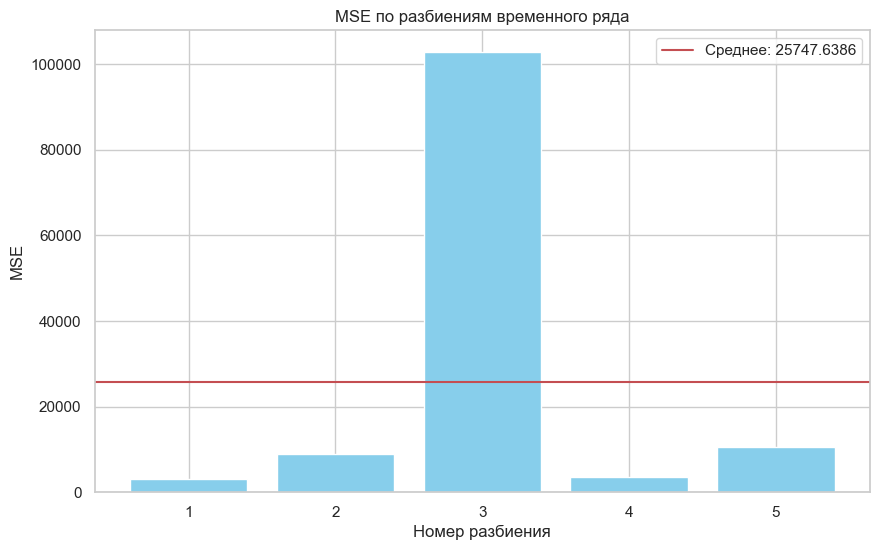

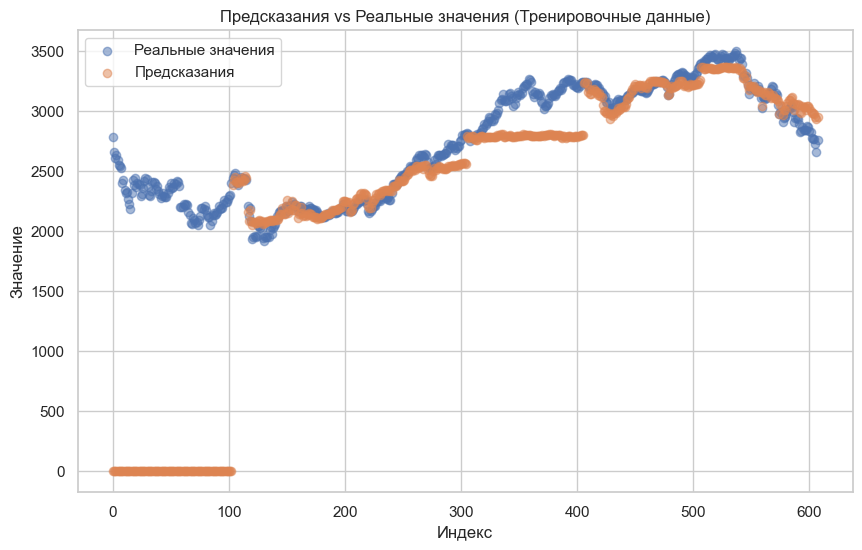

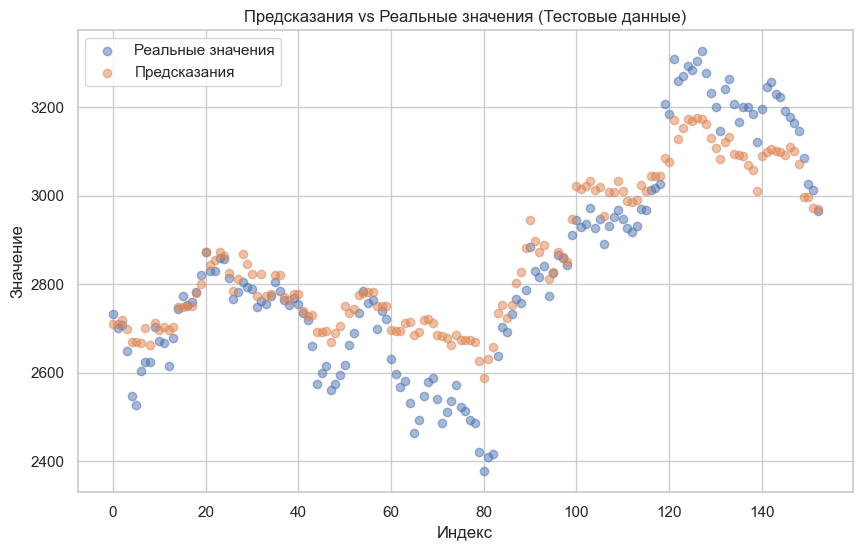

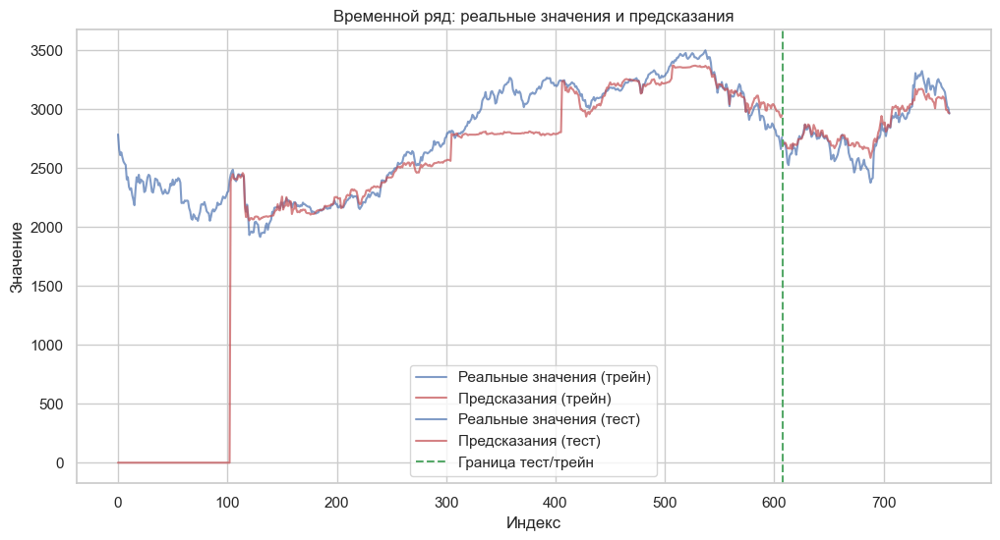

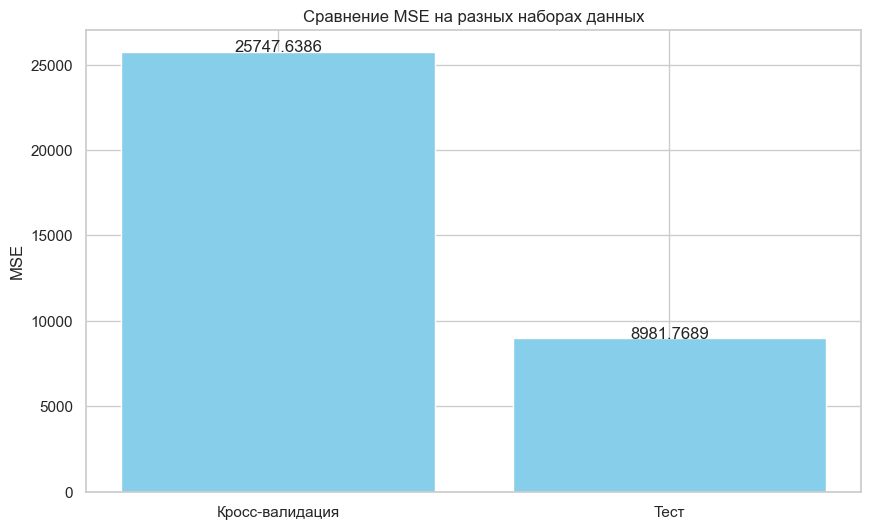

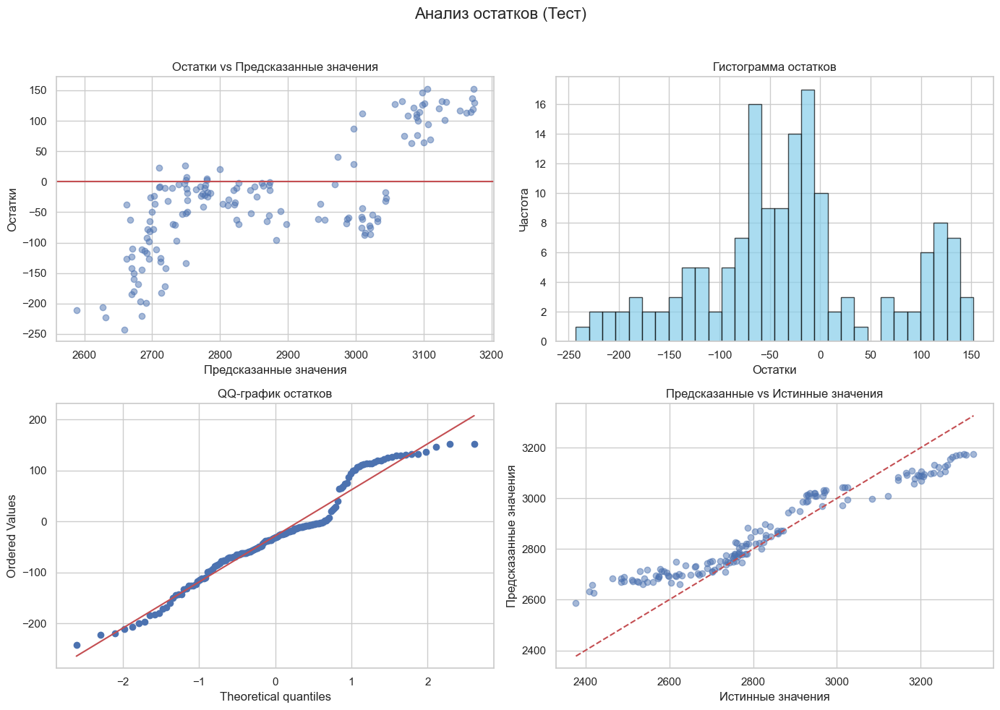

In [244]:
space_catboost = {
    'iterations':        hp.quniform('iterations', 500, 3000, 50),
    'depth':             hp.quniform('depth', 1, 6, 1),
    'learning_rate':     hp.uniform('learning_rate', 0.01, 0.075),
    'l2_leaf_reg':       hp.quniform('l2_leaf_reg', 3, 12, 1),
    'random_strength':   hp.uniform('random_strength', 0.0, 1.0),
    'bagging_temperature': hp.uniform('bagging_temperature', 0.25, 1.0),
    'bootstrap_type':    hp.choice('bootstrap_type', ['Bayesian']),

}
results = run_hyperopt_on_original(
    X_train=X_train_gbdt[model_features_gbdt],
    y_train=y_original_train_gbdt,
    X_test=X_test_gbdt[model_features_gbdt],
    y_test=y_original_test_gbdt,
    model_class=cb.CatBoostRegressor,
    space=space_catboost,
    n_iter=50,
    random_state=42
)

In [249]:
df_log = results['log_df']

display(df_log)

,iteration,iterations,depth,learning_rate,l2_leaf_reg,random_strength,bagging_temperature,random_seed,verbose,cv_rmse,test_rmse
0,1,2150,5,0.050,11,0.814,0.335,42,0,167.362,141.677
1,2,650,4,0.050,11,0.300,0.309,42,0,159.193,122.356
2,3,900,4,0.015,9,0.147,0.868,42,0,162.318,98.997
3,4,2250,1,0.024,8,0.404,0.626,42,0,133.289,101.725
4,5,1350,3,0.016,6,0.503,0.553,42,0,144.122,107.703
5,6,2300,6,0.020,7,0.755,0.672,42,0,188.858,166.132
6,7,2650,4,0.075,4,0.699,0.961,42,0,165.191,127.349
7,8,1350,2,0.064,10,0.064,0.803,42,0,149.416,104.343
8,9,1950,6,0.060,3,0.723,0.512,42,0,191.816,157.058
9,10,2250,4,0.041,7,0.325,0.774,42,0,151.776,103.788


In [251]:
def plot_hyperopt_param_influence(
    trials_df,
    params_to_plot=None,
    metric_col='test_rmse',
    title="Зависимость ошибки на тесте от гиперпараметров"
):
    """
    Визуализация влияния гиперпараметров на метрику (MSE/RMSE и др.) в виде сетки графиков.
    
    trials_df: DataFrame с результатами Hyperopt.
    params_to_plot: список параметров для отображения; если None - берём все, кроме служебных.
    metric_col: имя столбца с метрикой (например, 'test_mse', 'test_rmse').
    title: заголовок всей фигуры.
    """

    # Если список параметров не задан - берем все перебираемые числовые параметры
    if params_to_plot is None:
        service_cols = {'iteration', metric_col, 'cv_rmse', 'test_rmse', 'test_mse', 'random_seed', 'verbose'}
        params_to_plot = [col for col in trials_df.columns if col not in service_cols and
                          pd.api.types.is_numeric_dtype(trials_df[col])]

    n = len(params_to_plot)
    if n == 0:
        raise ValueError("Не найдено ни одного подходящего гиперпараметра для отображения.")

    # Умная разметка сетки
    ncols = 2 if n > 1 else 1
    nrows = (n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(8 * ncols, 4.5 * nrows))
    if n == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    sns.set_style("whitegrid")
    palette = sns.color_palette("coolwarm", as_cmap=True)

    for i, param in enumerate(params_to_plot):
        ax = axes[i]
        sns.scatterplot(
            data=trials_df,
            x=param,
            y=metric_col,
            hue=metric_col,
            palette=palette,
            size=metric_col,
            sizes=(20, 100),
            alpha=0.7,
            edgecolor="black",
            linewidth=0.5,
            ax=ax,
            legend=False
        )
        sns.regplot(
            data=trials_df,
            x=param,
            y=metric_col,
            scatter=False,
            lowess=True,
            color='red',
            line_kws={'linewidth': 2, 'linestyle': '--'},
            ax=ax
        )
        ax.set_title(f'{metric_col} vs {param}', fontsize=13, fontweight='bold')
        ax.set_xlabel(param, fontsize=12)
        ax.set_ylabel(metric_col, fontsize=12)
        ax.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)

    for j in range(n, len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle(title, fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

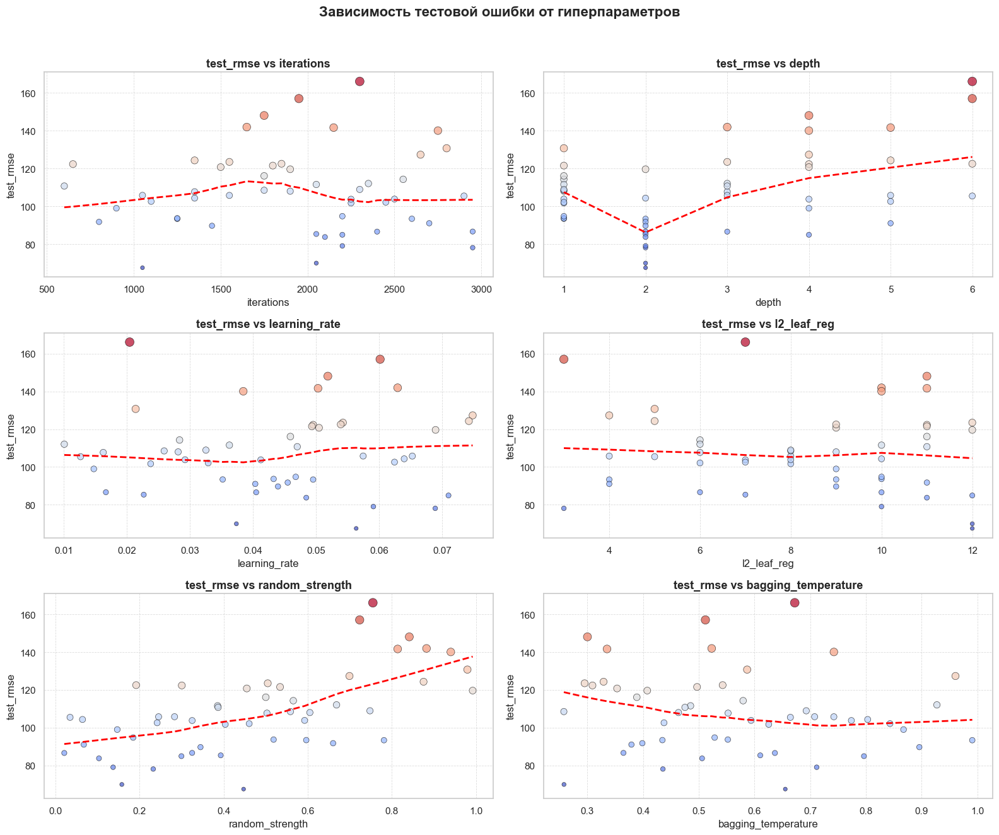

In [253]:
params_to_plot = [
    'iterations',
    'depth',
    'learning_rate',
    'l2_leaf_reg',
    'random_strength',
    'bagging_temperature'
    # 'subsample'
]

plot_hyperopt_param_influence(
    trials_df=df_log,
    params_to_plot=params_to_plot,
    metric_col='test_rmse',
    title="Зависимость тестовой ошибки от гиперпараметров"
)


## Коррекция для поиска оптимального набора гиперпараметров

In [287]:
shap_df_not_lags = shap_df[~shap_df['feature'].str.contains('lag', case=False, regex=False)]

In [289]:
list(shap_df_not_lags['feature'])

['moexfn_close',
 'gold_price_cubed',
 'moexch_close',
 'day',
 'nasdaq_price',
 'moexog_close',
 'usd_rub_price',
 'nasdaq_price_log',
 'days_since_start',
 'nasdaq_price_squared',
 'moexfn_close_squared',
 'west_price',
 'moexfn_close_cubed',
 'moexog_close_log',
 'weekday_sin',
 'brent_price',
 'brent_price_cubed',
 'moexcn_close_cubed',
 'usd_rub_price_cubed',
 'brent_price_squared',
 'weekday_cos',
 'moexog_close_cubed',
 'sp500_price',
 'moextl_close_squared',
 'moexmm_close',
 'eur_rub_price',
 'moexre_close_squared',
 'moextn_close_log',
 'eur_rub_price_squared',
 'cb_rate',
 'moextn_close_cubed',
 'eur_rub_price_log',
 'usd_rub_price_log',
 'sp500_price_squared',
 'moextn_close',
 'dayofyear_sin',
 'usd_rub_price_squared',
 'eur_rub_price_cubed',
 'moexfn_close_log',
 'moexch_close_cubed',
 'sp500_price_cubed',
 'gold_price',
 'weekday_group_cb',
 'moexit_close',
 'moexeu_close',
 'vix_price_log',
 'moexmm_close_squared',
 'moexcn_close',
 'gold_price_log',
 'gold_price_square

In [291]:
model_features_gbdt = ['moexfn_close',
 'gold_price_cubed',
 'moexch_close',
 'day',
 'nasdaq_price',
 'moexog_close',
 'usd_rub_price',
 'nasdaq_price_log',
 'days_since_start',
 'nasdaq_price_squared',
 'moexfn_close_squared',
 'west_price',
 'moexfn_close_cubed',
 'moexog_close_log',
 'weekday_sin',
 'brent_price',
 'brent_price_cubed',
 'moexcn_close_cubed',
 'usd_rub_price_cubed',
 'brent_price_squared',
 'weekday_cos',
 'moexog_close_cubed',
 'sp500_price',
 'moextl_close_squared',
 'moexmm_close',
 'eur_rub_price',
 'moexre_close_squared',
 'moextn_close_log',
 'eur_rub_price_squared',
 'cb_rate',
 'moextn_close_cubed',
 'eur_rub_price_log',
 'usd_rub_price_log',
 'sp500_price_squared',
 'moextn_close',
 'dayofyear_sin',
 'usd_rub_price_squared',
 'eur_rub_price_cubed',
 'moexfn_close_log',
 'moexch_close_cubed',
 'sp500_price_cubed',
 'gold_price',
 'weekday_group_cb',
 'moexit_close',
 'moexeu_close',
 'vix_price_log',
 'moexmm_close_squared',
 'moexcn_close',
 'gold_price_log',
 'gold_price_squared',
 'west_price_cubed',
 'moexre_close',
 'west_price_squared',
 'moextn_close_squared',
 'moextl_close',
 'moexre_close_cubed',
 'moextl_close_log',
 'moexit_close_squared',
 'moexre_close_log',
 'dxy_price_log',
 'brent_price_log',
 'weekday',
 'dxy_price',
 'days_since_holiday',
 'dayofyear',
 'rvi_price',
 'moexch_close_squared',
 'west_price_log',
 'dxy_price_cubed',
 'days_until_holiday',
 'moexeu_close_cubed',
 'moextl_close_cubed',
 'rvi_price_cubed',
 'moexog_close_squared',
 'djia_price',
 'djia_price_log',
 'moexmm_close_log',
 'djia_price_squared',
 'moexmm_close_cubed',
 'nasdaq_price_cubed',
 'rvi_price_squared',
 'sp500_price_log',
 'month_sin',
 'rvi_price_log',
 'vix_price',
 'vix_price_cubed',
 'season_cb',
 'dayofyear_cos',
 'moexch_close_log',
 'moexeu_close_log',
 'moexcn_close_log',
 'is_monday',
 'is_quarter_end',
 'moexit_close_log',
 'djia_price_cubed',
 'week_of_month',
 'moexit_close_cubed',
 'week',
 'moexeu_close_squared',
 'dxy_price_squared',
 'before_holiday_7d',
 'is_quarter_start',
 'moexcn_close_squared',
 'vix_price_squared',
 'before_holiday_2d',
 'before_holiday_1d',
 'is_month_start',
 'month_cos',
 'is_friday',
 'before_holiday_14d',
 'is_day_after_long_weekend',
 'quarter',
 'after_holiday_3d',
 'after_holiday_1d',
 'after_holiday_2d',
 'after_holiday_14d',
 'is_month_end',
 'before_holiday_3d',
 'month',
 'is_long_weekend',
 'holiday_name_cb',
 'is_day_before_long_weekend',
 'after_holiday_7d',
 'is_holiday',
 'is_holiday_int']

In [319]:
selected_features_gbdt = filter_features_by_shap_and_correlation(
    shap_df=shap_df_not_lags,
    X=X_test_gbdt[model_features_gbdt],
    shap_values=shap_values,
    threshold=0.95,
    corr_threshold=0.99
)
print(selected_features_gbdt)

['moexfn_close', 'gold_price_cubed', 'moexch_close', 'day', 'nasdaq_price', 'moexog_close', 'usd_rub_price', 'days_since_start', 'west_price', 'weekday_sin', 'brent_price', 'moexcn_close_cubed', 'weekday_cos', 'sp500_price', 'moextl_close_squared', 'moexmm_close', 'eur_rub_price', 'moexre_close_squared', 'moextn_close_log', 'cb_rate', 'dayofyear_sin', 'weekday_group_cb', 'moexit_close', 'moexeu_close', 'vix_price_log', 'dxy_price_log', 'weekday', 'days_since_holiday', 'dayofyear', 'rvi_price', 'days_until_holiday', 'rvi_price_cubed', 'djia_price', 'djia_price_squared', 'month_sin', 'vix_price_cubed']


Hyperopt:   0%|                                                                                | 0/100 [00:00<?, ?it/s]


===> Запуск objective, итерация 1 <===
  [Objective] Параметры: {'iterations': 2150, 'depth': 4, 'learning_rate': 0.05030773484898167, 'l2_leaf_reg': 11, 'random_strength': 0.8136554076402878, 'bagging_temperature': 0.3353472003877054, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.43 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.66 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.97 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 3.06 сек
  [Objective] mean_cv_rmse: 184.4463
  [Objective] Финальное обучение на всём трейне...
[1] Params: {'iterations': 2150, 'depth': 4, 'learning_rate': 0.05030773484898167, 'l2_leaf_reg': 11, 'random_strength': 0.8136554076402878, 'bagging_temperature': 0.3353472003877054, 'random_seed': 42, 'verbose': 0} | CV RMSE: 184.4463 | Test RMSE: 145.1368


Hyperopt:   1%|▋                                                                       | 1/100 [00:13<21:27, 13.01s/it]


===> Запуск objective, итерация 2 <===
  [Objective] Параметры: {'iterations': 650, 'depth': 3, 'learning_rate': 0.04953619554112388, 'l2_leaf_reg': 11, 'random_strength': 0.30042135479050835, 'bagging_temperature': 0.30923745987680984, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.42 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.49 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.53 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.62 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.60 сек
  [Objective] mean_cv_rmse: 156.6711
  [Objective] Финальное обучение на всём трейне...
[2] Params: {'iterations': 650, 'depth': 3, 'learning_rate': 0.04953619554112388, 'l2_leaf_reg': 11, 'random_strength': 0.30042135479050835, 'bagging_temperature': 0.30923745987680984, 'random_seed': 42, 'verbose': 0} | CV RMSE: 156.6711 | Test RMSE: 77.9907


Hyperopt:   2%|█▍                                                                      | 2/100 [00:16<11:56,  7.32s/it]


===> Запуск objective, итерация 3 <===
  [Objective] Параметры: {'iterations': 900, 'depth': 3, 'learning_rate': 0.014787966654284068, 'l2_leaf_reg': 9, 'random_strength': 0.14696278728502776, 'bagging_temperature': 0.8675740096434263, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.55 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.62 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.73 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.74 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.71 сек
  [Objective] mean_cv_rmse: 162.6888
  [Objective] Финальное обучение на всём трейне...
[3] Params: {'iterations': 900, 'depth': 3, 'learning_rate': 0.014787966654284068, 'l2_leaf_reg': 9, 'random_strength': 0.14696278728502776, 'bagging_temperature': 0.8675740096434263, 'random_seed': 42, 'verbose': 0} | CV RMSE: 162.6888 | Test RMSE: 96.5736


Hyperopt:   3%|██▏                                                                     | 3/100 [00:20<09:29,  5.87s/it]


===> Запуск objective, итерация 4 <===
  [Objective] Параметры: {'iterations': 2250, 'depth': 2, 'learning_rate': 0.02379411260456679, 'l2_leaf_reg': 8, 'random_strength': 0.4037776702619792, 'bagging_temperature': 0.6255629574213046, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.92 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.09 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.20 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.23 сек
  [Objective] mean_cv_rmse: 150.2153
  [Objective] Финальное обучение на всём трейне...
[4] Params: {'iterations': 2250, 'depth': 2, 'learning_rate': 0.02379411260456679, 'l2_leaf_reg': 8, 'random_strength': 0.4037776702619792, 'bagging_temperature': 0.6255629574213046, 'random_seed': 42, 'verbose': 0} | CV RMSE: 150.2153 | Test RMSE: 94.4833


Hyperopt:   4%|██▉                                                                     | 4/100 [00:27<10:09,  6.35s/it]


===> Запуск objective, итерация 5 <===
  [Objective] Параметры: {'iterations': 1350, 'depth': 3, 'learning_rate': 0.016281901969005596, 'l2_leaf_reg': 6, 'random_strength': 0.5029037546614818, 'bagging_temperature': 0.5526771559933648, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.78 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.97 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.05 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.06 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.11 сек
  [Objective] mean_cv_rmse: 162.4593
  [Objective] Финальное обучение на всём трейне...
[5] Params: {'iterations': 1350, 'depth': 3, 'learning_rate': 0.016281901969005596, 'l2_leaf_reg': 6, 'random_strength': 0.5029037546614818, 'bagging_temperature': 0.5526771559933648, 'random_seed': 42, 'verbose': 0} | CV RMSE: 162.4593 | Test RMSE: 112.3682


Hyperopt:   5%|███▌                                                                    | 5/100 [00:33<09:54,  6.26s/it]


===> Запуск objective, итерация 6 <===
  [Objective] Параметры: {'iterations': 2300, 'depth': 4, 'learning_rate': 0.02046656706013647, 'l2_leaf_reg': 7, 'random_strength': 0.754727360264789, 'bagging_temperature': 0.6723133186585076, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.72 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.58 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.56 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.68 сек
  [Objective] mean_cv_rmse: 176.8835
  [Objective] Финальное обучение на всём трейне...
[6] Params: {'iterations': 2300, 'depth': 4, 'learning_rate': 0.02046656706013647, 'l2_leaf_reg': 7, 'random_strength': 0.754727360264789, 'bagging_temperature': 0.6723133186585076, 'random_seed': 42, 'verbose': 0} | CV RMSE: 176.8835 | Test RMSE: 136.0538


Hyperopt:   6%|████▎                                                                   | 6/100 [00:48<14:15,  9.11s/it]


===> Запуск objective, итерация 7 <===
  [Objective] Параметры: {'iterations': 2650, 'depth': 3, 'learning_rate': 0.07480416864350686, 'l2_leaf_reg': 4, 'random_strength': 0.6990785947415082, 'bagging_temperature': 0.9607808039897694, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.61 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.10 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.16 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.21 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.21 сек
  [Objective] mean_cv_rmse: 149.1175
  [Objective] Финальное обучение на всём трейне...
[7] Params: {'iterations': 2650, 'depth': 3, 'learning_rate': 0.07480416864350686, 'l2_leaf_reg': 4, 'random_strength': 0.6990785947415082, 'bagging_temperature': 0.9607808039897694, 'random_seed': 42, 'verbose': 0} | CV RMSE: 149.1175 | Test RMSE: 94.4399


Hyperopt:   7%|█████                                                                   | 7/100 [01:00<15:52, 10.24s/it]


===> Запуск objective, итерация 8 <===
  [Objective] Параметры: {'iterations': 1350, 'depth': 2, 'learning_rate': 0.06395582610421123, 'l2_leaf_reg': 10, 'random_strength': 0.06428686330954925, 'bagging_temperature': 0.8031863115059663, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.56 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.72 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.82 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.79 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.86 сек
  [Objective] mean_cv_rmse: 144.3181
  [Objective] Финальное обучение на всём трейне...
[8] Params: {'iterations': 1350, 'depth': 2, 'learning_rate': 0.06395582610421123, 'l2_leaf_reg': 10, 'random_strength': 0.06428686330954925, 'bagging_temperature': 0.8031863115059663, 'random_seed': 42, 'verbose': 0} | CV RMSE: 144.3181 | Test RMSE: 67.2812


Hyperopt:   8%|█████▊                                                                  | 8/100 [01:05<12:57,  8.45s/it]


===> Запуск objective, итерация 9 <===
  [Objective] Параметры: {'iterations': 1950, 'depth': 4, 'learning_rate': 0.06013975314372943, 'l2_leaf_reg': 3, 'random_strength': 0.7232984036743606, 'bagging_temperature': 0.5119427101264535, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.62 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.63 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.90 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.49 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.33 сек
  [Objective] mean_cv_rmse: 196.1791
  [Objective] Финальное обучение на всём трейне...
[9] Params: {'iterations': 1950, 'depth': 4, 'learning_rate': 0.06013975314372943, 'l2_leaf_reg': 3, 'random_strength': 0.7232984036743606, 'bagging_temperature': 0.5119427101264535, 'random_seed': 42, 'verbose': 0} | CV RMSE: 196.1791 | Test RMSE: 145.4979


Hyperopt:   9%|██████▍                                                                 | 9/100 [01:20<15:43, 10.36s/it]


===> Запуск objective, итерация 10 <===
  [Objective] Параметры: {'iterations': 2250, 'depth': 3, 'learning_rate': 0.04123621596623068, 'l2_leaf_reg': 7, 'random_strength': 0.32503239273547446, 'bagging_temperature': 0.7739184311336015, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.37 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.80 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.94 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.88 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.96 сек
  [Objective] mean_cv_rmse: 152.6489
  [Objective] Финальное обучение на всём трейне...
[10] Params: {'iterations': 2250, 'depth': 3, 'learning_rate': 0.04123621596623068, 'l2_leaf_reg': 7, 'random_strength': 0.32503239273547446, 'bagging_temperature': 0.7739184311336015, 'random_seed': 42, 'verbose': 0} | CV RMSE: 152.6489 | Test RMSE: 89.7094


Hyperopt:  10%|███████                                                                | 10/100 [01:30<15:48, 10.54s/it]


===> Запуск objective, итерация 11 <===
  [Objective] Параметры: {'iterations': 2900, 'depth': 4, 'learning_rate': 0.012681923229109326, 'l2_leaf_reg': 5, 'random_strength': 0.0347034358568199, 'bagging_temperature': 0.6644877411131515, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 3.17 сек
  [CV] fold 3: train=305, val=101
    fit OK за 3.65 сек
  [CV] fold 4: train=406, val=101
    fit OK за 3.40 сек
  [CV] fold 5: train=507, val=101
    fit OK за 3.74 сек
  [Objective] mean_cv_rmse: 173.1814
  [Objective] Финальное обучение на всём трейне...
[11] Params: {'iterations': 2900, 'depth': 4, 'learning_rate': 0.012681923229109326, 'l2_leaf_reg': 5, 'random_strength': 0.0347034358568199, 'bagging_temperature': 0.6644877411131515, 'random_seed': 42, 'verbose': 0} | CV RMSE: 173.1814 | Test RMSE: 95.1960


Hyperopt:  11%|███████▊                                                               | 11/100 [01:50<19:52, 13.40s/it]


===> Запуск objective, итерация 12 <===
  [Objective] Параметры: {'iterations': 1250, 'depth': 3, 'learning_rate': 0.049529905019153865, 'l2_leaf_reg': 4, 'random_strength': 0.7810878336638913, 'bagging_temperature': 0.9909348830578351, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.72 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.92 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.02 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.02 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.01 сек
  [Objective] mean_cv_rmse: 155.6605
  [Objective] Финальное обучение на всём трейне...
[12] Params: {'iterations': 1250, 'depth': 3, 'learning_rate': 0.049529905019153865, 'l2_leaf_reg': 4, 'random_strength': 0.7810878336638913, 'bagging_temperature': 0.9909348830578351, 'random_seed': 42, 'verbose': 0} | CV RMSE: 155.6605 | Test RMSE: 107.8463


Hyperopt:  12%|████████▌                                                              | 12/100 [01:56<16:14, 11.08s/it]


===> Запуск objective, итерация 13 <===
  [Objective] Параметры: {'iterations': 1050, 'depth': 4, 'learning_rate': 0.05745257402353351, 'l2_leaf_reg': 8, 'random_strength': 0.2831609380301049, 'bagging_temperature': 0.7079684796214647, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.87 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.04 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.31 сек
  [Objective] mean_cv_rmse: 182.2984
  [Objective] Финальное обучение на всём трейне...
[13] Params: {'iterations': 1050, 'depth': 4, 'learning_rate': 0.05745257402353351, 'l2_leaf_reg': 8, 'random_strength': 0.2831609380301049, 'bagging_temperature': 0.7079684796214647, 'random_seed': 42, 'verbose': 0} | CV RMSE: 182.2984 | Test RMSE: 128.3058


Hyperopt:  13%|█████████▏                                                             | 13/100 [02:03<14:16,  9.85s/it]


===> Запуск objective, итерация 14 <===
  [Objective] Параметры: {'iterations': 2700, 'depth': 4, 'learning_rate': 0.04036465677930141, 'l2_leaf_reg': 4, 'random_strength': 0.06742292379410941, 'bagging_temperature': 0.37920325352081236, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.05 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.73 сек
  [CV] fold 3: train=305, val=101
    fit OK за 3.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 3.89 сек
  [CV] fold 5: train=507, val=101
    fit OK за 3.52 сек
  [Objective] mean_cv_rmse: 164.9377
  [Objective] Финальное обучение на всём трейне...
[14] Params: {'iterations': 2700, 'depth': 4, 'learning_rate': 0.04036465677930141, 'l2_leaf_reg': 4, 'random_strength': 0.06742292379410941, 'bagging_temperature': 0.37920325352081236, 'random_seed': 42, 'verbose': 0} | CV RMSE: 164.9377 | Test RMSE: 104.5870


Hyperopt:  14%|█████████▉                                                             | 14/100 [02:22<18:05, 12.62s/it]


===> Запуск objective, итерация 15 <===
  [Objective] Параметры: {'iterations': 2950, 'depth': 2, 'learning_rate': 0.06887255631622251, 'l2_leaf_reg': 3, 'random_strength': 0.232460637469597, 'bagging_temperature': 0.43564366930304804, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.39 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.54 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.83 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.88 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.89 сек
  [Objective] mean_cv_rmse: 154.1716
  [Objective] Финальное обучение на всём трейне...
[15] Params: {'iterations': 2950, 'depth': 2, 'learning_rate': 0.06887255631622251, 'l2_leaf_reg': 3, 'random_strength': 0.232460637469597, 'bagging_temperature': 0.43564366930304804, 'random_seed': 42, 'verbose': 0} | CV RMSE: 154.1716 | Test RMSE: 64.1251


Hyperopt:  15%|██████████▋                                                            | 15/100 [02:33<16:56, 11.96s/it]


===> Запуск objective, итерация 16 <===
  [Objective] Параметры: {'iterations': 1350, 'depth': 4, 'learning_rate': 0.07420291877740229, 'l2_leaf_reg': 5, 'random_strength': 0.8752476091491476, 'bagging_temperature': 0.32917157365608585, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.18 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.54 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.71 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.71 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.70 сек
  [Objective] mean_cv_rmse: 194.8146
  [Objective] Финальное обучение на всём трейне...
[16] Params: {'iterations': 1350, 'depth': 4, 'learning_rate': 0.07420291877740229, 'l2_leaf_reg': 5, 'random_strength': 0.8752476091491476, 'bagging_temperature': 0.32917157365608585, 'random_seed': 42, 'verbose': 0} | CV RMSE: 194.8146 | Test RMSE: 150.0986


Hyperopt:  16%|███████████▎                                                           | 16/100 [02:42<15:43, 11.24s/it]


===> Запуск objective, итерация 17 <===
  [Objective] Параметры: {'iterations': 1650, 'depth': 3, 'learning_rate': 0.06291542538407847, 'l2_leaf_reg': 10, 'random_strength': 0.882267604974632, 'bagging_temperature': 0.5232362844565162, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.05 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.48 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.53 сек
  [Objective] mean_cv_rmse: 149.0055
  [Objective] Финальное обучение на всём трейне...
[17] Params: {'iterations': 1650, 'depth': 3, 'learning_rate': 0.06291542538407847, 'l2_leaf_reg': 10, 'random_strength': 0.882267604974632, 'bagging_temperature': 0.5232362844565162, 'random_seed': 42, 'verbose': 0} | CV RMSE: 149.0055 | Test RMSE: 123.7934


Hyperopt:  17%|████████████                                                           | 17/100 [02:51<14:20, 10.37s/it]


===> Запуск objective, итерация 18 <===
  [Objective] Параметры: {'iterations': 2950, 'depth': 2, 'learning_rate': 0.016700334298876504, 'l2_leaf_reg': 6, 'random_strength': 0.3249490313631097, 'bagging_temperature': 0.36483846003928466, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.56 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.73 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.82 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.86 сек
  [Objective] mean_cv_rmse: 146.8372
  [Objective] Финальное обучение на всём трейне...
[18] Params: {'iterations': 2950, 'depth': 2, 'learning_rate': 0.016700334298876504, 'l2_leaf_reg': 6, 'random_strength': 0.3249490313631097, 'bagging_temperature': 0.36483846003928466, 'random_seed': 42, 'verbose': 0} | CV RMSE: 146.8372 | Test RMSE: 95.6893


Hyperopt:  18%|████████████▊                                                          | 18/100 [03:01<14:06, 10.32s/it]


===> Запуск objective, итерация 19 <===
  [Objective] Параметры: {'iterations': 1550, 'depth': 3, 'learning_rate': 0.06524057021534155, 'l2_leaf_reg': 4, 'random_strength': 0.2452135488808661, 'bagging_temperature': 0.7424860532902351, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.95 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.19 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.37 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.40 сек
  [Objective] mean_cv_rmse: 152.2423
  [Objective] Финальное обучение на всём трейне...
[19] Params: {'iterations': 1550, 'depth': 3, 'learning_rate': 0.06524057021534155, 'l2_leaf_reg': 4, 'random_strength': 0.2452135488808661, 'bagging_temperature': 0.7424860532902351, 'random_seed': 42, 'verbose': 0} | CV RMSE: 152.2423 | Test RMSE: 79.1837


Hyperopt:  19%|█████████████▍                                                         | 19/100 [03:08<12:52,  9.54s/it]


===> Запуск objective, итерация 20 <===
  [Objective] Параметры: {'iterations': 1050, 'depth': 3, 'learning_rate': 0.0563478938984378, 'l2_leaf_reg': 12, 'random_strength': 0.4473235949869818, 'bagging_temperature': 0.6553480894116274, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.63 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.83 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.94 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.99 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.05 сек
  [Objective] mean_cv_rmse: 151.7134
  [Objective] Финальное обучение на всём трейне...
[20] Params: {'iterations': 1050, 'depth': 3, 'learning_rate': 0.0563478938984378, 'l2_leaf_reg': 12, 'random_strength': 0.4473235949869818, 'bagging_temperature': 0.6553480894116274, 'random_seed': 42, 'verbose': 0} | CV RMSE: 151.7134 | Test RMSE: 98.8309


Hyperopt:  20%|██████████████▏                                                        | 20/100 [03:14<11:06,  8.33s/it]


===> Запуск objective, итерация 21 <===
  [Objective] Параметры: {'iterations': 1900, 'depth': 2, 'learning_rate': 0.030024973954813496, 'l2_leaf_reg': 10, 'random_strength': 0.5564449058709577, 'bagging_temperature': 0.8398519888597132, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.83 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.09 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.13 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.20 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.23 сек
  [Objective] mean_cv_rmse: 148.8033
  [Objective] Финальное обучение на всём трейне...
[21] Params: {'iterations': 1900, 'depth': 2, 'learning_rate': 0.030024973954813496, 'l2_leaf_reg': 10, 'random_strength': 0.5564449058709577, 'bagging_temperature': 0.8398519888597132, 'random_seed': 42, 'verbose': 0} | CV RMSE: 148.8033 | Test RMSE: 99.4541


Hyperopt:  21%|██████████████▉                                                        | 21/100 [03:21<10:19,  7.84s/it]


===> Запуск objective, итерация 22 <===
  [Objective] Параметры: {'iterations': 650, 'depth': 2, 'learning_rate': 0.035794967953862895, 'l2_leaf_reg': 6, 'random_strength': 0.11306292145659702, 'bagging_temperature': 0.8924660266127179, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.38 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.46 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.39 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.42 сек
  [Objective] mean_cv_rmse: 154.2840
  [Objective] Финальное обучение на всём трейне...
[22] Params: {'iterations': 650, 'depth': 2, 'learning_rate': 0.035794967953862895, 'l2_leaf_reg': 6, 'random_strength': 0.11306292145659702, 'bagging_temperature': 0.8924660266127179, 'random_seed': 42, 'verbose': 0} | CV RMSE: 154.2840 | Test RMSE: 72.2415


Hyperopt:  22%|███████████████▌                                                       | 22/100 [03:23<08:04,  6.22s/it]


===> Запуск objective, итерация 23 <===
  [Objective] Параметры: {'iterations': 1550, 'depth': 2, 'learning_rate': 0.03136325159563602, 'l2_leaf_reg': 9, 'random_strength': 0.6054413029063072, 'bagging_temperature': 0.2555491333791187, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.72 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.82 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.89 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.97 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.03 сек
  [Objective] mean_cv_rmse: 151.5436
  [Objective] Финальное обучение на всём трейне...
[23] Params: {'iterations': 1550, 'depth': 2, 'learning_rate': 0.03136325159563602, 'l2_leaf_reg': 9, 'random_strength': 0.6054413029063072, 'bagging_temperature': 0.2555491333791187, 'random_seed': 42, 'verbose': 0} | CV RMSE: 151.5436 | Test RMSE: 95.5688


Hyperopt:  23%|████████████████▎                                                      | 23/100 [03:29<07:42,  6.00s/it]


===> Запуск objective, итерация 24 <===
  [Objective] Параметры: {'iterations': 1900, 'depth': 2, 'learning_rate': 0.07017268170793509, 'l2_leaf_reg': 12, 'random_strength': 0.19083526007391308, 'bagging_temperature': 0.8116802404803674, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.88 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.10 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.20 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.28 сек
  [Objective] mean_cv_rmse: 149.5298
  [Objective] Финальное обучение на всём трейне...
[24] Params: {'iterations': 1900, 'depth': 2, 'learning_rate': 0.07017268170793509, 'l2_leaf_reg': 12, 'random_strength': 0.19083526007391308, 'bagging_temperature': 0.8116802404803674, 'random_seed': 42, 'verbose': 0} | CV RMSE: 149.5298 | Test RMSE: 77.9266


Hyperopt:  24%|█████████████████                                                      | 24/100 [03:36<08:01,  6.33s/it]


===> Запуск objective, итерация 25 <===
  [Objective] Параметры: {'iterations': 850, 'depth': 2, 'learning_rate': 0.027388695174172875, 'l2_leaf_reg': 6, 'random_strength': 0.024227450298803355, 'bagging_temperature': 0.44064766401506283, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.47 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.53 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.48 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.51 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.48 сек
  [Objective] mean_cv_rmse: 156.5937
  [Objective] Финальное обучение на всём трейне...
[25] Params: {'iterations': 850, 'depth': 2, 'learning_rate': 0.027388695174172875, 'l2_leaf_reg': 6, 'random_strength': 0.024227450298803355, 'bagging_temperature': 0.44064766401506283, 'random_seed': 42, 'verbose': 0} | CV RMSE: 156.5937 | Test RMSE: 73.7164


Hyperopt:  25%|█████████████████▊                                                     | 25/100 [03:39<06:40,  5.34s/it]


===> Запуск objective, итерация 26 <===
  [Objective] Параметры: {'iterations': 2500, 'depth': 2, 'learning_rate': 0.03567142887600337, 'l2_leaf_reg': 9, 'random_strength': 0.3852986533138395, 'bagging_temperature': 0.5747012847233126, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.95 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.33 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.58 сек
  [Objective] mean_cv_rmse: 145.8153
  [Objective] Финальное обучение на всём трейне...
[26] Params: {'iterations': 2500, 'depth': 2, 'learning_rate': 0.03567142887600337, 'l2_leaf_reg': 9, 'random_strength': 0.3852986533138395, 'bagging_temperature': 0.5747012847233126, 'random_seed': 42, 'verbose': 0} | CV RMSE: 145.8153 | Test RMSE: 96.8352


Hyperopt:  26%|██████████████████▍                                                    | 26/100 [03:47<07:33,  6.12s/it]


===> Запуск objective, итерация 27 <===
  [Objective] Параметры: {'iterations': 2500, 'depth': 2, 'learning_rate': 0.045997053594677, 'l2_leaf_reg': 9, 'random_strength': 0.9980691167227191, 'bagging_temperature': 0.9408698094675167, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.04 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.09 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.34 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.32 сек
  [Objective] mean_cv_rmse: 142.2421
  [Objective] Финальное обучение на всём трейне...
[27] Params: {'iterations': 2500, 'depth': 2, 'learning_rate': 0.045997053594677, 'l2_leaf_reg': 9, 'random_strength': 0.9980691167227191, 'bagging_temperature': 0.9408698094675167, 'random_seed': 42, 'verbose': 0} | CV RMSE: 142.2421 | Test RMSE: 120.3437


Hyperopt:  27%|███████████████████▏                                                   | 27/100 [03:54<07:56,  6.53s/it]


===> Запуск objective, итерация 28 <===
  [Objective] Параметры: {'iterations': 1750, 'depth': 2, 'learning_rate': 0.04558784716708317, 'l2_leaf_reg': 10, 'random_strength': 0.9854024149640741, 'bagging_temperature': 0.9021649458987029, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.68 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.79 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.91 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.97 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.00 сек
  [Objective] mean_cv_rmse: 145.3136
  [Objective] Финальное обучение на всём трейне...
[28] Params: {'iterations': 1750, 'depth': 2, 'learning_rate': 0.04558784716708317, 'l2_leaf_reg': 10, 'random_strength': 0.9854024149640741, 'bagging_temperature': 0.9021649458987029, 'random_seed': 42, 'verbose': 0} | CV RMSE: 145.3136 | Test RMSE: 121.3112


Hyperopt:  28%|███████████████████▉                                                   | 28/100 [04:00<07:27,  6.21s/it]


===> Запуск objective, итерация 29 <===
  [Objective] Параметры: {'iterations': 2050, 'depth': 2, 'learning_rate': 0.05606407471670233, 'l2_leaf_reg': 11, 'random_strength': 0.6309314632426964, 'bagging_temperature': 0.9430074438530448, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.91 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.99 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.17 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.14 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.17 сек
  [Objective] mean_cv_rmse: 146.3985
  [Objective] Финальное обучение на всём трейне...
[29] Params: {'iterations': 2050, 'depth': 2, 'learning_rate': 0.05606407471670233, 'l2_leaf_reg': 11, 'random_strength': 0.6309314632426964, 'bagging_temperature': 0.9430074438530448, 'random_seed': 42, 'verbose': 0} | CV RMSE: 146.3985 | Test RMSE: 82.4345


Hyperopt:  29%|████████████████████▌                                                  | 29/100 [04:06<07:28,  6.32s/it]


===> Запуск objective, итерация 30 <===
  [Objective] Параметры: {'iterations': 2450, 'depth': 2, 'learning_rate': 0.052580091101930765, 'l2_leaf_reg': 10, 'random_strength': 0.9857440216223889, 'bagging_temperature': 0.9862871625737272, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.95 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.55 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.51 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.55 сек
  [Objective] mean_cv_rmse: 144.3359
  [Objective] Финальное обучение на всём трейне...
[30] Params: {'iterations': 2450, 'depth': 2, 'learning_rate': 0.052580091101930765, 'l2_leaf_reg': 10, 'random_strength': 0.9857440216223889, 'bagging_temperature': 0.9862871625737272, 'random_seed': 42, 'verbose': 0} | CV RMSE: 144.3359 | Test RMSE: 98.9839


Hyperopt:  30%|█████████████████████▎                                                 | 30/100 [04:15<08:05,  6.93s/it]


===> Запуск objective, итерация 31 <===
  [Objective] Параметры: {'iterations': 1200, 'depth': 2, 'learning_rate': 0.04693787880485702, 'l2_leaf_reg': 11, 'random_strength': 0.8807991254914815, 'bagging_temperature': 0.7716945368285946, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.53 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.62 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.67 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.69 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.74 сек
  [Objective] mean_cv_rmse: 146.4550
  [Objective] Финальное обучение на всём трейне...
[31] Params: {'iterations': 1200, 'depth': 2, 'learning_rate': 0.04693787880485702, 'l2_leaf_reg': 11, 'random_strength': 0.8807991254914815, 'bagging_temperature': 0.7716945368285946, 'random_seed': 42, 'verbose': 0} | CV RMSE: 146.4550 | Test RMSE: 115.9902


Hyperopt:  31%|██████████████████████                                                 | 31/100 [04:19<06:58,  6.06s/it]


===> Запуск objective, итерация 32 <===
  [Objective] Параметры: {'iterations': 2700, 'depth': 2, 'learning_rate': 0.05310513485150863, 'l2_leaf_reg': 11, 'random_strength': 0.6602735262491535, 'bagging_temperature': 0.9311005937053254, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.06 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.56 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.85 сек
  [Objective] mean_cv_rmse: 150.7078
  [Objective] Финальное обучение на всём трейне...
[32] Params: {'iterations': 2700, 'depth': 2, 'learning_rate': 0.05310513485150863, 'l2_leaf_reg': 11, 'random_strength': 0.6602735262491535, 'bagging_temperature': 0.9311005937053254, 'random_seed': 42, 'verbose': 0} | CV RMSE: 150.7078 | Test RMSE: 100.5752


Hyperopt:  32%|██████████████████████▋                                                | 32/100 [04:28<07:56,  7.01s/it]


===> Запуск objective, итерация 33 <===
  [Objective] Параметры: {'iterations': 1750, 'depth': 2, 'learning_rate': 0.06670510691181343, 'l2_leaf_reg': 9, 'random_strength': 0.5387360847897302, 'bagging_temperature': 0.8226935822924331, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.99 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.15 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.16 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.35 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.24 сек
  [Objective] mean_cv_rmse: 152.8402
  [Objective] Финальное обучение на всём трейне...
[33] Params: {'iterations': 1750, 'depth': 2, 'learning_rate': 0.06670510691181343, 'l2_leaf_reg': 9, 'random_strength': 0.5387360847897302, 'bagging_temperature': 0.8226935822924331, 'random_seed': 42, 'verbose': 0} | CV RMSE: 152.8402 | Test RMSE: 85.6612


Hyperopt:  33%|███████████████████████▍                                               | 33/100 [04:35<07:51,  7.04s/it]


===> Запуск objective, итерация 34 <===
  [Objective] Параметры: {'iterations': 600, 'depth': 2, 'learning_rate': 0.03708055256595909, 'l2_leaf_reg': 8, 'random_strength': 0.9437484720889592, 'bagging_temperature': 0.8657797272216468, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.44 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.41 сек
  [Objective] mean_cv_rmse: 154.8493
  [Objective] Финальное обучение на всём трейне...
[34] Params: {'iterations': 600, 'depth': 2, 'learning_rate': 0.03708055256595909, 'l2_leaf_reg': 8, 'random_strength': 0.9437484720889592, 'bagging_temperature': 0.8657797272216468, 'random_seed': 42, 'verbose': 0} | CV RMSE: 154.8493 | Test RMSE: 100.6763


Hyperopt:  34%|████████████████████████▏                                              | 34/100 [04:37<06:13,  5.66s/it]


===> Запуск objective, итерация 35 <===
  [Objective] Параметры: {'iterations': 1450, 'depth': 3, 'learning_rate': 0.04510526531673909, 'l2_leaf_reg': 12, 'random_strength': 0.4392318174144015, 'bagging_temperature': 0.7231023574133469, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.05 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.40 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.59 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.51 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.44 сек
  [Objective] mean_cv_rmse: 154.2337
  [Objective] Финальное обучение на всём трейне...
[35] Params: {'iterations': 1450, 'depth': 3, 'learning_rate': 0.04510526531673909, 'l2_leaf_reg': 12, 'random_strength': 0.4392318174144015, 'bagging_temperature': 0.7231023574133469, 'random_seed': 42, 'verbose': 0} | CV RMSE: 154.2337 | Test RMSE: 102.5685


Hyperopt:  35%|████████████████████████▊                                              | 35/100 [04:46<07:02,  6.50s/it]


===> Запуск objective, итерация 36 <===
  [Objective] Параметры: {'iterations': 800, 'depth': 2, 'learning_rate': 0.06096257941712743, 'l2_leaf_reg': 7, 'random_strength': 0.8200023932880256, 'bagging_temperature': 0.5949815267106306, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.36 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.45 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.51 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.53 сек
  [Objective] mean_cv_rmse: 149.8185
  [Objective] Финальное обучение на всём трейне...
[36] Params: {'iterations': 800, 'depth': 2, 'learning_rate': 0.06096257941712743, 'l2_leaf_reg': 7, 'random_strength': 0.8200023932880256, 'bagging_temperature': 0.5949815267106306, 'random_seed': 42, 'verbose': 0} | CV RMSE: 149.8185 | Test RMSE: 102.0186


Hyperopt:  36%|█████████████████████████▌                                             | 36/100 [04:49<05:44,  5.39s/it]


===> Запуск objective, итерация 37 <===
  [Objective] Параметры: {'iterations': 2100, 'depth': 3, 'learning_rate': 0.07344253562904553, 'l2_leaf_reg': 8, 'random_strength': 0.3710271431502632, 'bagging_temperature': 0.9976713115255134, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.08 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.19 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.24 сек
  [Objective] mean_cv_rmse: 142.8117
  [Objective] Финальное обучение на всём трейне...
[37] Params: {'iterations': 2100, 'depth': 3, 'learning_rate': 0.07344253562904553, 'l2_leaf_reg': 8, 'random_strength': 0.3710271431502632, 'bagging_temperature': 0.9976713115255134, 'random_seed': 42, 'verbose': 0} | CV RMSE: 142.8117 | Test RMSE: 94.1443


Hyperopt:  37%|██████████████████████████▎                                            | 37/100 [05:01<07:44,  7.38s/it]


===> Запуск objective, итерация 38 <===
  [Objective] Параметры: {'iterations': 2400, 'depth': 3, 'learning_rate': 0.07124313868316945, 'l2_leaf_reg': 8, 'random_strength': 0.3756920116891285, 'bagging_temperature': 0.9655295771895935, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.50 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.61 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.36 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.05 сек
  [Objective] mean_cv_rmse: 146.3346
  [Objective] Финальное обучение на всём трейне...
[38] Params: {'iterations': 2400, 'depth': 3, 'learning_rate': 0.07124313868316945, 'l2_leaf_reg': 8, 'random_strength': 0.3756920116891285, 'bagging_temperature': 0.9655295771895935, 'random_seed': 42, 'verbose': 0} | CV RMSE: 146.3346 | Test RMSE: 90.8870


Hyperopt:  38%|██████████████████████████▉                                            | 38/100 [05:14<09:22,  9.06s/it]


===> Запуск objective, итерация 39 <===
  [Objective] Параметры: {'iterations': 2100, 'depth': 3, 'learning_rate': 0.07290255062656942, 'l2_leaf_reg': 7, 'random_strength': 0.4867497802307923, 'bagging_temperature': 0.912243788676513, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.58 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.84 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.74 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.78 сек
  [Objective] mean_cv_rmse: 159.9560
  [Objective] Финальное обучение на всём трейне...
[39] Params: {'iterations': 2100, 'depth': 3, 'learning_rate': 0.07290255062656942, 'l2_leaf_reg': 7, 'random_strength': 0.4867497802307923, 'bagging_temperature': 0.912243788676513, 'random_seed': 42, 'verbose': 0} | CV RMSE: 159.9560 | Test RMSE: 98.6435


Hyperopt:  39%|███████████████████████████▋                                           | 39/100 [05:24<09:36,  9.45s/it]


===> Запуск objective, итерация 40 <===
  [Objective] Параметры: {'iterations': 2550, 'depth': 3, 'learning_rate': 0.02143106301752377, 'l2_leaf_reg': 9, 'random_strength': 0.15195891499698844, 'bagging_temperature': 0.25414384955121666, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.76 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.32 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.30 сек
  [Objective] mean_cv_rmse: 152.4153
  [Objective] Финальное обучение на всём трейне...
[40] Params: {'iterations': 2550, 'depth': 3, 'learning_rate': 0.02143106301752377, 'l2_leaf_reg': 9, 'random_strength': 0.15195891499698844, 'bagging_temperature': 0.25414384955121666, 'random_seed': 42, 'verbose': 0} | CV RMSE: 152.4153 | Test RMSE: 89.0133


Hyperopt:  40%|████████████████████████████▍                                          | 40/100 [05:38<10:40, 10.68s/it]


===> Запуск objective, итерация 41 <===
  [Objective] Параметры: {'iterations': 2300, 'depth': 3, 'learning_rate': 0.010949989012293652, 'l2_leaf_reg': 8, 'random_strength': 0.5372901750581053, 'bagging_temperature': 0.9940153968233801, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.70 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.93 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.91 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.99 сек
  [Objective] mean_cv_rmse: 161.8366
  [Objective] Финальное обучение на всём трейне...
[41] Params: {'iterations': 2300, 'depth': 3, 'learning_rate': 0.010949989012293652, 'l2_leaf_reg': 8, 'random_strength': 0.5372901750581053, 'bagging_temperature': 0.9940153968233801, 'random_seed': 42, 'verbose': 0} | CV RMSE: 161.8366 | Test RMSE: 105.9714


Hyperopt:  41%|█████████████████████████████                                          | 41/100 [05:48<10:33, 10.75s/it]


===> Запуск objective, итерация 42 <===
  [Objective] Параметры: {'iterations': 2850, 'depth': 4, 'learning_rate': 0.02614951652405898, 'l2_leaf_reg': 9, 'random_strength': 0.6798357706497374, 'bagging_temperature': 0.872894657071134, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.19 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.91 сек
  [CV] fold 3: train=305, val=101
    fit OK за 3.55 сек
  [CV] fold 4: train=406, val=101
    fit OK за 4.02 сек
  [CV] fold 5: train=507, val=101
    fit OK за 3.63 сек
  [Objective] mean_cv_rmse: 183.2834
  [Objective] Финальное обучение на всём трейне...
[42] Params: {'iterations': 2850, 'depth': 4, 'learning_rate': 0.02614951652405898, 'l2_leaf_reg': 9, 'random_strength': 0.6798357706497374, 'bagging_temperature': 0.872894657071134, 'random_seed': 42, 'verbose': 0} | CV RMSE: 183.2834 | Test RMSE: 137.9927


Hyperopt:  42%|█████████████████████████████▊                                         | 42/100 [06:08<12:57, 13.40s/it]


===> Запуск objective, итерация 43 <===
  [Objective] Параметры: {'iterations': 2150, 'depth': 3, 'learning_rate': 0.048498535169713884, 'l2_leaf_reg': 5, 'random_strength': 0.6082900866888249, 'bagging_temperature': 0.7670897663825386, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.45 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.76 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.09 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.84 сек
  [Objective] mean_cv_rmse: 153.6808
  [Objective] Финальное обучение на всём трейне...
[43] Params: {'iterations': 2150, 'depth': 3, 'learning_rate': 0.048498535169713884, 'l2_leaf_reg': 5, 'random_strength': 0.6082900866888249, 'bagging_temperature': 0.7670897663825386, 'random_seed': 42, 'verbose': 0} | CV RMSE: 153.6808 | Test RMSE: 103.7873


Hyperopt:  43%|██████████████████████████████▌                                        | 43/100 [06:18<11:48, 12.43s/it]


===> Запуск objective, итерация 44 <===
  [Objective] Параметры: {'iterations': 2800, 'depth': 4, 'learning_rate': 0.0431942188043514, 'l2_leaf_reg': 7, 'random_strength': 0.7397557873969298, 'bagging_temperature': 0.6252750126042157, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.02 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.89 сек
  [CV] fold 3: train=305, val=101
    fit OK за 3.70 сек
  [CV] fold 4: train=406, val=101
    fit OK за 3.05 сек
  [CV] fold 5: train=507, val=101
    fit OK за 3.00 сек
  [Objective] mean_cv_rmse: 182.9145
  [Objective] Финальное обучение на всём трейне...
[44] Params: {'iterations': 2800, 'depth': 4, 'learning_rate': 0.0431942188043514, 'l2_leaf_reg': 7, 'random_strength': 0.7397557873969298, 'bagging_temperature': 0.6252750126042157, 'random_seed': 42, 'verbose': 0} | CV RMSE: 182.9145 | Test RMSE: 136.4409


Hyperopt:  44%|███████████████████████████████▏                                       | 44/100 [06:36<13:07, 14.06s/it]


===> Запуск objective, итерация 45 <===
  [Objective] Параметры: {'iterations': 2600, 'depth': 3, 'learning_rate': 0.03888522650310716, 'l2_leaf_reg': 8, 'random_strength': 0.3586644669537169, 'bagging_temperature': 0.6962374569958314, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.53 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.07 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.69 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.46 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.14 сек
  [Objective] mean_cv_rmse: 152.8985
  [Objective] Финальное обучение на всём трейне...
[45] Params: {'iterations': 2600, 'depth': 3, 'learning_rate': 0.03888522650310716, 'l2_leaf_reg': 8, 'random_strength': 0.3586644669537169, 'bagging_temperature': 0.6962374569958314, 'random_seed': 42, 'verbose': 0} | CV RMSE: 152.8985 | Test RMSE: 123.9026


Hyperopt:  45%|███████████████████████████████▉                                       | 45/100 [06:49<12:34, 13.71s/it]


===> Запуск objective, итерация 46 <===
  [Objective] Параметры: {'iterations': 2350, 'depth': 3, 'learning_rate': 0.018882819193743787, 'l2_leaf_reg': 6, 'random_strength': 0.27119449302819015, 'bagging_temperature': 0.964252886559203, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.60 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.19 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.44 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.29 сек
  [Objective] mean_cv_rmse: 151.9820
  [Objective] Финальное обучение на всём трейне...
[46] Params: {'iterations': 2350, 'depth': 3, 'learning_rate': 0.018882819193743787, 'l2_leaf_reg': 6, 'random_strength': 0.27119449302819015, 'bagging_temperature': 0.964252886559203, 'random_seed': 42, 'verbose': 0} | CV RMSE: 151.9820 | Test RMSE: 93.1969


Hyperopt:  46%|████████████████████████████████▋                                      | 46/100 [07:01<11:55, 13.25s/it]


===> Запуск objective, итерация 47 <===
  [Objective] Параметры: {'iterations': 2000, 'depth': 4, 'learning_rate': 0.03211341973758324, 'l2_leaf_reg': 9, 'random_strength': 0.4437493771079297, 'bagging_temperature': 0.996879194678279, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.79 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.58 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.52 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.33 сек
  [Objective] mean_cv_rmse: 181.5527
  [Objective] Финальное обучение на всём трейне...
[47] Params: {'iterations': 2000, 'depth': 4, 'learning_rate': 0.03211341973758324, 'l2_leaf_reg': 9, 'random_strength': 0.4437493771079297, 'bagging_temperature': 0.996879194678279, 'random_seed': 42, 'verbose': 0} | CV RMSE: 181.5527 | Test RMSE: 126.7863


Hyperopt:  47%|█████████████████████████████████▎                                     | 47/100 [07:15<11:53, 13.46s/it]


===> Запуск objective, итерация 48 <===
  [Objective] Параметры: {'iterations': 2150, 'depth': 3, 'learning_rate': 0.05928205344309129, 'l2_leaf_reg': 7, 'random_strength': 0.20422620571004285, 'bagging_temperature': 0.8533826904529853, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.49 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.83 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.70 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.74 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.76 сек
  [Objective] mean_cv_rmse: 149.5661
  [Objective] Финальное обучение на всём трейне...
[48] Params: {'iterations': 2150, 'depth': 3, 'learning_rate': 0.05928205344309129, 'l2_leaf_reg': 7, 'random_strength': 0.20422620571004285, 'bagging_temperature': 0.8533826904529853, 'random_seed': 42, 'verbose': 0} | CV RMSE: 149.5661 | Test RMSE: 88.8211


Hyperopt:  48%|██████████████████████████████████                                     | 48/100 [07:25<10:51, 12.53s/it]


===> Запуск objective, итерация 49 <===
  [Objective] Параметры: {'iterations': 1850, 'depth': 4, 'learning_rate': 0.052061863906742986, 'l2_leaf_reg': 10, 'random_strength': 0.8262428435157708, 'bagging_temperature': 0.47520918731398765, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.39 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.91 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.43 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.13 сек
  [Objective] mean_cv_rmse: 183.8337
  [Objective] Финальное обучение на всём трейне...
[49] Params: {'iterations': 1850, 'depth': 4, 'learning_rate': 0.052061863906742986, 'l2_leaf_reg': 10, 'random_strength': 0.8262428435157708, 'bagging_temperature': 0.47520918731398765, 'random_seed': 42, 'verbose': 0} | CV RMSE: 183.8337 | Test RMSE: 161.8169


Hyperopt:  49%|██████████████████████████████████▊                                    | 49/100 [07:38<10:39, 12.53s/it]


===> Запуск objective, итерация 50 <===
  [Objective] Параметры: {'iterations': 2750, 'depth': 3, 'learning_rate': 0.0668038128933249, 'l2_leaf_reg': 10, 'random_strength': 0.3054667105284835, 'bagging_temperature': 0.8024043516943133, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.60 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.90 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.04 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.04 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.26 сек
  [Objective] mean_cv_rmse: 155.5909
  [Objective] Финальное обучение на всём трейне...
[50] Params: {'iterations': 2750, 'depth': 3, 'learning_rate': 0.0668038128933249, 'l2_leaf_reg': 10, 'random_strength': 0.3054667105284835, 'bagging_temperature': 0.8024043516943133, 'random_seed': 42, 'verbose': 0} | CV RMSE: 155.5909 | Test RMSE: 82.7543


Hyperopt:  50%|███████████████████████████████████▌                                   | 50/100 [07:50<10:18, 12.37s/it]


===> Запуск objective, итерация 51 <===
  [Objective] Параметры: {'iterations': 2250, 'depth': 4, 'learning_rate': 0.06272459154204676, 'l2_leaf_reg': 8, 'random_strength': 0.486832496987621, 'bagging_temperature': 0.9183149182711533, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.63 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.13 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.45 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.49 сек
  [Objective] mean_cv_rmse: 190.8885
  [Objective] Финальное обучение на всём трейне...
[51] Params: {'iterations': 2250, 'depth': 4, 'learning_rate': 0.06272459154204676, 'l2_leaf_reg': 8, 'random_strength': 0.486832496987621, 'bagging_temperature': 0.9183149182711533, 'random_seed': 42, 'verbose': 0} | CV RMSE: 190.8885 | Test RMSE: 167.0612


Hyperopt:  51%|████████████████████████████████████▏                                  | 51/100 [08:04<10:31, 12.88s/it]


===> Запуск objective, итерация 52 <===
  [Objective] Параметры: {'iterations': 3000, 'depth': 3, 'learning_rate': 0.07496049549481708, 'l2_leaf_reg': 11, 'random_strength': 0.9278078162757962, 'bagging_temperature': 0.668158746498257, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.97 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.42 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.67 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.45 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.68 сек
  [Objective] mean_cv_rmse: 150.7923
  [Objective] Финальное обучение на всём трейне...
[52] Params: {'iterations': 3000, 'depth': 3, 'learning_rate': 0.07496049549481708, 'l2_leaf_reg': 11, 'random_strength': 0.9278078162757962, 'bagging_temperature': 0.668158746498257, 'random_seed': 42, 'verbose': 0} | CV RMSE: 150.7923 | Test RMSE: 103.6841


Hyperopt:  52%|████████████████████████████████████▉                                  | 52/100 [08:19<10:52, 13.59s/it]


===> Запуск objective, итерация 53 <===
  [Objective] Параметры: {'iterations': 2250, 'depth': 3, 'learning_rate': 0.024851122706268124, 'l2_leaf_reg': 5, 'random_strength': 0.10489279292326448, 'bagging_temperature': 0.5296465025071435, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.46 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.76 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.86 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.12 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.10 сек
  [Objective] mean_cv_rmse: 154.2948
  [Objective] Финальное обучение на всём трейне...
[53] Params: {'iterations': 2250, 'depth': 3, 'learning_rate': 0.024851122706268124, 'l2_leaf_reg': 5, 'random_strength': 0.10489279292326448, 'bagging_temperature': 0.5296465025071435, 'random_seed': 42, 'verbose': 0} | CV RMSE: 154.2948 | Test RMSE: 82.2367


Hyperopt:  53%|█████████████████████████████████████▋                                 | 53/100 [08:31<10:06, 12.91s/it]


===> Запуск objective, итерация 54 <===
  [Objective] Параметры: {'iterations': 2600, 'depth': 4, 'learning_rate': 0.04279447769151625, 'l2_leaf_reg': 12, 'random_strength': 0.34257739885393823, 'bagging_temperature': 0.7416629412654437, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 2.07 сек
  [CV] fold 2: train=204, val=101
    fit OK за 3.01 сек
  [CV] fold 3: train=305, val=101
    fit OK за 3.04 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.93 сек
  [CV] fold 5: train=507, val=101
    fit OK за 3.55 сек
  [Objective] mean_cv_rmse: 183.6858
  [Objective] Финальное обучение на всём трейне...
[54] Params: {'iterations': 2600, 'depth': 4, 'learning_rate': 0.04279447769151625, 'l2_leaf_reg': 12, 'random_strength': 0.34257739885393823, 'bagging_temperature': 0.7416629412654437, 'random_seed': 42, 'verbose': 0} | CV RMSE: 183.6858 | Test RMSE: 135.4769


Hyperopt:  54%|██████████████████████████████████████▎                                | 54/100 [08:49<11:08, 14.54s/it]


===> Запуск objective, итерация 55 <===
  [Objective] Параметры: {'iterations': 1600, 'depth': 3, 'learning_rate': 0.033597408229313334, 'l2_leaf_reg': 6, 'random_strength': 0.7035871448992269, 'bagging_temperature': 0.28135322155555764, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.63 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.78 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.62 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.66 сек
  [Objective] mean_cv_rmse: 156.4030
  [Objective] Финальное обучение на всём трейне...
[55] Params: {'iterations': 1600, 'depth': 3, 'learning_rate': 0.033597408229313334, 'l2_leaf_reg': 6, 'random_strength': 0.7035871448992269, 'bagging_temperature': 0.28135322155555764, 'random_seed': 42, 'verbose': 0} | CV RMSE: 156.4030 | Test RMSE: 103.0320


Hyperopt:  55%|███████████████████████████████████████                                | 55/100 [08:59<09:48, 13.09s/it]


===> Запуск objective, итерация 56 <===
  [Objective] Параметры: {'iterations': 1850, 'depth': 4, 'learning_rate': 0.014016444131466271, 'l2_leaf_reg': 7, 'random_strength': 0.5723179566903096, 'bagging_temperature': 0.8850730511089006, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.53 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.13 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.21 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.21 сек
  [Objective] mean_cv_rmse: 178.0923
  [Objective] Финальное обучение на всём трейне...
[56] Params: {'iterations': 1850, 'depth': 4, 'learning_rate': 0.014016444131466271, 'l2_leaf_reg': 7, 'random_strength': 0.5723179566903096, 'bagging_temperature': 0.8850730511089006, 'random_seed': 42, 'verbose': 0} | CV RMSE: 178.0923 | Test RMSE: 129.0297


Hyperopt:  56%|███████████████████████████████████████▊                               | 56/100 [09:11<09:31, 12.98s/it]


===> Запуск objective, итерация 57 <===
  [Objective] Параметры: {'iterations': 2500, 'depth': 3, 'learning_rate': 0.05706177708976686, 'l2_leaf_reg': 9, 'random_strength': 0.4073607580291562, 'bagging_temperature': 0.9536157194500845, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.50 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.04 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.31 сек
  [Objective] mean_cv_rmse: 156.0009
  [Objective] Финальное обучение на всём трейне...
[57] Params: {'iterations': 2500, 'depth': 3, 'learning_rate': 0.05706177708976686, 'l2_leaf_reg': 9, 'random_strength': 0.4073607580291562, 'bagging_temperature': 0.9536157194500845, 'random_seed': 42, 'verbose': 0} | CV RMSE: 156.0009 | Test RMSE: 96.5029


Hyperopt:  57%|████████████████████████████████████████▍                              | 57/100 [09:24<09:16, 12.94s/it]


===> Запуск objective, итерация 58 <===
  [Objective] Параметры: {'iterations': 2350, 'depth': 3, 'learning_rate': 0.05477052351635558, 'l2_leaf_reg': 11, 'random_strength': 0.7857944991993308, 'bagging_temperature': 0.8379820614252005, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.37 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.59 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.82 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.87 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.23 сек
  [Objective] mean_cv_rmse: 151.0908
  [Objective] Финальное обучение на всём трейне...
[58] Params: {'iterations': 2350, 'depth': 3, 'learning_rate': 0.05477052351635558, 'l2_leaf_reg': 11, 'random_strength': 0.7857944991993308, 'bagging_temperature': 0.8379820614252005, 'random_seed': 42, 'verbose': 0} | CV RMSE: 151.0908 | Test RMSE: 96.3728


Hyperopt:  58%|█████████████████████████████████████████▏                             | 58/100 [09:35<08:38, 12.35s/it]


===> Запуск objective, итерация 59 <===
  [Objective] Параметры: {'iterations': 1450, 'depth': 4, 'learning_rate': 0.028290881531624845, 'l2_leaf_reg': 5, 'random_strength': 0.20457418826534218, 'bagging_temperature': 0.791511925586857, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.70 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.67 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.81 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.81 сек
  [Objective] mean_cv_rmse: 167.2774
  [Objective] Финальное обучение на всём трейне...
[59] Params: {'iterations': 1450, 'depth': 4, 'learning_rate': 0.028290881531624845, 'l2_leaf_reg': 5, 'random_strength': 0.20457418826534218, 'bagging_temperature': 0.791511925586857, 'random_seed': 42, 'verbose': 0} | CV RMSE: 167.2774 | Test RMSE: 112.2299


Hyperopt:  59%|█████████████████████████████████████████▉                             | 59/100 [09:45<07:58, 11.68s/it]


===> Запуск objective, итерация 60 <===
  [Objective] Параметры: {'iterations': 2000, 'depth': 3, 'learning_rate': 0.06863460821207677, 'l2_leaf_reg': 8, 'random_strength': 0.2545671100918053, 'bagging_temperature': 0.3732910852072762, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.42 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.78 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.76 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.71 сек
  [Objective] mean_cv_rmse: 155.8943
  [Objective] Финальное обучение на всём трейне...
[60] Params: {'iterations': 2000, 'depth': 3, 'learning_rate': 0.06863460821207677, 'l2_leaf_reg': 8, 'random_strength': 0.2545671100918053, 'bagging_temperature': 0.3732910852072762, 'random_seed': 42, 'verbose': 0} | CV RMSE: 155.8943 | Test RMSE: 85.7341


Hyperopt:  60%|██████████████████████████████████████████▌                            | 60/100 [09:55<07:23, 11.08s/it]


===> Запуск objective, итерация 61 <===
  [Objective] Параметры: {'iterations': 1700, 'depth': 2, 'learning_rate': 0.0216821322687646, 'l2_leaf_reg': 10, 'random_strength': 0.41153483439471117, 'bagging_temperature': 0.5922288493908452, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.93 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.04 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.97 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.05 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.07 сек
  [Objective] mean_cv_rmse: 149.9171
  [Objective] Финальное обучение на всём трейне...
[61] Params: {'iterations': 1700, 'depth': 2, 'learning_rate': 0.0216821322687646, 'l2_leaf_reg': 10, 'random_strength': 0.41153483439471117, 'bagging_temperature': 0.5922288493908452, 'random_seed': 42, 'verbose': 0} | CV RMSE: 149.9171 | Test RMSE: 85.2101


Hyperopt:  61%|███████████████████████████████████████████▎                           | 61/100 [10:01<06:15,  9.62s/it]


===> Запуск objective, итерация 62 <===
  [Objective] Параметры: {'iterations': 1250, 'depth': 2, 'learning_rate': 0.04062125169725629, 'l2_leaf_reg': 3, 'random_strength': 0.07488572334846372, 'bagging_temperature': 0.6938621408277662, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.64 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.77 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.75 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.75 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.82 сек
  [Objective] mean_cv_rmse: 147.6312
  [Objective] Финальное обучение на всём трейне...
[62] Params: {'iterations': 1250, 'depth': 2, 'learning_rate': 0.04062125169725629, 'l2_leaf_reg': 3, 'random_strength': 0.07488572334846372, 'bagging_temperature': 0.6938621408277662, 'random_seed': 42, 'verbose': 0} | CV RMSE: 147.6312 | Test RMSE: 72.8858


Hyperopt:  62%|████████████████████████████████████████████                           | 62/100 [10:06<05:06,  8.08s/it]


===> Запуск objective, итерация 63 <===
  [Objective] Параметры: {'iterations': 3000, 'depth': 3, 'learning_rate': 0.05865205941162861, 'l2_leaf_reg': 9, 'random_strength': 0.14385507834143385, 'bagging_temperature': 0.48105232698797584, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.80 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.39 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.50 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.62 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.72 сек
  [Objective] mean_cv_rmse: 152.3443
  [Objective] Финальное обучение на всём трейне...
[63] Params: {'iterations': 3000, 'depth': 3, 'learning_rate': 0.05865205941162861, 'l2_leaf_reg': 9, 'random_strength': 0.14385507834143385, 'bagging_temperature': 0.48105232698797584, 'random_seed': 42, 'verbose': 0} | CV RMSE: 152.3443 | Test RMSE: 85.4360


Hyperopt:  63%|████████████████████████████████████████████▋                          | 63/100 [10:20<06:13, 10.09s/it]


===> Запуск objective, итерация 64 <===
  [Objective] Параметры: {'iterations': 2900, 'depth': 2, 'learning_rate': 0.06109144550140723, 'l2_leaf_reg': 7, 'random_strength': 0.6542859928451219, 'bagging_temperature': 0.6420316343968363, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.69 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.93 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.85 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.88 сек
  [Objective] mean_cv_rmse: 148.3323
  [Objective] Финальное обучение на всём трейне...
[64] Params: {'iterations': 2900, 'depth': 2, 'learning_rate': 0.06109144550140723, 'l2_leaf_reg': 7, 'random_strength': 0.6542859928451219, 'bagging_temperature': 0.6420316343968363, 'random_seed': 42, 'verbose': 0} | CV RMSE: 148.3323 | Test RMSE: 74.2815


Hyperopt:  64%|█████████████████████████████████████████████▍                         | 64/100 [10:31<06:07, 10.20s/it]


===> Запуск objective, итерация 65 <===
  [Objective] Параметры: {'iterations': 1150, 'depth': 3, 'learning_rate': 0.04845526991997844, 'l2_leaf_reg': 4, 'random_strength': 0.5200709817296649, 'bagging_temperature': 0.9749819704730833, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.68 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.82 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.87 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.90 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.89 сек
  [Objective] mean_cv_rmse: 152.7489
  [Objective] Финальное обучение на всём трейне...
[65] Params: {'iterations': 1150, 'depth': 3, 'learning_rate': 0.04845526991997844, 'l2_leaf_reg': 4, 'random_strength': 0.5200709817296649, 'bagging_temperature': 0.9749819704730833, 'random_seed': 42, 'verbose': 0} | CV RMSE: 152.7489 | Test RMSE: 108.0085


Hyperopt:  65%|██████████████████████████████████████████████▏                        | 65/100 [10:36<05:03,  8.68s/it]


===> Запуск objective, итерация 66 <===
  [Objective] Параметры: {'iterations': 1000, 'depth': 2, 'learning_rate': 0.07260732857066893, 'l2_leaf_reg': 10, 'random_strength': 0.04405087723541081, 'bagging_temperature': 0.9357619921550069, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.43 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.46 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.58 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.57 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.59 сек
  [Objective] mean_cv_rmse: 157.1444
  [Objective] Финальное обучение на всём трейне...
[66] Params: {'iterations': 1000, 'depth': 2, 'learning_rate': 0.07260732857066893, 'l2_leaf_reg': 10, 'random_strength': 0.04405087723541081, 'bagging_temperature': 0.9357619921550069, 'random_seed': 42, 'verbose': 0} | CV RMSE: 157.1444 | Test RMSE: 83.6211


Hyperopt:  66%|██████████████████████████████████████████████▊                        | 66/100 [10:39<03:59,  7.04s/it]


===> Запуск objective, итерация 67 <===
  [Objective] Параметры: {'iterations': 1350, 'depth': 2, 'learning_rate': 0.06410898115869029, 'l2_leaf_reg': 10, 'random_strength': 0.1747873633784263, 'bagging_temperature': 0.8291373184898058, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.52 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.65 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.68 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.83 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.82 сек
  [Objective] mean_cv_rmse: 144.1868
  [Objective] Финальное обучение на всём трейне...
[67] Params: {'iterations': 1350, 'depth': 2, 'learning_rate': 0.06410898115869029, 'l2_leaf_reg': 10, 'random_strength': 0.1747873633784263, 'bagging_temperature': 0.8291373184898058, 'random_seed': 42, 'verbose': 0} | CV RMSE: 144.1868 | Test RMSE: 75.7193


Hyperopt:  67%|███████████████████████████████████████████████▌                       | 67/100 [10:44<03:25,  6.23s/it]


===> Запуск objective, итерация 68 <===
  [Objective] Параметры: {'iterations': 1350, 'depth': 2, 'learning_rate': 0.06470779234419416, 'l2_leaf_reg': 11, 'random_strength': 0.31190664937519347, 'bagging_temperature': 0.8288433313075074, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.52 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.63 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.70 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.69 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.75 сек
  [Objective] mean_cv_rmse: 145.7775
  [Objective] Финальное обучение на всём трейне...
[68] Params: {'iterations': 1350, 'depth': 2, 'learning_rate': 0.06470779234419416, 'l2_leaf_reg': 11, 'random_strength': 0.31190664937519347, 'bagging_temperature': 0.8288433313075074, 'random_seed': 42, 'verbose': 0} | CV RMSE: 145.7775 | Test RMSE: 82.4060


Hyperopt:  68%|████████████████████████████████████████████████▎                      | 68/100 [10:48<02:59,  5.60s/it]


===> Запуск objective, итерация 69 <===
  [Objective] Параметры: {'iterations': 1450, 'depth': 2, 'learning_rate': 0.06747822763116831, 'l2_leaf_reg': 9, 'random_strength': 0.28342178715770244, 'bagging_temperature': 0.8892145695251141, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.60 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.76 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.80 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.86 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.82 сек
  [Objective] mean_cv_rmse: 148.5817
  [Objective] Финальное обучение на всём трейне...
[69] Params: {'iterations': 1450, 'depth': 2, 'learning_rate': 0.06747822763116831, 'l2_leaf_reg': 9, 'random_strength': 0.28342178715770244, 'bagging_temperature': 0.8892145695251141, 'random_seed': 42, 'verbose': 0} | CV RMSE: 148.5817 | Test RMSE: 77.9592


Hyperopt:  69%|████████████████████████████████████████████████▉                      | 69/100 [10:52<02:45,  5.35s/it]


===> Запуск objective, итерация 70 <===
  [Objective] Параметры: {'iterations': 1800, 'depth': 2, 'learning_rate': 0.05122649818316899, 'l2_leaf_reg': 8, 'random_strength': 0.0012610857104708995, 'bagging_temperature': 0.8519903779970126, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.72 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.84 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.94 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.93 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.08 сек
  [Objective] mean_cv_rmse: 149.1812
  [Objective] Финальное обучение на всём трейне...
[70] Params: {'iterations': 1800, 'depth': 2, 'learning_rate': 0.05122649818316899, 'l2_leaf_reg': 8, 'random_strength': 0.0012610857104708995, 'bagging_temperature': 0.8519903779970126, 'random_seed': 42, 'verbose': 0} | CV RMSE: 149.1812 | Test RMSE: 76.7336


Hyperopt:  70%|█████████████████████████████████████████████████▋                     | 70/100 [10:58<02:42,  5.41s/it]


===> Запуск objective, итерация 71 <===
  [Objective] Параметры: {'iterations': 950, 'depth': 2, 'learning_rate': 0.07094487198932532, 'l2_leaf_reg': 12, 'random_strength': 0.15888875445082157, 'bagging_temperature': 0.7371339374790336, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.46 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.49 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.55 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.53 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.59 сек
  [Objective] mean_cv_rmse: 147.7163
  [Objective] Финальное обучение на всём трейне...
[71] Params: {'iterations': 950, 'depth': 2, 'learning_rate': 0.07094487198932532, 'l2_leaf_reg': 12, 'random_strength': 0.15888875445082157, 'bagging_temperature': 0.7371339374790336, 'random_seed': 42, 'verbose': 0} | CV RMSE: 147.7163 | Test RMSE: 64.0754


Hyperopt:  71%|██████████████████████████████████████████████████▍                    | 71/100 [11:01<02:18,  4.77s/it]


===> Запуск objective, итерация 72 <===
  [Objective] Параметры: {'iterations': 1950, 'depth': 2, 'learning_rate': 0.07482474567967448, 'l2_leaf_reg': 10, 'random_strength': 0.10470170154900907, 'bagging_temperature': 0.7839937289796204, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.93 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.10 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.25 сек
  [Objective] mean_cv_rmse: 145.8894
  [Objective] Финальное обучение на всём трейне...
[72] Params: {'iterations': 1950, 'depth': 2, 'learning_rate': 0.07482474567967448, 'l2_leaf_reg': 10, 'random_strength': 0.10470170154900907, 'bagging_temperature': 0.7839937289796204, 'random_seed': 42, 'verbose': 0} | CV RMSE: 145.8894 | Test RMSE: 48.2178


Hyperopt:  72%|███████████████████████████████████████████████████                    | 72/100 [11:08<02:33,  5.48s/it]


===> Запуск objective, итерация 73 <===
  [Objective] Параметры: {'iterations': 750, 'depth': 2, 'learning_rate': 0.054232617339798075, 'l2_leaf_reg': 9, 'random_strength': 0.23941397809430026, 'bagging_temperature': 0.9197288478319036, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.43 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.42 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.49 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.50 сек
  [Objective] mean_cv_rmse: 148.0275
  [Objective] Финальное обучение на всём трейне...
[73] Params: {'iterations': 750, 'depth': 2, 'learning_rate': 0.054232617339798075, 'l2_leaf_reg': 9, 'random_strength': 0.23941397809430026, 'bagging_temperature': 0.9197288478319036, 'random_seed': 42, 'verbose': 0} | CV RMSE: 148.0275 | Test RMSE: 79.4339


Hyperopt:  73%|███████████████████████████████████████████████████▊                   | 73/100 [11:11<02:06,  4.70s/it]


===> Запуск objective, итерация 74 <===
  [Objective] Параметры: {'iterations': 1100, 'depth': 2, 'learning_rate': 0.06222785005149169, 'l2_leaf_reg': 8, 'random_strength': 0.4747918907071995, 'bagging_temperature': 0.7642805239261561, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.62 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.77 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.81 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.74 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.73 сек
  [Objective] mean_cv_rmse: 152.1321
  [Objective] Финальное обучение на всём трейне...
[74] Params: {'iterations': 1100, 'depth': 2, 'learning_rate': 0.06222785005149169, 'l2_leaf_reg': 8, 'random_strength': 0.4747918907071995, 'bagging_temperature': 0.7642805239261561, 'random_seed': 42, 'verbose': 0} | CV RMSE: 152.1321 | Test RMSE: 82.1275


Hyperopt:  74%|████████████████████████████████████████████████████▌                  | 74/100 [11:16<02:00,  4.64s/it]


===> Запуск objective, итерация 75 <===
  [Objective] Параметры: {'iterations': 2150, 'depth': 2, 'learning_rate': 0.06506278606718656, 'l2_leaf_reg': 11, 'random_strength': 0.34256351294909854, 'bagging_temperature': 0.9467583353066119, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.02 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.18 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.27 сек
  [Objective] mean_cv_rmse: 154.0449
  [Objective] Финальное обучение на всём трейне...
[75] Params: {'iterations': 2150, 'depth': 2, 'learning_rate': 0.06506278606718656, 'l2_leaf_reg': 11, 'random_strength': 0.34256351294909854, 'bagging_temperature': 0.9467583353066119, 'random_seed': 42, 'verbose': 0} | CV RMSE: 154.0449 | Test RMSE: 87.4149


Hyperopt:  75%|█████████████████████████████████████████████████████▎                 | 75/100 [11:23<02:17,  5.48s/it]


===> Запуск objective, итерация 76 <===
  [Objective] Параметры: {'iterations': 1550, 'depth': 2, 'learning_rate': 0.06917170343159283, 'l2_leaf_reg': 10, 'random_strength': 0.5771907418915005, 'bagging_temperature': 0.8674722345400073, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.66 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.78 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.79 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.80 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.83 сек
  [Objective] mean_cv_rmse: 153.0471
  [Objective] Финальное обучение на всём трейне...
[76] Params: {'iterations': 1550, 'depth': 2, 'learning_rate': 0.06917170343159283, 'l2_leaf_reg': 10, 'random_strength': 0.5771907418915005, 'bagging_temperature': 0.8674722345400073, 'random_seed': 42, 'verbose': 0} | CV RMSE: 153.0471 | Test RMSE: 83.4417


Hyperopt:  76%|█████████████████████████████████████████████████████▉                 | 76/100 [11:28<02:06,  5.26s/it]


===> Запуск objective, итерация 77 <===
  [Objective] Параметры: {'iterations': 2450, 'depth': 2, 'learning_rate': 0.04467219932316337, 'l2_leaf_reg': 8, 'random_strength': 0.18819516062711403, 'bagging_temperature': 0.9803300320132782, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.94 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.32 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.45 сек
  [Objective] mean_cv_rmse: 146.6032
  [Objective] Финальное обучение на всём трейне...
[77] Params: {'iterations': 2450, 'depth': 2, 'learning_rate': 0.04467219932316337, 'l2_leaf_reg': 8, 'random_strength': 0.18819516062711403, 'bagging_temperature': 0.9803300320132782, 'random_seed': 42, 'verbose': 0} | CV RMSE: 146.6032 | Test RMSE: 77.7455


Hyperopt:  77%|██████████████████████████████████████████████████████▋                | 77/100 [11:36<02:19,  6.07s/it]


===> Запуск objective, итерация 78 <===
  [Objective] Параметры: {'iterations': 1250, 'depth': 3, 'learning_rate': 0.037220841003417715, 'l2_leaf_reg': 9, 'random_strength': 0.000506681449124774, 'bagging_temperature': 0.8167600840690145, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.69 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.89 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.96 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.99 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.98 сек
  [Objective] mean_cv_rmse: 160.9758
  [Objective] Финальное обучение на всём трейне...
[78] Params: {'iterations': 1250, 'depth': 3, 'learning_rate': 0.037220841003417715, 'l2_leaf_reg': 9, 'random_strength': 0.000506681449124774, 'bagging_temperature': 0.8167600840690145, 'random_seed': 42, 'verbose': 0} | CV RMSE: 160.9758 | Test RMSE: 94.8609


Hyperopt:  78%|███████████████████████████████████████████████████████▍               | 78/100 [11:42<02:10,  5.93s/it]


===> Запуск objective, итерация 79 <===
  [Objective] Параметры: {'iterations': 1650, 'depth': 3, 'learning_rate': 0.07217986426589196, 'l2_leaf_reg': 12, 'random_strength': 0.42649021838259304, 'bagging_temperature': 0.6849768567074892, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.05 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.42 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.48 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.56 сек
  [Objective] mean_cv_rmse: 158.4051
  [Objective] Финальное обучение на всём трейне...
[79] Params: {'iterations': 1650, 'depth': 3, 'learning_rate': 0.07217986426589196, 'l2_leaf_reg': 12, 'random_strength': 0.42649021838259304, 'bagging_temperature': 0.6849768567074892, 'random_seed': 42, 'verbose': 0} | CV RMSE: 158.4051 | Test RMSE: 101.8568


Hyperopt:  79%|████████████████████████████████████████████████████████               | 79/100 [11:50<02:21,  6.73s/it]


===> Запуск objective, итерация 80 <===
  [Objective] Параметры: {'iterations': 2650, 'depth': 3, 'learning_rate': 0.0491650993433055, 'l2_leaf_reg': 11, 'random_strength': 0.38605498186882165, 'bagging_temperature': 0.9963488722914328, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.73 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.89 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.33 сек
  [Objective] mean_cv_rmse: 150.4221
  [Objective] Финальное обучение на всём трейне...
[80] Params: {'iterations': 2650, 'depth': 3, 'learning_rate': 0.0491650993433055, 'l2_leaf_reg': 11, 'random_strength': 0.38605498186882165, 'bagging_temperature': 0.9963488722914328, 'random_seed': 42, 'verbose': 0} | CV RMSE: 150.4221 | Test RMSE: 106.4334


Hyperopt:  80%|████████████████████████████████████████████████████████▊              | 80/100 [12:03<02:52,  8.63s/it]


===> Запуск objective, итерация 81 <===
  [Objective] Параметры: {'iterations': 500, 'depth': 2, 'learning_rate': 0.05577576283253442, 'l2_leaf_reg': 7, 'random_strength': 0.459811650339455, 'bagging_temperature': 0.7154633713707831, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.36 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 159.8114
  [Objective] Финальное обучение на всём трейне...
[81] Params: {'iterations': 500, 'depth': 2, 'learning_rate': 0.05577576283253442, 'l2_leaf_reg': 7, 'random_strength': 0.459811650339455, 'bagging_temperature': 0.7154633713707831, 'random_seed': 42, 'verbose': 0} | CV RMSE: 159.8114 | Test RMSE: 78.3650


Hyperopt:  81%|█████████████████████████████████████████████████████████▌             | 81/100 [12:05<02:06,  6.63s/it]


===> Запуск objective, итерация 82 <===
  [Objective] Параметры: {'iterations': 2050, 'depth': 2, 'learning_rate': 0.047229361605178675, 'l2_leaf_reg': 6, 'random_strength': 0.8554419162358484, 'bagging_temperature': 0.9316270364625011, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.98 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.22 сек
  [Objective] mean_cv_rmse: 148.0837
  [Objective] Финальное обучение на всём трейне...
[82] Params: {'iterations': 2050, 'depth': 2, 'learning_rate': 0.047229361605178675, 'l2_leaf_reg': 6, 'random_strength': 0.8554419162358484, 'bagging_temperature': 0.9316270364625011, 'random_seed': 42, 'verbose': 0} | CV RMSE: 148.0837 | Test RMSE: 122.5278


Hyperopt:  82%|██████████████████████████████████████████████████████████▏            | 82/100 [12:12<02:02,  6.79s/it]


===> Запуск objective, итерация 83 <===
  [Objective] Параметры: {'iterations': 2200, 'depth': 3, 'learning_rate': 0.057933665283546855, 'l2_leaf_reg': 10, 'random_strength': 0.07997643396586461, 'bagging_temperature': 0.8879054611251826, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.49 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.71 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.99 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.99 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.89 сек
  [Objective] mean_cv_rmse: 154.1579
  [Objective] Финальное обучение на всём трейне...
[83] Params: {'iterations': 2200, 'depth': 3, 'learning_rate': 0.057933665283546855, 'l2_leaf_reg': 10, 'random_strength': 0.07997643396586461, 'bagging_temperature': 0.8879054611251826, 'random_seed': 42, 'verbose': 0} | CV RMSE: 154.1579 | Test RMSE: 86.5739


Hyperopt:  83%|██████████████████████████████████████████████████████████▉            | 83/100 [12:23<02:16,  8.01s/it]


===> Запуск objective, итерация 84 <===
  [Objective] Параметры: {'iterations': 2350, 'depth': 2, 'learning_rate': 0.07346909532349122, 'l2_leaf_reg': 8, 'random_strength': 0.1255948177025144, 'bagging_temperature': 0.755268095805716, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.89 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.08 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.21 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.19 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.26 сек
  [Objective] mean_cv_rmse: 144.3003
  [Objective] Финальное обучение на всём трейне...
[84] Params: {'iterations': 2350, 'depth': 2, 'learning_rate': 0.07346909532349122, 'l2_leaf_reg': 8, 'random_strength': 0.1255948177025144, 'bagging_temperature': 0.755268095805716, 'random_seed': 42, 'verbose': 0} | CV RMSE: 144.3003 | Test RMSE: 69.1929


Hyperopt:  84%|███████████████████████████████████████████████████████████▋           | 84/100 [12:30<02:03,  7.70s/it]


===> Запуск objective, итерация 85 <===
  [Objective] Параметры: {'iterations': 1350, 'depth': 3, 'learning_rate': 0.05033275096162191, 'l2_leaf_reg': 9, 'random_strength': 0.17599221256169073, 'bagging_temperature': 0.9035654899956195, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.81 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.00 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.08 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.04 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.20 сек
  [Objective] mean_cv_rmse: 153.4132
  [Objective] Финальное обучение на всём трейне...
[85] Params: {'iterations': 1350, 'depth': 3, 'learning_rate': 0.05033275096162191, 'l2_leaf_reg': 9, 'random_strength': 0.17599221256169073, 'bagging_temperature': 0.9035654899956195, 'random_seed': 42, 'verbose': 0} | CV RMSE: 153.4132 | Test RMSE: 95.4698


Hyperopt:  85%|████████████████████████████████████████████████████████████▎          | 85/100 [12:36<01:49,  7.27s/it]


===> Запуск objective, итерация 86 <===
  [Objective] Параметры: {'iterations': 1500, 'depth': 2, 'learning_rate': 0.06372685124454947, 'l2_leaf_reg': 10, 'random_strength': 0.26565212333589516, 'bagging_temperature': 0.8052924896133814, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.60 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.70 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.87 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.93 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.98 сек
  [Objective] mean_cv_rmse: 146.5776
  [Objective] Финальное обучение на всём трейне...
[86] Params: {'iterations': 1500, 'depth': 2, 'learning_rate': 0.06372685124454947, 'l2_leaf_reg': 10, 'random_strength': 0.26565212333589516, 'bagging_temperature': 0.8052924896133814, 'random_seed': 42, 'verbose': 0} | CV RMSE: 146.5776 | Test RMSE: 82.2492


Hyperopt:  86%|█████████████████████████████████████████████████████████████          | 86/100 [12:42<01:32,  6.62s/it]


===> Запуск objective, итерация 87 <===
  [Objective] Параметры: {'iterations': 2750, 'depth': 3, 'learning_rate': 0.038973861285275295, 'l2_leaf_reg': 7, 'random_strength': 0.21979171633374417, 'bagging_temperature': 0.8462121700363684, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.61 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.10 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.80 сек
  [Objective] mean_cv_rmse: 149.4210
  [Objective] Финальное обучение на всём трейне...
[87] Params: {'iterations': 2750, 'depth': 3, 'learning_rate': 0.038973861285275295, 'l2_leaf_reg': 7, 'random_strength': 0.21979171633374417, 'bagging_temperature': 0.8462121700363684, 'random_seed': 42, 'verbose': 0} | CV RMSE: 149.4210 | Test RMSE: 95.3466


Hyperopt:  87%|█████████████████████████████████████████████████████████████▊         | 87/100 [12:55<01:53,  8.74s/it]


===> Запуск objective, итерация 88 <===
  [Objective] Параметры: {'iterations': 1800, 'depth': 3, 'learning_rate': 0.033688123669851085, 'l2_leaf_reg': 9, 'random_strength': 0.9459603287026248, 'bagging_temperature': 0.9666610422420251, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.44 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.62 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.49 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.60 сек
  [Objective] mean_cv_rmse: 161.3727
  [Objective] Финальное обучение на всём трейне...
[88] Params: {'iterations': 1800, 'depth': 3, 'learning_rate': 0.033688123669851085, 'l2_leaf_reg': 9, 'random_strength': 0.9459603287026248, 'bagging_temperature': 0.9666610422420251, 'random_seed': 42, 'verbose': 0} | CV RMSE: 161.3727 | Test RMSE: 120.0638


Hyperopt:  88%|██████████████████████████████████████████████████████████████▍        | 88/100 [13:05<01:46,  8.89s/it]


===> Запуск objective, итерация 89 <===
  [Objective] Параметры: {'iterations': 1700, 'depth': 2, 'learning_rate': 0.0610096251858921, 'l2_leaf_reg': 10, 'random_strength': 0.5131637704415066, 'bagging_temperature': 0.3450241039872822, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.66 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.83 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.07 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.02 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.98 сек
  [Objective] mean_cv_rmse: 153.6658
  [Objective] Финальное обучение на всём трейне...
[89] Params: {'iterations': 1700, 'depth': 2, 'learning_rate': 0.0610096251858921, 'l2_leaf_reg': 10, 'random_strength': 0.5131637704415066, 'bagging_temperature': 0.3450241039872822, 'random_seed': 42, 'verbose': 0} | CV RMSE: 153.6658 | Test RMSE: 99.7049


Hyperopt:  89%|███████████████████████████████████████████████████████████████▏       | 89/100 [13:10<01:27,  7.91s/it]


===> Запуск objective, итерация 90 <===
  [Objective] Параметры: {'iterations': 1900, 'depth': 4, 'learning_rate': 0.07004726650557182, 'l2_leaf_reg': 6, 'random_strength': 0.7680003624969327, 'bagging_temperature': 0.5578461962961943, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.42 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.93 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.07 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.10 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.16 сек
  [Objective] mean_cv_rmse: 189.0580
  [Objective] Финальное обучение на всём трейне...
[90] Params: {'iterations': 1900, 'depth': 4, 'learning_rate': 0.07004726650557182, 'l2_leaf_reg': 6, 'random_strength': 0.7680003624969327, 'bagging_temperature': 0.5578461962961943, 'random_seed': 42, 'verbose': 0} | CV RMSE: 189.0580 | Test RMSE: 150.4277


Hyperopt:  90%|███████████████████████████████████████████████████████████████▉       | 90/100 [13:23<01:32,  9.28s/it]


===> Запуск objective, итерация 91 <===
  [Objective] Параметры: {'iterations': 2550, 'depth': 2, 'learning_rate': 0.06608258339208048, 'l2_leaf_reg': 11, 'random_strength': 0.37012118574984365, 'bagging_temperature': 0.6527106986292017, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.39 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.45 сек
  [Objective] mean_cv_rmse: 153.0856
  [Objective] Финальное обучение на всём трейне...
[91] Params: {'iterations': 2550, 'depth': 2, 'learning_rate': 0.06608258339208048, 'l2_leaf_reg': 11, 'random_strength': 0.37012118574984365, 'bagging_temperature': 0.6527106986292017, 'random_seed': 42, 'verbose': 0} | CV RMSE: 153.0856 | Test RMSE: 84.5461


Hyperopt:  91%|████████████████████████████████████████████████████████████████▌      | 91/100 [13:31<01:21,  9.06s/it]


===> Запуск objective, итерация 92 <===
  [Objective] Параметры: {'iterations': 2050, 'depth': 3, 'learning_rate': 0.041915560818435324, 'l2_leaf_reg': 8, 'random_strength': 0.2862859350737277, 'bagging_temperature': 0.8724354899330311, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.47 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.87 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.88 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.75 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.84 сек
  [Objective] mean_cv_rmse: 155.0282
  [Objective] Финальное обучение на всём трейне...
[92] Params: {'iterations': 2050, 'depth': 3, 'learning_rate': 0.041915560818435324, 'l2_leaf_reg': 8, 'random_strength': 0.2862859350737277, 'bagging_temperature': 0.8724354899330311, 'random_seed': 42, 'verbose': 0} | CV RMSE: 155.0282 | Test RMSE: 87.0589


Hyperopt:  92%|█████████████████████████████████████████████████████████████████▎     | 92/100 [13:42<01:16,  9.54s/it]


===> Запуск objective, итерация 93 <===
  [Objective] Параметры: {'iterations': 2200, 'depth': 4, 'learning_rate': 0.06811348374050454, 'l2_leaf_reg': 12, 'random_strength': 0.3379159485210129, 'bagging_temperature': 0.9174983096484572, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.96 сек
  [CV] fold 2: train=204, val=101
    fit OK за 2.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 2.61 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.71 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.87 сек
  [Objective] mean_cv_rmse: 183.7857
  [Objective] Финальное обучение на всём трейне...
[93] Params: {'iterations': 2200, 'depth': 4, 'learning_rate': 0.06811348374050454, 'l2_leaf_reg': 12, 'random_strength': 0.3379159485210129, 'bagging_temperature': 0.9174983096484572, 'random_seed': 42, 'verbose': 0} | CV RMSE: 183.7857 | Test RMSE: 121.8038


Hyperopt:  93%|██████████████████████████████████████████████████████████████████     | 93/100 [13:57<01:18, 11.22s/it]


===> Запуск objective, итерация 94 <===
  [Objective] Параметры: {'iterations': 700, 'depth': 2, 'learning_rate': 0.02948251595350925, 'l2_leaf_reg': 9, 'random_strength': 0.610348023022739, 'bagging_temperature': 0.6154745781205524, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.35 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.43 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.41 сек
  [Objective] mean_cv_rmse: 153.8879
  [Objective] Финальное обучение на всём трейне...
[94] Params: {'iterations': 700, 'depth': 2, 'learning_rate': 0.02948251595350925, 'l2_leaf_reg': 9, 'random_strength': 0.610348023022739, 'bagging_temperature': 0.6154745781205524, 'random_seed': 42, 'verbose': 0} | CV RMSE: 153.8879 | Test RMSE: 103.3169


Hyperopt:  94%|██████████████████████████████████████████████████████████████████▋    | 94/100 [13:59<00:51,  8.57s/it]


===> Запуск objective, итерация 95 <===
  [Objective] Параметры: {'iterations': 1400, 'depth': 3, 'learning_rate': 0.05977207766682948, 'l2_leaf_reg': 8, 'random_strength': 0.031126679649072064, 'bagging_temperature': 0.9512698887774582, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.78 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.02 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.07 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.22 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.37 сек
  [Objective] mean_cv_rmse: 155.5181
  [Objective] Финальное обучение на всём трейне...
[95] Params: {'iterations': 1400, 'depth': 3, 'learning_rate': 0.05977207766682948, 'l2_leaf_reg': 8, 'random_strength': 0.031126679649072064, 'bagging_temperature': 0.9512698887774582, 'random_seed': 42, 'verbose': 0} | CV RMSE: 155.5181 | Test RMSE: 84.2251


Hyperopt:  95%|███████████████████████████████████████████████████████████████████▍   | 95/100 [14:06<00:40,  8.05s/it]


===> Запуск objective, итерация 96 <===
  [Objective] Параметры: {'iterations': 900, 'depth': 2, 'learning_rate': 0.04386191069540282, 'l2_leaf_reg': 7, 'random_strength': 0.22312959461723667, 'bagging_temperature': 0.3995966460041953, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.44 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.46 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.56 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.53 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.56 сек
  [Objective] mean_cv_rmse: 145.8831
  [Objective] Финальное обучение на всём трейне...
[96] Params: {'iterations': 900, 'depth': 2, 'learning_rate': 0.04386191069540282, 'l2_leaf_reg': 7, 'random_strength': 0.22312959461723667, 'bagging_temperature': 0.3995966460041953, 'random_seed': 42, 'verbose': 0} | CV RMSE: 145.8831 | Test RMSE: 92.7641


Hyperopt:  96%|████████████████████████████████████████████████████████████████████▏  | 96/100 [14:09<00:26,  6.60s/it]


===> Запуск objective, итерация 97 <===
  [Objective] Параметры: {'iterations': 2450, 'depth': 3, 'learning_rate': 0.04582532798147058, 'l2_leaf_reg': 11, 'random_strength': 0.30991293726477465, 'bagging_temperature': 0.9992349189563479, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.57 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.77 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.95 сек
  [CV] fold 4: train=406, val=101
    fit OK за 2.01 сек
  [CV] fold 5: train=507, val=101
    fit OK за 2.11 сек
  [Objective] mean_cv_rmse: 156.3341
  [Objective] Финальное обучение на всём трейне...
[97] Params: {'iterations': 2450, 'depth': 3, 'learning_rate': 0.04582532798147058, 'l2_leaf_reg': 11, 'random_strength': 0.30991293726477465, 'bagging_temperature': 0.9992349189563479, 'random_seed': 42, 'verbose': 0} | CV RMSE: 156.3341 | Test RMSE: 90.2174


Hyperopt:  97%|████████████████████████████████████████████████████████████████████▊  | 97/100 [14:21<00:24,  8.11s/it]


===> Запуск objective, итерация 98 <===
  [Objective] Параметры: {'iterations': 1600, 'depth': 2, 'learning_rate': 0.018229711761614285, 'l2_leaf_reg': 6, 'random_strength': 0.7150267182669898, 'bagging_temperature': 0.8254757400312189, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.72 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.81 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.98 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.95 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.00 сек
  [Objective] mean_cv_rmse: 150.7862
  [Objective] Финальное обучение на всём трейне...
[98] Params: {'iterations': 1600, 'depth': 2, 'learning_rate': 0.018229711761614285, 'l2_leaf_reg': 6, 'random_strength': 0.7150267182669898, 'bagging_temperature': 0.8254757400312189, 'random_seed': 42, 'verbose': 0} | CV RMSE: 150.7862 | Test RMSE: 109.8629


Hyperopt:  98%|█████████████████████████████████████████████████████████████████████▌ | 98/100 [14:27<00:14,  7.34s/it]


===> Запуск objective, итерация 99 <===
  [Objective] Параметры: {'iterations': 1950, 'depth': 3, 'learning_rate': 0.05419129915253609, 'l2_leaf_reg': 10, 'random_strength': 0.9049013465617084, 'bagging_temperature': 0.7906083551047841, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 1.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 1.54 сек
  [CV] fold 3: train=305, val=101
    fit OK за 1.63 сек
  [CV] fold 4: train=406, val=101
    fit OK за 1.87 сек
  [CV] fold 5: train=507, val=101
    fit OK за 1.73 сек
  [Objective] mean_cv_rmse: 152.3479
  [Objective] Финальное обучение на всём трейне...
[99] Params: {'iterations': 1950, 'depth': 3, 'learning_rate': 0.05419129915253609, 'l2_leaf_reg': 10, 'random_strength': 0.9049013465617084, 'bagging_temperature': 0.7906083551047841, 'random_seed': 42, 'verbose': 0} | CV RMSE: 152.3479 | Test RMSE: 119.4075


Hyperopt:  99%|██████████████████████████████████████████████████████████████████████▎| 99/100 [14:37<00:08,  8.13s/it]


===> Запуск objective, итерация 100 <===
  [Objective] Параметры: {'iterations': 1300, 'depth': 2, 'learning_rate': 0.05281022524161702, 'l2_leaf_reg': 9, 'random_strength': 0.4245108497031379, 'bagging_temperature': 0.733159518735961, 'random_seed': 42, 'verbose': 0}
  [CV] fold 1: train=103, val=101
    fit OK за 0.53 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.69 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.78 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.83 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.83 сек
  [Objective] mean_cv_rmse: 149.9263
  [Objective] Финальное обучение на всём трейне...
[100] Params: {'iterations': 1300, 'depth': 2, 'learning_rate': 0.05281022524161702, 'l2_leaf_reg': 9, 'random_strength': 0.4245108497031379, 'bagging_temperature': 0.733159518735961, 'random_seed': 42, 'verbose': 0} | CV RMSE: 149.9263 | Test RMSE: 82.4549


Hyperopt: 100%|██████████████████████████████████████████████████████████████████████| 100/100 [14:41<00:00,  8.82s/it]



Лучшие параметры: {'iteration': 27, 'iterations': 2500, 'depth': 2, 'learning_rate': 0.045997053594677, 'l2_leaf_reg': 9, 'random_strength': 0.9980691167227191, 'bagging_temperature': 0.9408698094675167, 'random_seed': 42, 'verbose': 0, 'cv_rmse': 142.24210944817267, 'test_rmse': 120.34374465311033}
Hyperopt завершен за 883.02 секунд


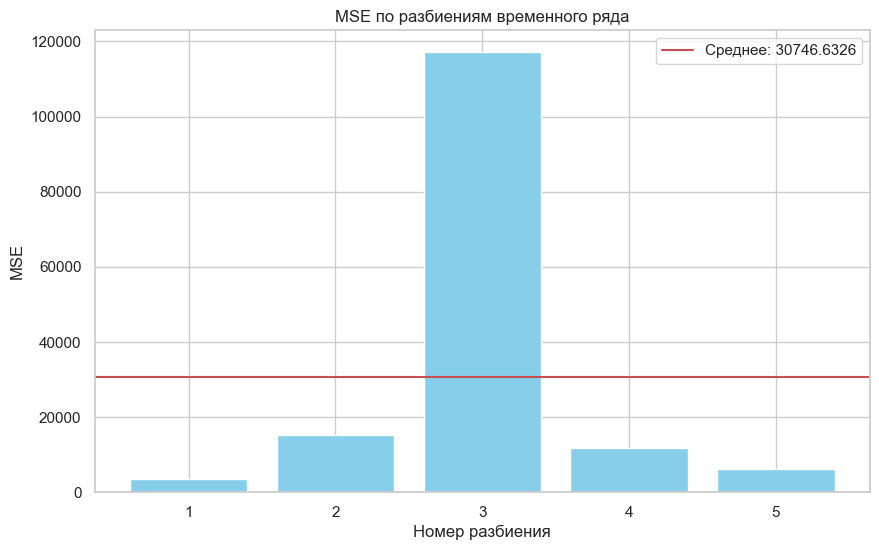

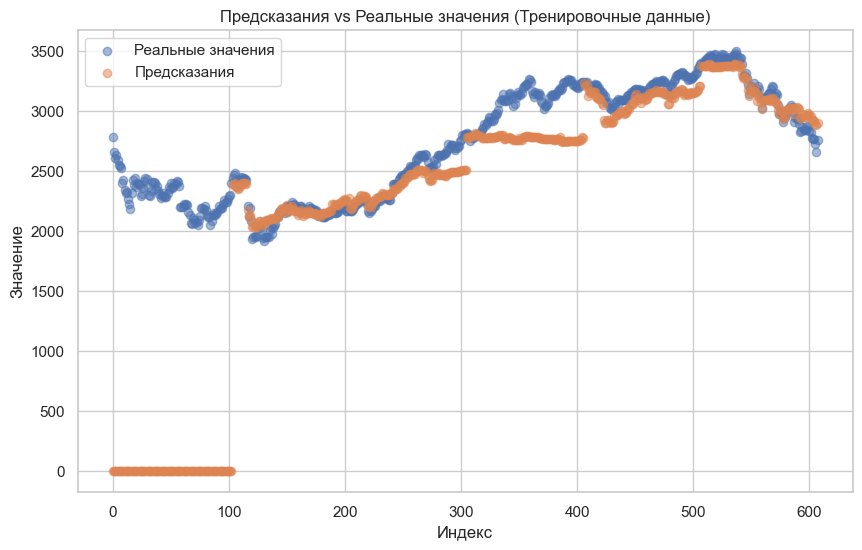

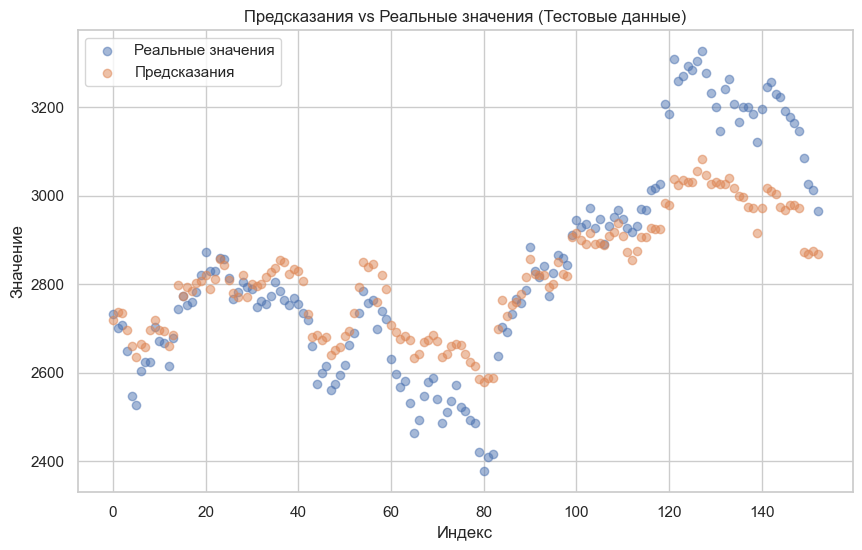

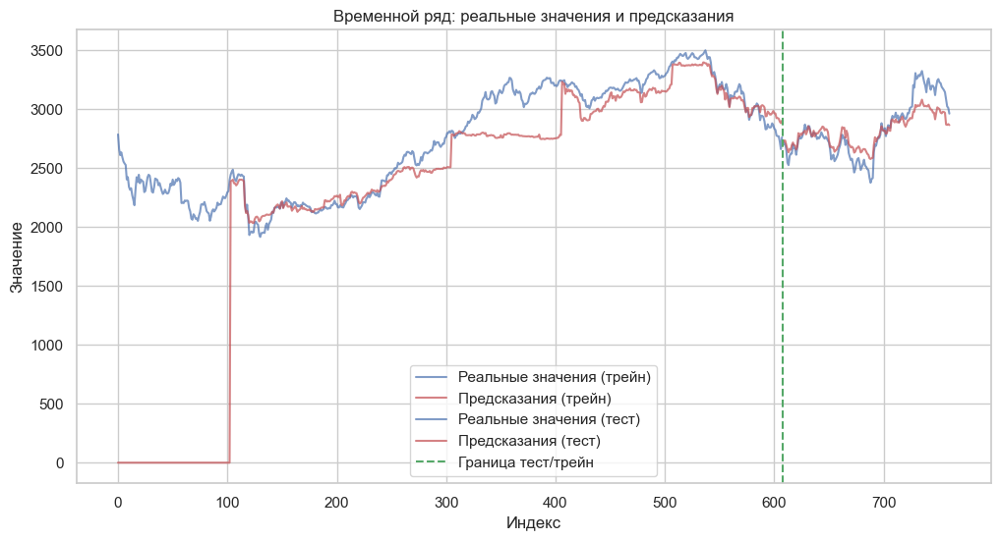

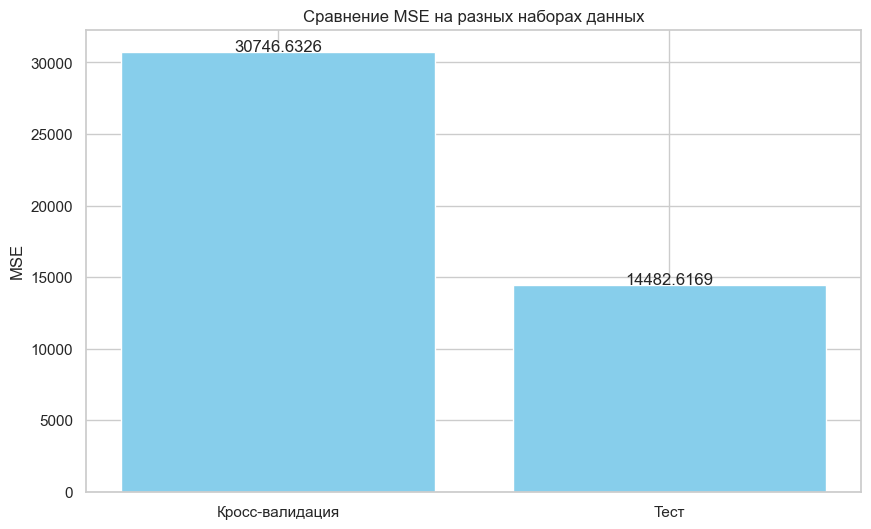

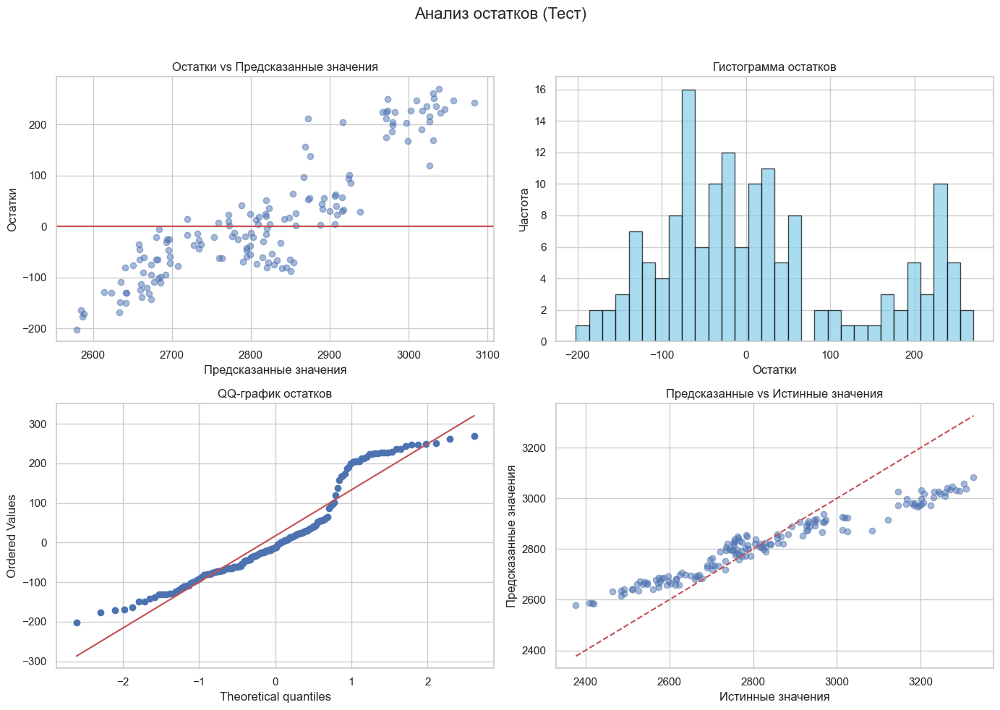

In [323]:
space_catboost = {
    'iterations':        hp.quniform('iterations', 500, 3000, 50),
    'depth':             hp.quniform('depth', 1, 2, 1),
    'learning_rate':     hp.uniform('learning_rate', 0.01, 0.075),
    'l2_leaf_reg':       hp.quniform('l2_leaf_reg', 3, 12, 1),
    'random_strength':   hp.uniform('random_strength', 0.0, 1.0),
    'bagging_temperature': hp.uniform('bagging_temperature', 0.25, 1.0),
    'bootstrap_type':    hp.choice('bootstrap_type', ['Bayesian']),

}
results = run_hyperopt_on_original(
    X_train=X_train_gbdt[selected_features],
    y_train=y_original_train_gbdt,
    X_test=X_test_gbdt[selected_features],
    y_test=y_original_test_gbdt,
    model_class=cb.CatBoostRegressor,
    space=space_catboost,
    n_iter=100,
    random_state=42
)

In [328]:
df_log = results['log_df']

display(df_log)

,iteration,iterations,depth,learning_rate,l2_leaf_reg,random_strength,bagging_temperature,random_seed,verbose,cv_rmse,test_rmse
0,1,2150,4,0.050,11,0.814,0.335,42,0,184.446,145.137
1,2,650,3,0.050,11,0.300,0.309,42,0,156.671,77.991
2,3,900,3,0.015,9,0.147,0.868,42,0,162.689,96.574
3,4,2250,2,0.024,8,0.404,0.626,42,0,150.215,94.483
4,5,1350,3,0.016,6,0.503,0.553,42,0,162.459,112.368
5,6,2300,4,0.020,7,0.755,0.672,42,0,176.884,136.054
6,7,2650,3,0.075,4,0.699,0.961,42,0,149.118,94.440
7,8,1350,2,0.064,10,0.064,0.803,42,0,144.318,67.281
8,9,1950,4,0.060,3,0.723,0.512,42,0,196.179,145.498
9,10,2250,3,0.041,7,0.325,0.774,42,0,152.649,89.709


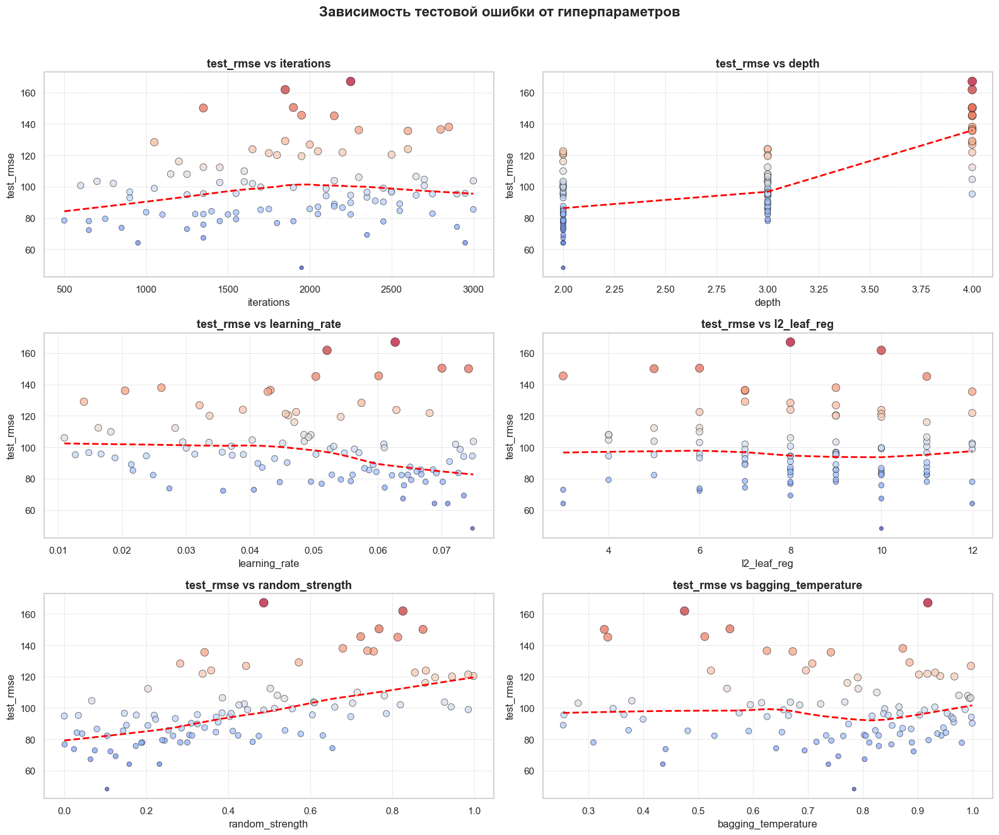

In [330]:
params_to_plot = [
    'iterations',
    'depth',
    'learning_rate',
    'l2_leaf_reg',
    'random_strength',
    'bagging_temperature'
    # 'subsample'
]

plot_hyperopt_param_influence(
    trials_df=df_log,
    params_to_plot=params_to_plot,
    metric_col='test_rmse',
    title="Зависимость тестовой ошибки от гиперпараметров"
)


In [340]:
# Оставляем только числовые столбцы
df_numeric = df_log.select_dtypes(include=["number"])

# Считаем Spearman-корреляции
correlations = df_numeric.corr(method='spearman')["test_rmse"].sort_values()
print(correlations)

learning_rate         -0.288
iteration             -0.171
l2_leaf_reg           -0.059
bagging_temperature   -0.017
iterations             0.155
cv_rmse                0.487
depth                  0.615
random_strength        0.654
test_rmse              1.000
random_seed              NaN
verbose                  NaN
Name: test_rmse, dtype: float64


In [578]:
hyperparam_results = pd.read_excel('hyperparam_results.xlsx')

In [580]:
hyperparam_results

,iteration,iterations,depth,learning_rate,l2_leaf_reg,random_strength,bagging_temperature,random_seed,verbose,cv_rmse,test_rmse
0,0,2150,4,0.050,11,0.814,0.335,42,0,184.446,145.137
1,1,650,3,0.050,11,0.300,0.309,42,0,156.671,77.991
2,2,900,3,0.015,9,0.147,0.868,42,0,162.689,96.574
3,3,2250,2,0.024,8,0.404,0.626,42,0,150.215,94.483
4,4,1350,3,0.016,6,0.503,0.553,42,0,162.459,112.368
5,5,2300,4,0.020,7,0.755,0.672,42,0,176.884,136.054
6,6,2650,3,0.075,4,0.699,0.961,42,0,149.118,94.440
7,7,1350,2,0.064,10,0.064,0.803,42,0,144.318,67.281
8,8,1950,4,0.060,3,0.723,0.512,42,0,196.179,145.498
9,9,2250,3,0.041,7,0.325,0.774,42,0,152.649,89.709


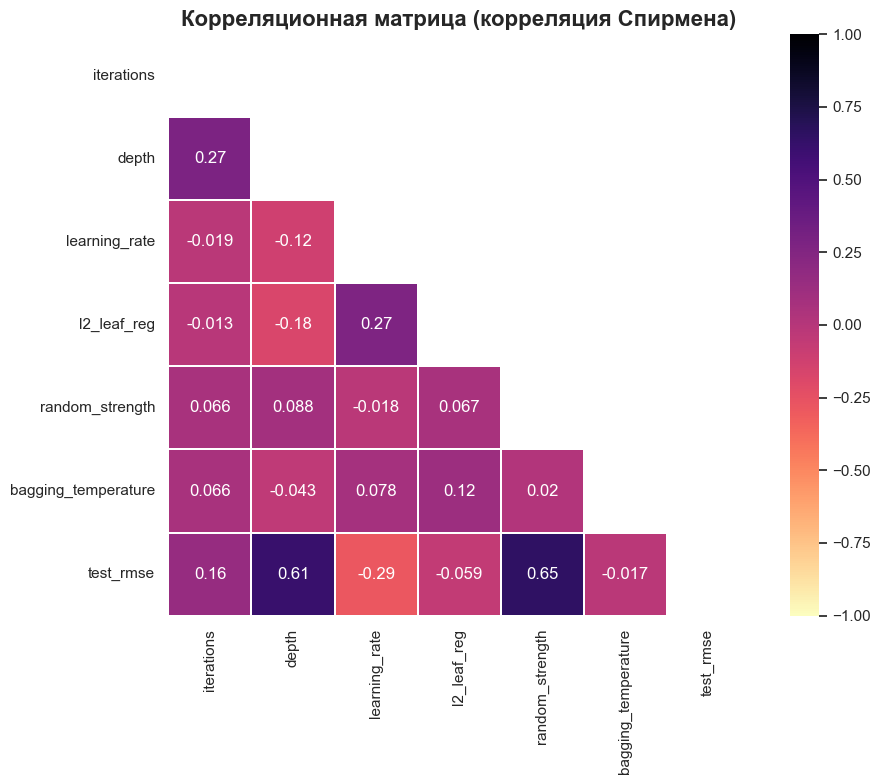

In [582]:
# Только числовые столбцы
df_numeric = hyperparam_results.select_dtypes(include=["number"])

# Удалим столбцы, которые не относятся к гиперпараметрам (если есть)
cols_to_exclude = ["iteration", "cv_rmse", "random_seed", "verbose"]
df_filtered = df_numeric.drop(columns=[col for col in cols_to_exclude if col in df_numeric.columns])

# Корреляционная матрица с методом Спирмена
corr_matrix = df_filtered.corr(method='spearman')

# Построение тепловой карты
sns.set(style="white")
plt.figure(figsize=(10, 8))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

sns.heatmap(corr_matrix,
            annot=True,
            cmap='magma_r',
            linewidths=0.3,
            mask=mask,
            vmin=-1,
            vmax=1,
            linecolor='white',
            square=True)

plt.title('Корреляционная матрица (корреляция Спирмена)', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

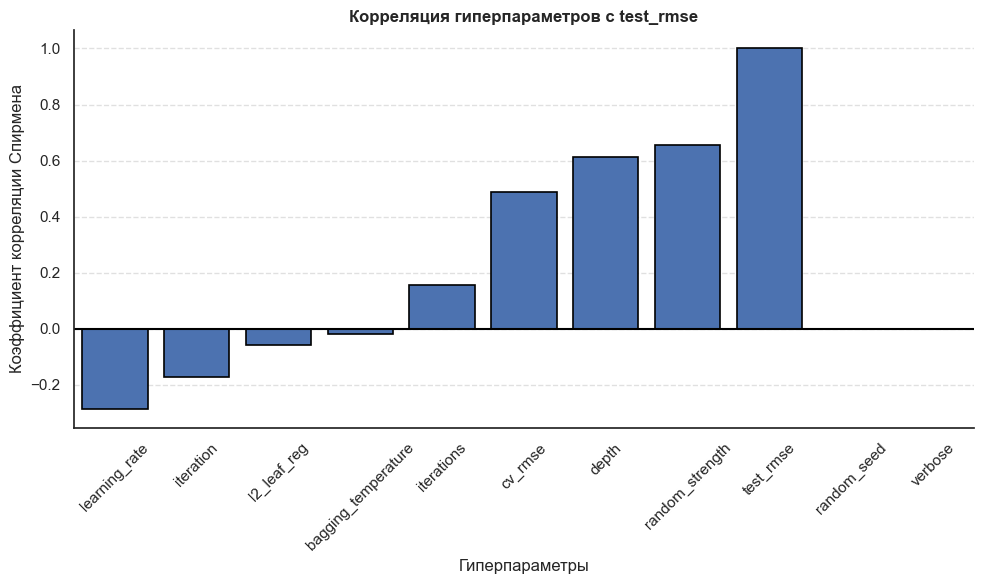

In [588]:
plt.figure(figsize=(10, 6))
sns.barplot(
    x=correlations.index,
    y=correlations.values,
    edgecolor='black',   
    linewidth=1.2,
    saturation=1.2    
)
plt.xticks(rotation=45)
plt.title("Корреляция гиперпараметров с test_rmse", fontweight='bold') 
plt.ylabel("Коэффициент корреляции Спирмена")
plt.xlabel("Гиперпараметры")
plt.grid(True, axis='y', linestyle='--', alpha=0.6) 
plt.axhline(0, color='black', linewidth=1.5, linestyle='-') 
sns.despine() 
plt.tight_layout()
plt.show()

## Финальная попытка для бустинга

Hyperopt:   0%|                                                                                | 0/500 [00:00<?, ?it/s]


===> Запуск objective, итерация 1 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245502974941916, 'l2_leaf_reg': 14, 'random_strength': 0.14281365540764027, 'bagging_temperature': 0.4088392662547261, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.8792
  [Objective] Финальное обучение на всём трейне...
[1] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245502974941916, 'l2_leaf_reg': 14, 'random_strength': 0.14281365540764027, 'bagging_temperature': 0.4088392662547261, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.8792 | Test RMSE: 61.0049


Hyperopt:   0%|▏                                                                       | 1/500 [00:03<29:20,  3.53s/it]


===> Запуск objective, итерация 2 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245206229054278, 'l2_leaf_reg': 14, 'random_strength': 0.14230042135479049, 'bagging_temperature': 0.4086093048191343, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.14 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 150.8551
  [Objective] Финальное обучение на всём трейне...
[2] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245206229054278, 'l2_leaf_reg': 14, 'random_strength': 0.14230042135479049, 'bagging_temperature': 0.4086093048191343, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.8551 | Test RMSE: 60.8451


Hyperopt:   0%|▎                                                                       | 2/500 [00:06<27:58,  3.37s/it]


===> Запуск objective, итерация 3 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231841525636263, 'l2_leaf_reg': 14, 'random_strength': 0.142146962787285, 'bagging_temperature': 0.40617660851273, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.22 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.7197
  [Objective] Финальное обучение на всём трейне...
[3] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231841525636263, 'l2_leaf_reg': 14, 'random_strength': 0.142146962787285, 'bagging_temperature': 0.40617660851273, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7197 | Test RMSE: 60.3947


Hyperopt:   1%|▍                                                                       | 3/500 [00:10<28:19,  3.42s/it]


===> Запуск objective, итерация 4 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042353054279248334, 'l2_leaf_reg': 14, 'random_strength': 0.14240377767026197, 'bagging_temperature': 0.4059245341332581, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 147.5106
  [Objective] Финальное обучение на всём трейне...
[4] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042353054279248334, 'l2_leaf_reg': 14, 'random_strength': 0.14240377767026197, 'bagging_temperature': 0.4059245341332581, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.5106 | Test RMSE: 60.4581


Hyperopt:   1%|▌                                                                       | 4/500 [00:14<30:16,  3.66s/it]


===> Запуск objective, итерация 5 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232416116141925, 'l2_leaf_reg': 14, 'random_strength': 0.14250290375466146, 'bagging_temperature': 0.40287356319853235, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.21 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.36 сек
  [Objective] mean_cv_rmse: 152.4811
  [Objective] Финальное обучение на всём трейне...
[5] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232416116141925, 'l2_leaf_reg': 14, 'random_strength': 0.14250290375466146, 'bagging_temperature': 0.40287356319853235, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.4811 | Test RMSE: 60.8758


Hyperopt:   1%|▋                                                                       | 5/500 [00:17<29:54,  3.62s/it]


===> Запуск objective, итерация 6 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234025602715437, 'l2_leaf_reg': 14, 'random_strength': 0.1427547273602648, 'bagging_temperature': 0.40441943398352453, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.35 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 147.6589
  [Objective] Финальное обучение на всём трейне...
[6] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234025602715437, 'l2_leaf_reg': 14, 'random_strength': 0.1427547273602648, 'bagging_temperature': 0.40441943398352453, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.6589 | Test RMSE: 59.1262


Hyperopt:   1%|▊                                                                       | 6/500 [00:21<31:13,  3.79s/it]


===> Запуск objective, итерация 7 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04254924680247502, 'l2_leaf_reg': 14, 'random_strength': 0.14269907859474149, 'bagging_temperature': 0.40081746941952157, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.29 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 151.2783
  [Objective] Финальное обучение на всём трейне...
[7] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04254924680247502, 'l2_leaf_reg': 14, 'random_strength': 0.14269907859474149, 'bagging_temperature': 0.40081746941952157, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.2783 | Test RMSE: 60.1990


Hyperopt:   1%|█                                                                       | 7/500 [00:25<31:39,  3.85s/it]


===> Запуск objective, итерация 8 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04250752240809312, 'l2_leaf_reg': 14, 'random_strength': 0.14206428686330955, 'bagging_temperature': 0.407480357729604, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.36 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.7690
  [Objective] Финальное обучение на всём трейне...
[8] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04250752240809312, 'l2_leaf_reg': 14, 'random_strength': 0.14206428686330955, 'bagging_temperature': 0.407480357729604, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7690 | Test RMSE: 61.0531


Hyperopt:   2%|█▏                                                                      | 8/500 [00:30<32:18,  3.94s/it]


===> Запуск objective, итерация 9 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04249284520439896, 'l2_leaf_reg': 14, 'random_strength': 0.14272329840367434, 'bagging_temperature': 0.4005407787444419, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.32 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 151.7799
  [Objective] Финальное обучение на всём трейне...
[9] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04249284520439896, 'l2_leaf_reg': 14, 'random_strength': 0.14272329840367434, 'bagging_temperature': 0.4005407787444419, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.7799 | Test RMSE: 60.1972


Hyperopt:   2%|█▎                                                                      | 9/500 [00:34<32:36,  3.98s/it]


===> Запуск objective, итерация 10 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042420139292177805, 'l2_leaf_reg': 14, 'random_strength': 0.14232503239273547, 'bagging_temperature': 0.4043499795365081, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.28 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.39 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.0964
  [Objective] Финальное обучение на всём трейне...
[10] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042420139292177805, 'l2_leaf_reg': 14, 'random_strength': 0.14232503239273547, 'bagging_temperature': 0.4043499795365081, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.0964 | Test RMSE: 59.5083


Hyperopt:   2%|█▍                                                                     | 10/500 [00:38<32:42,  4.01s/it]


===> Запуск objective, итерация 11 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231031508934273, 'l2_leaf_reg': 14, 'random_strength': 0.1420347034358568, 'bagging_temperature': 0.4026832475371054, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.9524
  [Objective] Финальное обучение на всём трейне...
[11] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231031508934273, 'l2_leaf_reg': 14, 'random_strength': 0.1420347034358568, 'bagging_temperature': 0.4026832475371054, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9524 | Test RMSE: 60.8662


Hyperopt:   2%|█▌                                                                     | 11/500 [00:42<32:46,  4.02s/it]


===> Запуск objective, итерация 12 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245203809622751, 'l2_leaf_reg': 14, 'random_strength': 0.1427810878336639, 'bagging_temperature': 0.4010483061704647, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.3579
  [Objective] Финальное обучение на всём трейне...
[12] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245203809622751, 'l2_leaf_reg': 14, 'random_strength': 0.1427810878336639, 'bagging_temperature': 0.4010483061704647, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.3579 | Test RMSE: 60.2626


Hyperopt:   2%|█▋                                                                     | 12/500 [00:46<32:36,  4.01s/it]


===> Запуск objective, итерация 13 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04248250990009051, 'l2_leaf_reg': 14, 'random_strength': 0.1422831609380301, 'bagging_temperature': 0.4060910414908832, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 149.3100
  [Objective] Финальное обучение на всём трейне...
[13] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04248250990009051, 'l2_leaf_reg': 14, 'random_strength': 0.1422831609380301, 'bagging_temperature': 0.4060910414908832, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.3100 | Test RMSE: 60.3434


Hyperopt:   3%|█▊                                                                     | 13/500 [00:50<32:42,  4.03s/it]


===> Запуск objective, итерация 14 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241678714145885, 'l2_leaf_reg': 14, 'random_strength': 0.1420674229237941, 'bagging_temperature': 0.4008885184806584, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.21 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 152.5896
  [Objective] Финальное обучение на всём трейне...
[14] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241678714145885, 'l2_leaf_reg': 14, 'random_strength': 0.1420674229237941, 'bagging_temperature': 0.4008885184806584, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.5896 | Test RMSE: 59.4637


Hyperopt:   3%|█▉                                                                     | 14/500 [00:54<32:04,  3.96s/it]


===> Запуск objective, итерация 15 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04252643290890855, 'l2_leaf_reg': 14, 'random_strength': 0.14223246063746958, 'bagging_temperature': 0.40017096689947745, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.38 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.5874
  [Objective] Финальное обучение на всём трейне...
[15] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04252643290890855, 'l2_leaf_reg': 14, 'random_strength': 0.14223246063746958, 'bagging_temperature': 0.40017096689947745, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.5874 | Test RMSE: 59.5097


Hyperopt:   3%|██▏                                                                    | 15/500 [00:58<32:04,  3.97s/it]


===> Запуск objective, итерация 16 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04254693430299001, 'l2_leaf_reg': 14, 'random_strength': 0.14287524760914913, 'bagging_temperature': 0.40204284252010164, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.6146
  [Objective] Финальное обучение на всём трейне...
[16] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04254693430299001, 'l2_leaf_reg': 14, 'random_strength': 0.14287524760914913, 'bagging_temperature': 0.40204284252010164, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.6146 | Test RMSE: 59.9129


Hyperopt:   3%|██▎                                                                    | 16/500 [01:01<31:41,  3.93s/it]


===> Запуск objective, итерация 17 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042503520866861835, 'l2_leaf_reg': 14, 'random_strength': 0.14288226760497463, 'bagging_temperature': 0.40816994764213366, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 151.1130
  [Objective] Финальное обучение на всём трейне...
[17] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042503520866861835, 'l2_leaf_reg': 14, 'random_strength': 0.14288226760497463, 'bagging_temperature': 0.40816994764213366, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.1130 | Test RMSE: 61.5520


Hyperopt:   3%|██▍                                                                    | 17/500 [01:05<31:24,  3.90s/it]


===> Запуск objective, итерация 18 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232577051653414, 'l2_leaf_reg': 14, 'random_strength': 0.14232494903136308, 'bagging_temperature': 0.4035068329327333, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.43 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.7089
  [Objective] Финальное обучение на всём трейне...
[18] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232577051653414, 'l2_leaf_reg': 14, 'random_strength': 0.14232494903136308, 'bagging_temperature': 0.4035068329327333, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7089 | Test RMSE: 60.2446


Hyperopt:   4%|██▌                                                                    | 18/500 [01:09<31:47,  3.96s/it]


===> Запуск objective, итерация 19 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042512463731597464, 'l2_leaf_reg': 14, 'random_strength': 0.14224521354888087, 'bagging_temperature': 0.40128076895926373, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 151.8871
  [Objective] Финальное обучение на всём трейне...
[19] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042512463731597464, 'l2_leaf_reg': 14, 'random_strength': 0.14224521354888087, 'bagging_temperature': 0.40128076895926373, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.8871 | Test RMSE: 58.8512


Hyperopt:   4%|██▋                                                                    | 19/500 [01:13<31:33,  3.94s/it]


===> Запуск objective, итерация 20 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04247826113037861, 'l2_leaf_reg': 14, 'random_strength': 0.14244732359498696, 'bagging_temperature': 0.40975999897738913, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.17 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.4248
  [Objective] Финальное обучение на всём трейне...
[20] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04247826113037861, 'l2_leaf_reg': 14, 'random_strength': 0.14244732359498696, 'bagging_temperature': 0.40975999897738913, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4248 | Test RMSE: 59.9649


Hyperopt:   4%|██▊                                                                    | 20/500 [01:17<31:27,  3.93s/it]


===> Запуск objective, итерация 21 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042362215870689154, 'l2_leaf_reg': 14, 'random_strength': 0.14299632837613016, 'bagging_temperature': 0.4053430965831669, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.37 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 150.9081
  [Objective] Финальное обучение на всём трейне...
[21] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042362215870689154, 'l2_leaf_reg': 14, 'random_strength': 0.14299632837613016, 'bagging_temperature': 0.4053430965831669, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.9081 | Test RMSE: 59.3401


Hyperopt:   4%|██▉                                                                    | 21/500 [01:21<31:28,  3.94s/it]


===> Запуск objective, итерация 22 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237399352784703, 'l2_leaf_reg': 14, 'random_strength': 0.14253458610617492, 'bagging_temperature': 0.4042050754029671, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 148.7892
  [Objective] Финальное обучение на всём трейне...
[22] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237399352784703, 'l2_leaf_reg': 14, 'random_strength': 0.14253458610617492, 'bagging_temperature': 0.4042050754029671, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7892 | Test RMSE: 60.5763


Hyperopt:   4%|███                                                                    | 22/500 [01:25<31:28,  3.95s/it]


===> Запуск objective, итерация 23 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423682817607115, 'l2_leaf_reg': 14, 'random_strength': 0.14260493409023275, 'bagging_temperature': 0.40689388395790244, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.1719
  [Objective] Финальное обучение на всём трейне...
[23] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423682817607115, 'l2_leaf_reg': 14, 'random_strength': 0.14260493409023275, 'bagging_temperature': 0.40689388395790244, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1719 | Test RMSE: 60.6982


Hyperopt:   5%|███▎                                                                   | 23/500 [01:29<31:20,  3.94s/it]


===> Запуск objective, итерация 24 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042393457575577664, 'l2_leaf_reg': 14, 'random_strength': 0.1426140978244218, 'bagging_temperature': 0.4053610756882712, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 151.3140
  [Objective] Финальное обучение на всём трейне...
[24] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042393457575577664, 'l2_leaf_reg': 14, 'random_strength': 0.1426140978244218, 'bagging_temperature': 0.4053610756882712, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.3140 | Test RMSE: 60.5089


Hyperopt:   5%|███▍                                                                   | 24/500 [01:33<30:55,  3.90s/it]


===> Запуск objective, итерация 25 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233632822206076, 'l2_leaf_reg': 14, 'random_strength': 0.14241523129796957, 'bagging_temperature': 0.40426423958567187, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 147.6775
  [Objective] Финальное обучение на всём трейне...
[25] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233632822206076, 'l2_leaf_reg': 14, 'random_strength': 0.14241523129796957, 'bagging_temperature': 0.40426423958567187, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.6775 | Test RMSE: 59.0352


Hyperopt:   5%|███▌                                                                   | 25/500 [01:37<31:06,  3.93s/it]


===> Запуск objective, итерация 26 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234549602584495, 'l2_leaf_reg': 14, 'random_strength': 0.1429521005255779, 'bagging_temperature': 0.40633743264222344, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.5341
  [Objective] Финальное обучение на всём трейне...
[26] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234549602584495, 'l2_leaf_reg': 14, 'random_strength': 0.1429521005255779, 'bagging_temperature': 0.40633743264222344, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.5341 | Test RMSE: 60.2536


Hyperopt:   5%|███▋                                                                   | 26/500 [01:41<30:56,  3.92s/it]


===> Запуск objective, итерация 27 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238987362743109, 'l2_leaf_reg': 14, 'random_strength': 0.14260781321820898, 'bagging_temperature': 0.40495674973120915, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 151.1464
  [Objective] Финальное обучение на всём трейне...
[27] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238987362743109, 'l2_leaf_reg': 14, 'random_strength': 0.14260781321820898, 'bagging_temperature': 0.40495674973120915, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.1464 | Test RMSE: 60.4353


Hyperopt:   5%|███▊                                                                   | 27/500 [01:45<30:53,  3.92s/it]


===> Запуск objective, итерация 28 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423032195030148, 'l2_leaf_reg': 14, 'random_strength': 0.14239911024316879, 'bagging_temperature': 0.40717064186858043, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.6246
  [Objective] Финальное обучение на всём трейне...
[28] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423032195030148, 'l2_leaf_reg': 14, 'random_strength': 0.14239911024316879, 'bagging_temperature': 0.40717064186858043, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6246 | Test RMSE: 60.8043


Hyperopt:   6%|███▉                                                                   | 28/500 [01:48<30:32,  3.88s/it]


===> Запуск objective, итерация 29 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234789212325141, 'l2_leaf_reg': 14, 'random_strength': 0.14267141966225041, 'bagging_temperature': 0.4035177927369007, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.7053
  [Objective] Финальное обучение на всём трейне...
[29] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234789212325141, 'l2_leaf_reg': 14, 'random_strength': 0.14267141966225041, 'bagging_temperature': 0.4035177927369007, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7053 | Test RMSE: 60.2085


Hyperopt:   6%|████                                                                   | 29/500 [01:52<30:23,  3.87s/it]


===> Запуск objective, итерация 30 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239450809281156, 'l2_leaf_reg': 14, 'random_strength': 0.1427870177399332, 'bagging_temperature': 0.40800036560948294, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.4137
  [Objective] Финальное обучение на всём трейне...
[30] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239450809281156, 'l2_leaf_reg': 14, 'random_strength': 0.1427870177399332, 'bagging_temperature': 0.40800036560948294, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4137 | Test RMSE: 60.3445


Hyperopt:   6%|████▎                                                                  | 30/500 [01:56<30:27,  3.89s/it]


===> Запуск objective, итерация 31 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243381878420147, 'l2_leaf_reg': 14, 'random_strength': 0.1425367843838689, 'bagging_temperature': 0.409776632937186, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.37 сек
  [Objective] mean_cv_rmse: 148.6849
  [Objective] Финальное обучение на всём трейне...
[31] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243381878420147, 'l2_leaf_reg': 14, 'random_strength': 0.1425367843838689, 'bagging_temperature': 0.409776632937186, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.6849 | Test RMSE: 60.6268


Hyperopt:   6%|████▍                                                                  | 31/500 [02:01<31:59,  4.09s/it]


===> Запуск objective, итерация 32 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230389079462655, 'l2_leaf_reg': 14, 'random_strength': 0.1428345937117151, 'bagging_temperature': 0.40877772581967486, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.25 сек
  [Objective] mean_cv_rmse: 151.2060
  [Objective] Финальное обучение на всём трейне...
[32] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230389079462655, 'l2_leaf_reg': 14, 'random_strength': 0.1428345937117151, 'bagging_temperature': 0.40877772581967486, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.2060 | Test RMSE: 60.9373


Hyperopt:   6%|████▌                                                                  | 32/500 [02:05<31:06,  3.99s/it]


===> Запуск objective, итерация 33 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042359409055200005, 'l2_leaf_reg': 14, 'random_strength': 0.14248027091046522, 'bagging_temperature': 0.40199205377135916, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.6268
  [Objective] Финальное обучение на всём трейне...
[33] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042359409055200005, 'l2_leaf_reg': 14, 'random_strength': 0.14248027091046522, 'bagging_temperature': 0.40199205377135916, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6268 | Test RMSE: 60.1893


Hyperopt:   7%|████▋                                                                  | 33/500 [02:08<30:36,  3.93s/it]


===> Запуск objective, итерация 34 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042406377543228714, 'l2_leaf_reg': 14, 'random_strength': 0.1423754746326084, 'bagging_temperature': 0.4059398072122436, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 148.1790
  [Objective] Финальное обучение на всём трейне...
[34] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042406377543228714, 'l2_leaf_reg': 14, 'random_strength': 0.1423754746326084, 'bagging_temperature': 0.4059398072122436, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1790 | Test RMSE: 60.0289


Hyperopt:   7%|████▊                                                                  | 34/500 [02:12<30:26,  3.92s/it]


===> Запуск objective, итерация 35 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237687332437103, 'l2_leaf_reg': 14, 'random_strength': 0.14216024760068002, 'bagging_temperature': 0.4066425320776233, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 148.7496
  [Objective] Финальное обучение на всём трейне...
[35] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237687332437103, 'l2_leaf_reg': 14, 'random_strength': 0.14216024760068002, 'bagging_temperature': 0.4066425320776233, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7496 | Test RMSE: 60.7922


Hyperopt:   7%|████▉                                                                  | 35/500 [02:16<30:08,  3.89s/it]


===> Запуск objective, итерация 36 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042328910836180775, 'l2_leaf_reg': 14, 'random_strength': 0.14273308824266986, 'bagging_temperature': 0.4049988659298792, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.28 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.25 сек
  [Objective] mean_cv_rmse: 149.5860
  [Objective] Финальное обучение на всём трейне...
[36] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042328910836180775, 'l2_leaf_reg': 14, 'random_strength': 0.14273308824266986, 'bagging_temperature': 0.4049988659298792, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5860 | Test RMSE: 60.5391


Hyperopt:   7%|█████                                                                  | 36/500 [02:20<29:40,  3.84s/it]


===> Запуск objective, итерация 37 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244274885540839, 'l2_leaf_reg': 14, 'random_strength': 0.14216319229105706, 'bagging_temperature': 0.4037106812726972, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 151.5544
  [Objective] Финальное обучение на всём трейне...
[37] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244274885540839, 'l2_leaf_reg': 14, 'random_strength': 0.14216319229105706, 'bagging_temperature': 0.4037106812726972, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.5544 | Test RMSE: 59.4293


Hyperopt:   7%|█████▎                                                                 | 37/500 [02:23<29:13,  3.79s/it]


===> Запуск objective, итерация 38 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042349011805656596, 'l2_leaf_reg': 14, 'random_strength': 0.14264322922568903, 'bagging_temperature': 0.4027769890075569, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.19 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 150.7834
  [Objective] Финальное обучение на всём трейне...
[38] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042349011805656596, 'l2_leaf_reg': 14, 'random_strength': 0.14264322922568903, 'bagging_temperature': 0.4027769890075569, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.7834 | Test RMSE: 60.1594


Hyperopt:   8%|█████▍                                                                 | 38/500 [02:27<29:15,  3.80s/it]


===> Запуск objective, итерация 39 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231254051330057, 'l2_leaf_reg': 14, 'random_strength': 0.1425642960257622, 'bagging_temperature': 0.40766563519354443, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 149.5528
  [Objective] Финальное обучение на всём трейне...
[39] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231254051330057, 'l2_leaf_reg': 14, 'random_strength': 0.1425642960257622, 'bagging_temperature': 0.40766563519354443, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5528 | Test RMSE: 60.3580


Hyperopt:   8%|█████▌                                                                 | 39/500 [02:31<29:09,  3.79s/it]


===> Запуск objective, итерация 40 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0424683254661961, 'l2_leaf_reg': 14, 'random_strength': 0.14270496047851042, 'bagging_temperature': 0.4046063676340304, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 152.2334
  [Objective] Финальное обучение на всём трейне...
[40] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0424683254661961, 'l2_leaf_reg': 14, 'random_strength': 0.14270496047851042, 'bagging_temperature': 0.4046063676340304, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.2334 | Test RMSE: 59.7050


Hyperopt:   8%|█████▋                                                                 | 40/500 [02:35<28:43,  3.75s/it]


===> Запуск objective, итерация 41 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240671800786246, 'l2_leaf_reg': 14, 'random_strength': 0.1429473489243501, 'bagging_temperature': 0.4016694610073698, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.0020
  [Objective] Финальное обучение на всём трейне...
[41] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240671800786246, 'l2_leaf_reg': 14, 'random_strength': 0.1429473489243501, 'bagging_temperature': 0.4016694610073698, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.0020 | Test RMSE: 59.3302


Hyperopt:   8%|█████▊                                                                 | 41/500 [02:38<28:47,  3.76s/it]


===> Запуск objective, итерация 42 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042382818972393495, 'l2_leaf_reg': 14, 'random_strength': 0.1424817651568072, 'bagging_temperature': 0.40579727813953453, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.4775
  [Objective] Финальное обучение на всём трейне...
[42] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042382818972393495, 'l2_leaf_reg': 14, 'random_strength': 0.1424817651568072, 'bagging_temperature': 0.40579727813953453, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4775 | Test RMSE: 60.8436


Hyperopt:   8%|█████▉                                                                 | 42/500 [02:42<28:38,  3.75s/it]


===> Запуск objective, итерация 43 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231843615156792, 'l2_leaf_reg': 14, 'random_strength': 0.14223693151981703, 'bagging_temperature': 0.40332569247113903, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.37 сек
  [Objective] mean_cv_rmse: 149.7483
  [Objective] Финальное обучение на всём трейне...
[43] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231843615156792, 'l2_leaf_reg': 14, 'random_strength': 0.14223693151981703, 'bagging_temperature': 0.40332569247113903, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7483 | Test RMSE: 60.8539


Hyperopt:   9%|██████                                                                 | 43/500 [02:46<28:43,  3.77s/it]


===> Запуск objective, итерация 44 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423362018132997, 'l2_leaf_reg': 14, 'random_strength': 0.14235670906122255, 'bagging_temperature': 0.40923707119727576, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 148.2597
  [Objective] Финальное обучение на всём трейне...
[44] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423362018132997, 'l2_leaf_reg': 14, 'random_strength': 0.14235670906122255, 'bagging_temperature': 0.40923707119727576, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2597 | Test RMSE: 59.8890


Hyperopt:   9%|██████▏                                                                | 44/500 [02:50<28:48,  3.79s/it]


===> Запуск objective, итерация 45 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042429927651056784, 'l2_leaf_reg': 14, 'random_strength': 0.14275160031793419, 'bagging_temperature': 0.4055819569993282, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.39 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.2261
  [Objective] Финальное обучение на всём трейне...
[45] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042429927651056784, 'l2_leaf_reg': 14, 'random_strength': 0.14275160031793419, 'bagging_temperature': 0.4055819569993282, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2261 | Test RMSE: 60.0340


Hyperopt:   9%|██████▍                                                                | 45/500 [02:54<29:16,  3.86s/it]


===> Запуск objective, итерация 46 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042411765208827064, 'l2_leaf_reg': 14, 'random_strength': 0.1428502573404519, 'bagging_temperature': 0.4023710967628836, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 149.1938
  [Objective] Финальное обучение на всём трейне...
[46] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042411765208827064, 'l2_leaf_reg': 14, 'random_strength': 0.1428502573404519, 'bagging_temperature': 0.4023710967628836, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1938 | Test RMSE: 59.6281


Hyperopt:   9%|██████▌                                                                | 46/500 [02:58<29:14,  3.86s/it]


===> Запуск objective, итерация 47 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235843658564378, 'l2_leaf_reg': 14, 'random_strength': 0.14291376063973685, 'bagging_temperature': 0.40301636184806455, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 150.1159
  [Objective] Финальное обучение на всём трейне...
[47] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235843658564378, 'l2_leaf_reg': 14, 'random_strength': 0.14291376063973685, 'bagging_temperature': 0.40301636184806455, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1159 | Test RMSE: 58.9735


Hyperopt:   9%|██████▋                                                                | 47/500 [03:01<28:51,  3.82s/it]


===> Запуск objective, итерация 48 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233704685874105, 'l2_leaf_reg': 14, 'random_strength': 0.14210290900688577, 'bagging_temperature': 0.40735178136143685, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 149.5737
  [Objective] Финальное обучение на всём трейне...
[48] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233704685874105, 'l2_leaf_reg': 14, 'random_strength': 0.14210290900688577, 'bagging_temperature': 0.40735178136143685, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5737 | Test RMSE: 59.7396


Hyperopt:  10%|██████▊                                                                | 48/500 [03:05<28:25,  3.77s/it]


===> Запуск objective, итерация 49 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231375411830915, 'l2_leaf_reg': 14, 'random_strength': 0.14227823388913666, 'bagging_temperature': 0.4064226998738153, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.2160
  [Objective] Финальное обучение на всём трейне...
[49] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231375411830915, 'l2_leaf_reg': 14, 'random_strength': 0.14227823388913666, 'bagging_temperature': 0.4064226998738153, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.2160 | Test RMSE: 60.8134


Hyperopt:  10%|██████▉                                                                | 49/500 [03:09<28:15,  3.76s/it]


===> Запуск objective, итерация 50 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230029308318782, 'l2_leaf_reg': 14, 'random_strength': 0.14280130197509755, 'bagging_temperature': 0.40384090006427364, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.36 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.8847
  [Objective] Финальное обучение на всём трейне...
[50] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230029308318782, 'l2_leaf_reg': 14, 'random_strength': 0.14280130197509755, 'bagging_temperature': 0.40384090006427364, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8847 | Test RMSE: 61.1516


Hyperopt:  10%|███████                                                                | 50/500 [03:13<28:33,  3.81s/it]


===> Запуск objective, итерация 51 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042461195663405525, 'l2_leaf_reg': 14, 'random_strength': 0.14266943871379004, 'bagging_temperature': 0.4047299418170723, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 151.0363
  [Objective] Финальное обучение на всём трейне...
[51] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042461195663405525, 'l2_leaf_reg': 14, 'random_strength': 0.14266943871379004, 'bagging_temperature': 0.4047299418170723, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.0363 | Test RMSE: 58.9361


Hyperopt:  10%|███████▏                                                               | 51/500 [03:17<28:21,  3.79s/it]


===> Запуск objective, итерация 52 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042384609821513444, 'l2_leaf_reg': 14, 'random_strength': 0.14243969499130732, 'bagging_temperature': 0.4082492484133755, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 150.3741
  [Objective] Финальное обучение на всём трейне...
[52] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042384609821513444, 'l2_leaf_reg': 14, 'random_strength': 0.14243969499130732, 'bagging_temperature': 0.4082492484133755, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.3741 | Test RMSE: 59.9595


Hyperopt:  10%|███████▍                                                               | 52/500 [03:20<28:12,  3.78s/it]


===> Запуск objective, итерация 53 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236824225701988, 'l2_leaf_reg': 14, 'random_strength': 0.14201365959456785, 'bagging_temperature': 0.4002817520057291, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.22 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 151.2960
  [Objective] Финальное обучение на всём трейне...
[53] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236824225701988, 'l2_leaf_reg': 14, 'random_strength': 0.14201365959456785, 'bagging_temperature': 0.4002817520057291, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.2960 | Test RMSE: 59.6791


Hyperopt:  11%|███████▌                                                               | 53/500 [03:24<28:14,  3.79s/it]


===> Запуск objective, итерация 54 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239804734051354, 'l2_leaf_reg': 14, 'random_strength': 0.1421983413494653, 'bagging_temperature': 0.40677125577842754, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 148.7244
  [Objective] Финальное обучение на всём трейне...
[54] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239804734051354, 'l2_leaf_reg': 14, 'random_strength': 0.1421983413494653, 'bagging_temperature': 0.40677125577842754, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7244 | Test RMSE: 59.8363


Hyperopt:  11%|███████▋                                                               | 54/500 [03:28<28:28,  3.83s/it]


===> Запуск objective, итерация 55 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241974917402378, 'l2_leaf_reg': 14, 'random_strength': 0.1429938705838108, 'bagging_temperature': 0.4039454922966925, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.17 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.2558
  [Objective] Финальное обучение на всём трейне...
[55] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241974917402378, 'l2_leaf_reg': 14, 'random_strength': 0.1429938705838108, 'bagging_temperature': 0.4039454922966925, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2558 | Test RMSE: 59.8466


Hyperopt:  11%|███████▊                                                               | 55/500 [03:32<28:17,  3.81s/it]


===> Запуск objective, итерация 56 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235156001522453, 'l2_leaf_reg': 14, 'random_strength': 0.1423354571757709, 'bagging_temperature': 0.4053288057295867, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 147.9104
  [Objective] Финальное обучение на всём трейне...
[56] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235156001522453, 'l2_leaf_reg': 14, 'random_strength': 0.1423354571757709, 'bagging_temperature': 0.4053288057295867, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.9104 | Test RMSE: 60.7234


Hyperopt:  11%|███████▉                                                               | 56/500 [03:36<28:29,  3.85s/it]


===> Запуск objective, итерация 57 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232447540280503, 'l2_leaf_reg': 14, 'random_strength': 0.1425673482778346, 'bagging_temperature': 0.40307717951620214, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.22 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.4880
  [Objective] Финальное обучение на всём трейне...
[57] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232447540280503, 'l2_leaf_reg': 14, 'random_strength': 0.1425673482778346, 'bagging_temperature': 0.40307717951620214, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.4880 | Test RMSE: 61.1492


Hyperopt:  11%|████████                                                               | 57/500 [03:40<28:16,  3.83s/it]


===> Запуск objective, итерация 58 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042533541228239706, 'l2_leaf_reg': 14, 'random_strength': 0.14275978807593837, 'bagging_temperature': 0.4090656066800863, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.5456
  [Objective] Финальное обучение на всём трейне...
[58] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042533541228239706, 'l2_leaf_reg': 14, 'random_strength': 0.14275978807593837, 'bagging_temperature': 0.4090656066800863, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5456 | Test RMSE: 61.4831


Hyperopt:  12%|████████▏                                                              | 58/500 [03:43<27:46,  3.77s/it]


===> Запуск objective, итерация 59 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244957148454849, 'l2_leaf_reg': 14, 'random_strength': 0.1423027179424327, 'bagging_temperature': 0.40140610991796327, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 150.2805
  [Objective] Финальное обучение на всём трейне...
[59] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244957148454849, 'l2_leaf_reg': 14, 'random_strength': 0.1423027179424327, 'bagging_temperature': 0.40140610991796327, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2805 | Test RMSE: 60.2526


Hyperopt:  12%|████████▍                                                              | 59/500 [03:47<27:58,  3.81s/it]


===> Запуск objective, итерация 60 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042341122388038784, 'l2_leaf_reg': 14, 'random_strength': 0.14251933604251357, 'bagging_temperature': 0.4077677207881867, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.5041
  [Objective] Финальное обучение на всём трейне...
[60] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042341122388038784, 'l2_leaf_reg': 14, 'random_strength': 0.14251933604251357, 'bagging_temperature': 0.4077677207881867, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5041 | Test RMSE: 61.0413


Hyperopt:  12%|████████▌                                                              | 60/500 [03:51<27:46,  3.79s/it]


===> Запуск objective, итерация 61 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04249490966027688, 'l2_leaf_reg': 14, 'random_strength': 0.14245194946122242, 'bagging_temperature': 0.4070976540297842, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 150.0185
  [Objective] Финальное обучение на всём трейне...
[61] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04249490966027688, 'l2_leaf_reg': 14, 'random_strength': 0.14245194946122242, 'bagging_temperature': 0.4070976540297842, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0185 | Test RMSE: 59.5653


Hyperopt:  12%|████████▋                                                              | 61/500 [03:55<27:42,  3.79s/it]


===> Запуск objective, итерация 62 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236987241689592, 'l2_leaf_reg': 14, 'random_strength': 0.14210763625046016, 'bagging_temperature': 0.4061724529450966, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.4089
  [Objective] Финальное обучение на всём трейне...
[62] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236987241689592, 'l2_leaf_reg': 14, 'random_strength': 0.14210763625046016, 'bagging_temperature': 0.4061724529450966, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4089 | Test RMSE: 60.4731


Hyperopt:  12%|████████▊                                                              | 62/500 [03:58<27:37,  3.78s/it]


===> Запуск objective, итерация 63 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240187029041915, 'l2_leaf_reg': 14, 'random_strength': 0.14240230911190993, 'bagging_temperature': 0.40234251322920794, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.0550
  [Objective] Финальное обучение на всём трейне...
[63] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240187029041915, 'l2_leaf_reg': 14, 'random_strength': 0.14240230911190993, 'bagging_temperature': 0.40234251322920794, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.0550 | Test RMSE: 59.6634


Hyperopt:  13%|████████▉                                                              | 63/500 [04:02<27:47,  3.82s/it]


===> Запуск objective, итерация 64 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042380254877023786, 'l2_leaf_reg': 14, 'random_strength': 0.14264125321458762, 'bagging_temperature': 0.4045926750889982, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.39 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.20 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.8864
  [Objective] Финальное обучение на всём трейне...
[64] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042380254877023786, 'l2_leaf_reg': 14, 'random_strength': 0.14264125321458762, 'bagging_temperature': 0.4045926750889982, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.8864 | Test RMSE: 61.3293


Hyperopt:  13%|█████████                                                              | 64/500 [04:06<27:37,  3.80s/it]


===> Запуск objective, итерация 65 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233015652821066, 'l2_leaf_reg': 14, 'random_strength': 0.14257094956271735, 'bagging_temperature': 0.40838709957593317, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 148.1061
  [Objective] Финальное обучение на всём трейне...
[65] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233015652821066, 'l2_leaf_reg': 14, 'random_strength': 0.14257094956271735, 'bagging_temperature': 0.40838709957593317, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1061 | Test RMSE: 60.6075


Hyperopt:  13%|█████████▏                                                             | 65/500 [04:10<27:50,  3.84s/it]


===> Запуск objective, итерация 66 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235708484965114, 'l2_leaf_reg': 14, 'random_strength': 0.14241525856142132, 'bagging_temperature': 0.40428188496829476, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 147.8099
  [Objective] Финальное обучение на всём трейне...
[66] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235708484965114, 'l2_leaf_reg': 14, 'random_strength': 0.14241525856142132, 'bagging_temperature': 0.40428188496829476, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.8099 | Test RMSE: 60.8167


Hyperopt:  13%|█████████▎                                                             | 66/500 [04:14<27:50,  3.85s/it]


===> Запуск objective, итерация 67 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231915794935041, 'l2_leaf_reg': 14, 'random_strength': 0.14226191129650595, 'bagging_temperature': 0.4051859537127109, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.1154
  [Objective] Финальное обучение на всём трейне...
[67] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231915794935041, 'l2_leaf_reg': 14, 'random_strength': 0.14226191129650595, 'bagging_temperature': 0.4051859537127109, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1154 | Test RMSE: 61.1523


Hyperopt:  13%|█████████▌                                                             | 67/500 [04:18<27:45,  3.85s/it]


===> Запуск objective, итерация 68 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042309862525801094, 'l2_leaf_reg': 14, 'random_strength': 0.14221223509898853, 'bagging_temperature': 0.40408127855531695, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.20 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 152.8307
  [Objective] Финальное обучение на всём трейне...
[68] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042309862525801094, 'l2_leaf_reg': 14, 'random_strength': 0.14221223509898853, 'bagging_temperature': 0.40408127855531695, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.8307 | Test RMSE: 60.1242


Hyperopt:  14%|█████████▋                                                             | 68/500 [04:21<27:04,  3.76s/it]


===> Запуск objective, итерация 69 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233192161187502, 'l2_leaf_reg': 14, 'random_strength': 0.14250275082217698, 'bagging_temperature': 0.4033345198710472, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.17 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.3165
  [Objective] Финальное обучение на всём трейне...
[69] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233192161187502, 'l2_leaf_reg': 14, 'random_strength': 0.14250275082217698, 'bagging_temperature': 0.4033345198710472, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.3165 | Test RMSE: 60.7496


Hyperopt:  14%|█████████▊                                                             | 69/500 [04:25<27:05,  3.77s/it]


===> Запуск objective, итерация 70 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423418037689601, 'l2_leaf_reg': 14, 'random_strength': 0.14237030363964212, 'bagging_temperature': 0.40591757375529863, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.7942
  [Objective] Финальное обучение на всём трейне...
[70] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423418037689601, 'l2_leaf_reg': 14, 'random_strength': 0.14237030363964212, 'bagging_temperature': 0.40591757375529863, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7942 | Test RMSE: 60.3827


Hyperopt:  14%|█████████▉                                                             | 70/500 [04:29<27:22,  3.82s/it]


===> Запуск objective, итерация 71 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042363473545519996, 'l2_leaf_reg': 14, 'random_strength': 0.14233008593121366, 'bagging_temperature': 0.4055258351264006, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.36 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 147.7861
  [Objective] Финальное обучение на всём трейне...
[71] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042363473545519996, 'l2_leaf_reg': 14, 'random_strength': 0.14233008593121366, 'bagging_temperature': 0.4055258351264006, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.7861 | Test RMSE: 60.6842


Hyperopt:  14%|██████████                                                             | 71/500 [04:33<27:27,  3.84s/it]


===> Запуск objective, итерация 72 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238922686598653, 'l2_leaf_reg': 14, 'random_strength': 0.14247129774641254, 'bagging_temperature': 0.4049568751148968, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.20 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 150.4736
  [Objective] Финальное обучение на всём трейне...
[72] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238922686598653, 'l2_leaf_reg': 14, 'random_strength': 0.14247129774641254, 'bagging_temperature': 0.4049568751148968, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.4736 | Test RMSE: 60.4370


Hyperopt:  14%|██████████▏                                                            | 72/500 [04:36<26:57,  3.78s/it]


===> Запуск objective, итерация 73 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042351662493298074, 'l2_leaf_reg': 14, 'random_strength': 0.14242754268432264, 'bagging_temperature': 0.404429538055799, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 147.7630
  [Objective] Финальное обучение на всём трейне...
[73] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042351662493298074, 'l2_leaf_reg': 14, 'random_strength': 0.14242754268432264, 'bagging_temperature': 0.404429538055799, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.7630 | Test RMSE: 60.7873


Hyperopt:  15%|██████████▎                                                            | 73/500 [04:40<27:09,  3.82s/it]


===> Запуск objective, итерация 74 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042304446245073846, 'l2_leaf_reg': 14, 'random_strength': 0.1426845174339534, 'bagging_temperature': 0.40637555447337803, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.7562
  [Objective] Финальное обучение на всём трейне...
[74] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042304446245073846, 'l2_leaf_reg': 14, 'random_strength': 0.1426845174339534, 'bagging_temperature': 0.40637555447337803, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7562 | Test RMSE: 60.3242


Hyperopt:  15%|██████████▌                                                            | 74/500 [04:44<27:08,  3.82s/it]


===> Запуск objective, итерация 75 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042370178163549564, 'l2_leaf_reg': 14, 'random_strength': 0.14258699376802653, 'bagging_temperature': 0.40254047333987525, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.21 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 152.0495
  [Objective] Финальное обучение на всём трейне...
[75] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042370178163549564, 'l2_leaf_reg': 14, 'random_strength': 0.14258699376802653, 'bagging_temperature': 0.40254047333987525, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.0495 | Test RMSE: 60.6728


Hyperopt:  15%|██████████▋                                                            | 75/500 [04:48<26:42,  3.77s/it]


===> Запуск objective, итерация 76 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243581903643074, 'l2_leaf_reg': 14, 'random_strength': 0.14253211125816106, 'bagging_temperature': 0.4035088758609585, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 150.5210
  [Objective] Финальное обучение на всём трейне...
[76] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243581903643074, 'l2_leaf_reg': 14, 'random_strength': 0.14253211125816106, 'bagging_temperature': 0.4035088758609585, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.5210 | Test RMSE: 58.9132


Hyperopt:  15%|██████████▊                                                            | 76/500 [04:52<26:39,  3.77s/it]


===> Запуск objective, итерация 77 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232188375639307, 'l2_leaf_reg': 14, 'random_strength': 0.14219508977856715, 'bagging_temperature': 0.4047493708296501, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 148.8943
  [Objective] Финальное обучение на всём трейне...
[77] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232188375639307, 'l2_leaf_reg': 14, 'random_strength': 0.14219508977856715, 'bagging_temperature': 0.4047493708296501, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.8943 | Test RMSE: 61.1264


Hyperopt:  15%|██████████▉                                                            | 77/500 [04:56<26:58,  3.83s/it]


===> Запуск objective, итерация 78 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042309315651658984, 'l2_leaf_reg': 14, 'random_strength': 0.14239283215605134, 'bagging_temperature': 0.40564800610674295, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 149.5177
  [Objective] Финальное обучение на всём трейне...
[78] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042309315651658984, 'l2_leaf_reg': 14, 'random_strength': 0.14239283215605134, 'bagging_temperature': 0.40564800610674295, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5177 | Test RMSE: 60.8620


Hyperopt:  16%|███████████                                                            | 78/500 [04:59<27:00,  3.84s/it]


===> Запуск objective, итерация 79 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241216174577628, 'l2_leaf_reg': 14, 'random_strength': 0.14230541098751764, 'bagging_temperature': 0.4018653490641102, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.1828
  [Objective] Финальное обучение на всём трейне...
[79] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241216174577628, 'l2_leaf_reg': 14, 'random_strength': 0.14230541098751764, 'bagging_temperature': 0.4018653490641102, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1828 | Test RMSE: 59.8682


Hyperopt:  16%|███████████▏                                                           | 79/500 [05:03<27:00,  3.85s/it]


===> Запуск objective, итерация 80 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233271010948664, 'l2_leaf_reg': 14, 'random_strength': 0.14271339556112259, 'bagging_temperature': 0.4065577425032356, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 150.0298
  [Objective] Финальное обучение на всём трейне...
[80] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233271010948664, 'l2_leaf_reg': 14, 'random_strength': 0.14271339556112259, 'bagging_temperature': 0.4065577425032356, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0298 | Test RMSE: 59.9993


Hyperopt:  16%|███████████▎                                                           | 80/500 [05:07<26:39,  3.81s/it]


===> Запуск objective, итерация 81 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042344704185503144, 'l2_leaf_reg': 14, 'random_strength': 0.14289533379557687, 'bagging_temperature': 0.4007242896873218, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.22 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 151.0035
  [Objective] Финальное обучение на всём трейне...
[81] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042344704185503144, 'l2_leaf_reg': 14, 'random_strength': 0.14289533379557687, 'bagging_temperature': 0.4007242896873218, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.0035 | Test RMSE: 60.1262


Hyperopt:  16%|███████████▌                                                           | 81/500 [05:11<26:20,  3.77s/it]


===> Запуск objective, итерация 82 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042388886085667404, 'l2_leaf_reg': 14, 'random_strength': 0.14282642989481875, 'bagging_temperature': 0.40690810553164686, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.0948
  [Objective] Финальное обучение на всём трейне...
[82] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042388886085667404, 'l2_leaf_reg': 14, 'random_strength': 0.14282642989481875, 'bagging_temperature': 0.40690810553164686, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0948 | Test RMSE: 60.9020


Hyperopt:  16%|███████████▋                                                           | 82/500 [05:14<26:14,  3.77s/it]


===> Запуск objective, итерация 83 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237462533496818, 'l2_leaf_reg': 14, 'random_strength': 0.14263536984995745, 'bagging_temperature': 0.4038335165659459, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.19 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 151.9920
  [Objective] Финальное обучение на всём трейне...
[83] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237462533496818, 'l2_leaf_reg': 14, 'random_strength': 0.14263536984995745, 'bagging_temperature': 0.4038335165659459, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.9920 | Test RMSE: 60.8864


Hyperopt:  17%|███████████▊                                                           | 83/500 [05:18<26:14,  3.78s/it]


===> Запуск objective, итерация 84 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04242622859013607, 'l2_leaf_reg': 14, 'random_strength': 0.14235458512458604, 'bagging_temperature': 0.40606956222192014, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 149.6296
  [Objective] Финальное обучение на всём трейне...
[84] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04242622859013607, 'l2_leaf_reg': 14, 'random_strength': 0.14235458512458604, 'bagging_temperature': 0.40606956222192014, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6296 | Test RMSE: 60.0567


Hyperopt:  17%|███████████▉                                                           | 84/500 [05:22<26:43,  3.86s/it]


===> Запуск objective, итерация 85 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042354943281381376, 'l2_leaf_reg': 14, 'random_strength': 0.14247000429530565, 'bagging_temperature': 0.4051440049693736, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 147.0930
  [Objective] Финальное обучение на всём трейне...
[85] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042354943281381376, 'l2_leaf_reg': 14, 'random_strength': 0.14247000429530565, 'bagging_temperature': 0.4051440049693736, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.0930 | Test RMSE: 60.6774


Hyperopt:  17%|████████████                                                           | 85/500 [05:26<27:03,  3.91s/it]


===> Запуск objective, итерация 86 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236479608461181, 'l2_leaf_reg': 14, 'random_strength': 0.14277674398154233, 'bagging_temperature': 0.40736565630241617, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 148.2936
  [Objective] Финальное обучение на всём трейне...
[86] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236479608461181, 'l2_leaf_reg': 14, 'random_strength': 0.14277674398154233, 'bagging_temperature': 0.40736565630241617, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2936 | Test RMSE: 60.2697


Hyperopt:  17%|████████████▏                                                          | 86/500 [05:30<26:57,  3.91s/it]


===> Запуск objective, итерация 87 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423515071153932, 'l2_leaf_reg': 14, 'random_strength': 0.14262098759145236, 'bagging_temperature': 0.40515109860773446, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.36 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 148.2364
  [Objective] Финальное обучение на всём трейне...
[87] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423515071153932, 'l2_leaf_reg': 14, 'random_strength': 0.14262098759145236, 'bagging_temperature': 0.40515109860773446, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2364 | Test RMSE: 60.5217


Hyperopt:  17%|████████████▎                                                          | 87/500 [05:34<26:54,  3.91s/it]


===> Запуск objective, итерация 88 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235697313191215, 'l2_leaf_reg': 14, 'random_strength': 0.14273358474799305, 'bagging_temperature': 0.40946294220087354, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 148.5200
  [Objective] Финальное обучение на всём трейне...
[88] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235697313191215, 'l2_leaf_reg': 14, 'random_strength': 0.14273358474799305, 'bagging_temperature': 0.40946294220087354, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.5200 | Test RMSE: 61.1034


Hyperopt:  18%|████████████▍                                                          | 88/500 [05:38<26:46,  3.90s/it]


===> Запуск objective, итерация 89 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239784467254567, 'l2_leaf_reg': 14, 'random_strength': 0.1426637649877254, 'bagging_temperature': 0.4076005333095753, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 149.9822
  [Objective] Финальное обучение на всём трейне...
[89] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239784467254567, 'l2_leaf_reg': 14, 'random_strength': 0.1426637649877254, 'bagging_temperature': 0.4076005333095753, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9822 | Test RMSE: 59.8006


Hyperopt:  18%|████████████▋                                                          | 89/500 [05:42<26:22,  3.85s/it]


===> Запуск objective, итерация 90 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042441246905222677, 'l2_leaf_reg': 14, 'random_strength': 0.14285994064792204, 'bagging_temperature': 0.4057660874736647, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.45 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 148.0172
  [Objective] Финальное обучение на всём трейне...
[90] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042441246905222677, 'l2_leaf_reg': 14, 'random_strength': 0.14285994064792204, 'bagging_temperature': 0.4057660874736647, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.0172 | Test RMSE: 59.6722


Hyperopt:  18%|████████████▊                                                          | 90/500 [05:46<26:56,  3.94s/it]


===> Запуск objective, итерация 91 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04247183077933418, 'l2_leaf_reg': 14, 'random_strength': 0.14247309716943005, 'bagging_temperature': 0.40788962380974686, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.9825
  [Objective] Финальное обучение на всём трейне...
[91] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04247183077933418, 'l2_leaf_reg': 14, 'random_strength': 0.14247309716943005, 'bagging_temperature': 0.40788962380974686, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9825 | Test RMSE: 61.0542


Hyperopt:  18%|████████████▉                                                          | 91/500 [05:50<26:41,  3.91s/it]


===> Запуск objective, итерация 92 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238124942025975, 'l2_leaf_reg': 14, 'random_strength': 0.14254071271607807, 'bagging_temperature': 0.4053036642050462, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.4354
  [Objective] Финальное обучение на всём трейне...
[92] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238124942025975, 'l2_leaf_reg': 14, 'random_strength': 0.14254071271607807, 'bagging_temperature': 0.4053036642050462, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4354 | Test RMSE: 61.3712


Hyperopt:  18%|█████████████                                                          | 92/500 [05:54<26:34,  3.91s/it]


===> Запуск objective, итерация 93 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231638680698081, 'l2_leaf_reg': 14, 'random_strength': 0.1429357122746157, 'bagging_temperature': 0.4085023490777948, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 150.1176
  [Objective] Финальное обучение на всём трейне...
[93] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231638680698081, 'l2_leaf_reg': 14, 'random_strength': 0.1429357122746157, 'bagging_temperature': 0.4085023490777948, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1176 | Test RMSE: 59.9198


Hyperopt:  19%|█████████████▏                                                         | 93/500 [05:57<26:11,  3.86s/it]


===> Запуск objective, итерация 94 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423391421330825, 'l2_leaf_reg': 14, 'random_strength': 0.1429754333812795, 'bagging_temperature': 0.4030319210176457, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.5024
  [Objective] Финальное обучение на всём трейне...
[94] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423391421330825, 'l2_leaf_reg': 14, 'random_strength': 0.1429754333812795, 'bagging_temperature': 0.4030319210176457, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5024 | Test RMSE: 60.5350


Hyperopt:  19%|█████████████▎                                                         | 94/500 [06:01<26:01,  3.85s/it]


===> Запуск objective, итерация 95 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232595150943435, 'l2_leaf_reg': 14, 'random_strength': 0.14213010383180447, 'bagging_temperature': 0.4047722521936698, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.1890
  [Objective] Финальное обучение на всём трейне...
[95] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232595150943435, 'l2_leaf_reg': 14, 'random_strength': 0.14213010383180447, 'bagging_temperature': 0.4047722521936698, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1890 | Test RMSE: 60.3315


Hyperopt:  19%|█████████████▍                                                         | 95/500 [06:05<25:54,  3.84s/it]


===> Запуск objective, итерация 96 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241390721997223, 'l2_leaf_reg': 14, 'random_strength': 0.1425868961520355, 'bagging_temperature': 0.4044497967397101, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.42 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.4487
  [Objective] Финальное обучение на всём трейне...
[96] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241390721997223, 'l2_leaf_reg': 14, 'random_strength': 0.1425868961520355, 'bagging_temperature': 0.4044497967397101, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4487 | Test RMSE: 59.3227


Hyperopt:  19%|█████████████▋                                                         | 96/500 [06:09<26:11,  3.89s/it]


===> Запуск objective, итерация 97 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042424644350466896, 'l2_leaf_reg': 14, 'random_strength': 0.1422685372435581, 'bagging_temperature': 0.40701396884194047, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 146.6714
  [Objective] Финальное обучение на всём трейне...
[97] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042424644350466896, 'l2_leaf_reg': 14, 'random_strength': 0.1422685372435581, 'bagging_temperature': 0.40701396884194047, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 146.6714 | Test RMSE: 59.1601


Hyperopt:  19%|█████████████▊                                                         | 97/500 [06:13<26:26,  3.94s/it]


===> Запуск objective, итерация 98 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04248377712868418, 'l2_leaf_reg': 14, 'random_strength': 0.14209282291026604, 'bagging_temperature': 0.4099547268777936, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.8410
  [Objective] Финальное обучение на всём трейне...
[98] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04248377712868418, 'l2_leaf_reg': 14, 'random_strength': 0.14209282291026604, 'bagging_temperature': 0.4099547268777936, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.8410 | Test RMSE: 60.6357


Hyperopt:  20%|█████████████▉                                                         | 98/500 [06:17<25:50,  3.86s/it]


===> Запуск objective, итерация 99 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04251246175524551, 'l2_leaf_reg': 14, 'random_strength': 0.1420315149919357, 'bagging_temperature': 0.4087631653475985, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.20 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.3735
  [Objective] Финальное обучение на всём трейне...
[99] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04251246175524551, 'l2_leaf_reg': 14, 'random_strength': 0.1420315149919357, 'bagging_temperature': 0.4087631653475985, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.3735 | Test RMSE: 61.5340


Hyperopt:  20%|██████████████                                                         | 99/500 [06:21<25:49,  3.86s/it]


===> Запуск objective, итерация 100 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245434854099374, 'l2_leaf_reg': 14, 'random_strength': 0.14221486952811907, 'bagging_temperature': 0.40806170578357087, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.48 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.36 сек
  [Objective] mean_cv_rmse: 148.5157
  [Objective] Финальное обучение на всём трейне...
[100] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245434854099374, 'l2_leaf_reg': 14, 'random_strength': 0.14221486952811907, 'bagging_temperature': 0.40806170578357087, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.5157 | Test RMSE: 60.1785


Hyperopt:  20%|██████████████                                                        | 100/500 [06:25<26:37,  3.99s/it]


===> Запуск objective, итерация 101 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240670926869794, 'l2_leaf_reg': 14, 'random_strength': 0.14227026516801738, 'bagging_temperature': 0.4069412448876303, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.1295
  [Objective] Финальное обучение на всём трейне...
[101] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240670926869794, 'l2_leaf_reg': 14, 'random_strength': 0.14227026516801738, 'bagging_temperature': 0.4069412448876303, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1295 | Test RMSE: 58.9541


Hyperopt:  20%|██████████████▏                                                       | 101/500 [06:29<26:18,  3.96s/it]


===> Запуск objective, итерация 102 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042543585067736, 'l2_leaf_reg': 14, 'random_strength': 0.14218148389873048, 'bagging_temperature': 0.4072570375421706, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.9268
  [Objective] Финальное обучение на всём трейне...
[102] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042543585067736, 'l2_leaf_reg': 14, 'random_strength': 0.14218148389873048, 'bagging_temperature': 0.4072570375421706, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9268 | Test RMSE: 59.5889


Hyperopt:  20%|██████████████▎                                                       | 102/500 [06:33<25:59,  3.92s/it]


===> Запуск objective, итерация 103 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04252384303423749, 'l2_leaf_reg': 14, 'random_strength': 0.14224972132207042, 'bagging_temperature': 0.406328690749857, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.18 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.9193
  [Objective] Финальное обучение на всём трейне...
[103] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04252384303423749, 'l2_leaf_reg': 14, 'random_strength': 0.14224972132207042, 'bagging_temperature': 0.406328690749857, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9193 | Test RMSE: 61.0424


Hyperopt:  21%|██████████████▍                                                       | 103/500 [06:36<25:32,  3.86s/it]


===> Запуск objective, итерация 104 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04242384949829329, 'l2_leaf_reg': 14, 'random_strength': 0.14230518293268168, 'bagging_temperature': 0.4065961333202435, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.6730
  [Objective] Финальное обучение на всём трейне...
[104] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04242384949829329, 'l2_leaf_reg': 14, 'random_strength': 0.14230518293268168, 'bagging_temperature': 0.4065961333202435, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6730 | Test RMSE: 59.3512


Hyperopt:  21%|██████████████▌                                                       | 104/500 [06:40<25:41,  3.89s/it]


===> Запуск objective, итерация 105 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246337358043481, 'l2_leaf_reg': 14, 'random_strength': 0.14214134869354678, 'bagging_temperature': 0.4071063653477141, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 150.6052
  [Objective] Финальное обучение на всём трейне...
[105] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246337358043481, 'l2_leaf_reg': 14, 'random_strength': 0.14214134869354678, 'bagging_temperature': 0.4071063653477141, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.6052 | Test RMSE: 59.9805


Hyperopt:  21%|██████████████▋                                                       | 105/500 [06:44<25:34,  3.88s/it]


===> Запуск objective, итерация 106 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04248639156082713, 'l2_leaf_reg': 14, 'random_strength': 0.14245933922907844, 'bagging_temperature': 0.4090493994944801, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.36 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.0597
  [Objective] Финальное обучение на всём трейне...
[106] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04248639156082713, 'l2_leaf_reg': 14, 'random_strength': 0.14245933922907844, 'bagging_temperature': 0.4090493994944801, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0597 | Test RMSE: 59.5631


Hyperopt:  21%|██████████████▊                                                       | 106/500 [06:48<25:26,  3.87s/it]


===> Запуск objective, итерация 107 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042497634008740334, 'l2_leaf_reg': 14, 'random_strength': 0.14234849201299044, 'bagging_temperature': 0.4094718212318383, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.17 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.19 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 151.4645
  [Objective] Финальное обучение на всём трейне...
[107] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042497634008740334, 'l2_leaf_reg': 14, 'random_strength': 0.14234849201299044, 'bagging_temperature': 0.4094718212318383, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.4645 | Test RMSE: 61.3221


Hyperopt:  21%|██████████████▉                                                       | 107/500 [06:52<24:55,  3.81s/it]


===> Запуск objective, итерация 108 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243794637151919, 'l2_leaf_reg': 14, 'random_strength': 0.14251510751039576, 'bagging_temperature': 0.40828956433726615, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.40 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 148.3763
  [Objective] Финальное обучение на всём трейне...
[108] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243794637151919, 'l2_leaf_reg': 14, 'random_strength': 0.14251510751039576, 'bagging_temperature': 0.40828956433726615, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.3763 | Test RMSE: 60.6670


Hyperopt:  22%|███████████████                                                       | 108/500 [06:56<25:20,  3.88s/it]


===> Запуск objective, итерация 109 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042431104431229424, 'l2_leaf_reg': 14, 'random_strength': 0.14237368061099312, 'bagging_temperature': 0.4075760830638365, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.35 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.4275
  [Objective] Финальное обучение на всём трейне...
[109] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042431104431229424, 'l2_leaf_reg': 14, 'random_strength': 0.14237368061099312, 'bagging_temperature': 0.4075760830638365, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4275 | Test RMSE: 60.3091


Hyperopt:  22%|███████████████▎                                                      | 109/500 [07:00<25:31,  3.92s/it]


===> Запуск objective, итерация 110 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042449859235104054, 'l2_leaf_reg': 14, 'random_strength': 0.14207319775373847, 'bagging_temperature': 0.40597919969018653, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.40 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.29 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 149.7682
  [Objective] Финальное обучение на всём трейне...
[110] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042449859235104054, 'l2_leaf_reg': 14, 'random_strength': 0.14207319775373847, 'bagging_temperature': 0.40597919969018653, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7682 | Test RMSE: 60.2021


Hyperopt:  22%|███████████████▍                                                      | 110/500 [07:04<25:40,  3.95s/it]


===> Запуск objective, итерация 111 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042444339441615915, 'l2_leaf_reg': 14, 'random_strength': 0.14243792911445707, 'bagging_temperature': 0.40779219058953553, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.40 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 149.8018
  [Objective] Финальное обучение на всём трейне...
[111] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042444339441615915, 'l2_leaf_reg': 14, 'random_strength': 0.14243792911445707, 'bagging_temperature': 0.40779219058953553, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8018 | Test RMSE: 61.0583


Hyperopt:  22%|███████████████▌                                                      | 111/500 [07:08<25:29,  3.93s/it]


===> Запуск objective, итерация 112 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239170944883635, 'l2_leaf_reg': 14, 'random_strength': 0.14249235362592957, 'bagging_temperature': 0.40682566510883866, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.21 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 151.0013
  [Objective] Финальное обучение на всём трейне...
[112] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239170944883635, 'l2_leaf_reg': 14, 'random_strength': 0.14249235362592957, 'bagging_temperature': 0.40682566510883866, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.0013 | Test RMSE: 60.2605


Hyperopt:  22%|███████████████▋                                                      | 112/500 [07:11<25:01,  3.87s/it]


===> Запуск objective, итерация 113 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04247470139568151, 'l2_leaf_reg': 14, 'random_strength': 0.14238712936206066, 'bagging_temperature': 0.40554778184961415, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.29 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 151.0146
  [Objective] Финальное обучение на всём трейне...
[113] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04247470139568151, 'l2_leaf_reg': 14, 'random_strength': 0.14238712936206066, 'bagging_temperature': 0.40554778184961415, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.0146 | Test RMSE: 60.4059


Hyperopt:  23%|███████████████▊                                                      | 113/500 [07:15<24:35,  3.81s/it]


===> Запуск objective, итерация 114 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241986505480121, 'l2_leaf_reg': 14, 'random_strength': 0.14241197944028147, 'bagging_temperature': 0.4062100925573753, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.7144
  [Objective] Финальное обучение на всём трейне...
[114] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241986505480121, 'l2_leaf_reg': 14, 'random_strength': 0.14241197944028147, 'bagging_temperature': 0.4062100925573753, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7144 | Test RMSE: 59.7269


Hyperopt:  23%|███████████████▉                                                      | 114/500 [07:19<24:33,  3.82s/it]


===> Запуск objective, итерация 115 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240320594861678, 'l2_leaf_reg': 14, 'random_strength': 0.14200057231021404, 'bagging_temperature': 0.405122358315549, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.25 сек
  [Objective] mean_cv_rmse: 149.2369
  [Objective] Финальное обучение на всём трейне...
[115] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240320594861678, 'l2_leaf_reg': 14, 'random_strength': 0.14200057231021404, 'bagging_temperature': 0.405122358315549, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.2369 | Test RMSE: 59.8202


Hyperopt:  23%|████████████████                                                      | 115/500 [07:23<24:30,  3.82s/it]


===> Запуск objective, итерация 116 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042377358081590766, 'l2_leaf_reg': 14, 'random_strength': 0.14228859819710385, 'bagging_temperature': 0.4036672945265061, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.22 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 151.4109
  [Objective] Финальное обучение на всём трейне...
[116] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042377358081590766, 'l2_leaf_reg': 14, 'random_strength': 0.14228859819710385, 'bagging_temperature': 0.4036672945265061, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.4109 | Test RMSE: 60.6106


Hyperopt:  23%|████████████████▏                                                     | 116/500 [07:26<24:12,  3.78s/it]


===> Запуск objective, итерация 117 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230105136207666, 'l2_leaf_reg': 14, 'random_strength': 0.14205596706771123, 'bagging_temperature': 0.40747929468248917, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.32 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 147.7125
  [Objective] Финальное обучение на всём трейне...
[117] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230105136207666, 'l2_leaf_reg': 14, 'random_strength': 0.14205596706771123, 'bagging_temperature': 0.40747929468248917, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.7125 | Test RMSE: 60.3077


Hyperopt:  23%|████████████████▍                                                     | 117/500 [07:30<24:28,  3.84s/it]


===> Запуск objective, итерация 118 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238438328616116, 'l2_leaf_reg': 14, 'random_strength': 0.1421687911371505, 'bagging_temperature': 0.4041055913733513, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.21 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 152.2431
  [Objective] Финальное обучение на всём трейне...
[118] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238438328616116, 'l2_leaf_reg': 14, 'random_strength': 0.1421687911371505, 'bagging_temperature': 0.4041055913733513, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.2431 | Test RMSE: 61.3144


Hyperopt:  24%|████████████████▌                                                     | 118/500 [07:34<24:01,  3.77s/it]


===> Запуск objective, итерация 119 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042370684678390745, 'l2_leaf_reg': 14, 'random_strength': 0.14222746566606911, 'bagging_temperature': 0.4032939925083381, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.33 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.20 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.22 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 151.5897
  [Objective] Финальное обучение на всём трейне...
[119] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042370684678390745, 'l2_leaf_reg': 14, 'random_strength': 0.14222746566606911, 'bagging_temperature': 0.4032939925083381, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.5897 | Test RMSE: 60.9622


Hyperopt:  24%|████████████████▋                                                     | 119/500 [07:38<23:50,  3.76s/it]


===> Запуск objective, итерация 120 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04250433881354841, 'l2_leaf_reg': 14, 'random_strength': 0.1423197686224893, 'bagging_temperature': 0.4057366588509695, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 151.4026
  [Objective] Финальное обучение на всём трейне...
[120] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04250433881354841, 'l2_leaf_reg': 14, 'random_strength': 0.1423197686224893, 'bagging_temperature': 0.4057366588509695, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.4026 | Test RMSE: 60.6089


Hyperopt:  24%|████████████████▊                                                     | 120/500 [07:41<23:37,  3.73s/it]


===> Запуск objective, итерация 121 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246119777717812, 'l2_leaf_reg': 14, 'random_strength': 0.14212030486576763, 'bagging_temperature': 0.4048594116123882, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 151.6072
  [Objective] Финальное обучение на всём трейне...
[121] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246119777717812, 'l2_leaf_reg': 14, 'random_strength': 0.14212030486576763, 'bagging_temperature': 0.4048594116123882, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.6072 | Test RMSE: 60.2603


Hyperopt:  24%|████████████████▉                                                     | 121/500 [07:45<23:29,  3.72s/it]


===> Запуск objective, итерация 122 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239812928060384, 'l2_leaf_reg': 14, 'random_strength': 0.14255879411302685, 'bagging_temperature': 0.4085817273373367, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.38 сек
  [Objective] mean_cv_rmse: 148.4007
  [Objective] Финальное обучение на всём трейне...
[122] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239812928060384, 'l2_leaf_reg': 14, 'random_strength': 0.14255879411302685, 'bagging_temperature': 0.4085817273373367, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4007 | Test RMSE: 59.4977


Hyperopt:  24%|█████████████████                                                     | 122/500 [07:49<24:00,  3.81s/it]


===> Запуск objective, итерация 123 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042335226526854265, 'l2_leaf_reg': 14, 'random_strength': 0.1422869986053618, 'bagging_temperature': 0.40652590675691347, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 150.1835
  [Objective] Финальное обучение на всём трейне...
[123] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042335226526854265, 'l2_leaf_reg': 14, 'random_strength': 0.1422869986053618, 'bagging_temperature': 0.40652590675691347, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1835 | Test RMSE: 60.3934


Hyperopt:  25%|█████████████████▏                                                    | 123/500 [07:53<23:41,  3.77s/it]


===> Запуск objective, итерация 124 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235661958833775, 'l2_leaf_reg': 14, 'random_strength': 0.14226014558317318, 'bagging_temperature': 0.40539508984962436, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 148.4877
  [Objective] Финальное обучение на всём трейне...
[124] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235661958833775, 'l2_leaf_reg': 14, 'random_strength': 0.14226014558317318, 'bagging_temperature': 0.40539508984962436, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4877 | Test RMSE: 60.3381


Hyperopt:  25%|█████████████████▎                                                    | 124/500 [07:57<23:46,  3.79s/it]


===> Запуск objective, итерация 125 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234694923626051, 'l2_leaf_reg': 14, 'random_strength': 0.1423377169418989, 'bagging_temperature': 0.4046004975314759, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.4074
  [Objective] Финальное обучение на всём трейне...
[125] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234694923626051, 'l2_leaf_reg': 14, 'random_strength': 0.1423377169418989, 'bagging_temperature': 0.4046004975314759, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4074 | Test RMSE: 60.0971


Hyperopt:  25%|█████████████████▌                                                    | 125/500 [08:01<23:56,  3.83s/it]


===> Запуск objective, итерация 126 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236431218701469, 'l2_leaf_reg': 14, 'random_strength': 0.14243148599069633, 'bagging_temperature': 0.40813801531294985, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.2638
  [Objective] Финальное обучение на всём трейне...
[126] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236431218701469, 'l2_leaf_reg': 14, 'random_strength': 0.14243148599069633, 'bagging_temperature': 0.40813801531294985, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2638 | Test RMSE: 60.9143


Hyperopt:  25%|█████████████████▋                                                    | 126/500 [08:05<24:03,  3.86s/it]


===> Запуск objective, итерация 127 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230726887020711, 'l2_leaf_reg': 14, 'random_strength': 0.14249770431234876, 'bagging_temperature': 0.4021796184191882, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.22 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 152.1263
  [Objective] Финальное обучение на всём трейне...
[127] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230726887020711, 'l2_leaf_reg': 14, 'random_strength': 0.14249770431234876, 'bagging_temperature': 0.4021796184191882, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.1263 | Test RMSE: 60.4708


Hyperopt:  25%|█████████████████▊                                                    | 127/500 [08:08<23:34,  3.79s/it]


===> Запуск objective, итерация 128 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042489027712649334, 'l2_leaf_reg': 14, 'random_strength': 0.14245277712924653, 'bagging_temperature': 0.40590087474895536, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.2726
  [Objective] Финальное обучение на всём трейне...
[128] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042489027712649334, 'l2_leaf_reg': 14, 'random_strength': 0.14245277712924653, 'bagging_temperature': 0.40590087474895536, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.2726 | Test RMSE: 60.0141


Hyperopt:  26%|█████████████████▉                                                    | 128/500 [08:12<23:38,  3.81s/it]


===> Запуск objective, итерация 129 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241632118314842, 'l2_leaf_reg': 14, 'random_strength': 0.1425888334368733, 'bagging_temperature': 0.40704487159030367, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 151.0240
  [Objective] Финальное обучение на всём трейне...
[129] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241632118314842, 'l2_leaf_reg': 14, 'random_strength': 0.1425888334368733, 'bagging_temperature': 0.40704487159030367, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.0240 | Test RMSE: 59.2875


Hyperopt:  26%|██████████████████                                                    | 129/500 [08:16<23:37,  3.82s/it]


===> Запуск objective, итерация 130 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042427227622757684, 'l2_leaf_reg': 14, 'random_strength': 0.14223811675245918, 'bagging_temperature': 0.402746209344386, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.0096
  [Objective] Финальное обучение на всём трейне...
[130] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042427227622757684, 'l2_leaf_reg': 14, 'random_strength': 0.14223811675245918, 'bagging_temperature': 0.402746209344386, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0096 | Test RMSE: 60.0854


Hyperopt:  26%|██████████████████▏                                                   | 130/500 [08:20<23:39,  3.84s/it]


===> Запуск objective, итерация 131 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246621818763085, 'l2_leaf_reg': 14, 'random_strength': 0.14237058779367506, 'bagging_temperature': 0.40397688851154845, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.9606
  [Objective] Финальное обучение на всём трейне...
[131] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246621818763085, 'l2_leaf_reg': 14, 'random_strength': 0.14237058779367506, 'bagging_temperature': 0.40397688851154845, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.9606 | Test RMSE: 59.5990


Hyperopt:  26%|██████████████████▎                                                   | 131/500 [08:23<23:16,  3.79s/it]


===> Запуск objective, итерация 132 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042321840655763374, 'l2_leaf_reg': 14, 'random_strength': 0.14254905772811804, 'bagging_temperature': 0.40123459538499107, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.26 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.20 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 152.7594
  [Objective] Финальное обучение на всём трейне...
[132] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042321840655763374, 'l2_leaf_reg': 14, 'random_strength': 0.14254905772811804, 'bagging_temperature': 0.40123459538499107, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.7594 | Test RMSE: 61.1761


Hyperopt:  26%|██████████████████▍                                                   | 132/500 [08:27<23:11,  3.78s/it]


===> Запуск objective, итерация 133 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04247697835239709, 'l2_leaf_reg': 14, 'random_strength': 0.14252824701799288, 'bagging_temperature': 0.40436689968800443, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 149.1770
  [Objective] Финальное обучение на всём трейне...
[133] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04247697835239709, 'l2_leaf_reg': 14, 'random_strength': 0.14252824701799288, 'bagging_temperature': 0.40436689968800443, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1770 | Test RMSE: 60.1119


Hyperopt:  27%|██████████████████▌                                                   | 133/500 [08:31<23:32,  3.85s/it]


===> Запуск objective, итерация 134 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04251872389482278, 'l2_leaf_reg': 14, 'random_strength': 0.1421914378634317, 'bagging_temperature': 0.4088192427841457, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.2933
  [Objective] Финальное обучение на всём трейне...
[134] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04251872389482278, 'l2_leaf_reg': 14, 'random_strength': 0.1421914378634317, 'bagging_temperature': 0.4088192427841457, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2933 | Test RMSE: 60.9577


Hyperopt:  27%|██████████████████▊                                                   | 134/500 [08:35<23:22,  3.83s/it]


===> Запуск objective, итерация 135 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235355935548395, 'l2_leaf_reg': 14, 'random_strength': 0.14261075009956803, 'bagging_temperature': 0.4067180573021848, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.29 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.8445
  [Objective] Финальное обучение на всём трейне...
[135] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235355935548395, 'l2_leaf_reg': 14, 'random_strength': 0.14261075009956803, 'bagging_temperature': 0.4067180573021848, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.8445 | Test RMSE: 60.4031


Hyperopt:  27%|██████████████████▉                                                   | 135/500 [08:39<23:23,  3.85s/it]


===> Запуск objective, итерация 136 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042386512557431616, 'l2_leaf_reg': 14, 'random_strength': 0.14265581392999105, 'bagging_temperature': 0.4061582855160682, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.19 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 152.1870
  [Objective] Финальное обучение на всём трейне...
[136] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042386512557431616, 'l2_leaf_reg': 14, 'random_strength': 0.14265581392999105, 'bagging_temperature': 0.4061582855160682, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.1870 | Test RMSE: 61.3752


Hyperopt:  27%|███████████████████                                                   | 136/500 [08:42<22:50,  3.77s/it]


===> Запуск objective, итерация 137 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042341569810329924, 'l2_leaf_reg': 14, 'random_strength': 0.14268911182717467, 'bagging_temperature': 0.40732103476581677, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.5471
  [Objective] Финальное обучение на всём трейне...
[137] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042341569810329924, 'l2_leaf_reg': 14, 'random_strength': 0.14268911182717467, 'bagging_temperature': 0.40732103476581677, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5471 | Test RMSE: 60.9732


Hyperopt:  27%|███████████████████▏                                                  | 137/500 [08:46<22:47,  3.77s/it]


===> Запуск objective, итерация 138 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0425389276186517, 'l2_leaf_reg': 14, 'random_strength': 0.1421643509723986, 'bagging_temperature': 0.4079661807165909, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 151.1308
  [Objective] Финальное обучение на всём трейне...
[138] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0425389276186517, 'l2_leaf_reg': 14, 'random_strength': 0.1421643509723986, 'bagging_temperature': 0.4079661807165909, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.1308 | Test RMSE: 61.1766


Hyperopt:  28%|███████████████████▎                                                  | 138/500 [08:50<22:31,  3.73s/it]


===> Запуск objective, итерация 139 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042394334526685305, 'l2_leaf_reg': 14, 'random_strength': 0.14248097628477208, 'bagging_temperature': 0.40496185090468967, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 151.3110
  [Objective] Финальное обучение на всём трейне...
[139] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042394334526685305, 'l2_leaf_reg': 14, 'random_strength': 0.14248097628477208, 'bagging_temperature': 0.40496185090468967, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.3110 | Test RMSE: 60.4820


Hyperopt:  28%|███████████████████▍                                                  | 139/500 [08:54<22:33,  3.75s/it]


===> Запуск objective, итерация 140 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042376048973985, 'l2_leaf_reg': 14, 'random_strength': 0.1423223783776344, 'bagging_temperature': 0.4054795027387114, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.46 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.7523
  [Objective] Финальное обучение на всём трейне...
[140] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042376048973985, 'l2_leaf_reg': 14, 'random_strength': 0.1423223783776344, 'bagging_temperature': 0.4054795027387114, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7523 | Test RMSE: 60.7744


Hyperopt:  28%|███████████████████▌                                                  | 140/500 [08:57<22:41,  3.78s/it]


===> Запуск objective, итерация 141 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042457910372449933, 'l2_leaf_reg': 14, 'random_strength': 0.1424044984835357, 'bagging_temperature': 0.4037068214724836, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 150.0561
  [Objective] Финальное обучение на всём трейне...
[141] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042457910372449933, 'l2_leaf_reg': 14, 'random_strength': 0.1424044984835357, 'bagging_temperature': 0.4037068214724836, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0561 | Test RMSE: 60.4001


Hyperopt:  28%|███████████████████▋                                                  | 141/500 [09:01<22:40,  3.79s/it]


===> Запуск objective, итерация 142 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240938708692489, 'l2_leaf_reg': 14, 'random_strength': 0.14235513111591053, 'bagging_temperature': 0.40515425721437803, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.4254
  [Objective] Финальное обучение на всём трейне...
[142] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240938708692489, 'l2_leaf_reg': 14, 'random_strength': 0.14235513111591053, 'bagging_temperature': 0.40515425721437803, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4254 | Test RMSE: 59.3408


Hyperopt:  28%|███████████████████▉                                                  | 142/500 [09:05<22:46,  3.82s/it]


===> Запуск objective, итерация 143 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244532165604973, 'l2_leaf_reg': 14, 'random_strength': 0.14220745587395148, 'bagging_temperature': 0.4091714156459447, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 147.7564
  [Objective] Финальное обучение на всём трейне...
[143] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244532165604973, 'l2_leaf_reg': 14, 'random_strength': 0.14220745587395148, 'bagging_temperature': 0.4091714156459447, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.7564 | Test RMSE: 61.3912


Hyperopt:  29%|████████████████████                                                  | 143/500 [09:09<22:40,  3.81s/it]


===> Запуск objective, итерация 144 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236911748555633, 'l2_leaf_reg': 14, 'random_strength': 0.1423839460885838, 'bagging_temperature': 0.40941645331433946, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.1023
  [Objective] Финальное обучение на всём трейне...
[144] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236911748555633, 'l2_leaf_reg': 14, 'random_strength': 0.1423839460885838, 'bagging_temperature': 0.40941645331433946, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1023 | Test RMSE: 59.6745


Hyperopt:  29%|████████████████████▏                                                 | 144/500 [09:13<22:30,  3.79s/it]


===> Запуск objective, итерация 145 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232900258508697, 'l2_leaf_reg': 14, 'random_strength': 0.14230099365292748, 'bagging_temperature': 0.4084162864642313, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.3110
  [Objective] Финальное обучение на всём трейне...
[145] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232900258508697, 'l2_leaf_reg': 14, 'random_strength': 0.14230099365292748, 'bagging_temperature': 0.4084162864642313, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.3110 | Test RMSE: 60.6822


Hyperopt:  29%|████████████████████▎                                                 | 145/500 [09:17<22:38,  3.83s/it]


===> Запуск objective, итерация 146 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042347078588999644, 'l2_leaf_reg': 14, 'random_strength': 0.14271837816638366, 'bagging_temperature': 0.4025229614879845, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.21 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 151.0638
  [Objective] Финальное обучение на всём трейне...
[146] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042347078588999644, 'l2_leaf_reg': 14, 'random_strength': 0.14271837816638366, 'bagging_temperature': 0.4025229614879845, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.0638 | Test RMSE: 60.7143


Hyperopt:  29%|████████████████████▍                                                 | 146/500 [09:20<22:28,  3.81s/it]


===> Запуск objective, итерация 147 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236195581999151, 'l2_leaf_reg': 14, 'random_strength': 0.14276041760261063, 'bagging_temperature': 0.40423893883711576, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.36 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 147.7222
  [Objective] Финальное обучение на всём трейне...
[147] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236195581999151, 'l2_leaf_reg': 14, 'random_strength': 0.14276041760261063, 'bagging_temperature': 0.40423893883711576, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.7222 | Test RMSE: 60.0114


Hyperopt:  29%|████████████████████▌                                                 | 147/500 [09:24<22:41,  3.86s/it]


===> Запуск objective, итерация 148 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423145084036711, 'l2_leaf_reg': 14, 'random_strength': 0.14250846052149668, 'bagging_temperature': 0.40329292856316845, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 150.2463
  [Objective] Финальное обучение на всём трейне...
[148] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423145084036711, 'l2_leaf_reg': 14, 'random_strength': 0.14250846052149668, 'bagging_temperature': 0.40329292856316845, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2463 | Test RMSE: 61.0885


Hyperopt:  30%|████████████████████▋                                                 | 148/500 [09:28<22:38,  3.86s/it]


===> Запуск objective, итерация 149 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230028480314704, 'l2_leaf_reg': 14, 'random_strength': 0.14241947466486915, 'bagging_temperature': 0.4063110148126998, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 149.2552
  [Objective] Финальное обучение на всём трейне...
[149] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230028480314704, 'l2_leaf_reg': 14, 'random_strength': 0.14241947466486915, 'bagging_temperature': 0.4063110148126998, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.2552 | Test RMSE: 60.6335


Hyperopt:  30%|████████████████████▊                                                 | 149/500 [09:32<22:35,  3.86s/it]


===> Запуск objective, итерация 150 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232605517790918, 'l2_leaf_reg': 14, 'random_strength': 0.1426281967838636, 'bagging_temperature': 0.404608839084678, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.6617
  [Objective] Финальное обучение на всём трейне...
[150] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232605517790918, 'l2_leaf_reg': 14, 'random_strength': 0.1426281967838636, 'bagging_temperature': 0.404608839084678, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.6617 | Test RMSE: 60.9480


Hyperopt:  30%|█████████████████████                                                 | 150/500 [09:36<22:34,  3.87s/it]


===> Запуск objective, итерация 151 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233624958707093, 'l2_leaf_reg': 14, 'random_strength': 0.14280668764711707, 'bagging_temperature': 0.40564160583155623, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.0364
  [Objective] Финальное обучение на всём трейне...
[151] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233624958707093, 'l2_leaf_reg': 14, 'random_strength': 0.14280668764711707, 'bagging_temperature': 0.40564160583155623, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.0364 | Test RMSE: 60.7324


Hyperopt:  30%|█████████████████████▏                                                | 151/500 [09:40<22:39,  3.90s/it]


===> Запуск objective, итерация 152 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234384350361719, 'l2_leaf_reg': 14, 'random_strength': 0.14245905783539922, 'bagging_temperature': 0.40604237728392245, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.9195
  [Objective] Финальное обучение на всём трейне...
[152] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234384350361719, 'l2_leaf_reg': 14, 'random_strength': 0.14245905783539922, 'bagging_temperature': 0.40604237728392245, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9195 | Test RMSE: 60.4192


Hyperopt:  30%|█████████████████████▎                                                | 152/500 [09:44<22:29,  3.88s/it]


===> Запуск objective, итерация 153 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042402210786524376, 'l2_leaf_reg': 14, 'random_strength': 0.14288270581342294, 'bagging_temperature': 0.40533692824266515, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.46 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.2462
  [Objective] Финальное обучение на всём трейне...
[153] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042402210786524376, 'l2_leaf_reg': 14, 'random_strength': 0.14288270581342294, 'bagging_temperature': 0.40533692824266515, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.2462 | Test RMSE: 59.7788


Hyperopt:  31%|█████████████████████▍                                                | 153/500 [09:48<22:31,  3.89s/it]


===> Запуск objective, итерация 154 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235830176667605, 'l2_leaf_reg': 14, 'random_strength': 0.14259460897260678, 'bagging_temperature': 0.40177762570221937, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.18 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 150.1425
  [Objective] Финальное обучение на всём трейне...
[154] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235830176667605, 'l2_leaf_reg': 14, 'random_strength': 0.14259460897260678, 'bagging_temperature': 0.40177762570221937, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1425 | Test RMSE: 59.3905


Hyperopt:  31%|█████████████████████▌                                                | 154/500 [09:52<22:18,  3.87s/it]


===> Запуск objective, итерация 155 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042380939234605924, 'l2_leaf_reg': 14, 'random_strength': 0.1429096537824831, 'bagging_temperature': 0.4064962344284447, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.9853
  [Objective] Финальное обучение на всём трейне...
[155] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042380939234605924, 'l2_leaf_reg': 14, 'random_strength': 0.1429096537824831, 'bagging_temperature': 0.4064962344284447, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9853 | Test RMSE: 61.1936


Hyperopt:  31%|█████████████████████▋                                                | 155/500 [09:55<22:22,  3.89s/it]


===> Запуск objective, итерация 156 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231173004509847, 'l2_leaf_reg': 14, 'random_strength': 0.14226603116547273, 'bagging_temperature': 0.4038600377959157, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.36 сек
  [Objective] mean_cv_rmse: 150.2074
  [Objective] Финальное обучение на всём трейне...
[156] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231173004509847, 'l2_leaf_reg': 14, 'random_strength': 0.14226603116547273, 'bagging_temperature': 0.4038600377959157, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2074 | Test RMSE: 60.6596


Hyperopt:  31%|█████████████████████▊                                                | 156/500 [09:59<22:17,  3.89s/it]


===> Запуск objective, итерация 157 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423197062663453, 'l2_leaf_reg': 14, 'random_strength': 0.14256980095945485, 'bagging_temperature': 0.40583020940514225, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.38 сек
  [Objective] mean_cv_rmse: 148.4730
  [Objective] Финальное обучение на всём трейне...
[157] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423197062663453, 'l2_leaf_reg': 14, 'random_strength': 0.14256980095945485, 'bagging_temperature': 0.40583020940514225, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4730 | Test RMSE: 60.9051


Hyperopt:  31%|█████████████████████▉                                                | 157/500 [10:03<22:17,  3.90s/it]


===> Запуск objective, итерация 158 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235185609588811, 'l2_leaf_reg': 14, 'random_strength': 0.1429608792293191, 'bagging_temperature': 0.40307853129757615, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 151.2425
  [Objective] Финальное обучение на всём трейне...
[158] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235185609588811, 'l2_leaf_reg': 14, 'random_strength': 0.1429608792293191, 'bagging_temperature': 0.40307853129757615, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.2425 | Test RMSE: 60.2469


Hyperopt:  32%|██████████████████████                                                | 158/500 [10:07<22:02,  3.87s/it]


===> Запуск objective, итерация 159 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237237055359923, 'l2_leaf_reg': 14, 'random_strength': 0.14223073386248963, 'bagging_temperature': 0.40679990445514186, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.7961
  [Objective] Финальное обучение на всём трейне...
[159] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237237055359923, 'l2_leaf_reg': 14, 'random_strength': 0.14223073386248963, 'bagging_temperature': 0.40679990445514186, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7961 | Test RMSE: 61.1995


Hyperopt:  32%|██████████████████████▎                                               | 159/500 [10:11<22:02,  3.88s/it]


===> Запуск objective, итерация 160 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236503260312104, 'l2_leaf_reg': 14, 'random_strength': 0.14277939759779332, 'bagging_temperature': 0.404962889315908, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.34 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 147.7538
  [Objective] Финальное обучение на всём трейне...
[160] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236503260312104, 'l2_leaf_reg': 14, 'random_strength': 0.14277939759779332, 'bagging_temperature': 0.404962889315908, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.7538 | Test RMSE: 60.1882


Hyperopt:  32%|██████████████████████▍                                               | 160/500 [10:15<22:01,  3.89s/it]


===> Запуск objective, итерация 161 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232930218966455, 'l2_leaf_reg': 14, 'random_strength': 0.1428379840593635, 'bagging_temperature': 0.4034836544210007, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 149.1139
  [Objective] Финальное обучение на всём трейне...
[161] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232930218966455, 'l2_leaf_reg': 14, 'random_strength': 0.1428379840593635, 'bagging_temperature': 0.4034836544210007, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1139 | Test RMSE: 60.6877


Hyperopt:  32%|██████████████████████▌                                               | 161/500 [10:19<21:48,  3.86s/it]


===> Запуск objective, итерация 162 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042307641946673115, 'l2_leaf_reg': 14, 'random_strength': 0.14214663599089436, 'bagging_temperature': 0.4040707072859483, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 151.7994
  [Objective] Финальное обучение на всём трейне...
[162] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042307641946673115, 'l2_leaf_reg': 14, 'random_strength': 0.14214663599089436, 'bagging_temperature': 0.4040707072859483, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.7994 | Test RMSE: 60.4741


Hyperopt:  32%|██████████████████████▋                                               | 162/500 [10:22<21:40,  3.85s/it]


===> Запуск objective, итерация 163 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239601459798308, 'l2_leaf_reg': 14, 'random_strength': 0.14233832758080675, 'bagging_temperature': 0.40455755471441596, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.7671
  [Objective] Финальное обучение на всём трейне...
[163] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239601459798308, 'l2_leaf_reg': 14, 'random_strength': 0.14233832758080675, 'bagging_temperature': 0.40455755471441596, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7671 | Test RMSE: 60.6252


Hyperopt:  33%|██████████████████████▊                                               | 163/500 [10:26<21:31,  3.83s/it]


===> Запуск objective, итерация 164 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04242214097102445, 'l2_leaf_reg': 14, 'random_strength': 0.14273623057810728, 'bagging_temperature': 0.4047549737873422, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.39 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 148.0804
  [Objective] Финальное обучение на всём трейне...
[164] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04242214097102445, 'l2_leaf_reg': 14, 'random_strength': 0.14273623057810728, 'bagging_temperature': 0.4047549737873422, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.0804 | Test RMSE: 59.8139


Hyperopt:  33%|██████████████████████▉                                               | 164/500 [10:30<21:56,  3.92s/it]


===> Запуск objective, итерация 165 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239039009553037, 'l2_leaf_reg': 14, 'random_strength': 0.14244239958368646, 'bagging_temperature': 0.40714671744443215, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.29 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 150.2838
  [Objective] Финальное обучение на всём трейне...
[165] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239039009553037, 'l2_leaf_reg': 14, 'random_strength': 0.14244239958368646, 'bagging_temperature': 0.40714671744443215, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2838 | Test RMSE: 61.0687


Hyperopt:  33%|███████████████████████                                               | 165/500 [10:34<21:41,  3.89s/it]


===> Запуск objective, итерация 166 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237853338881987, 'l2_leaf_reg': 14, 'random_strength': 0.14253778044795493, 'bagging_temperature': 0.4076520048921761, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 147.9773
  [Objective] Финальное обучение на всём трейне...
[166] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237853338881987, 'l2_leaf_reg': 14, 'random_strength': 0.14253778044795493, 'bagging_temperature': 0.4076520048921761, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.9773 | Test RMSE: 60.1160


Hyperopt:  33%|███████████████████████▏                                              | 166/500 [10:38<21:56,  3.94s/it]


===> Запуск objective, итерация 167 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042348432624929294, 'l2_leaf_reg': 14, 'random_strength': 0.14239647383605128, 'bagging_temperature': 0.40295271911540564, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.22 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 148.8826
  [Objective] Финальное обучение на всём трейне...
[167] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042348432624929294, 'l2_leaf_reg': 14, 'random_strength': 0.14239647383605128, 'bagging_temperature': 0.40295271911540564, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.8826 | Test RMSE: 60.6227


Hyperopt:  33%|███████████████████████▍                                              | 167/500 [10:42<21:44,  3.92s/it]


===> Запуск objective, итерация 168 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042340779628090006, 'l2_leaf_reg': 14, 'random_strength': 0.1426458749161582, 'bagging_temperature': 0.40157575101216936, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.17 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 151.7663
  [Objective] Финальное обучение на всём трейне...
[168] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042340779628090006, 'l2_leaf_reg': 14, 'random_strength': 0.1426458749161582, 'bagging_temperature': 0.40157575101216936, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.7663 | Test RMSE: 60.4292


Hyperopt:  34%|███████████████████████▌                                              | 168/500 [10:46<21:18,  3.85s/it]


===> Запуск objective, итерация 169 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231597618704029, 'l2_leaf_reg': 14, 'random_strength': 0.14228904410790588, 'bagging_temperature': 0.40510679341839945, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.36 сек
  [Objective] mean_cv_rmse: 148.7315
  [Objective] Финальное обучение на всём трейне...
[169] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231597618704029, 'l2_leaf_reg': 14, 'random_strength': 0.14228904410790588, 'bagging_temperature': 0.40510679341839945, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7315 | Test RMSE: 60.7411


Hyperopt:  34%|███████████████████████▋                                              | 169/500 [10:50<21:24,  3.88s/it]


===> Запуск objective, итерация 170 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243458143920618, 'l2_leaf_reg': 14, 'random_strength': 0.1424897403071178, 'bagging_temperature': 0.4074576078835038, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.40 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.6878
  [Objective] Финальное обучение на всём трейне...
[170] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243458143920618, 'l2_leaf_reg': 14, 'random_strength': 0.1424897403071178, 'bagging_temperature': 0.4074576078835038, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6878 | Test RMSE: 59.5569


Hyperopt:  34%|███████████████████████▊                                              | 170/500 [10:54<21:25,  3.90s/it]


===> Запуск objective, итерация 171 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235688519945003, 'l2_leaf_reg': 14, 'random_strength': 0.14237703673492239, 'bagging_temperature': 0.4042758665513352, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 147.8098
  [Objective] Финальное обучение на всём трейне...
[171] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235688519945003, 'l2_leaf_reg': 14, 'random_strength': 0.14237703673492239, 'bagging_temperature': 0.4042758665513352, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.8098 | Test RMSE: 60.4375


Hyperopt:  34%|███████████████████████▉                                              | 171/500 [10:58<21:18,  3.89s/it]


===> Запуск objective, итерация 172 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042334274625468564, 'l2_leaf_reg': 14, 'random_strength': 0.14269250980936138, 'bagging_temperature': 0.40668289216054876, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 150.0400
  [Objective] Финальное обучение на всём трейне...
[172] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042334274625468564, 'l2_leaf_reg': 14, 'random_strength': 0.14269250980936138, 'bagging_temperature': 0.40668289216054876, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0400 | Test RMSE: 60.6465


Hyperopt:  34%|████████████████████████                                              | 172/500 [11:01<20:48,  3.81s/it]


===> Запуск objective, итерация 173 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042384838927097664, 'l2_leaf_reg': 14, 'random_strength': 0.1429952409684945, 'bagging_temperature': 0.40621494048916273, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.6062
  [Objective] Финальное обучение на всём трейне...
[173] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042384838927097664, 'l2_leaf_reg': 14, 'random_strength': 0.1429952409684945, 'bagging_temperature': 0.40621494048916273, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.6062 | Test RMSE: 61.2253


Hyperopt:  35%|████████████████████████▏                                             | 173/500 [11:05<20:46,  3.81s/it]


===> Запуск objective, итерация 174 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042407449786171884, 'l2_leaf_reg': 14, 'random_strength': 0.14208966000141587, 'bagging_temperature': 0.40210499228070257, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 150.6245
  [Objective] Финальное обучение на всём трейне...
[174] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042407449786171884, 'l2_leaf_reg': 14, 'random_strength': 0.14208966000141587, 'bagging_temperature': 0.40210499228070257, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.6245 | Test RMSE: 59.9370


Hyperopt:  35%|████████████████████████▎                                             | 174/500 [11:09<20:41,  3.81s/it]


===> Запуск objective, итерация 175 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241670956937589, 'l2_leaf_reg': 14, 'random_strength': 0.14231997413063519, 'bagging_temperature': 0.4057415002999606, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 149.7169
  [Objective] Финальное обучение на всём трейне...
[175] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241670956937589, 'l2_leaf_reg': 14, 'random_strength': 0.14231997413063519, 'bagging_temperature': 0.4057415002999606, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7169 | Test RMSE: 59.2621


Hyperopt:  35%|████████████████████████▌                                             | 175/500 [11:13<20:41,  3.82s/it]


===> Запуск objective, итерация 176 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0424977490454961, 'l2_leaf_reg': 14, 'random_strength': 0.14267349275954763, 'bagging_temperature': 0.4054509114502896, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.5936
  [Objective] Финальное обучение на всём трейне...
[176] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0424977490454961, 'l2_leaf_reg': 14, 'random_strength': 0.14267349275954763, 'bagging_temperature': 0.4054509114502896, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.5936 | Test RMSE: 60.4859


Hyperopt:  35%|████████████████████████▋                                             | 176/500 [11:16<20:33,  3.81s/it]


===> Запуск objective, итерация 177 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236710430173304, 'l2_leaf_reg': 14, 'random_strength': 0.14252096997455221, 'bagging_temperature': 0.40703863394024675, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 148.5822
  [Objective] Финальное обучение на всём трейне...
[177] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236710430173304, 'l2_leaf_reg': 14, 'random_strength': 0.14252096997455221, 'bagging_temperature': 0.40703863394024675, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.5822 | Test RMSE: 61.1904


Hyperopt:  35%|████████████████████████▊                                             | 177/500 [11:20<20:43,  3.85s/it]


===> Запуск objective, итерация 178 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042323292108809925, 'l2_leaf_reg': 14, 'random_strength': 0.1423624213050152, 'bagging_temperature': 0.40595846695240106, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 149.9662
  [Objective] Финальное обучение на всём трейне...
[178] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042323292108809925, 'l2_leaf_reg': 14, 'random_strength': 0.1423624213050152, 'bagging_temperature': 0.40595846695240106, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9662 | Test RMSE: 60.9849


Hyperopt:  36%|████████████████████████▉                                             | 178/500 [11:24<20:34,  3.83s/it]


===> Запуск objective, итерация 179 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236229913829703, 'l2_leaf_reg': 14, 'random_strength': 0.1424278201613874, 'bagging_temperature': 0.40782905852256884, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 147.9343
  [Objective] Финальное обучение на всём трейне...
[179] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236229913829703, 'l2_leaf_reg': 14, 'random_strength': 0.1424278201613874, 'bagging_temperature': 0.40782905852256884, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.9343 | Test RMSE: 60.7756


Hyperopt:  36%|█████████████████████████                                             | 179/500 [11:28<20:31,  3.84s/it]


===> Запуск objective, итерация 180 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237347919952344, 'l2_leaf_reg': 14, 'random_strength': 0.14217752408846696, 'bagging_temperature': 0.4064471339328878, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 147.9114
  [Objective] Финальное обучение на всём трейне...
[180] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237347919952344, 'l2_leaf_reg': 14, 'random_strength': 0.14217752408846696, 'bagging_temperature': 0.4064471339328878, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.9114 | Test RMSE: 60.4390


Hyperopt:  36%|█████████████████████████▏                                            | 180/500 [11:32<20:35,  3.86s/it]


===> Запуск objective, итерация 181 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042303363299532167, 'l2_leaf_reg': 14, 'random_strength': 0.14261043593145328, 'bagging_temperature': 0.40359013377328257, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.21 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 151.7365
  [Objective] Финальное обучение на всём трейне...
[181] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042303363299532167, 'l2_leaf_reg': 14, 'random_strength': 0.14261043593145328, 'bagging_temperature': 0.40359013377328257, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.7365 | Test RMSE: 60.4906


Hyperopt:  36%|█████████████████████████▎                                            | 181/500 [11:36<20:12,  3.80s/it]


===> Запуск objective, итерация 182 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04248102798946743, 'l2_leaf_reg': 14, 'random_strength': 0.14246659883134447, 'bagging_temperature': 0.4043509120392452, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.8696
  [Objective] Финальное обучение на всём трейне...
[182] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04248102798946743, 'l2_leaf_reg': 14, 'random_strength': 0.14246659883134447, 'bagging_temperature': 0.4043509120392452, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8696 | Test RMSE: 60.2374


Hyperopt:  36%|█████████████████████████▍                                            | 182/500 [11:39<20:16,  3.82s/it]


===> Запуск objective, итерация 183 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233812082371402, 'l2_leaf_reg': 14, 'random_strength': 0.14293145360160509, 'bagging_temperature': 0.4052019321284226, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.6470
  [Objective] Финальное обучение на всём трейне...
[183] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233812082371402, 'l2_leaf_reg': 14, 'random_strength': 0.14293145360160509, 'bagging_temperature': 0.4052019321284226, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.6470 | Test RMSE: 60.7184


Hyperopt:  37%|█████████████████████████▌                                            | 183/500 [11:43<20:22,  3.86s/it]


===> Запуск objective, итерация 184 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240058299611415, 'l2_leaf_reg': 14, 'random_strength': 0.1420488845742985, 'bagging_temperature': 0.40393147277420105, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.19 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 148.7255
  [Objective] Финальное обучение на всём трейне...
[184] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240058299611415, 'l2_leaf_reg': 14, 'random_strength': 0.1420488845742985, 'bagging_temperature': 0.40393147277420105, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7255 | Test RMSE: 59.7055


Hyperopt:  37%|█████████████████████████▊                                            | 184/500 [11:47<20:14,  3.84s/it]


===> Запуск objective, итерация 185 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042429013057835085, 'l2_leaf_reg': 14, 'random_strength': 0.14255490142011326, 'bagging_temperature': 0.40476921337564803, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.39 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.0024
  [Objective] Финальное обучение на всём трейне...
[185] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042429013057835085, 'l2_leaf_reg': 14, 'random_strength': 0.14255490142011326, 'bagging_temperature': 0.40476921337564803, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.0024 | Test RMSE: 60.3629


Hyperopt:  37%|█████████████████████████▉                                            | 185/500 [11:51<20:28,  3.90s/it]


===> Запуск objective, итерация 186 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423535829299966, 'l2_leaf_reg': 14, 'random_strength': 0.1422508113729828, 'bagging_temperature': 0.4097373672103091, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.8832
  [Objective] Финальное обучение на всём трейне...
[186] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423535829299966, 'l2_leaf_reg': 14, 'random_strength': 0.1422508113729828, 'bagging_temperature': 0.4097373672103091, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8832 | Test RMSE: 60.1386


Hyperopt:  37%|██████████████████████████                                            | 186/500 [11:55<20:13,  3.86s/it]


===> Запуск objective, итерация 187 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042440048281526414, 'l2_leaf_reg': 14, 'random_strength': 0.14221676932136879, 'bagging_temperature': 0.4031722000841883, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.6469
  [Objective] Финальное обучение на всём трейне...
[187] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042440048281526414, 'l2_leaf_reg': 14, 'random_strength': 0.14221676932136879, 'bagging_temperature': 0.4031722000841883, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.6469 | Test RMSE: 59.4257


Hyperopt:  37%|██████████████████████████▏                                           | 187/500 [11:59<20:07,  3.86s/it]


===> Запуск objective, итерация 188 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234754766652908, 'l2_leaf_reg': 14, 'random_strength': 0.14212233624331283, 'bagging_temperature': 0.40564626730113706, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 147.5010
  [Objective] Финальное обучение на всём трейне...
[188] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234754766652908, 'l2_leaf_reg': 14, 'random_strength': 0.14212233624331283, 'bagging_temperature': 0.40564626730113706, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.5010 | Test RMSE: 60.4954


Hyperopt:  38%|██████████████████████████▎                                           | 188/500 [12:03<20:15,  3.89s/it]


===> Запуск objective, итерация 189 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042412541238831494, 'l2_leaf_reg': 14, 'random_strength': 0.14202143922372482, 'bagging_temperature': 0.4082105169889311, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.7630
  [Objective] Финальное обучение на всём трейне...
[189] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042412541238831494, 'l2_leaf_reg': 14, 'random_strength': 0.14202143922372482, 'bagging_temperature': 0.4082105169889311, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7630 | Test RMSE: 59.4788


Hyperopt:  38%|██████████████████████████▍                                           | 189/500 [12:07<19:54,  3.84s/it]


===> Запуск objective, итерация 190 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239193612727397, 'l2_leaf_reg': 14, 'random_strength': 0.14212941965958667, 'bagging_temperature': 0.4068430095775525, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 149.4737
  [Objective] Финальное обучение на всём трейне...
[190] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239193612727397, 'l2_leaf_reg': 14, 'random_strength': 0.14212941965958667, 'bagging_temperature': 0.4068430095775525, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4737 | Test RMSE: 60.2815


Hyperopt:  38%|██████████████████████████▌                                           | 190/500 [12:10<19:43,  3.82s/it]


===> Запуск objective, итерация 191 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233152304391209, 'l2_leaf_reg': 14, 'random_strength': 0.1420945589878425, 'bagging_temperature': 0.4072390837864547, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.0964
  [Objective] Финальное обучение на всём трейне...
[191] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233152304391209, 'l2_leaf_reg': 14, 'random_strength': 0.1420945589878425, 'bagging_temperature': 0.4072390837864547, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.0964 | Test RMSE: 60.5859


Hyperopt:  38%|██████████████████████████▋                                           | 191/500 [12:14<19:45,  3.84s/it]


===> Запуск objective, итерация 192 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244842286632347, 'l2_leaf_reg': 14, 'random_strength': 0.14211137673383148, 'bagging_temperature': 0.40560183966116187, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.5826
  [Objective] Финальное обучение на всём трейне...
[192] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244842286632347, 'l2_leaf_reg': 14, 'random_strength': 0.14211137673383148, 'bagging_temperature': 0.40560183966116187, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.5826 | Test RMSE: 60.5248


Hyperopt:  38%|██████████████████████████▉                                           | 192/500 [12:18<19:43,  3.84s/it]


===> Запуск objective, итерация 193 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04247141614931517, 'l2_leaf_reg': 14, 'random_strength': 0.14200439917373395, 'bagging_temperature': 0.406365792672961, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.8866
  [Objective] Финальное обучение на всём трейне...
[193] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04247141614931517, 'l2_leaf_reg': 14, 'random_strength': 0.14200439917373395, 'bagging_temperature': 0.406365792672961, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8866 | Test RMSE: 60.6344


Hyperopt:  39%|███████████████████████████                                           | 193/500 [12:22<19:39,  3.84s/it]


===> Запуск objective, итерация 194 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042510807710270236, 'l2_leaf_reg': 14, 'random_strength': 0.14204358014423585, 'bagging_temperature': 0.40001543182148697, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 152.6507
  [Objective] Финальное обучение на всём трейне...
[194] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042510807710270236, 'l2_leaf_reg': 14, 'random_strength': 0.14204358014423585, 'bagging_temperature': 0.40001543182148697, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.6507 | Test RMSE: 58.9714


Hyperopt:  39%|███████████████████████████▏                                          | 194/500 [12:26<19:25,  3.81s/it]


===> Запуск objective, итерация 195 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245546890187315, 'l2_leaf_reg': 14, 'random_strength': 0.1420693401765518, 'bagging_temperature': 0.40607000479485855, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.38 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.8025
  [Objective] Финальное обучение на всём трейне...
[195] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245546890187315, 'l2_leaf_reg': 14, 'random_strength': 0.1420693401765518, 'bagging_temperature': 0.40607000479485855, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8025 | Test RMSE: 60.6554


Hyperopt:  39%|███████████████████████████▎                                          | 195/500 [12:30<19:33,  3.85s/it]


===> Запуск objective, итерация 196 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234459990368607, 'l2_leaf_reg': 14, 'random_strength': 0.1421527522541272, 'bagging_temperature': 0.4086370204202378, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.36 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 148.2722
  [Objective] Финальное обучение на всём трейне...
[196] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234459990368607, 'l2_leaf_reg': 14, 'random_strength': 0.1421527522541272, 'bagging_temperature': 0.4086370204202378, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2722 | Test RMSE: 60.8541


Hyperopt:  39%|███████████████████████████▍                                          | 196/500 [12:34<19:38,  3.88s/it]


===> Запуск objective, итерация 197 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423802294416102, 'l2_leaf_reg': 14, 'random_strength': 0.14219963579699738, 'bagging_temperature': 0.40659057806828736, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.8017
  [Objective] Финальное обучение на всём трейне...
[197] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423802294416102, 'l2_leaf_reg': 14, 'random_strength': 0.14219963579699738, 'bagging_temperature': 0.40659057806828736, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.8017 | Test RMSE: 60.7609


Hyperopt:  39%|███████████████████████████▌                                          | 197/500 [12:37<19:33,  3.87s/it]


===> Запуск objective, итерация 198 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423589837021339, 'l2_leaf_reg': 14, 'random_strength': 0.14223284810028675, 'bagging_temperature': 0.40532507172257665, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.3104
  [Objective] Финальное обучение на всём трейне...
[198] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423589837021339, 'l2_leaf_reg': 14, 'random_strength': 0.14223284810028675, 'bagging_temperature': 0.40532507172257665, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.3104 | Test RMSE: 60.1503


Hyperopt:  40%|███████████████████████████▋                                          | 198/500 [12:41<19:32,  3.88s/it]


===> Запуск objective, итерация 199 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231857757040387, 'l2_leaf_reg': 14, 'random_strength': 0.14227232640689652, 'bagging_temperature': 0.4079992686743763, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 148.0883
  [Objective] Финальное обучение на всём трейне...
[199] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231857757040387, 'l2_leaf_reg': 14, 'random_strength': 0.14227232640689652, 'bagging_temperature': 0.4079992686743763, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.0883 | Test RMSE: 60.6030


Hyperopt:  40%|███████████████████████████▊                                          | 199/500 [12:45<19:31,  3.89s/it]


===> Запуск objective, итерация 200 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042373439448166905, 'l2_leaf_reg': 14, 'random_strength': 0.1421769176045294, 'bagging_temperature': 0.4076064996952697, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.0835
  [Objective] Финальное обучение на всём трейне...
[200] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042373439448166905, 'l2_leaf_reg': 14, 'random_strength': 0.1421769176045294, 'bagging_temperature': 0.4076064996952697, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.0835 | Test RMSE: 60.5485


Hyperopt:  40%|████████████████████████████                                          | 200/500 [12:49<19:30,  3.90s/it]


===> Запуск objective, итерация 201 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042349269050004766, 'l2_leaf_reg': 14, 'random_strength': 0.1423503359490641, 'bagging_temperature': 0.4058316137592588, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.1347
  [Objective] Финальное обучение на всём трейне...
[201] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042349269050004766, 'l2_leaf_reg': 14, 'random_strength': 0.1423503359490641, 'bagging_temperature': 0.4058316137592588, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1347 | Test RMSE: 60.6210


Hyperopt:  40%|████████████████████████████▏                                         | 201/500 [12:53<19:42,  3.95s/it]


===> Запуск objective, итерация 202 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238834503496853, 'l2_leaf_reg': 14, 'random_strength': 0.14231628456506773, 'bagging_temperature': 0.40493063916275396, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 150.7053
  [Objective] Финальное обучение на всём трейне...
[202] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238834503496853, 'l2_leaf_reg': 14, 'random_strength': 0.14231628456506773, 'bagging_temperature': 0.40493063916275396, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.7053 | Test RMSE: 60.5004


Hyperopt:  40%|████████████████████████████▎                                         | 202/500 [12:57<19:11,  3.86s/it]


===> Запуск objective, итерация 203 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240622413565062, 'l2_leaf_reg': 14, 'random_strength': 0.14208121743883648, 'bagging_temperature': 0.40698513920768403, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.3989
  [Objective] Финальное обучение на всём трейне...
[203] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240622413565062, 'l2_leaf_reg': 14, 'random_strength': 0.14208121743883648, 'bagging_temperature': 0.40698513920768403, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.3989 | Test RMSE: 59.1065


Hyperopt:  41%|████████████████████████████▍                                         | 203/500 [13:01<19:06,  3.86s/it]


===> Запуск objective, итерация 204 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04252245079973305, 'l2_leaf_reg': 14, 'random_strength': 0.14228708149467553, 'bagging_temperature': 0.40898289269985416, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.19 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 150.7796
  [Objective] Финальное обучение на всём трейне...
[204] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04252245079973305, 'l2_leaf_reg': 14, 'random_strength': 0.14228708149467553, 'bagging_temperature': 0.40898289269985416, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.7796 | Test RMSE: 61.0500


Hyperopt:  41%|████████████████████████████▌                                         | 204/500 [13:04<18:53,  3.83s/it]


===> Запуск objective, итерация 205 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232594993237744, 'l2_leaf_reg': 14, 'random_strength': 0.14225288983836035, 'bagging_temperature': 0.4061581252433103, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 150.0792
  [Objective] Финальное обучение на всём трейне...
[205] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232594993237744, 'l2_leaf_reg': 14, 'random_strength': 0.14225288983836035, 'bagging_temperature': 0.4061581252433103, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0792 | Test RMSE: 61.2986


Hyperopt:  41%|████████████████████████████▋                                         | 205/500 [13:08<18:31,  3.77s/it]


===> Запуск objective, итерация 206 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231215778020985, 'l2_leaf_reg': 14, 'random_strength': 0.1424083547172861, 'bagging_temperature': 0.4045273335299618, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.20 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 151.0682
  [Objective] Финальное обучение на всём трейне...
[206] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231215778020985, 'l2_leaf_reg': 14, 'random_strength': 0.1424083547172861, 'bagging_temperature': 0.4045273335299618, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.0682 | Test RMSE: 59.9593


Hyperopt:  41%|████████████████████████████▊                                         | 206/500 [13:12<18:34,  3.79s/it]


===> Запуск objective, итерация 207 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04254813904356346, 'l2_leaf_reg': 14, 'random_strength': 0.14214012409023366, 'bagging_temperature': 0.4074598547548196, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.19 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 151.5543
  [Objective] Финальное обучение на всём трейне...
[207] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04254813904356346, 'l2_leaf_reg': 14, 'random_strength': 0.14214012409023366, 'bagging_temperature': 0.4074598547548196, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.5543 | Test RMSE: 60.4058


Hyperopt:  41%|████████████████████████████▉                                         | 207/500 [13:16<18:18,  3.75s/it]


===> Запуск objective, итерация 208 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236803499385394, 'l2_leaf_reg': 14, 'random_strength': 0.14233564090381773, 'bagging_temperature': 0.4056003309509677, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.6944
  [Objective] Финальное обучение на всём трейне...
[208] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236803499385394, 'l2_leaf_reg': 14, 'random_strength': 0.14233564090381773, 'bagging_temperature': 0.4056003309509677, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6944 | Test RMSE: 59.3763


Hyperopt:  42%|█████████████████████████████                                         | 208/500 [13:19<18:25,  3.78s/it]


===> Запуск objective, итерация 209 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04253077324383045, 'l2_leaf_reg': 14, 'random_strength': 0.14250352773262398, 'bagging_temperature': 0.40659670766320105, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.46 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 148.1978
  [Objective] Финальное обучение на всём трейне...
[209] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04253077324383045, 'l2_leaf_reg': 14, 'random_strength': 0.14250352773262398, 'bagging_temperature': 0.40659670766320105, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1978 | Test RMSE: 61.0247


Hyperopt:  42%|█████████████████████████████▎                                        | 209/500 [13:23<18:35,  3.83s/it]


===> Запуск objective, итерация 210 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04242456277147349, 'l2_leaf_reg': 14, 'random_strength': 0.14211899275186735, 'bagging_temperature': 0.4051132134010475, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.38 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.36 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 148.4799
  [Objective] Финальное обучение на всём трейне...
[210] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04242456277147349, 'l2_leaf_reg': 14, 'random_strength': 0.14211899275186735, 'bagging_temperature': 0.4051132134010475, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4799 | Test RMSE: 60.1433


Hyperopt:  42%|█████████████████████████████▍                                        | 210/500 [13:27<18:47,  3.89s/it]


===> Запуск objective, итерация 211 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042337658271447816, 'l2_leaf_reg': 14, 'random_strength': 0.14219298895018528, 'bagging_temperature': 0.40726918690777364, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.2324
  [Objective] Финальное обучение на всём трейне...
[211] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042337658271447816, 'l2_leaf_reg': 14, 'random_strength': 0.14219298895018528, 'bagging_temperature': 0.40726918690777364, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.2324 | Test RMSE: 61.1237


Hyperopt:  42%|█████████████████████████████▌                                        | 211/500 [13:31<18:32,  3.85s/it]


===> Запуск objective, итерация 212 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235466344645607, 'l2_leaf_reg': 14, 'random_strength': 0.14202619997284502, 'bagging_temperature': 0.4077711800273619, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.7949
  [Objective] Финальное обучение на всём трейне...
[212] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235466344645607, 'l2_leaf_reg': 14, 'random_strength': 0.14202619997284502, 'bagging_temperature': 0.4077711800273619, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7949 | Test RMSE: 61.0137


Hyperopt:  42%|█████████████████████████████▋                                        | 212/500 [13:35<18:23,  3.83s/it]


===> Запуск objective, итерация 213 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042385232388548716, 'l2_leaf_reg': 14, 'random_strength': 0.14244162279909464, 'bagging_temperature': 0.4068174665271163, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 150.3325
  [Objective] Финальное обучение на всём трейне...
[213] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042385232388548716, 'l2_leaf_reg': 14, 'random_strength': 0.14244162279909464, 'bagging_temperature': 0.4068174665271163, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.3325 | Test RMSE: 60.9882


Hyperopt:  43%|█████████████████████████████▊                                        | 213/500 [13:39<18:22,  3.84s/it]


===> Запуск objective, итерация 214 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230673552875707, 'l2_leaf_reg': 14, 'random_strength': 0.1423806316099796, 'bagging_temperature': 0.40541091064106577, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.29 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 150.3170
  [Objective] Финальное обучение на всём трейне...
[214] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230673552875707, 'l2_leaf_reg': 14, 'random_strength': 0.1423806316099796, 'bagging_temperature': 0.40541091064106577, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.3170 | Test RMSE: 59.8505


Hyperopt:  43%|█████████████████████████████▉                                        | 214/500 [13:43<18:05,  3.80s/it]


===> Запуск objective, итерация 215 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042393629906295284, 'l2_leaf_reg': 14, 'random_strength': 0.14229921455832525, 'bagging_temperature': 0.406322242868472, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.8155
  [Objective] Финальное обучение на всём трейне...
[215] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042393629906295284, 'l2_leaf_reg': 14, 'random_strength': 0.14229921455832525, 'bagging_temperature': 0.406322242868472, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8155 | Test RMSE: 60.4170


Hyperopt:  43%|██████████████████████████████                                        | 215/500 [13:46<18:09,  3.82s/it]


===> Запуск objective, итерация 216 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243149701016389, 'l2_leaf_reg': 14, 'random_strength': 0.1424772545547947, 'bagging_temperature': 0.40598338098219355, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.8088
  [Objective] Финальное обучение на всём трейне...
[216] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243149701016389, 'l2_leaf_reg': 14, 'random_strength': 0.1424772545547947, 'bagging_temperature': 0.40598338098219355, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8088 | Test RMSE: 60.1070


Hyperopt:  43%|██████████████████████████████▏                                       | 216/500 [13:50<18:13,  3.85s/it]


===> Запуск objective, итерация 217 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236317428339502, 'l2_leaf_reg': 14, 'random_strength': 0.1421631960409259, 'bagging_temperature': 0.40376140268823524, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 148.9895
  [Objective] Финальное обучение на всём трейне...
[217] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236317428339502, 'l2_leaf_reg': 14, 'random_strength': 0.1421631960409259, 'bagging_temperature': 0.40376140268823524, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9895 | Test RMSE: 60.2012


Hyperopt:  43%|██████████████████████████████▍                                       | 217/500 [13:54<18:12,  3.86s/it]


===> Запуск objective, итерация 218 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04248975887028952, 'l2_leaf_reg': 14, 'random_strength': 0.1425761052236986, 'bagging_temperature': 0.4028412835886853, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.36 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.9125
  [Objective] Финальное обучение на всём трейне...
[218] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04248975887028952, 'l2_leaf_reg': 14, 'random_strength': 0.1425761052236986, 'bagging_temperature': 0.4028412835886853, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9125 | Test RMSE: 60.4641


Hyperopt:  44%|██████████████████████████████▌                                       | 218/500 [13:58<18:03,  3.84s/it]


===> Запуск objective, итерация 219 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042344126681714785, 'l2_leaf_reg': 14, 'random_strength': 0.14241746930527693, 'bagging_temperature': 0.4047369819807927, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.2158
  [Objective] Финальное обучение на всём трейне...
[219] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042344126681714785, 'l2_leaf_reg': 14, 'random_strength': 0.14241746930527693, 'bagging_temperature': 0.4047369819807927, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2158 | Test RMSE: 60.6503


Hyperopt:  44%|██████████████████████████████▋                                       | 219/500 [14:02<18:12,  3.89s/it]


===> Запуск objective, итерация 220 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241879395094795, 'l2_leaf_reg': 14, 'random_strength': 0.1422711808519292, 'bagging_temperature': 0.4041293656574771, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.42 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.4767
  [Objective] Финальное обучение на всём трейне...
[220] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241879395094795, 'l2_leaf_reg': 14, 'random_strength': 0.1422711808519292, 'bagging_temperature': 0.4041293656574771, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4767 | Test RMSE: 59.2911


Hyperopt:  44%|██████████████████████████████▊                                       | 220/500 [14:06<18:18,  3.92s/it]


===> Запуск objective, итерация 221 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042331847817251994, 'l2_leaf_reg': 14, 'random_strength': 0.14239293172330017, 'bagging_temperature': 0.4057908471767959, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.28 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.38 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.37 сек
  [Objective] mean_cv_rmse: 148.1981
  [Objective] Финальное обучение на всём трейне...
[221] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042331847817251994, 'l2_leaf_reg': 14, 'random_strength': 0.14239293172330017, 'bagging_temperature': 0.4057908471767959, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1981 | Test RMSE: 59.9726


Hyperopt:  44%|██████████████████████████████▉                                       | 221/500 [14:10<18:17,  3.93s/it]


===> Запуск objective, итерация 222 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042376457115548986, 'l2_leaf_reg': 14, 'random_strength': 0.1422281625726391, 'bagging_temperature': 0.40443604473784395, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.42 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 147.8280
  [Objective] Финальное обучение на всём трейне...
[222] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042376457115548986, 'l2_leaf_reg': 14, 'random_strength': 0.1422281625726391, 'bagging_temperature': 0.40443604473784395, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.8280 | Test RMSE: 60.8479


Hyperopt:  44%|███████████████████████████████                                       | 222/500 [14:14<18:20,  3.96s/it]


===> Запуск objective, итерация 223 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236025674360392, 'l2_leaf_reg': 14, 'random_strength': 0.14206239976558302, 'bagging_temperature': 0.4033863143568186, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 149.0409
  [Objective] Финальное обучение на всём трейне...
[223] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236025674360392, 'l2_leaf_reg': 14, 'random_strength': 0.14206239976558302, 'bagging_temperature': 0.4033863143568186, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.0409 | Test RMSE: 60.1673


Hyperopt:  45%|███████████████████████████████▏                                      | 223/500 [14:18<17:59,  3.90s/it]


===> Запуск objective, итерация 224 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239954920831859, 'l2_leaf_reg': 14, 'random_strength': 0.1423036910258032, 'bagging_temperature': 0.4049655881356176, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 148.6520
  [Objective] Финальное обучение на всём трейне...
[224] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239954920831859, 'l2_leaf_reg': 14, 'random_strength': 0.1423036910258032, 'bagging_temperature': 0.4049655881356176, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.6520 | Test RMSE: 59.8595


Hyperopt:  45%|███████████████████████████████▎                                      | 224/500 [14:22<17:58,  3.91s/it]


===> Запуск objective, итерация 225 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230017918450633, 'l2_leaf_reg': 14, 'random_strength': 0.14245242889357712, 'bagging_temperature': 0.4084289033668166, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.6548
  [Objective] Финальное обучение на всём трейне...
[225] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230017918450633, 'l2_leaf_reg': 14, 'random_strength': 0.14245242889357712, 'bagging_temperature': 0.4084289033668166, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6548 | Test RMSE: 60.8804


Hyperopt:  45%|███████████████████████████████▌                                      | 225/500 [14:25<17:40,  3.86s/it]


===> Запуск objective, итерация 226 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042322568435283064, 'l2_leaf_reg': 14, 'random_strength': 0.14234932445267623, 'bagging_temperature': 0.4071260450934029, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.9228
  [Objective] Финальное обучение на всём трейне...
[226] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042322568435283064, 'l2_leaf_reg': 14, 'random_strength': 0.14234932445267623, 'bagging_temperature': 0.4071260450934029, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9228 | Test RMSE: 60.4636


Hyperopt:  45%|███████████████████████████████▋                                      | 226/500 [14:29<17:21,  3.80s/it]


===> Запуск objective, итерация 227 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246747083478693, 'l2_leaf_reg': 14, 'random_strength': 0.14220816800840846, 'bagging_temperature': 0.40238079187188647, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 151.1279
  [Objective] Финальное обучение на всём трейне...
[227] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246747083478693, 'l2_leaf_reg': 14, 'random_strength': 0.14220816800840846, 'bagging_temperature': 0.40238079187188647, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.1279 | Test RMSE: 59.8691


Hyperopt:  45%|███████████████████████████████▊                                      | 227/500 [14:33<17:20,  3.81s/it]


===> Запуск objective, итерация 228 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042410481111545655, 'l2_leaf_reg': 14, 'random_strength': 0.14225079021098241, 'bagging_temperature': 0.4062224946516908, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.0868
  [Objective] Финальное обучение на всём трейне...
[228] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042410481111545655, 'l2_leaf_reg': 14, 'random_strength': 0.14225079021098241, 'bagging_temperature': 0.4062224946516908, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.0868 | Test RMSE: 60.0829


Hyperopt:  46%|███████████████████████████████▉                                      | 228/500 [14:37<17:13,  3.80s/it]


===> Запуск objective, итерация 229 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236848101003522, 'l2_leaf_reg': 14, 'random_strength': 0.14236196180010202, 'bagging_temperature': 0.40825798206158637, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.19 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.20 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 151.4840
  [Objective] Финальное обучение на всём трейне...
[229] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236848101003522, 'l2_leaf_reg': 14, 'random_strength': 0.14236196180010202, 'bagging_temperature': 0.40825798206158637, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.4840 | Test RMSE: 59.6349


Hyperopt:  46%|████████████████████████████████                                      | 229/500 [14:40<16:57,  3.75s/it]


===> Запуск objective, итерация 230 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042350796704091406, 'l2_leaf_reg': 14, 'random_strength': 0.14252503733917887, 'bagging_temperature': 0.40526794285433493, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 148.6288
  [Objective] Финальное обучение на всём трейне...
[230] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042350796704091406, 'l2_leaf_reg': 14, 'random_strength': 0.14252503733917887, 'bagging_temperature': 0.40526794285433493, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.6288 | Test RMSE: 60.6692


Hyperopt:  46%|████████████████████████████████▏                                     | 230/500 [14:44<16:58,  3.77s/it]


===> Запуск objective, итерация 231 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240385763874196, 'l2_leaf_reg': 14, 'random_strength': 0.14200183134078498, 'bagging_temperature': 0.40671856674496143, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.29 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.4418
  [Objective] Финальное обучение на всём трейне...
[231] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240385763874196, 'l2_leaf_reg': 14, 'random_strength': 0.14200183134078498, 'bagging_temperature': 0.40671856674496143, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4418 | Test RMSE: 59.5028


Hyperopt:  46%|████████████████████████████████▎                                     | 231/500 [14:48<16:50,  3.76s/it]


===> Запуск objective, итерация 232 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042380822464518825, 'l2_leaf_reg': 14, 'random_strength': 0.1421536595802971, 'bagging_temperature': 0.40556505421272476, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.6693
  [Objective] Финальное обучение на всём трейне...
[232] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042380822464518825, 'l2_leaf_reg': 14, 'random_strength': 0.1421536595802971, 'bagging_temperature': 0.40556505421272476, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.6693 | Test RMSE: 62.0331


Hyperopt:  46%|████████████████████████████████▍                                     | 232/500 [14:52<16:57,  3.80s/it]


===> Запуск objective, итерация 233 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232827412439601, 'l2_leaf_reg': 14, 'random_strength': 0.1423180297583203, 'bagging_temperature': 0.4073844987665508, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.2109
  [Objective] Финальное обучение на всём трейне...
[233] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232827412439601, 'l2_leaf_reg': 14, 'random_strength': 0.1423180297583203, 'bagging_temperature': 0.4073844987665508, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2109 | Test RMSE: 60.5284


Hyperopt:  47%|████████████████████████████████▌                                     | 233/500 [14:55<16:46,  3.77s/it]


===> Запуск objective, итерация 234 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042318056751594585, 'l2_leaf_reg': 14, 'random_strength': 0.14248734500521454, 'bagging_temperature': 0.4080570181972061, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.6934
  [Objective] Финальное обучение на всём трейне...
[234] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042318056751594585, 'l2_leaf_reg': 14, 'random_strength': 0.14248734500521454, 'bagging_temperature': 0.4080570181972061, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.6934 | Test RMSE: 60.6285


Hyperopt:  47%|████████████████████████████████▊                                     | 234/500 [14:59<16:48,  3.79s/it]


===> Запуск objective, итерация 235 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042457877114343595, 'l2_leaf_reg': 14, 'random_strength': 0.1420983261595126, 'bagging_temperature': 0.406410978146245, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 151.2638
  [Objective] Финальное обучение на всём трейне...
[235] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042457877114343595, 'l2_leaf_reg': 14, 'random_strength': 0.1420983261595126, 'bagging_temperature': 0.406410978146245, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.2638 | Test RMSE: 60.1034


Hyperopt:  47%|████████████████████████████████▉                                     | 235/500 [15:03<16:46,  3.80s/it]


===> Запуск objective, итерация 236 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243670750275265, 'l2_leaf_reg': 14, 'random_strength': 0.1426236857950827, 'bagging_temperature': 0.40098733222747884, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.4273
  [Objective] Финальное обучение на всём трейне...
[236] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243670750275265, 'l2_leaf_reg': 14, 'random_strength': 0.1426236857950827, 'bagging_temperature': 0.40098733222747884, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4273 | Test RMSE: 59.8004


Hyperopt:  47%|█████████████████████████████████                                     | 236/500 [15:07<16:45,  3.81s/it]


===> Запуск objective, итерация 237 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233923420475688, 'l2_leaf_reg': 14, 'random_strength': 0.1424266140962756, 'bagging_temperature': 0.4099663137997284, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.9759
  [Objective] Финальное обучение на всём трейне...
[237] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233923420475688, 'l2_leaf_reg': 14, 'random_strength': 0.1424266140962756, 'bagging_temperature': 0.4099663137997284, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9759 | Test RMSE: 59.6797


Hyperopt:  47%|█████████████████████████████████▏                                    | 237/500 [15:11<16:36,  3.79s/it]


===> Запуск objective, итерация 238 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239515364902837, 'l2_leaf_reg': 14, 'random_strength': 0.14254735130078597, 'bagging_temperature': 0.40927182996912687, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.26 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.35 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.9337
  [Objective] Финальное обучение на всём трейне...
[238] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239515364902837, 'l2_leaf_reg': 14, 'random_strength': 0.14254735130078597, 'bagging_temperature': 0.40927182996912687, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9337 | Test RMSE: 59.5281


Hyperopt:  48%|█████████████████████████████████▎                                    | 238/500 [15:15<16:44,  3.84s/it]


===> Запуск objective, итерация 239 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042451301452727096, 'l2_leaf_reg': 14, 'random_strength': 0.14218016779494042, 'bagging_temperature': 0.40412571247723644, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 151.2847
  [Objective] Финальное обучение на всём трейне...
[239] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042451301452727096, 'l2_leaf_reg': 14, 'random_strength': 0.14218016779494042, 'bagging_temperature': 0.40412571247723644, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.2847 | Test RMSE: 60.3856


Hyperopt:  48%|█████████████████████████████████▍                                    | 239/500 [15:18<16:32,  3.80s/it]


===> Запуск objective, итерация 240 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244506052509721, 'l2_leaf_reg': 14, 'random_strength': 0.1421301790778125, 'bagging_temperature': 0.40465610099464966, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 150.9403
  [Objective] Финальное обучение на всём трейне...
[240] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244506052509721, 'l2_leaf_reg': 14, 'random_strength': 0.1421301790778125, 'bagging_temperature': 0.40465610099464966, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.9403 | Test RMSE: 60.2035


Hyperopt:  48%|█████████████████████████████████▌                                    | 240/500 [15:22<16:34,  3.82s/it]


===> Запуск objective, итерация 241 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042334226036645446, 'l2_leaf_reg': 14, 'random_strength': 0.14228433485326153, 'bagging_temperature': 0.4087702038993185, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 148.2196
  [Objective] Финальное обучение на всём трейне...
[241] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042334226036645446, 'l2_leaf_reg': 14, 'random_strength': 0.14228433485326153, 'bagging_temperature': 0.4087702038993185, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2196 | Test RMSE: 60.8369


Hyperopt:  48%|█████████████████████████████████▋                                    | 241/500 [15:26<16:40,  3.86s/it]


===> Запуск objective, итерация 242 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237371274141528, 'l2_leaf_reg': 14, 'random_strength': 0.1423955971342536, 'bagging_temperature': 0.40702293943359624, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 148.9914
  [Objective] Финальное обучение на всём трейне...
[242] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237371274141528, 'l2_leaf_reg': 14, 'random_strength': 0.1423955971342536, 'bagging_temperature': 0.40702293943359624, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9914 | Test RMSE: 60.3653


Hyperopt:  48%|█████████████████████████████████▉                                    | 242/500 [15:30<16:36,  3.86s/it]


===> Запуск objective, итерация 243 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423484179300859, 'l2_leaf_reg': 14, 'random_strength': 0.14246783363178142, 'bagging_temperature': 0.40597038766908633, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 148.1765
  [Objective] Финальное обучение на всём трейне...
[243] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423484179300859, 'l2_leaf_reg': 14, 'random_strength': 0.14246783363178142, 'bagging_temperature': 0.40597038766908633, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1765 | Test RMSE: 60.7372


Hyperopt:  49%|██████████████████████████████████                                    | 243/500 [15:34<16:40,  3.89s/it]


===> Запуск objective, итерация 244 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04250330935924823, 'l2_leaf_reg': 14, 'random_strength': 0.1423401109877847, 'bagging_temperature': 0.4078067302671498, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.8643
  [Objective] Финальное обучение на всём трейне...
[244] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04250330935924823, 'l2_leaf_reg': 14, 'random_strength': 0.1423401109877847, 'bagging_temperature': 0.4078067302671498, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8643 | Test RMSE: 61.0139


Hyperopt:  49%|██████████████████████████████████▏                                   | 244/500 [15:38<16:27,  3.86s/it]


===> Запуск objective, итерация 245 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423112192918312, 'l2_leaf_reg': 14, 'random_strength': 0.14249898466132416, 'bagging_temperature': 0.4057027336875868, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.9687
  [Objective] Финальное обучение на всём трейне...
[245] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423112192918312, 'l2_leaf_reg': 14, 'random_strength': 0.14249898466132416, 'bagging_temperature': 0.4057027336875868, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9687 | Test RMSE: 60.7978


Hyperopt:  49%|██████████████████████████████████▎                                   | 245/500 [15:42<16:21,  3.85s/it]


===> Запуск objective, итерация 246 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234360999940932, 'l2_leaf_reg': 14, 'random_strength': 0.14259605509823023, 'bagging_temperature': 0.4064888737845862, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.4197
  [Objective] Финальное обучение на всём трейне...
[246] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234360999940932, 'l2_leaf_reg': 14, 'random_strength': 0.14259605509823023, 'bagging_temperature': 0.4064888737845862, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4197 | Test RMSE: 60.3257


Hyperopt:  49%|██████████████████████████████████▍                                   | 246/500 [15:45<16:13,  3.83s/it]


===> Запуск objective, итерация 247 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423858499964814, 'l2_leaf_reg': 14, 'random_strength': 0.14222716903533106, 'bagging_temperature': 0.4050376657362711, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.20 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 152.4648
  [Objective] Финальное обучение на всём трейне...
[247] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423858499964814, 'l2_leaf_reg': 14, 'random_strength': 0.14222716903533106, 'bagging_temperature': 0.4050376657362711, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.4648 | Test RMSE: 60.4710


Hyperopt:  49%|██████████████████████████████████▌                                   | 247/500 [15:49<15:49,  3.75s/it]


===> Запуск objective, итерация 248 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042415390605046475, 'l2_leaf_reg': 14, 'random_strength': 0.14227037324380612, 'bagging_temperature': 0.40960521586654625, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 149.0493
  [Objective] Финальное обучение на всём трейне...
[248] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042415390605046475, 'l2_leaf_reg': 14, 'random_strength': 0.14227037324380612, 'bagging_temperature': 0.40960521586654625, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.0493 | Test RMSE: 59.3396


Hyperopt:  50%|██████████████████████████████████▋                                   | 248/500 [15:53<15:53,  3.78s/it]


===> Запуск objective, итерация 249 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235598877152777, 'l2_leaf_reg': 14, 'random_strength': 0.14204077884254598, 'bagging_temperature': 0.40360875750485603, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.3512
  [Objective] Финальное обучение на всём трейне...
[249] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235598877152777, 'l2_leaf_reg': 14, 'random_strength': 0.14204077884254598, 'bagging_temperature': 0.40360875750485603, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.3512 | Test RMSE: 60.5146


Hyperopt:  50%|██████████████████████████████████▊                                   | 249/500 [15:57<15:41,  3.75s/it]


===> Запуск objective, итерация 250 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042305481477693654, 'l2_leaf_reg': 14, 'random_strength': 0.14237388354836464, 'bagging_temperature': 0.4042742905455182, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 152.3749
  [Objective] Финальное обучение на всём трейне...
[250] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042305481477693654, 'l2_leaf_reg': 14, 'random_strength': 0.14237388354836464, 'bagging_temperature': 0.4042742905455182, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.3749 | Test RMSE: 60.4392


Hyperopt:  50%|███████████████████████████████████                                   | 250/500 [16:00<15:29,  3.72s/it]


===> Запуск objective, итерация 251 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236595482859287, 'l2_leaf_reg': 14, 'random_strength': 0.14224014730372564, 'bagging_temperature': 0.40756874175397845, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.48 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 147.7379
  [Objective] Финальное обучение на всём трейне...
[251] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236595482859287, 'l2_leaf_reg': 14, 'random_strength': 0.14224014730372564, 'bagging_temperature': 0.40756874175397845, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.7379 | Test RMSE: 60.1608


Hyperopt:  50%|███████████████████████████████████▏                                  | 251/500 [16:04<15:47,  3.81s/it]


===> Запуск objective, итерация 252 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238958935863746, 'l2_leaf_reg': 14, 'random_strength': 0.14220216495299665, 'bagging_temperature': 0.40530824318027187, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.21 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 152.3223
  [Objective] Финальное обучение на всём трейне...
[252] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238958935863746, 'l2_leaf_reg': 14, 'random_strength': 0.14220216495299665, 'bagging_temperature': 0.40530824318027187, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.3223 | Test RMSE: 60.1623


Hyperopt:  50%|███████████████████████████████████▎                                  | 252/500 [16:08<15:34,  3.77s/it]


===> Запуск objective, итерация 253 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042324801917913275, 'l2_leaf_reg': 14, 'random_strength': 0.14244811927088918, 'bagging_temperature': 0.4061221587802777, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.8587
  [Objective] Финальное обучение на всём трейне...
[253] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042324801917913275, 'l2_leaf_reg': 14, 'random_strength': 0.14244811927088918, 'bagging_temperature': 0.4061221587802777, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8587 | Test RMSE: 61.1540


Hyperopt:  51%|███████████████████████████████████▍                                  | 253/500 [16:12<15:33,  3.78s/it]


===> Запуск objective, итерация 254 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042516953519032494, 'l2_leaf_reg': 14, 'random_strength': 0.14210649533046193, 'bagging_temperature': 0.4068350414441258, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.46 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 147.9768
  [Objective] Финальное обучение на всём трейне...
[254] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042516953519032494, 'l2_leaf_reg': 14, 'random_strength': 0.14210649533046193, 'bagging_temperature': 0.4068350414441258, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.9768 | Test RMSE: 61.3899


Hyperopt:  51%|███████████████████████████████████▌                                  | 254/500 [16:16<15:43,  3.83s/it]


===> Запуск objective, итерация 255 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042424357836225675, 'l2_leaf_reg': 14, 'random_strength': 0.14207715813663904, 'bagging_temperature': 0.403867230830144, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.28 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.38 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.1333
  [Objective] Финальное обучение на всём трейне...
[255] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042424357836225675, 'l2_leaf_reg': 14, 'random_strength': 0.14207715813663904, 'bagging_temperature': 0.403867230830144, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1333 | Test RMSE: 59.9451


Hyperopt:  51%|███████████████████████████████████▋                                  | 255/500 [16:20<15:53,  3.89s/it]


===> Запуск objective, итерация 256 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042300512862039785, 'l2_leaf_reg': 14, 'random_strength': 0.14232648394385902, 'bagging_temperature': 0.4055266454748062, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.1780
  [Objective] Финальное обучение на всём трейне...
[256] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042300512862039785, 'l2_leaf_reg': 14, 'random_strength': 0.14232648394385902, 'bagging_temperature': 0.4055266454748062, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1780 | Test RMSE: 60.9486


Hyperopt:  51%|███████████████████████████████████▊                                  | 256/500 [16:23<15:40,  3.85s/it]


===> Запуск objective, итерация 257 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423822118240878, 'l2_leaf_reg': 14, 'random_strength': 0.1426544388580677, 'bagging_temperature': 0.40584985059436524, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.4696
  [Objective] Финальное обучение на всём трейне...
[257] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423822118240878, 'l2_leaf_reg': 14, 'random_strength': 0.1426544388580677, 'bagging_temperature': 0.40584985059436524, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4696 | Test RMSE: 60.9873


Hyperopt:  51%|███████████████████████████████████▉                                  | 257/500 [16:27<15:30,  3.83s/it]


===> Запуск objective, итерация 258 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042361267163161465, 'l2_leaf_reg': 14, 'random_strength': 0.14274473336132695, 'bagging_temperature': 0.4049029845500414, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 147.1679
  [Objective] Финальное обучение на всём трейне...
[258] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042361267163161465, 'l2_leaf_reg': 14, 'random_strength': 0.14274473336132695, 'bagging_temperature': 0.4049029845500414, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.1679 | Test RMSE: 60.1921


Hyperopt:  52%|████████████████████████████████████                                  | 258/500 [16:31<15:49,  3.92s/it]


===> Запуск objective, итерация 259 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235946401823069, 'l2_leaf_reg': 14, 'random_strength': 0.14280090376924676, 'bagging_temperature': 0.404805323448734, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.26 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.40 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 147.5502
  [Objective] Финальное обучение на всём трейне...
[259] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235946401823069, 'l2_leaf_reg': 14, 'random_strength': 0.14280090376924676, 'bagging_temperature': 0.404805323448734, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.5502 | Test RMSE: 60.1177


Hyperopt:  52%|████████████████████████████████████▎                                 | 259/500 [16:35<15:55,  3.97s/it]


===> Запуск objective, итерация 260 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235107886028342, 'l2_leaf_reg': 14, 'random_strength': 0.14257599072962768, 'bagging_temperature': 0.40519479292700783, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 148.3939
  [Objective] Финальное обучение на всём трейне...
[260] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235107886028342, 'l2_leaf_reg': 14, 'random_strength': 0.14257599072962768, 'bagging_temperature': 0.40519479292700783, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.3939 | Test RMSE: 60.4448


Hyperopt:  52%|████████████████████████████████████▍                                 | 260/500 [16:39<15:48,  3.95s/it]


===> Запуск objective, итерация 261 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237678526835041, 'l2_leaf_reg': 14, 'random_strength': 0.14282014956162153, 'bagging_temperature': 0.402655599837938, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.2734
  [Objective] Финальное обучение на всём трейне...
[261] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237678526835041, 'l2_leaf_reg': 14, 'random_strength': 0.14282014956162153, 'bagging_temperature': 0.402655599837938, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.2734 | Test RMSE: 60.8733


Hyperopt:  52%|████████████████████████████████████▌                                 | 261/500 [16:43<15:38,  3.93s/it]


===> Запуск objective, итерация 262 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237035922465573, 'l2_leaf_reg': 14, 'random_strength': 0.14272675883244987, 'bagging_temperature': 0.4049390346319367, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 147.5714
  [Objective] Финальное обучение на всём трейне...
[262] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237035922465573, 'l2_leaf_reg': 14, 'random_strength': 0.14272675883244987, 'bagging_temperature': 0.4049390346319367, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.5714 | Test RMSE: 60.7373


Hyperopt:  52%|████████████████████████████████████▋                                 | 262/500 [16:47<15:33,  3.92s/it]


===> Запуск objective, итерация 263 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234043622210008, 'l2_leaf_reg': 14, 'random_strength': 0.14286227177701954, 'bagging_temperature': 0.40455147133313235, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.38 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 147.4297
  [Objective] Финальное обучение на всём трейне...
[263] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234043622210008, 'l2_leaf_reg': 14, 'random_strength': 0.14286227177701954, 'bagging_temperature': 0.40455147133313235, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.4297 | Test RMSE: 59.2526


Hyperopt:  53%|████████████████████████████████████▊                                 | 263/500 [16:51<15:30,  3.93s/it]


===> Запуск objective, итерация 264 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042339996227849716, 'l2_leaf_reg': 14, 'random_strength': 0.1428822676650806, 'bagging_temperature': 0.4031238844358433, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.7179
  [Objective] Финальное обучение на всём трейне...
[264] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042339996227849716, 'l2_leaf_reg': 14, 'random_strength': 0.1428822676650806, 'bagging_temperature': 0.4031238844358433, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7179 | Test RMSE: 60.5144


Hyperopt:  53%|████████████████████████████████████▉                                 | 264/500 [16:55<15:14,  3.87s/it]


===> Запуск objective, итерация 265 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042332184384932324, 'l2_leaf_reg': 14, 'random_strength': 0.14286735624484187, 'bagging_temperature': 0.4044824047968406, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.34 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.0904
  [Objective] Финальное обучение на всём трейне...
[265] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042332184384932324, 'l2_leaf_reg': 14, 'random_strength': 0.14286735624484187, 'bagging_temperature': 0.4044824047968406, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.0904 | Test RMSE: 60.8439


Hyperopt:  53%|█████████████████████████████████████                                 | 265/500 [16:59<15:09,  3.87s/it]


===> Запуск objective, итерация 266 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231815866837374, 'l2_leaf_reg': 14, 'random_strength': 0.14291601425926181, 'bagging_temperature': 0.4039820172516957, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.4035
  [Objective] Финальное обучение на всём трейне...
[266] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231815866837374, 'l2_leaf_reg': 14, 'random_strength': 0.14291601425926181, 'bagging_temperature': 0.4039820172516957, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4035 | Test RMSE: 60.4580


Hyperopt:  53%|█████████████████████████████████████▏                                | 266/500 [17:02<14:57,  3.83s/it]


===> Запуск objective, итерация 267 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234756712573249, 'l2_leaf_reg': 14, 'random_strength': 0.14274701122065042, 'bagging_temperature': 0.40442495424021, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 149.1639
  [Objective] Финальное обучение на всём трейне...
[267] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234756712573249, 'l2_leaf_reg': 14, 'random_strength': 0.14274701122065042, 'bagging_temperature': 0.40442495424021, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1639 | Test RMSE: 61.2814


Hyperopt:  53%|█████████████████████████████████████▍                                | 267/500 [17:06<14:46,  3.80s/it]


===> Запуск objective, итерация 268 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236221745193899, 'l2_leaf_reg': 14, 'random_strength': 0.14284506089234467, 'bagging_temperature': 0.4033944886376381, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.26 сек
  [Objective] mean_cv_rmse: 149.9553
  [Objective] Финальное обучение на всём трейне...
[268] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236221745193899, 'l2_leaf_reg': 14, 'random_strength': 0.14284506089234467, 'bagging_temperature': 0.4033944886376381, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9553 | Test RMSE: 59.8894


Hyperopt:  54%|█████████████████████████████████████▌                                | 268/500 [17:10<14:38,  3.79s/it]


===> Запуск objective, итерация 269 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042354549586404576, 'l2_leaf_reg': 14, 'random_strength': 0.14277524449733717, 'bagging_temperature': 0.4006820087340259, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.18 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 150.8628
  [Objective] Финальное обучение на всём трейне...
[269] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042354549586404576, 'l2_leaf_reg': 14, 'random_strength': 0.14277524449733717, 'bagging_temperature': 0.4006820087340259, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.8628 | Test RMSE: 60.0896


Hyperopt:  54%|█████████████████████████████████████▋                                | 269/500 [17:14<14:36,  3.79s/it]


===> Запуск objective, итерация 270 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231469852249707, 'l2_leaf_reg': 14, 'random_strength': 0.14295268615894532, 'bagging_temperature': 0.4037460976607116, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 153.0715
  [Objective] Финальное обучение на всём трейне...
[270] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231469852249707, 'l2_leaf_reg': 14, 'random_strength': 0.14295268615894532, 'bagging_temperature': 0.4037460976607116, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 153.0715 | Test RMSE: 60.8431


Hyperopt:  54%|█████████████████████████████████████▊                                | 270/500 [17:17<14:26,  3.77s/it]


===> Запуск objective, итерация 271 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042326708415478934, 'l2_leaf_reg': 14, 'random_strength': 0.14289224786636776, 'bagging_temperature': 0.40478114483847677, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 148.2162
  [Objective] Финальное обучение на всём трейне...
[271] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042326708415478934, 'l2_leaf_reg': 14, 'random_strength': 0.14289224786636776, 'bagging_temperature': 0.40478114483847677, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2162 | Test RMSE: 60.9299


Hyperopt:  54%|█████████████████████████████████████▉                                | 271/500 [17:22<15:36,  4.09s/it]


===> Запуск objective, итерация 272 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233688778984092, 'l2_leaf_reg': 14, 'random_strength': 0.14270181449680547, 'bagging_temperature': 0.4054047156743578, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.38 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.42 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.48 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.43 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.48 сек
  [Objective] mean_cv_rmse: 148.5982
  [Objective] Финальное обучение на всём трейне...
[272] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233688778984092, 'l2_leaf_reg': 14, 'random_strength': 0.14270181449680547, 'bagging_temperature': 0.4054047156743578, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.5982 | Test RMSE: 60.7812


Hyperopt:  54%|██████████████████████████████████████                                | 272/500 [17:28<17:05,  4.50s/it]


===> Запуск objective, итерация 273 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042343244827027525, 'l2_leaf_reg': 14, 'random_strength': 0.1429353431312515, 'bagging_temperature': 0.40411803026979226, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.2813
  [Objective] Финальное обучение на всём трейне...
[273] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042343244827027525, 'l2_leaf_reg': 14, 'random_strength': 0.1429353431312515, 'bagging_temperature': 0.40411803026979226, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2813 | Test RMSE: 61.0025


Hyperopt:  55%|██████████████████████████████████████▏                               | 273/500 [17:32<16:56,  4.48s/it]


===> Запуск objective, итерация 274 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042333589819796485, 'l2_leaf_reg': 14, 'random_strength': 0.14296868437325255, 'bagging_temperature': 0.40353092277616287, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.8176
  [Objective] Финальное обучение на всём трейне...
[274] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042333589819796485, 'l2_leaf_reg': 14, 'random_strength': 0.14296868437325255, 'bagging_temperature': 0.40353092277616287, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8176 | Test RMSE: 61.1600


Hyperopt:  55%|██████████████████████████████████████▎                               | 274/500 [17:36<16:25,  4.36s/it]


===> Запуск objective, итерация 275 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239826275142565, 'l2_leaf_reg': 14, 'random_strength': 0.14276476271817765, 'bagging_temperature': 0.4045715205556967, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.41 сек
  [Objective] mean_cv_rmse: 150.4799
  [Objective] Финальное обучение на всём трейне...
[275] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239826275142565, 'l2_leaf_reg': 14, 'random_strength': 0.14276476271817765, 'bagging_temperature': 0.4045715205556967, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.4799 | Test RMSE: 60.4235


Hyperopt:  55%|██████████████████████████████████████▌                               | 275/500 [17:40<15:58,  4.26s/it]


===> Запуск objective, итерация 276 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236885191154589, 'l2_leaf_reg': 14, 'random_strength': 0.14292315390337343, 'bagging_temperature': 0.4057004057117851, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.2847
  [Objective] Финальное обучение на всём трейне...
[276] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236885191154589, 'l2_leaf_reg': 14, 'random_strength': 0.14292315390337343, 'bagging_temperature': 0.4057004057117851, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.2847 | Test RMSE: 60.3093


Hyperopt:  55%|██████████████████████████████████████▋                               | 276/500 [17:44<15:53,  4.26s/it]


===> Запуск objective, итерация 277 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236483653503167, 'l2_leaf_reg': 14, 'random_strength': 0.14286283931567795, 'bagging_temperature': 0.40518321879682573, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.4716
  [Objective] Финальное обучение на всём трейне...
[277] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236483653503167, 'l2_leaf_reg': 14, 'random_strength': 0.14286283931567795, 'bagging_temperature': 0.40518321879682573, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4716 | Test RMSE: 59.9137


Hyperopt:  55%|██████████████████████████████████████▊                               | 277/500 [17:49<15:43,  4.23s/it]


===> Запуск objective, итерация 278 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042323285099100744, 'l2_leaf_reg': 14, 'random_strength': 0.1429946216601301, 'bagging_temperature': 0.40434769106015517, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.47 сек
  [Objective] mean_cv_rmse: 149.9634
  [Objective] Финальное обучение на всём трейне...
[278] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042323285099100744, 'l2_leaf_reg': 14, 'random_strength': 0.1429946216601301, 'bagging_temperature': 0.40434769106015517, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9634 | Test RMSE: 61.0690


Hyperopt:  56%|██████████████████████████████████████▉                               | 278/500 [17:53<15:49,  4.28s/it]


===> Запуск objective, итерация 279 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237826470912995, 'l2_leaf_reg': 14, 'random_strength': 0.14279933238052225, 'bagging_temperature': 0.4032703958408503, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.20 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 152.0412
  [Objective] Финальное обучение на всём трейне...
[279] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237826470912995, 'l2_leaf_reg': 14, 'random_strength': 0.14279933238052225, 'bagging_temperature': 0.4032703958408503, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.0412 | Test RMSE: 60.5338


Hyperopt:  56%|███████████████████████████████████████                               | 279/500 [17:57<15:19,  4.16s/it]


===> Запуск objective, итерация 280 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235833450074496, 'l2_leaf_reg': 14, 'random_strength': 0.14298027038247232, 'bagging_temperature': 0.40287253300028875, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 151.3715
  [Objective] Финальное обучение на всём трейне...
[280] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235833450074496, 'l2_leaf_reg': 14, 'random_strength': 0.14298027038247232, 'bagging_temperature': 0.40287253300028875, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.3715 | Test RMSE: 59.5529


Hyperopt:  56%|███████████████████████████████████████▏                              | 280/500 [18:01<15:07,  4.13s/it]


===> Запуск objective, итерация 281 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230975951056652, 'l2_leaf_reg': 14, 'random_strength': 0.14282768147667724, 'bagging_temperature': 0.4049677454864233, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 150.2949
  [Objective] Финальное обучение на всём трейне...
[281] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230975951056652, 'l2_leaf_reg': 14, 'random_strength': 0.14282768147667724, 'bagging_temperature': 0.4049677454864233, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2949 | Test RMSE: 61.4127


Hyperopt:  56%|███████████████████████████████████████▎                              | 281/500 [18:05<14:52,  4.08s/it]


===> Запуск objective, итерация 282 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235157820633628, 'l2_leaf_reg': 14, 'random_strength': 0.1429087686761405, 'bagging_temperature': 0.40228029508511276, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.19 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 151.6368
  [Objective] Финальное обучение на всём трейне...
[282] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235157820633628, 'l2_leaf_reg': 14, 'random_strength': 0.1429087686761405, 'bagging_temperature': 0.40228029508511276, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.6368 | Test RMSE: 60.3324


Hyperopt:  56%|███████████████████████████████████████▍                              | 282/500 [18:09<14:44,  4.06s/it]


===> Запуск objective, итерация 283 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234117737282041, 'l2_leaf_reg': 14, 'random_strength': 0.1427107604649885, 'bagging_temperature': 0.4019426266894766, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.19 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.36 сек
  [Objective] mean_cv_rmse: 150.2081
  [Objective] Финальное обучение на всём трейне...
[283] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234117737282041, 'l2_leaf_reg': 14, 'random_strength': 0.1427107604649885, 'bagging_temperature': 0.4019426266894766, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2081 | Test RMSE: 60.5504


Hyperopt:  57%|███████████████████████████████████████▌                              | 283/500 [18:13<14:53,  4.12s/it]


===> Запуск objective, итерация 284 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232822740200616, 'l2_leaf_reg': 14, 'random_strength': 0.14273954376487336, 'bagging_temperature': 0.40253031260760574, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.38 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 150.0287
  [Objective] Финальное обучение на всём трейне...
[284] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232822740200616, 'l2_leaf_reg': 14, 'random_strength': 0.14273954376487336, 'bagging_temperature': 0.40253031260760574, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0287 | Test RMSE: 60.9769


Hyperopt:  57%|███████████████████████████████████████▊                              | 284/500 [18:17<14:48,  4.11s/it]


===> Запуск objective, итерация 285 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237268421572803, 'l2_leaf_reg': 14, 'random_strength': 0.1426750401863867, 'bagging_temperature': 0.40632408006164006, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 148.1841
  [Objective] Финальное обучение на всём трейне...
[285] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237268421572803, 'l2_leaf_reg': 14, 'random_strength': 0.1426750401863867, 'bagging_temperature': 0.40632408006164006, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1841 | Test RMSE: 60.9667


Hyperopt:  57%|███████████████████████████████████████▉                              | 285/500 [18:22<14:51,  4.15s/it]


===> Запуск objective, итерация 286 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0424080613219527, 'l2_leaf_reg': 14, 'random_strength': 0.14281395988743067, 'bagging_temperature': 0.4060259284714455, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.3980
  [Objective] Финальное обучение на всём трейне...
[286] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0424080613219527, 'l2_leaf_reg': 14, 'random_strength': 0.14281395988743067, 'bagging_temperature': 0.4060259284714455, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.3980 | Test RMSE: 59.2239


Hyperopt:  57%|████████████████████████████████████████                              | 286/500 [18:26<14:38,  4.10s/it]


===> Запуск objective, итерация 287 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238433890541138, 'l2_leaf_reg': 14, 'random_strength': 0.14268150499027193, 'bagging_temperature': 0.40547428989513784, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.22 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 152.0305
  [Objective] Финальное обучение на всём трейне...
[287] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238433890541138, 'l2_leaf_reg': 14, 'random_strength': 0.14268150499027193, 'bagging_temperature': 0.40547428989513784, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.0305 | Test RMSE: 61.7567


Hyperopt:  57%|████████████████████████████████████████▏                             | 287/500 [18:29<14:10,  3.99s/it]


===> Запуск objective, итерация 288 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239137266940275, 'l2_leaf_reg': 14, 'random_strength': 0.1428977310755082, 'bagging_temperature': 0.40425732888902427, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.41 сек
  [Objective] mean_cv_rmse: 150.4271
  [Objective] Финальное обучение на всём трейне...
[288] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239137266940275, 'l2_leaf_reg': 14, 'random_strength': 0.1428977310755082, 'bagging_temperature': 0.40425732888902427, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.4271 | Test RMSE: 61.6931


Hyperopt:  58%|████████████████████████████████████████▎                             | 288/500 [18:33<14:05,  3.99s/it]


===> Запуск objective, итерация 289 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232009732522808, 'l2_leaf_reg': 14, 'random_strength': 0.14263470038604165, 'bagging_temperature': 0.4047131149570613, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.37 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.39 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 146.8285
  [Objective] Финальное обучение на всём трейне...
[289] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232009732522808, 'l2_leaf_reg': 14, 'random_strength': 0.14263470038604165, 'bagging_temperature': 0.4047131149570613, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 146.8285 | Test RMSE: 60.5815


Hyperopt:  58%|████████████████████████████████████████▍                             | 289/500 [18:38<14:21,  4.08s/it]


===> Запуск objective, итерация 290 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232172567509841, 'l2_leaf_reg': 14, 'random_strength': 0.14263526058889983, 'bagging_temperature': 0.40395247229676945, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.26 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.5974
  [Objective] Финальное обучение на всём трейне...
[290] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232172567509841, 'l2_leaf_reg': 14, 'random_strength': 0.14263526058889983, 'bagging_temperature': 0.40395247229676945, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.5974 | Test RMSE: 60.9208


Hyperopt:  58%|████████████████████████████████████████▌                             | 290/500 [18:42<14:14,  4.07s/it]


===> Запуск objective, итерация 291 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230405555685677, 'l2_leaf_reg': 14, 'random_strength': 0.1427821466594464, 'bagging_temperature': 0.4029535874899195, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 152.2035
  [Objective] Финальное обучение на всём трейне...
[291] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230405555685677, 'l2_leaf_reg': 14, 'random_strength': 0.1427821466594464, 'bagging_temperature': 0.4029535874899195, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.2035 | Test RMSE: 61.0647


Hyperopt:  58%|████████████████████████████████████████▋                             | 291/500 [18:46<14:03,  4.04s/it]


===> Запуск objective, итерация 292 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231490007842305, 'l2_leaf_reg': 14, 'random_strength': 0.14269818368268905, 'bagging_temperature': 0.40365866303438963, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 151.6865
  [Objective] Финальное обучение на всём трейне...
[292] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231490007842305, 'l2_leaf_reg': 14, 'random_strength': 0.14269818368268905, 'bagging_temperature': 0.40365866303438963, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.6865 | Test RMSE: 60.7780


Hyperopt:  58%|████████████████████████████████████████▉                             | 292/500 [18:49<13:51,  4.00s/it]


===> Запуск objective, итерация 293 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0424782372110004, 'l2_leaf_reg': 14, 'random_strength': 0.14276027381046746, 'bagging_temperature': 0.4026541785905656, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.6544
  [Objective] Финальное обучение на всём трейне...
[293] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0424782372110004, 'l2_leaf_reg': 14, 'random_strength': 0.14276027381046746, 'bagging_temperature': 0.4026541785905656, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.6544 | Test RMSE: 60.1175


Hyperopt:  59%|█████████████████████████████████████████                             | 293/500 [18:53<13:37,  3.95s/it]


===> Запуск objective, итерация 294 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042308778881159304, 'l2_leaf_reg': 14, 'random_strength': 0.14285028158393462, 'bagging_temperature': 0.4046346581379477, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 150.3002
  [Objective] Финальное обучение на всём трейне...
[294] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042308778881159304, 'l2_leaf_reg': 14, 'random_strength': 0.14285028158393462, 'bagging_temperature': 0.4046346581379477, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.3002 | Test RMSE: 60.7317


Hyperopt:  59%|█████████████████████████████████████████▏                            | 294/500 [18:57<13:32,  3.94s/it]


===> Запуск objective, итерация 295 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246441934980081, 'l2_leaf_reg': 14, 'random_strength': 0.14265630167824425, 'bagging_temperature': 0.4031648713169708, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.33 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.39 сек
  [Objective] mean_cv_rmse: 150.2709
  [Objective] Финальное обучение на всём трейне...
[295] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246441934980081, 'l2_leaf_reg': 14, 'random_strength': 0.14265630167824425, 'bagging_temperature': 0.4031648713169708, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2709 | Test RMSE: 60.2433


Hyperopt:  59%|█████████████████████████████████████████▎                            | 295/500 [19:01<13:34,  3.97s/it]


===> Запуск objective, итерация 296 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233485967253976, 'l2_leaf_reg': 14, 'random_strength': 0.1427262803785241, 'bagging_temperature': 0.40351505482597555, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 147.5666
  [Objective] Финальное обучение на всём трейне...
[296] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233485967253976, 'l2_leaf_reg': 14, 'random_strength': 0.1427262803785241, 'bagging_temperature': 0.40351505482597555, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.5666 | Test RMSE: 60.8345


Hyperopt:  59%|█████████████████████████████████████████▍                            | 296/500 [19:05<13:39,  4.02s/it]


===> Запуск objective, итерация 297 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042321037837517915, 'l2_leaf_reg': 14, 'random_strength': 0.14261033497473596, 'bagging_temperature': 0.4012552181088683, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.21 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 152.1359
  [Objective] Финальное обучение на всём трейне...
[297] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042321037837517915, 'l2_leaf_reg': 14, 'random_strength': 0.14261033497473596, 'bagging_temperature': 0.4012552181088683, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.1359 | Test RMSE: 60.6070


Hyperopt:  59%|█████████████████████████████████████████▌                            | 297/500 [19:09<13:35,  4.02s/it]


===> Запуск objective, итерация 298 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232823610246247, 'l2_leaf_reg': 14, 'random_strength': 0.14263451307787212, 'bagging_temperature': 0.40416707931690615, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 148.1291
  [Objective] Финальное обучение на всём трейне...
[298] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232823610246247, 'l2_leaf_reg': 14, 'random_strength': 0.14263451307787212, 'bagging_temperature': 0.40416707931690615, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1291 | Test RMSE: 60.4087


Hyperopt:  60%|█████████████████████████████████████████▋                            | 298/500 [19:13<13:36,  4.04s/it]


===> Запуск objective, итерация 299 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234493211543131, 'l2_leaf_reg': 14, 'random_strength': 0.14271304108541316, 'bagging_temperature': 0.40393729782424165, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.7904
  [Objective] Финальное обучение на всём трейне...
[299] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234493211543131, 'l2_leaf_reg': 14, 'random_strength': 0.14271304108541316, 'bagging_temperature': 0.40393729782424165, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7904 | Test RMSE: 61.2346


Hyperopt:  60%|█████████████████████████████████████████▊                            | 299/500 [19:17<13:25,  4.01s/it]


===> Запуск objective, итерация 300 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230125136221367, 'l2_leaf_reg': 14, 'random_strength': 0.14279126575712997, 'bagging_temperature': 0.4037626740234712, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.39 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.3985
  [Objective] Финальное обучение на всём трейне...
[300] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230125136221367, 'l2_leaf_reg': 14, 'random_strength': 0.14279126575712997, 'bagging_temperature': 0.4037626740234712, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.3985 | Test RMSE: 60.9077


Hyperopt:  60%|██████████████████████████████████████████                            | 300/500 [19:22<13:29,  4.05s/it]


===> Запуск objective, итерация 301 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231430613172656, 'l2_leaf_reg': 14, 'random_strength': 0.1426694356136626, 'bagging_temperature': 0.40168644164423417, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.21 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 152.8358
  [Objective] Финальное обучение на всём трейне...
[301] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231430613172656, 'l2_leaf_reg': 14, 'random_strength': 0.1426694356136626, 'bagging_temperature': 0.40168644164423417, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.8358 | Test RMSE: 60.6616


Hyperopt:  60%|██████████████████████████████████████████▏                           | 301/500 [19:25<13:14,  3.99s/it]


===> Запуск objective, итерация 302 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241985849413088, 'l2_leaf_reg': 14, 'random_strength': 0.14283276526948285, 'bagging_temperature': 0.40479916673393773, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 148.3356
  [Objective] Финальное обучение на всём трейне...
[302] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241985849413088, 'l2_leaf_reg': 14, 'random_strength': 0.14283276526948285, 'bagging_temperature': 0.40479916673393773, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.3356 | Test RMSE: 59.7068


Hyperopt:  60%|██████████████████████████████████████████▎                           | 302/500 [19:30<13:22,  4.06s/it]


===> Запуск objective, итерация 303 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243084287688245, 'l2_leaf_reg': 14, 'random_strength': 0.142752977114824, 'bagging_temperature': 0.4051776534216625, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.41 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 148.2533
  [Objective] Финальное обучение на всём трейне...
[303] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243084287688245, 'l2_leaf_reg': 14, 'random_strength': 0.142752977114824, 'bagging_temperature': 0.4051776534216625, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2533 | Test RMSE: 60.0943


Hyperopt:  61%|██████████████████████████████████████████▍                           | 303/500 [19:34<13:28,  4.11s/it]


===> Запуск objective, итерация 304 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042338666390858176, 'l2_leaf_reg': 14, 'random_strength': 0.14255458954038044, 'bagging_temperature': 0.4002491843375646, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.32 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.2932
  [Objective] Финальное обучение на всём трейне...
[304] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042338666390858176, 'l2_leaf_reg': 14, 'random_strength': 0.14255458954038044, 'bagging_temperature': 0.4002491843375646, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2932 | Test RMSE: 60.3346


Hyperopt:  61%|██████████████████████████████████████████▌                           | 304/500 [19:38<13:22,  4.10s/it]


===> Запуск objective, итерация 305 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042403706056867455, 'l2_leaf_reg': 14, 'random_strength': 0.1428713316220278, 'bagging_temperature': 0.40447366867774426, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.44 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.32 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 148.9865
  [Objective] Финальное обучение на всём трейне...
[305] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042403706056867455, 'l2_leaf_reg': 14, 'random_strength': 0.1428713316220278, 'bagging_temperature': 0.40447366867774426, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9865 | Test RMSE: 59.3567


Hyperopt:  61%|██████████████████████████████████████████▋                           | 305/500 [19:42<13:19,  4.10s/it]


===> Запуск objective, итерация 306 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235923061744151, 'l2_leaf_reg': 14, 'random_strength': 0.14259822972993386, 'bagging_temperature': 0.4049138197566996, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 148.2884
  [Objective] Финальное обучение на всём трейне...
[306] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235923061744151, 'l2_leaf_reg': 14, 'random_strength': 0.14259822972993386, 'bagging_temperature': 0.4049138197566996, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2884 | Test RMSE: 60.4397


Hyperopt:  61%|██████████████████████████████████████████▊                           | 306/500 [19:46<13:20,  4.13s/it]


===> Запуск objective, итерация 307 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235317873781972, 'l2_leaf_reg': 14, 'random_strength': 0.14265039874357788, 'bagging_temperature': 0.402125273988938, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.18 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.0806
  [Objective] Финальное обучение на всём трейне...
[307] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235317873781972, 'l2_leaf_reg': 14, 'random_strength': 0.14265039874357788, 'bagging_temperature': 0.402125273988938, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0806 | Test RMSE: 60.5642


Hyperopt:  61%|██████████████████████████████████████████▉                           | 307/500 [19:50<13:07,  4.08s/it]


===> Запуск objective, итерация 308 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241340571846504, 'l2_leaf_reg': 14, 'random_strength': 0.14257350075753922, 'bagging_temperature': 0.4046217998736622, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 149.6436
  [Objective] Финальное обучение на всём трейне...
[308] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241340571846504, 'l2_leaf_reg': 14, 'random_strength': 0.14257350075753922, 'bagging_temperature': 0.4046217998736622, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6436 | Test RMSE: 59.2731


Hyperopt:  62%|███████████████████████████████████████████                           | 308/500 [19:54<13:03,  4.08s/it]


===> Запуск objective, итерация 309 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230062167893744, 'l2_leaf_reg': 14, 'random_strength': 0.14273758002458384, 'bagging_temperature': 0.40582875029448534, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 148.4171
  [Objective] Финальное обучение на всём трейне...
[309] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230062167893744, 'l2_leaf_reg': 14, 'random_strength': 0.14273758002458384, 'bagging_temperature': 0.40582875029448534, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4171 | Test RMSE: 60.3858


Hyperopt:  62%|███████████████████████████████████████████▎                          | 309/500 [19:58<12:59,  4.08s/it]


===> Запуск objective, итерация 310 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244126987398616, 'l2_leaf_reg': 14, 'random_strength': 0.14261935103387585, 'bagging_temperature': 0.4033264373556141, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.5167
  [Objective] Финальное обучение на всём трейне...
[310] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244126987398616, 'l2_leaf_reg': 14, 'random_strength': 0.14261935103387585, 'bagging_temperature': 0.4033264373556141, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.5167 | Test RMSE: 59.4490


Hyperopt:  62%|███████████████████████████████████████████▍                          | 310/500 [20:02<12:49,  4.05s/it]


===> Запуск objective, итерация 311 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236402769743323, 'l2_leaf_reg': 14, 'random_strength': 0.14251826729778802, 'bagging_temperature': 0.40405182159943637, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 147.5536
  [Objective] Финальное обучение на всём трейне...
[311] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236402769743323, 'l2_leaf_reg': 14, 'random_strength': 0.14251826729778802, 'bagging_temperature': 0.40405182159943637, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.5536 | Test RMSE: 60.0271


Hyperopt:  62%|███████████████████████████████████████████▌                          | 311/500 [20:06<12:51,  4.08s/it]


===> Запуск objective, итерация 312 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042483984885242056, 'l2_leaf_reg': 14, 'random_strength': 0.14277647217542103, 'bagging_temperature': 0.40534078152821584, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 148.7697
  [Objective] Финальное обучение на всём трейне...
[312] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042483984885242056, 'l2_leaf_reg': 14, 'random_strength': 0.14277647217542103, 'bagging_temperature': 0.40534078152821584, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7697 | Test RMSE: 60.5191


Hyperopt:  62%|███████████████████████████████████████████▋                          | 312/500 [20:11<12:50,  4.10s/it]


===> Запуск objective, итерация 313 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04249327383300271, 'l2_leaf_reg': 14, 'random_strength': 0.14269380261031844, 'bagging_temperature': 0.40663173777653744, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.9808
  [Objective] Финальное обучение на всём трейне...
[313] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04249327383300271, 'l2_leaf_reg': 14, 'random_strength': 0.14269380261031844, 'bagging_temperature': 0.40663173777653744, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9808 | Test RMSE: 59.2559


Hyperopt:  63%|███████████████████████████████████████████▊                          | 313/500 [20:15<12:41,  4.07s/it]


===> Запуск objective, итерация 314 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04253748292633942, 'l2_leaf_reg': 14, 'random_strength': 0.1428207492035009, 'bagging_temperature': 0.40502804404699694, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 150.6060
  [Objective] Финальное обучение на всём трейне...
[314] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04253748292633942, 'l2_leaf_reg': 14, 'random_strength': 0.1428207492035009, 'bagging_temperature': 0.40502804404699694, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.6060 | Test RMSE: 58.9077


Hyperopt:  63%|███████████████████████████████████████████▉                          | 314/500 [20:18<12:22,  3.99s/it]


===> Запуск objective, итерация 315 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423326331774547, 'l2_leaf_reg': 14, 'random_strength': 0.14285221840663098, 'bagging_temperature': 0.40152833169149205, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.19 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 153.3445
  [Objective] Финальное обучение на всём трейне...
[315] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423326331774547, 'l2_leaf_reg': 14, 'random_strength': 0.14285221840663098, 'bagging_temperature': 0.40152833169149205, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 153.3445 | Test RMSE: 60.1237


Hyperopt:  63%|████████████████████████████████████████████                          | 315/500 [20:22<12:06,  3.93s/it]


===> Запуск objective, итерация 316 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231886270252167, 'l2_leaf_reg': 14, 'random_strength': 0.14280816444884747, 'bagging_temperature': 0.40280608751622643, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 150.9078
  [Objective] Финальное обучение на всём трейне...
[316] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231886270252167, 'l2_leaf_reg': 14, 'random_strength': 0.14280816444884747, 'bagging_temperature': 0.40280608751622643, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.9078 | Test RMSE: 61.0206


Hyperopt:  63%|████████████████████████████████████████████▏                         | 316/500 [20:26<12:05,  3.94s/it]


===> Запуск objective, итерация 317 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230748756614428, 'l2_leaf_reg': 14, 'random_strength': 0.14254681352726015, 'bagging_temperature': 0.40437683716223244, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 152.0798
  [Objective] Финальное обучение на всём трейне...
[317] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230748756614428, 'l2_leaf_reg': 14, 'random_strength': 0.14254681352726015, 'bagging_temperature': 0.40437683716223244, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.0798 | Test RMSE: 60.3405


Hyperopt:  63%|████████████████████████████████████████████▍                         | 317/500 [20:30<11:54,  3.90s/it]


===> Запуск objective, итерация 318 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04247339258836767, 'l2_leaf_reg': 14, 'random_strength': 0.14266516562188267, 'bagging_temperature': 0.40301322642388077, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 151.0031
  [Objective] Финальное обучение на всём трейне...
[318] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04247339258836767, 'l2_leaf_reg': 14, 'random_strength': 0.14266516562188267, 'bagging_temperature': 0.40301322642388077, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.0031 | Test RMSE: 60.2384


Hyperopt:  64%|████████████████████████████████████████████▌                         | 318/500 [20:34<11:48,  3.89s/it]


===> Запуск objective, итерация 319 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423461920480863, 'l2_leaf_reg': 14, 'random_strength': 0.14271858881547367, 'bagging_temperature': 0.40348227802236886, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.33 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.37 сек
  [Objective] mean_cv_rmse: 148.5079
  [Objective] Финальное обучение на всём трейне...
[319] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423461920480863, 'l2_leaf_reg': 14, 'random_strength': 0.14271858881547367, 'bagging_temperature': 0.40348227802236886, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.5079 | Test RMSE: 59.8452


Hyperopt:  64%|████████████████████████████████████████████▋                         | 319/500 [20:38<12:01,  3.99s/it]


===> Запуск objective, итерация 320 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423958644209557, 'l2_leaf_reg': 14, 'random_strength': 0.14275239428140504, 'bagging_temperature': 0.40616156862894165, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 150.4935
  [Objective] Финальное обучение на всём трейне...
[320] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423958644209557, 'l2_leaf_reg': 14, 'random_strength': 0.14275239428140504, 'bagging_temperature': 0.40616156862894165, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.4935 | Test RMSE: 60.2848


Hyperopt:  64%|████████████████████████████████████████████▊                         | 320/500 [20:42<11:54,  3.97s/it]


===> Запуск objective, итерация 321 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238759761965018, 'l2_leaf_reg': 14, 'random_strength': 0.14259473017764562, 'bagging_temperature': 0.40427380121461337, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 151.3891
  [Objective] Финальное обучение на всём трейне...
[321] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238759761965018, 'l2_leaf_reg': 14, 'random_strength': 0.14259473017764562, 'bagging_temperature': 0.40427380121461337, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.3891 | Test RMSE: 60.9188


Hyperopt:  64%|████████████████████████████████████████████▉                         | 321/500 [20:46<11:52,  3.98s/it]


===> Запуск objective, итерация 322 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423302283031663, 'l2_leaf_reg': 14, 'random_strength': 0.1429456273897872, 'bagging_temperature': 0.40388385799881826, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 150.2886
  [Objective] Финальное обучение на всём трейне...
[322] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423302283031663, 'l2_leaf_reg': 14, 'random_strength': 0.1429456273897872, 'bagging_temperature': 0.40388385799881826, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2886 | Test RMSE: 60.5641


Hyperopt:  64%|█████████████████████████████████████████████                         | 322/500 [20:50<11:51,  4.00s/it]


===> Запуск objective, итерация 323 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042376684028654715, 'l2_leaf_reg': 14, 'random_strength': 0.14264187888231036, 'bagging_temperature': 0.40725019783767097, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 148.5006
  [Objective] Финальное обучение на всём трейне...
[323] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042376684028654715, 'l2_leaf_reg': 14, 'random_strength': 0.14264187888231036, 'bagging_temperature': 0.40725019783767097, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.5006 | Test RMSE: 60.3718


Hyperopt:  65%|█████████████████████████████████████████████▏                        | 323/500 [20:54<11:52,  4.02s/it]


===> Запуск objective, итерация 324 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042339528292490956, 'l2_leaf_reg': 14, 'random_strength': 0.14283776740048465, 'bagging_temperature': 0.4056386438510464, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 148.5699
  [Objective] Финальное обучение на всём трейне...
[324] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042339528292490956, 'l2_leaf_reg': 14, 'random_strength': 0.14283776740048465, 'bagging_temperature': 0.4056386438510464, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.5699 | Test RMSE: 59.4630


Hyperopt:  65%|█████████████████████████████████████████████▎                        | 324/500 [20:58<11:50,  4.03s/it]


===> Запуск objective, итерация 325 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231189711232055, 'l2_leaf_reg': 14, 'random_strength': 0.14288039381935164, 'bagging_temperature': 0.40466197684400196, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 149.9475
  [Objective] Финальное обучение на всём трейне...
[325] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231189711232055, 'l2_leaf_reg': 14, 'random_strength': 0.14288039381935164, 'bagging_temperature': 0.40466197684400196, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9475 | Test RMSE: 60.8205


Hyperopt:  65%|█████████████████████████████████████████████▌                        | 325/500 [21:02<11:43,  4.02s/it]


===> Запуск objective, итерация 326 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042504985040011364, 'l2_leaf_reg': 14, 'random_strength': 0.14279588017390707, 'bagging_temperature': 0.40235112740955525, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 150.1208
  [Objective] Финальное обучение на всём трейне...
[326] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042504985040011364, 'l2_leaf_reg': 14, 'random_strength': 0.14279588017390707, 'bagging_temperature': 0.40235112740955525, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1208 | Test RMSE: 60.4783


Hyperopt:  65%|█████████████████████████████████████████████▋                        | 326/500 [21:06<11:36,  4.00s/it]


===> Запуск objective, итерация 327 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042371248547164404, 'l2_leaf_reg': 14, 'random_strength': 0.14268796334636058, 'bagging_temperature': 0.4054937392591078, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.3726
  [Objective] Финальное обучение на всём трейне...
[327] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042371248547164404, 'l2_leaf_reg': 14, 'random_strength': 0.14268796334636058, 'bagging_temperature': 0.4054937392591078, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.3726 | Test RMSE: 60.5694


Hyperopt:  65%|█████████████████████████████████████████████▊                        | 327/500 [21:10<11:30,  3.99s/it]


===> Запуск objective, итерация 328 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042449397919429206, 'l2_leaf_reg': 14, 'random_strength': 0.14262055524764483, 'bagging_temperature': 0.4051364632823369, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.39 сек
  [Objective] mean_cv_rmse: 151.5620
  [Objective] Финальное обучение на всём трейне...
[328] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042449397919429206, 'l2_leaf_reg': 14, 'random_strength': 0.14262055524764483, 'bagging_temperature': 0.4051364632823369, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.5620 | Test RMSE: 60.6137


Hyperopt:  66%|█████████████████████████████████████████████▉                        | 328/500 [21:14<11:32,  4.03s/it]


===> Запуск objective, итерация 329 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042354997454255645, 'l2_leaf_reg': 14, 'random_strength': 0.14252334839558817, 'bagging_temperature': 0.40371050855056084, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 149.2843
  [Objective] Финальное обучение на всём трейне...
[329] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042354997454255645, 'l2_leaf_reg': 14, 'random_strength': 0.14252334839558817, 'bagging_temperature': 0.40371050855056084, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.2843 | Test RMSE: 60.7663


Hyperopt:  66%|██████████████████████████████████████████████                        | 329/500 [21:18<11:23,  3.99s/it]


===> Запуск objective, итерация 330 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042324804962040614, 'l2_leaf_reg': 14, 'random_strength': 0.1429784200495905, 'bagging_temperature': 0.4059329505750188, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.39 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.40 сек
  [Objective] mean_cv_rmse: 150.2202
  [Objective] Финальное обучение на всём трейне...
[330] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042324804962040614, 'l2_leaf_reg': 14, 'random_strength': 0.1429784200495905, 'bagging_temperature': 0.4059329505750188, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2202 | Test RMSE: 60.8065


Hyperopt:  66%|██████████████████████████████████████████████▏                       | 330/500 [21:22<11:28,  4.05s/it]


===> Запуск objective, итерация 331 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243642750926376, 'l2_leaf_reg': 14, 'random_strength': 0.14257853094595258, 'bagging_temperature': 0.4004865328011503, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.4318
  [Objective] Финальное обучение на всём трейне...
[331] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243642750926376, 'l2_leaf_reg': 14, 'random_strength': 0.14257853094595258, 'bagging_temperature': 0.4004865328011503, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4318 | Test RMSE: 59.3482


Hyperopt:  66%|██████████████████████████████████████████████▎                       | 331/500 [21:26<11:22,  4.04s/it]


===> Запуск objective, итерация 332 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238083208468338, 'l2_leaf_reg': 14, 'random_strength': 0.14276368153391697, 'bagging_temperature': 0.40649532460858356, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.8095
  [Objective] Финальное обучение на всём трейне...
[332] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238083208468338, 'l2_leaf_reg': 14, 'random_strength': 0.14276368153391697, 'bagging_temperature': 0.40649532460858356, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.8095 | Test RMSE: 61.1724


Hyperopt:  66%|██████████████████████████████████████████████▍                       | 332/500 [21:30<11:24,  4.07s/it]


===> Запуск objective, итерация 333 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234808940246209, 'l2_leaf_reg': 14, 'random_strength': 0.14273025224941316, 'bagging_temperature': 0.40901032763900846, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 148.9878
  [Objective] Финальное обучение на всём трейне...
[333] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234808940246209, 'l2_leaf_reg': 14, 'random_strength': 0.14273025224941316, 'bagging_temperature': 0.40901032763900846, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9878 | Test RMSE: 60.4564


Hyperopt:  67%|██████████████████████████████████████████████▌                       | 333/500 [21:34<11:16,  4.05s/it]


===> Запуск objective, итерация 334 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240118732354408, 'l2_leaf_reg': 14, 'random_strength': 0.14291116839588658, 'bagging_temperature': 0.4069328280768342, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.1904
  [Objective] Финальное обучение на всём трейне...
[334] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240118732354408, 'l2_leaf_reg': 14, 'random_strength': 0.14291116839588658, 'bagging_temperature': 0.4069328280768342, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1904 | Test RMSE: 60.0684


Hyperopt:  67%|██████████████████████████████████████████████▊                       | 334/500 [21:38<11:07,  4.02s/it]


===> Запуск objective, итерация 335 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04249905389914901, 'l2_leaf_reg': 14, 'random_strength': 0.14250320234051916, 'bagging_temperature': 0.40483706054744445, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 151.7476
  [Objective] Финальное обучение на всём трейне...
[335] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04249905389914901, 'l2_leaf_reg': 14, 'random_strength': 0.14250320234051916, 'bagging_temperature': 0.40483706054744445, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.7476 | Test RMSE: 60.0823


Hyperopt:  67%|██████████████████████████████████████████████▉                       | 335/500 [21:42<10:55,  3.97s/it]


===> Запуск objective, итерация 336 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231775514885913, 'l2_leaf_reg': 14, 'random_strength': 0.14267420378085988, 'bagging_temperature': 0.4040818987714772, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.3602
  [Objective] Финальное обучение на всём трейне...
[336] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231775514885913, 'l2_leaf_reg': 14, 'random_strength': 0.14267420378085988, 'bagging_temperature': 0.4040818987714772, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.3602 | Test RMSE: 60.4816


Hyperopt:  67%|███████████████████████████████████████████████                       | 336/500 [21:46<10:56,  4.00s/it]


===> Запуск objective, итерация 337 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233498962537563, 'l2_leaf_reg': 14, 'random_strength': 0.1427010072498771, 'bagging_temperature': 0.4085058793159353, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.5364
  [Objective] Финальное обучение на всём трейне...
[337] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233498962537563, 'l2_leaf_reg': 14, 'random_strength': 0.1427010072498771, 'bagging_temperature': 0.4085058793159353, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5364 | Test RMSE: 60.6693


Hyperopt:  67%|███████████████████████████████████████████████▏                      | 337/500 [21:50<10:51,  3.99s/it]


===> Запуск objective, итерация 338 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042427400133843496, 'l2_leaf_reg': 14, 'random_strength': 0.1425375451287438, 'bagging_temperature': 0.40320186101759453, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.0316
  [Objective] Финальное обучение на всём трейне...
[338] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042427400133843496, 'l2_leaf_reg': 14, 'random_strength': 0.1425375451287438, 'bagging_temperature': 0.40320186101759453, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0316 | Test RMSE: 60.0733


Hyperopt:  68%|███████████████████████████████████████████████▎                      | 338/500 [21:54<10:47,  4.00s/it]


===> Запуск objective, итерация 339 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236077927527491, 'l2_leaf_reg': 14, 'random_strength': 0.14286400269350993, 'bagging_temperature': 0.4025018487348112, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.1077
  [Objective] Финальное обучение на всём трейне...
[339] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236077927527491, 'l2_leaf_reg': 14, 'random_strength': 0.14286400269350993, 'bagging_temperature': 0.4025018487348112, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1077 | Test RMSE: 59.8683


Hyperopt:  68%|███████████████████████████████████████████████▍                      | 339/500 [21:58<10:43,  4.00s/it]


===> Запуск objective, итерация 340 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423667987807587, 'l2_leaf_reg': 14, 'random_strength': 0.14256427948589379, 'bagging_temperature': 0.405297530949349, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.7708
  [Objective] Финальное обучение на всём трейне...
[340] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423667987807587, 'l2_leaf_reg': 14, 'random_strength': 0.14256427948589379, 'bagging_temperature': 0.405297530949349, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7708 | Test RMSE: 59.0994


Hyperopt:  68%|███████████████████████████████████████████████▌                      | 340/500 [22:02<10:38,  3.99s/it]


===> Запуск objective, итерация 341 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235299388457254, 'l2_leaf_reg': 14, 'random_strength': 0.14263766438613099, 'bagging_temperature': 0.40611620866447107, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 148.5886
  [Objective] Финальное обучение на всём трейне...
[341] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235299388457254, 'l2_leaf_reg': 14, 'random_strength': 0.14263766438613099, 'bagging_temperature': 0.40611620866447107, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.5886 | Test RMSE: 60.6489


Hyperopt:  68%|███████████████████████████████████████████████▋                      | 341/500 [22:06<10:37,  4.01s/it]


===> Запуск objective, итерация 342 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234300845386167, 'l2_leaf_reg': 14, 'random_strength': 0.14278857103667786, 'bagging_temperature': 0.4063275055586382, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 148.9196
  [Objective] Финальное обучение на всём трейне...
[342] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234300845386167, 'l2_leaf_reg': 14, 'random_strength': 0.14278857103667786, 'bagging_temperature': 0.4063275055586382, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9196 | Test RMSE: 59.9980


Hyperopt:  68%|███████████████████████████████████████████████▉                      | 342/500 [22:11<11:03,  4.20s/it]


===> Запуск objective, итерация 343 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230018142507122, 'l2_leaf_reg': 14, 'random_strength': 0.14288856706756073, 'bagging_temperature': 0.4050203055726387, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.46 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 150.1129
  [Objective] Финальное обучение на всём трейне...
[343] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230018142507122, 'l2_leaf_reg': 14, 'random_strength': 0.14288856706756073, 'bagging_temperature': 0.4050203055726387, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1129 | Test RMSE: 60.4287


Hyperopt:  69%|████████████████████████████████████████████████                      | 343/500 [22:15<10:59,  4.20s/it]


===> Запуск objective, итерация 344 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232904686250514, 'l2_leaf_reg': 14, 'random_strength': 0.14299844565318318, 'bagging_temperature': 0.40451004673157515, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.5826
  [Objective] Финальное обучение на всём трейне...
[344] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232904686250514, 'l2_leaf_reg': 14, 'random_strength': 0.14299844565318318, 'bagging_temperature': 0.40451004673157515, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.5826 | Test RMSE: 61.1977


Hyperopt:  69%|████████████████████████████████████████████████▏                     | 344/500 [22:19<10:42,  4.12s/it]


===> Запуск objective, итерация 345 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230587418010065, 'l2_leaf_reg': 14, 'random_strength': 0.14259831073106802, 'bagging_temperature': 0.40667232842104245, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 149.6010
  [Objective] Финальное обучение на всём трейне...
[345] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230587418010065, 'l2_leaf_reg': 14, 'random_strength': 0.14259831073106802, 'bagging_temperature': 0.40667232842104245, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6010 | Test RMSE: 60.5035


Hyperopt:  69%|████████████████████████████████████████████████▎                     | 345/500 [22:24<10:56,  4.23s/it]


===> Запуск objective, итерация 346 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240844389107924, 'l2_leaf_reg': 14, 'random_strength': 0.14281934855931477, 'bagging_temperature': 0.4057776466834373, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.9653
  [Objective] Финальное обучение на всём трейне...
[346] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240844389107924, 'l2_leaf_reg': 14, 'random_strength': 0.14281934855931477, 'bagging_temperature': 0.4057776466834373, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9653 | Test RMSE: 59.2063


Hyperopt:  69%|████████████████████████████████████████████████▍                     | 346/500 [22:28<11:06,  4.33s/it]


===> Запуск objective, итерация 347 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042325452648785955, 'l2_leaf_reg': 14, 'random_strength': 0.14246663622898978, 'bagging_temperature': 0.40793176981778756, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.44 сек
  [Objective] mean_cv_rmse: 150.1173
  [Objective] Финальное обучение на всём трейне...
[347] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042325452648785955, 'l2_leaf_reg': 14, 'random_strength': 0.14246663622898978, 'bagging_temperature': 0.40793176981778756, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1173 | Test RMSE: 60.8977


Hyperopt:  69%|████████████████████████████████████████████████▌                     | 347/500 [22:33<11:16,  4.42s/it]


===> Запуск objective, итерация 348 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423743908513296, 'l2_leaf_reg': 14, 'random_strength': 0.14295654940050723, 'bagging_temperature': 0.40421949242697475, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.28 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.34 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.42 сек
  [Objective] mean_cv_rmse: 149.3192
  [Objective] Финальное обучение на всём трейне...
[348] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423743908513296, 'l2_leaf_reg': 14, 'random_strength': 0.14295654940050723, 'bagging_temperature': 0.40421949242697475, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.3192 | Test RMSE: 60.4646


Hyperopt:  70%|████████████████████████████████████████████████▋                     | 348/500 [22:38<11:32,  4.56s/it]


===> Запуск objective, итерация 349 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245535888568407, 'l2_leaf_reg': 14, 'random_strength': 0.14274631611151842, 'bagging_temperature': 0.4054485246918201, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.50 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.40 сек
  [Objective] mean_cv_rmse: 149.6359
  [Objective] Финальное обучение на всём трейне...
[349] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245535888568407, 'l2_leaf_reg': 14, 'random_strength': 0.14274631611151842, 'bagging_temperature': 0.4054485246918201, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6359 | Test RMSE: 60.4352


Hyperopt:  70%|████████████████████████████████████████████████▊                     | 349/500 [22:42<11:32,  4.59s/it]


===> Запуск objective, итерация 350 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238281011617602, 'l2_leaf_reg': 14, 'random_strength': 0.14271073754975444, 'bagging_temperature': 0.40187759794907, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.26 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.34 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.51 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.1223
  [Objective] Финальное обучение на всём трейне...
[350] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238281011617602, 'l2_leaf_reg': 14, 'random_strength': 0.14271073754975444, 'bagging_temperature': 0.40187759794907, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1223 | Test RMSE: 60.8644


Hyperopt:  70%|█████████████████████████████████████████████████                     | 350/500 [22:47<11:25,  4.57s/it]


===> Запуск objective, итерация 351 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042391400966007825, 'l2_leaf_reg': 14, 'random_strength': 0.14248500249299986, 'bagging_temperature': 0.4036386522905135, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.26 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 150.0312
  [Objective] Финальное обучение на всём трейне...
[351] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042391400966007825, 'l2_leaf_reg': 14, 'random_strength': 0.14248500249299986, 'bagging_temperature': 0.4036386522905135, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0312 | Test RMSE: 61.2676


Hyperopt:  70%|█████████████████████████████████████████████████▏                    | 351/500 [22:51<10:56,  4.40s/it]


===> Запуск objective, итерация 352 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231504496149789, 'l2_leaf_reg': 14, 'random_strength': 0.1427799283045559, 'bagging_temperature': 0.4046757852682358, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.40 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.40 сек
  [Objective] mean_cv_rmse: 149.4235
  [Objective] Финальное обучение на всём трейне...
[352] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231504496149789, 'l2_leaf_reg': 14, 'random_strength': 0.1427799283045559, 'bagging_temperature': 0.4046757852682358, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4235 | Test RMSE: 59.9385


Hyperopt:  70%|█████████████████████████████████████████████████▎                    | 352/500 [22:55<10:41,  4.34s/it]


===> Запуск objective, итерация 353 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241984117690387, 'l2_leaf_reg': 14, 'random_strength': 0.14266230444973368, 'bagging_temperature': 0.407646580178611, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 150.8942
  [Objective] Финальное обучение на всём трейне...
[353] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241984117690387, 'l2_leaf_reg': 14, 'random_strength': 0.14266230444973368, 'bagging_temperature': 0.407646580178611, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.8942 | Test RMSE: 59.4313


Hyperopt:  71%|█████████████████████████████████████████████████▍                    | 353/500 [22:59<10:22,  4.23s/it]


===> Запуск objective, итерация 354 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233745115739093, 'l2_leaf_reg': 14, 'random_strength': 0.1429351295699423, 'bagging_temperature': 0.4027033829486382, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.36 сек
  [Objective] mean_cv_rmse: 150.6076
  [Objective] Финальное обучение на всём трейне...
[354] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233745115739093, 'l2_leaf_reg': 14, 'random_strength': 0.1429351295699423, 'bagging_temperature': 0.4027033829486382, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.6076 | Test RMSE: 60.9798


Hyperopt:  71%|█████████████████████████████████████████████████▌                    | 354/500 [23:04<10:30,  4.32s/it]


===> Запуск objective, итерация 355 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246194462611437, 'l2_leaf_reg': 14, 'random_strength': 0.14261901932785434, 'bagging_temperature': 0.4038706072225687, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.40 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.42 сек
  [Objective] mean_cv_rmse: 148.8099
  [Objective] Финальное обучение на всём трейне...
[355] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246194462611437, 'l2_leaf_reg': 14, 'random_strength': 0.14261901932785434, 'bagging_temperature': 0.4038706072225687, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.8099 | Test RMSE: 60.2792


Hyperopt:  71%|█████████████████████████████████████████████████▋                    | 355/500 [23:09<10:54,  4.51s/it]


===> Запуск objective, итерация 356 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042365204386901535, 'l2_leaf_reg': 14, 'random_strength': 0.14267756072416274, 'bagging_temperature': 0.4034347369752481, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.33 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.47 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.34 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.6487
  [Objective] Финальное обучение на всём трейне...
[356] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042365204386901535, 'l2_leaf_reg': 14, 'random_strength': 0.14267756072416274, 'bagging_temperature': 0.4034347369752481, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6487 | Test RMSE: 59.8663


Hyperopt:  71%|█████████████████████████████████████████████████▊                    | 356/500 [23:14<11:16,  4.70s/it]


===> Запуск objective, итерация 357 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423569459980661, 'l2_leaf_reg': 14, 'random_strength': 0.14242121387046006, 'bagging_temperature': 0.40702868743525933, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.36 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.55 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.33 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.43 сек
  [Objective] mean_cv_rmse: 147.5335
  [Objective] Финальное обучение на всём трейне...
[357] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423569459980661, 'l2_leaf_reg': 14, 'random_strength': 0.14242121387046006, 'bagging_temperature': 0.40702868743525933, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.5335 | Test RMSE: 60.2205


Hyperopt:  71%|█████████████████████████████████████████████████▉                    | 357/500 [23:19<11:26,  4.80s/it]


===> Запуск objective, итерация 358 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234990973994677, 'l2_leaf_reg': 14, 'random_strength': 0.1425579231605716, 'bagging_temperature': 0.4048903268130615, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 147.8092
  [Objective] Финальное обучение на всём трейне...
[358] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234990973994677, 'l2_leaf_reg': 14, 'random_strength': 0.1425579231605716, 'bagging_temperature': 0.4048903268130615, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.8092 | Test RMSE: 61.1406


Hyperopt:  72%|██████████████████████████████████████████████████                    | 358/500 [23:23<11:05,  4.69s/it]


===> Запуск objective, итерация 359 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231908871908323, 'l2_leaf_reg': 14, 'random_strength': 0.14285241001184534, 'bagging_temperature': 0.40743569822821574, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.20 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 151.3842
  [Objective] Финальное обучение на всём трейне...
[359] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231908871908323, 'l2_leaf_reg': 14, 'random_strength': 0.14285241001184534, 'bagging_temperature': 0.40743569822821574, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.3842 | Test RMSE: 59.9398


Hyperopt:  72%|██████████████████████████████████████████████████▎                   | 359/500 [23:27<10:35,  4.51s/it]


===> Запуск objective, итерация 360 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239721411808306, 'l2_leaf_reg': 14, 'random_strength': 0.14272369618312833, 'bagging_temperature': 0.40438928728029827, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.39 сек
  [Objective] mean_cv_rmse: 150.4234
  [Objective] Финальное обучение на всём трейне...
[360] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239721411808306, 'l2_leaf_reg': 14, 'random_strength': 0.14272369618312833, 'bagging_temperature': 0.40438928728029827, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.4234 | Test RMSE: 60.3105


Hyperopt:  72%|██████████████████████████████████████████████████▍                   | 360/500 [23:31<10:14,  4.39s/it]


===> Запуск objective, итерация 361 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230968801717923, 'l2_leaf_reg': 14, 'random_strength': 0.14280735021932778, 'bagging_temperature': 0.40592497596189625, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.36 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.36 сек
  [Objective] mean_cv_rmse: 149.7914
  [Objective] Финальное обучение на всём трейне...
[361] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230968801717923, 'l2_leaf_reg': 14, 'random_strength': 0.14280735021932778, 'bagging_temperature': 0.40592497596189625, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7914 | Test RMSE: 60.0896


Hyperopt:  72%|██████████████████████████████████████████████████▌                   | 361/500 [23:36<10:19,  4.46s/it]


===> Запуск objective, итерация 362 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241299061514576, 'l2_leaf_reg': 14, 'random_strength': 0.14277035766394533, 'bagging_temperature': 0.40520070311596784, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.41 сек
  [Objective] mean_cv_rmse: 149.1371
  [Objective] Финальное обучение на всём трейне...
[362] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241299061514576, 'l2_leaf_reg': 14, 'random_strength': 0.14277035766394533, 'bagging_temperature': 0.40520070311596784, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1371 | Test RMSE: 59.5434


Hyperopt:  72%|██████████████████████████████████████████████████▋                   | 362/500 [23:40<10:02,  4.37s/it]


===> Запуск objective, итерация 363 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04252671435944732, 'l2_leaf_reg': 14, 'random_strength': 0.14253388581889936, 'bagging_temperature': 0.4057173290551871, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 150.6688
  [Objective] Финальное обучение на всём трейне...
[363] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04252671435944732, 'l2_leaf_reg': 14, 'random_strength': 0.14253388581889936, 'bagging_temperature': 0.4057173290551871, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.6688 | Test RMSE: 61.0076


Hyperopt:  73%|██████████████████████████████████████████████████▊                   | 363/500 [23:44<09:50,  4.31s/it]


===> Запуск objective, итерация 364 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244365442786131, 'l2_leaf_reg': 14, 'random_strength': 0.14258386101711443, 'bagging_temperature': 0.4082115300812704, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.43 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.44 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.52 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 147.4802
  [Objective] Финальное обучение на всём трейне...
[364] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244365442786131, 'l2_leaf_reg': 14, 'random_strength': 0.14258386101711443, 'bagging_temperature': 0.4082115300812704, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.4802 | Test RMSE: 60.8806


Hyperopt:  73%|██████████████████████████████████████████████████▉                   | 364/500 [23:49<10:00,  4.42s/it]


===> Запуск objective, итерация 365 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423713199631651, 'l2_leaf_reg': 14, 'random_strength': 0.14243830334135776, 'bagging_temperature': 0.4063511178657395, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.34 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 148.2011
  [Objective] Финальное обучение на всём трейне...
[365] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423713199631651, 'l2_leaf_reg': 14, 'random_strength': 0.14243830334135776, 'bagging_temperature': 0.4063511178657395, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2011 | Test RMSE: 61.0417


Hyperopt:  73%|███████████████████████████████████████████████████                   | 365/500 [23:53<09:53,  4.39s/it]


===> Запуск objective, итерация 366 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042386720995798446, 'l2_leaf_reg': 14, 'random_strength': 0.14264141169246475, 'bagging_temperature': 0.4092609278277755, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.35 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.36 сек
  [Objective] mean_cv_rmse: 149.3089
  [Objective] Финальное обучение на всём трейне...
[366] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042386720995798446, 'l2_leaf_reg': 14, 'random_strength': 0.14264141169246475, 'bagging_temperature': 0.4092609278277755, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.3089 | Test RMSE: 58.9566


Hyperopt:  73%|███████████████████████████████████████████████████▏                  | 366/500 [23:58<09:44,  4.36s/it]


===> Запуск objective, итерация 367 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234429639029506, 'l2_leaf_reg': 14, 'random_strength': 0.14251387845887759, 'bagging_temperature': 0.40405346500992617, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.47 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 147.9491
  [Objective] Финальное обучение на всём трейне...
[367] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234429639029506, 'l2_leaf_reg': 14, 'random_strength': 0.14251387845887759, 'bagging_temperature': 0.40405346500992617, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.9491 | Test RMSE: 60.5219


Hyperopt:  73%|███████████████████████████████████████████████████▍                  | 367/500 [24:02<09:31,  4.30s/it]


===> Запуск objective, итерация 368 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236028532076424, 'l2_leaf_reg': 14, 'random_strength': 0.14289968248845192, 'bagging_temperature': 0.4030744460981858, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.1440
  [Objective] Финальное обучение на всём трейне...
[368] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236028532076424, 'l2_leaf_reg': 14, 'random_strength': 0.14289968248845192, 'bagging_temperature': 0.4030744460981858, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1440 | Test RMSE: 60.3634


Hyperopt:  74%|███████████████████████████████████████████████████▌                  | 368/500 [24:06<09:19,  4.24s/it]


===> Запуск objective, итерация 369 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237905038318328, 'l2_leaf_reg': 14, 'random_strength': 0.14269288034341113, 'bagging_temperature': 0.4067392803668773, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.40 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 148.9584
  [Objective] Финальное обучение на всём трейне...
[369] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237905038318328, 'l2_leaf_reg': 14, 'random_strength': 0.14269288034341113, 'bagging_temperature': 0.4067392803668773, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9584 | Test RMSE: 60.8225


Hyperopt:  74%|███████████████████████████████████████████████████▋                  | 369/500 [24:10<09:26,  4.32s/it]


===> Запуск objective, итерация 370 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234045949519507, 'l2_leaf_reg': 14, 'random_strength': 0.14283366015223473, 'bagging_temperature': 0.40551283303940827, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.41 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 148.7175
  [Objective] Финальное обучение на всём трейне...
[370] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234045949519507, 'l2_leaf_reg': 14, 'random_strength': 0.14283366015223473, 'bagging_temperature': 0.40551283303940827, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7175 | Test RMSE: 60.9422


Hyperopt:  74%|███████████████████████████████████████████████████▊                  | 370/500 [24:15<09:35,  4.43s/it]


===> Запуск objective, итерация 371 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042321622155080174, 'l2_leaf_reg': 14, 'random_strength': 0.14240175142915937, 'bagging_temperature': 0.405082808459014, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 150.3126
  [Objective] Финальное обучение на всём трейне...
[371] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042321622155080174, 'l2_leaf_reg': 14, 'random_strength': 0.14240175142915937, 'bagging_temperature': 0.405082808459014, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.3126 | Test RMSE: 61.0378


Hyperopt:  74%|███████████████████████████████████████████████████▉                  | 371/500 [24:19<09:11,  4.27s/it]


===> Запуск objective, итерация 372 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042303486800675826, 'l2_leaf_reg': 14, 'random_strength': 0.14248227855849213, 'bagging_temperature': 0.4071728226381942, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.36 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.5887
  [Objective] Финальное обучение на всём трейне...
[372] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042303486800675826, 'l2_leaf_reg': 14, 'random_strength': 0.14248227855849213, 'bagging_temperature': 0.4071728226381942, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5887 | Test RMSE: 60.3888


Hyperopt:  74%|████████████████████████████████████████████████████                  | 372/500 [24:23<08:55,  4.18s/it]


===> Запуск objective, итерация 373 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240509579188153, 'l2_leaf_reg': 14, 'random_strength': 0.1426020115946896, 'bagging_temperature': 0.40476159868274925, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.2285
  [Objective] Финальное обучение на всём трейне...
[373] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240509579188153, 'l2_leaf_reg': 14, 'random_strength': 0.1426020115946896, 'bagging_temperature': 0.40476159868274925, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.2285 | Test RMSE: 59.1373


Hyperopt:  75%|████████████████████████████████████████████████████▏                 | 373/500 [24:27<08:51,  4.19s/it]


===> Запуск objective, итерация 374 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233114459950831, 'l2_leaf_reg': 14, 'random_strength': 0.14287123354823808, 'bagging_temperature': 0.4086980530548847, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.36 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.41 сек
  [Objective] mean_cv_rmse: 148.4646
  [Objective] Финальное обучение на всём трейне...
[374] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233114459950831, 'l2_leaf_reg': 14, 'random_strength': 0.14287123354823808, 'bagging_temperature': 0.4086980530548847, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4646 | Test RMSE: 59.7692


Hyperopt:  75%|████████████████████████████████████████████████████▎                 | 374/500 [24:32<08:56,  4.25s/it]


===> Запуск objective, итерация 375 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243452442877567, 'l2_leaf_reg': 14, 'random_strength': 0.14279839588552967, 'bagging_temperature': 0.40649926773646144, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.35 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 151.4167
  [Objective] Финальное обучение на всём трейне...
[375] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243452442877567, 'l2_leaf_reg': 14, 'random_strength': 0.14279839588552967, 'bagging_temperature': 0.40649926773646144, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.4167 | Test RMSE: 59.3372


Hyperopt:  75%|████████████████████████████████████████████████████▌                 | 375/500 [24:36<08:55,  4.29s/it]


===> Запуск objective, итерация 376 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042349327401421215, 'l2_leaf_reg': 14, 'random_strength': 0.1429252178562177, 'bagging_temperature': 0.4061806080159252, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.32 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.34 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.37 сек
  [Objective] mean_cv_rmse: 148.1146
  [Objective] Финальное обучение на всём трейне...
[376] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042349327401421215, 'l2_leaf_reg': 14, 'random_strength': 0.1429252178562177, 'bagging_temperature': 0.4061806080159252, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1146 | Test RMSE: 60.7228


Hyperopt:  75%|████████████████████████████████████████████████████▋                 | 376/500 [24:40<08:54,  4.31s/it]


===> Запуск objective, итерация 377 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0424243554935736, 'l2_leaf_reg': 14, 'random_strength': 0.1427489607892463, 'bagging_temperature': 0.40379600145671024, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.47 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.1365
  [Objective] Финальное обучение на всём трейне...
[377] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0424243554935736, 'l2_leaf_reg': 14, 'random_strength': 0.1427489607892463, 'bagging_temperature': 0.40379600145671024, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1365 | Test RMSE: 60.0181


Hyperopt:  75%|████████████████████████████████████████████████████▊                 | 377/500 [24:45<08:58,  4.38s/it]


===> Запуск objective, итерация 378 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231261683351196, 'l2_leaf_reg': 14, 'random_strength': 0.14271147283108923, 'bagging_temperature': 0.40448944000204134, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.38 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 150.1335
  [Objective] Финальное обучение на всём трейне...
[378] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231261683351196, 'l2_leaf_reg': 14, 'random_strength': 0.14271147283108923, 'bagging_temperature': 0.40448944000204134, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1335 | Test RMSE: 60.1985


Hyperopt:  76%|████████████████████████████████████████████████████▉                 | 378/500 [24:49<08:55,  4.39s/it]


===> Запуск objective, итерация 379 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236778293881456, 'l2_leaf_reg': 14, 'random_strength': 0.14265020977064755, 'bagging_temperature': 0.40532003336690786, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.26 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.7709
  [Objective] Финальное обучение на всём трейне...
[379] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236778293881456, 'l2_leaf_reg': 14, 'random_strength': 0.14265020977064755, 'bagging_temperature': 0.40532003336690786, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7709 | Test RMSE: 59.7188


Hyperopt:  76%|█████████████████████████████████████████████████████                 | 379/500 [24:54<08:59,  4.46s/it]


===> Запуск objective, итерация 380 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042488922740454946, 'l2_leaf_reg': 14, 'random_strength': 0.1426200057705216, 'bagging_temperature': 0.4042077761954946, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.32 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.32 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.38 сек
  [Objective] mean_cv_rmse: 150.5957
  [Objective] Финальное обучение на всём трейне...
[380] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042488922740454946, 'l2_leaf_reg': 14, 'random_strength': 0.1426200057705216, 'bagging_temperature': 0.4042077761954946, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.5957 | Test RMSE: 60.2410


Hyperopt:  76%|█████████████████████████████████████████████████████▏                | 380/500 [24:59<09:05,  4.55s/it]


===> Запуск objective, итерация 381 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423342361382954, 'l2_leaf_reg': 14, 'random_strength': 0.1424630194411374, 'bagging_temperature': 0.4098630473116422, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 150.4130
  [Objective] Финальное обучение на всём трейне...
[381] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423342361382954, 'l2_leaf_reg': 14, 'random_strength': 0.1424630194411374, 'bagging_temperature': 0.4098630473116422, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.4130 | Test RMSE: 60.3938


Hyperopt:  76%|█████████████████████████████████████████████████████▎                | 381/500 [25:03<08:51,  4.47s/it]


===> Запуск objective, итерация 382 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042392016608755655, 'l2_leaf_reg': 14, 'random_strength': 0.14237865194105642, 'bagging_temperature': 0.40290505582903374, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.47 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.8404
  [Objective] Финальное обучение на всём трейне...
[382] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042392016608755655, 'l2_leaf_reg': 14, 'random_strength': 0.14237865194105642, 'bagging_temperature': 0.40290505582903374, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8404 | Test RMSE: 60.0624


Hyperopt:  76%|█████████████████████████████████████████████████████▍                | 382/500 [25:07<08:33,  4.35s/it]


===> Запуск objective, итерация 383 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232647658079587, 'l2_leaf_reg': 14, 'random_strength': 0.14255482063939506, 'bagging_temperature': 0.40347988419196235, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.46 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 149.0389
  [Objective] Финальное обучение на всём трейне...
[383] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232647658079587, 'l2_leaf_reg': 14, 'random_strength': 0.14255482063939506, 'bagging_temperature': 0.40347988419196235, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.0389 | Test RMSE: 60.8715


Hyperopt:  77%|█████████████████████████████████████████████████████▌                | 383/500 [25:12<08:43,  4.47s/it]


===> Запуск objective, итерация 384 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423551069819453, 'l2_leaf_reg': 14, 'random_strength': 0.14250731770744096, 'bagging_temperature': 0.4060379642834491, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.56 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 147.3691
  [Objective] Финальное обучение на всём трейне...
[384] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423551069819453, 'l2_leaf_reg': 14, 'random_strength': 0.14250731770744096, 'bagging_temperature': 0.4060379642834491, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.3691 | Test RMSE: 61.0668


Hyperopt:  77%|█████████████████████████████████████████████████████▊                | 384/500 [25:16<08:43,  4.51s/it]


===> Запуск objective, итерация 385 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042398501153251535, 'l2_leaf_reg': 14, 'random_strength': 0.1425008549058935, 'bagging_temperature': 0.40731017179905576, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.42 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.32 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.32 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.6904
  [Objective] Финальное обучение на всём трейне...
[385] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042398501153251535, 'l2_leaf_reg': 14, 'random_strength': 0.1425008549058935, 'bagging_temperature': 0.40731017179905576, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6904 | Test RMSE: 60.0668


Hyperopt:  77%|█████████████████████████████████████████████████████▉                | 385/500 [25:21<08:28,  4.42s/it]


===> Запуск objective, итерация 386 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237346978234169, 'l2_leaf_reg': 14, 'random_strength': 0.14245275097904203, 'bagging_temperature': 0.4069811247106685, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 149.4532
  [Objective] Финальное обучение на всём трейне...
[386] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237346978234169, 'l2_leaf_reg': 14, 'random_strength': 0.14245275097904203, 'bagging_temperature': 0.4069811247106685, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4532 | Test RMSE: 60.6415


Hyperopt:  77%|██████████████████████████████████████████████████████                | 386/500 [25:25<08:12,  4.32s/it]


===> Запуск objective, итерация 387 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04254306605172766, 'l2_leaf_reg': 14, 'random_strength': 0.14241506247444669, 'bagging_temperature': 0.4078273644586415, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.33 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 149.9968
  [Objective] Финальное обучение на всём трейне...
[387] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04254306605172766, 'l2_leaf_reg': 14, 'random_strength': 0.14241506247444669, 'bagging_temperature': 0.4078273644586415, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9968 | Test RMSE: 61.2528


Hyperopt:  77%|██████████████████████████████████████████████████████▏               | 387/500 [25:29<08:06,  4.30s/it]


===> Запуск objective, итерация 388 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423548204707109, 'l2_leaf_reg': 14, 'random_strength': 0.14253228886534586, 'bagging_temperature': 0.4068281964986245, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.52 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 147.6839
  [Objective] Финальное обучение на всём трейне...
[388] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423548204707109, 'l2_leaf_reg': 14, 'random_strength': 0.14253228886534586, 'bagging_temperature': 0.4068281964986245, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.6839 | Test RMSE: 59.8628


Hyperopt:  78%|██████████████████████████████████████████████████████▎               | 388/500 [25:34<08:16,  4.43s/it]


===> Запуск objective, итерация 389 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236243080148983, 'l2_leaf_reg': 14, 'random_strength': 0.14258000408153906, 'bagging_temperature': 0.405989145345347, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 147.9553
  [Objective] Финальное обучение на всём трейне...
[389] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236243080148983, 'l2_leaf_reg': 14, 'random_strength': 0.14258000408153906, 'bagging_temperature': 0.405989145345347, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.9553 | Test RMSE: 60.0702


Hyperopt:  78%|██████████████████████████████████████████████████████▍               | 389/500 [25:38<08:11,  4.43s/it]


===> Запуск objective, итерация 390 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238163812074735, 'l2_leaf_reg': 14, 'random_strength': 0.14249135846333447, 'bagging_temperature': 0.4065157320919517, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 148.8303
  [Objective] Финальное обучение на всём трейне...
[390] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238163812074735, 'l2_leaf_reg': 14, 'random_strength': 0.14249135846333447, 'bagging_temperature': 0.4065157320919517, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.8303 | Test RMSE: 61.3342


Hyperopt:  78%|██████████████████████████████████████████████████████▌               | 390/500 [25:42<07:56,  4.33s/it]


===> Запуск objective, итерация 391 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240232961825307, 'l2_leaf_reg': 14, 'random_strength': 0.14234599887729787, 'bagging_temperature': 0.40565367287232756, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.19 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.48 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 148.4254
  [Objective] Финальное обучение на всём трейне...
[391] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240232961825307, 'l2_leaf_reg': 14, 'random_strength': 0.14234599887729787, 'bagging_temperature': 0.40565367287232756, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4254 | Test RMSE: 59.8409


Hyperopt:  78%|██████████████████████████████████████████████████████▋               | 391/500 [25:46<07:43,  4.25s/it]


===> Запуск objective, итерация 392 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042387761272431185, 'l2_leaf_reg': 14, 'random_strength': 0.14243533790656743, 'bagging_temperature': 0.4075627218601409, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 150.6849
  [Objective] Финальное обучение на всём трейне...
[392] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042387761272431185, 'l2_leaf_reg': 14, 'random_strength': 0.14243533790656743, 'bagging_temperature': 0.4075627218601409, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.6849 | Test RMSE: 60.5145


Hyperopt:  78%|██████████████████████████████████████████████████████▉               | 392/500 [25:50<07:29,  4.17s/it]


===> Запуск objective, итерация 393 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234454081805863, 'l2_leaf_reg': 14, 'random_strength': 0.14251078990888075, 'bagging_temperature': 0.4060768403227161, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.8882
  [Objective] Финальное обучение на всём трейне...
[393] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234454081805863, 'l2_leaf_reg': 14, 'random_strength': 0.14251078990888075, 'bagging_temperature': 0.4060768403227161, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.8882 | Test RMSE: 60.5157


Hyperopt:  79%|███████████████████████████████████████████████████████               | 393/500 [25:54<07:23,  4.15s/it]


===> Запуск objective, итерация 394 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246918252418305, 'l2_leaf_reg': 14, 'random_strength': 0.14236640948265566, 'bagging_temperature': 0.4081311585237783, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.28 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.7466
  [Objective] Финальное обучение на всём трейне...
[394] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246918252418305, 'l2_leaf_reg': 14, 'random_strength': 0.14236640948265566, 'bagging_temperature': 0.4081311585237783, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7466 | Test RMSE: 61.2696


Hyperopt:  79%|███████████████████████████████████████████████████████▏              | 394/500 [25:58<07:18,  4.13s/it]


===> Запуск objective, итерация 395 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241439384271955, 'l2_leaf_reg': 14, 'random_strength': 0.1423029007531816, 'bagging_temperature': 0.40585544483898683, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 149.8039
  [Objective] Финальное обучение на всём трейне...
[395] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241439384271955, 'l2_leaf_reg': 14, 'random_strength': 0.1423029007531816, 'bagging_temperature': 0.40585544483898683, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8039 | Test RMSE: 59.3155


Hyperopt:  79%|███████████████████████████████████████████████████████▎              | 395/500 [26:02<07:07,  4.07s/it]


===> Запуск objective, итерация 396 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236851004716425, 'l2_leaf_reg': 14, 'random_strength': 0.14240473662781175, 'bagging_temperature': 0.4062797282819528, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 148.2447
  [Objective] Финальное обучение на всём трейне...
[396] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236851004716425, 'l2_leaf_reg': 14, 'random_strength': 0.14240473662781175, 'bagging_temperature': 0.4062797282819528, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2447 | Test RMSE: 61.4491


Hyperopt:  79%|███████████████████████████████████████████████████████▍              | 396/500 [26:07<07:15,  4.19s/it]


===> Запуск objective, итерация 397 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042410172619397085, 'l2_leaf_reg': 14, 'random_strength': 0.1425440442067567, 'bagging_temperature': 0.4067629693669245, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 151.4782
  [Objective] Финальное обучение на всём трейне...
[397] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042410172619397085, 'l2_leaf_reg': 14, 'random_strength': 0.1425440442067567, 'bagging_temperature': 0.4067629693669245, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.4782 | Test RMSE: 59.7160


Hyperopt:  79%|███████████████████████████████████████████████████████▌              | 397/500 [26:11<07:04,  4.12s/it]


===> Запуск objective, итерация 398 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042377104896023796, 'l2_leaf_reg': 14, 'random_strength': 0.1425601318272311, 'bagging_temperature': 0.40659598987944706, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 148.9687
  [Objective] Финальное обучение на всём трейне...
[398] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042377104896023796, 'l2_leaf_reg': 14, 'random_strength': 0.1425601318272311, 'bagging_temperature': 0.40659598987944706, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9687 | Test RMSE: 60.7979


Hyperopt:  80%|███████████████████████████████████████████████████████▋              | 398/500 [26:15<07:00,  4.13s/it]


===> Запуск objective, итерация 399 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235658780064753, 'l2_leaf_reg': 14, 'random_strength': 0.1424705472062975, 'bagging_temperature': 0.4071352568968755, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.51 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 147.0247
  [Objective] Финальное обучение на всём трейне...
[399] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235658780064753, 'l2_leaf_reg': 14, 'random_strength': 0.1424705472062975, 'bagging_temperature': 0.4071352568968755, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.0247 | Test RMSE: 60.1208


Hyperopt:  80%|███████████████████████████████████████████████████████▊              | 399/500 [26:19<06:56,  4.12s/it]


===> Запуск objective, итерация 400 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04251496444362171, 'l2_leaf_reg': 14, 'random_strength': 0.14238450267742248, 'bagging_temperature': 0.40894342959240676, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.0190
  [Objective] Финальное обучение на всём трейне...
[400] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04251496444362171, 'l2_leaf_reg': 14, 'random_strength': 0.14238450267742248, 'bagging_temperature': 0.40894342959240676, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.0190 | Test RMSE: 61.4367


Hyperopt:  80%|████████████████████████████████████████████████████████              | 400/500 [26:23<06:44,  4.05s/it]


===> Запуск objective, итерация 401 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245865137729106, 'l2_leaf_reg': 14, 'random_strength': 0.14232723844593814, 'bagging_temperature': 0.4080571380428583, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 151.2861
  [Objective] Финальное обучение на всём трейне...
[401] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245865137729106, 'l2_leaf_reg': 14, 'random_strength': 0.14232723844593814, 'bagging_temperature': 0.4080571380428583, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.2861 | Test RMSE: 60.8006


Hyperopt:  80%|████████████████████████████████████████████████████████▏             | 401/500 [26:27<06:35,  3.99s/it]


===> Запуск objective, итерация 402 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235728381282749, 'l2_leaf_reg': 14, 'random_strength': 0.14246982524089052, 'bagging_temperature': 0.40719663773388987, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.56 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.32 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.49 сек
  [Objective] mean_cv_rmse: 146.5661
  [Objective] Финальное обучение на всём трейне...
[402] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235728381282749, 'l2_leaf_reg': 14, 'random_strength': 0.14246982524089052, 'bagging_temperature': 0.40719663773388987, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 146.5661 | Test RMSE: 60.1126


Hyperopt:  80%|████████████████████████████████████████████████████████▎             | 402/500 [26:32<06:55,  4.24s/it]


===> Запуск objective, итерация 403 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236301303390523, 'l2_leaf_reg': 14, 'random_strength': 0.1424561230842257, 'bagging_temperature': 0.40837949339974156, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.32 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 148.6536
  [Objective] Финальное обучение на всём трейне...
[403] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236301303390523, 'l2_leaf_reg': 14, 'random_strength': 0.1424561230842257, 'bagging_temperature': 0.40837949339974156, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.6536 | Test RMSE: 60.4619


Hyperopt:  81%|████████████████████████████████████████████████████████▍             | 403/500 [26:36<07:11,  4.45s/it]


===> Запуск objective, итерация 404 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234800571752149, 'l2_leaf_reg': 14, 'random_strength': 0.1424348019750118, 'bagging_temperature': 0.4083289933467255, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.41 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.38 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.38 сек
  [Objective] mean_cv_rmse: 149.1129
  [Objective] Финальное обучение на всём трейне...
[404] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234800571752149, 'l2_leaf_reg': 14, 'random_strength': 0.1424348019750118, 'bagging_temperature': 0.4083289933467255, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1129 | Test RMSE: 60.5518


Hyperopt:  81%|████████████████████████████████████████████████████████▌             | 404/500 [26:42<07:27,  4.66s/it]


===> Запуск objective, итерация 405 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423582627241184, 'l2_leaf_reg': 14, 'random_strength': 0.14241620298989086, 'bagging_temperature': 0.4077750523631819, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.37 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.36 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.44 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 148.0559
  [Objective] Финальное обучение на всём трейне...
[405] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.0423582627241184, 'l2_leaf_reg': 14, 'random_strength': 0.14241620298989086, 'bagging_temperature': 0.4077750523631819, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.0559 | Test RMSE: 60.3018


Hyperopt:  81%|████████████████████████████████████████████████████████▋             | 405/500 [26:46<07:19,  4.63s/it]


===> Запуск objective, итерация 406 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237182539783976, 'l2_leaf_reg': 14, 'random_strength': 0.1424749666412839, 'bagging_temperature': 0.4071899030154756, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.32 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 149.2411
  [Objective] Финальное обучение на всём трейне...
[406] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237182539783976, 'l2_leaf_reg': 14, 'random_strength': 0.1424749666412839, 'bagging_temperature': 0.4071899030154756, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.2411 | Test RMSE: 60.6488


Hyperopt:  81%|████████████████████████████████████████████████████████▊             | 406/500 [26:51<07:07,  4.55s/it]


===> Запуск objective, итерация 407 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238342984961174, 'l2_leaf_reg': 14, 'random_strength': 0.14236616866720747, 'bagging_temperature': 0.4094964474002925, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.47 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.6504
  [Objective] Финальное обучение на всём трейне...
[407] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238342984961174, 'l2_leaf_reg': 14, 'random_strength': 0.14236616866720747, 'bagging_temperature': 0.4094964474002925, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6504 | Test RMSE: 60.2304


Hyperopt:  81%|████████████████████████████████████████████████████████▉             | 407/500 [26:55<06:58,  4.50s/it]


===> Запуск objective, итерация 408 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042351749740967705, 'l2_leaf_reg': 14, 'random_strength': 0.14247791325681178, 'bagging_temperature': 0.40747975554391613, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.38 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.33 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.47 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.1042
  [Objective] Финальное обучение на всём трейне...
[408] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042351749740967705, 'l2_leaf_reg': 14, 'random_strength': 0.14247791325681178, 'bagging_temperature': 0.40747975554391613, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1042 | Test RMSE: 60.3904


Hyperopt:  82%|█████████████████████████████████████████████████████████             | 408/500 [26:59<06:51,  4.48s/it]


===> Запуск objective, итерация 409 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239437522413232, 'l2_leaf_reg': 14, 'random_strength': 0.1426047688274971, 'bagging_temperature': 0.408520498713405, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.40 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.9771
  [Objective] Финальное обучение на всём трейне...
[409] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239437522413232, 'l2_leaf_reg': 14, 'random_strength': 0.1426047688274971, 'bagging_temperature': 0.408520498713405, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.9771 | Test RMSE: 60.7554


Hyperopt:  82%|█████████████████████████████████████████████████████████▎            | 409/500 [27:04<06:46,  4.47s/it]


===> Запуск objective, итерация 410 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042336004072663205, 'l2_leaf_reg': 14, 'random_strength': 0.14252232651580637, 'bagging_temperature': 0.40870842248039624, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 148.3021
  [Objective] Финальное обучение на всём трейне...
[410] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042336004072663205, 'l2_leaf_reg': 14, 'random_strength': 0.14252232651580637, 'bagging_temperature': 0.40870842248039624, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.3021 | Test RMSE: 60.8508


Hyperopt:  82%|█████████████████████████████████████████████████████████▍            | 410/500 [27:08<06:37,  4.42s/it]


===> Запуск objective, итерация 411 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042376148470742246, 'l2_leaf_reg': 14, 'random_strength': 0.14239679477164333, 'bagging_temperature': 0.40764163392106617, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.2304
  [Objective] Финальное обучение на всём трейне...
[411] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042376148470742246, 'l2_leaf_reg': 14, 'random_strength': 0.14239679477164333, 'bagging_temperature': 0.40764163392106617, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2304 | Test RMSE: 60.5452


Hyperopt:  82%|█████████████████████████████████████████████████████████▌            | 411/500 [27:12<06:29,  4.38s/it]


===> Запуск objective, итерация 412 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236584306120606, 'l2_leaf_reg': 14, 'random_strength': 0.14244708325848632, 'bagging_temperature': 0.4074143999751813, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.59 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 147.4213
  [Objective] Финальное обучение на всём трейне...
[412] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236584306120606, 'l2_leaf_reg': 14, 'random_strength': 0.14244708325848632, 'bagging_temperature': 0.4074143999751813, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.4213 | Test RMSE: 60.6174


Hyperopt:  82%|█████████████████████████████████████████████████████████▋            | 412/500 [27:17<06:27,  4.40s/it]


===> Запуск objective, итерация 413 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042359259851197484, 'l2_leaf_reg': 14, 'random_strength': 0.14256832522814514, 'bagging_temperature': 0.4069090225531566, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 147.7670
  [Objective] Финальное обучение на всём трейне...
[413] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042359259851197484, 'l2_leaf_reg': 14, 'random_strength': 0.14256832522814514, 'bagging_temperature': 0.4069090225531566, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.7670 | Test RMSE: 60.3404


Hyperopt:  83%|█████████████████████████████████████████████████████████▊            | 413/500 [27:21<06:19,  4.36s/it]


===> Запуск objective, итерация 414 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042343205567199234, 'l2_leaf_reg': 14, 'random_strength': 0.14235260055746796, 'bagging_temperature': 0.40803210694540964, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 149.3420
  [Objective] Финальное обучение на всём трейне...
[414] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042343205567199234, 'l2_leaf_reg': 14, 'random_strength': 0.14235260055746796, 'bagging_temperature': 0.40803210694540964, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.3420 | Test RMSE: 61.3925


Hyperopt:  83%|█████████████████████████████████████████████████████████▉            | 414/500 [27:25<06:10,  4.30s/it]


===> Запуск objective, итерация 415 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233217794673574, 'l2_leaf_reg': 14, 'random_strength': 0.14259018905490117, 'bagging_temperature': 0.4071497172902678, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.36 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.5613
  [Objective] Финальное обучение на всём трейне...
[415] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233217794673574, 'l2_leaf_reg': 14, 'random_strength': 0.14259018905490117, 'bagging_temperature': 0.4071497172902678, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5613 | Test RMSE: 60.1249


Hyperopt:  83%|██████████████████████████████████████████████████████████            | 415/500 [27:29<06:01,  4.25s/it]


===> Запуск objective, итерация 416 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042349875944577425, 'l2_leaf_reg': 14, 'random_strength': 0.14228203986727908, 'bagging_temperature': 0.40888804578273563, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 148.2221
  [Objective] Финальное обучение на всём трейне...
[416] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042349875944577425, 'l2_leaf_reg': 14, 'random_strength': 0.14228203986727908, 'bagging_temperature': 0.40888804578273563, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2221 | Test RMSE: 60.0114


Hyperopt:  83%|██████████████████████████████████████████████████████████▏           | 416/500 [27:34<05:57,  4.25s/it]


===> Запуск objective, итерация 417 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237983543188998, 'l2_leaf_reg': 14, 'random_strength': 0.1425370148056628, 'bagging_temperature': 0.4078602089587297, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.32 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 150.1163
  [Objective] Финальное обучение на всём трейне...
[417] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237983543188998, 'l2_leaf_reg': 14, 'random_strength': 0.1425370148056628, 'bagging_temperature': 0.4078602089587297, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1163 | Test RMSE: 60.0281


Hyperopt:  83%|██████████████████████████████████████████████████████████▍           | 417/500 [27:38<05:52,  4.25s/it]


===> Запуск objective, итерация 418 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238711037077101, 'l2_leaf_reg': 14, 'random_strength': 0.14246841868815646, 'bagging_temperature': 0.40720031016315, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.8041
  [Objective] Финальное обучение на всём трейне...
[418] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238711037077101, 'l2_leaf_reg': 14, 'random_strength': 0.14246841868815646, 'bagging_temperature': 0.40720031016315, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.8041 | Test RMSE: 60.5270


Hyperopt:  84%|██████████████████████████████████████████████████████████▌           | 418/500 [27:42<05:41,  4.17s/it]


===> Запуск objective, итерация 419 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042368544344138295, 'l2_leaf_reg': 14, 'random_strength': 0.14249524265052854, 'bagging_temperature': 0.40740577582343307, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.6535
  [Objective] Финальное обучение на всём трейне...
[419] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042368544344138295, 'l2_leaf_reg': 14, 'random_strength': 0.14249524265052854, 'bagging_temperature': 0.40740577582343307, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.6535 | Test RMSE: 60.9332


Hyperopt:  84%|██████████████████████████████████████████████████████████▋           | 419/500 [27:46<05:39,  4.19s/it]


===> Запуск objective, итерация 420 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232187126612728, 'l2_leaf_reg': 14, 'random_strength': 0.1424241811472382, 'bagging_temperature': 0.4076928641519067, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 149.6567
  [Objective] Финальное обучение на всём трейне...
[420] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232187126612728, 'l2_leaf_reg': 14, 'random_strength': 0.1424241811472382, 'bagging_temperature': 0.4076928641519067, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6567 | Test RMSE: 60.2251


Hyperopt:  84%|██████████████████████████████████████████████████████████▊           | 420/500 [27:50<05:36,  4.21s/it]


===> Запуск objective, итерация 421 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233894670374681, 'l2_leaf_reg': 14, 'random_strength': 0.14233292546973678, 'bagging_temperature': 0.40963708839007057, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.37 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 148.3076
  [Objective] Финальное обучение на всём трейне...
[421] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233894670374681, 'l2_leaf_reg': 14, 'random_strength': 0.14233292546973678, 'bagging_temperature': 0.40963708839007057, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.3076 | Test RMSE: 59.5777


Hyperopt:  84%|██████████████████████████████████████████████████████████▉           | 421/500 [27:55<05:33,  4.23s/it]


===> Запуск objective, итерация 422 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235445971185639, 'l2_leaf_reg': 14, 'random_strength': 0.14261777663020808, 'bagging_temperature': 0.4070098284200376, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.53 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 147.7978
  [Objective] Финальное обучение на всём трейне...
[422] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235445971185639, 'l2_leaf_reg': 14, 'random_strength': 0.14261777663020808, 'bagging_temperature': 0.4070098284200376, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.7978 | Test RMSE: 60.7909


Hyperopt:  84%|███████████████████████████████████████████████████████████           | 422/500 [27:59<05:31,  4.25s/it]


===> Запуск objective, итерация 423 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042328173198549444, 'l2_leaf_reg': 14, 'random_strength': 0.14225083104678787, 'bagging_temperature': 0.4067316775905569, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 149.9319
  [Objective] Финальное обучение на всём трейне...
[423] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042328173198549444, 'l2_leaf_reg': 14, 'random_strength': 0.14225083104678787, 'bagging_temperature': 0.4067316775905569, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9319 | Test RMSE: 60.7306


Hyperopt:  85%|███████████████████████████████████████████████████████████▏          | 423/500 [28:03<05:21,  4.17s/it]


===> Запуск objective, итерация 424 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042373718024809284, 'l2_leaf_reg': 14, 'random_strength': 0.14230920407055353, 'bagging_temperature': 0.4083219835092144, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.32 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 150.7396
  [Objective] Финальное обучение на всём трейне...
[424] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042373718024809284, 'l2_leaf_reg': 14, 'random_strength': 0.14230920407055353, 'bagging_temperature': 0.4083219835092144, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.7396 | Test RMSE: 59.9441


Hyperopt:  85%|███████████████████████████████████████████████████████████▎          | 424/500 [28:07<05:15,  4.15s/it]


===> Запуск objective, итерация 425 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236184063029257, 'l2_leaf_reg': 14, 'random_strength': 0.14239357830067664, 'bagging_temperature': 0.4085915723544894, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.34 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.42 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 147.9569
  [Objective] Финальное обучение на всём трейне...
[425] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236184063029257, 'l2_leaf_reg': 14, 'random_strength': 0.14239357830067664, 'bagging_temperature': 0.4085915723544894, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.9569 | Test RMSE: 60.7422


Hyperopt:  85%|███████████████████████████████████████████████████████████▌          | 425/500 [28:11<05:15,  4.21s/it]


===> Запуск objective, итерация 426 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239132755481408, 'l2_leaf_reg': 14, 'random_strength': 0.14263474661682335, 'bagging_temperature': 0.4079598608729046, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 150.3613
  [Objective] Финальное обучение на всём трейне...
[426] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239132755481408, 'l2_leaf_reg': 14, 'random_strength': 0.14263474661682335, 'bagging_temperature': 0.4079598608729046, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.3613 | Test RMSE: 59.4858


Hyperopt:  85%|███████████████████████████████████████████████████████████▋          | 426/500 [28:15<05:05,  4.12s/it]


===> Запуск objective, итерация 427 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234617954836253, 'l2_leaf_reg': 14, 'random_strength': 0.1425213313528684, 'bagging_temperature': 0.40642984371003543, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.4326
  [Objective] Финальное обучение на всём трейне...
[427] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234617954836253, 'l2_leaf_reg': 14, 'random_strength': 0.1425213313528684, 'bagging_temperature': 0.40642984371003543, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4326 | Test RMSE: 61.1485


Hyperopt:  85%|███████████████████████████████████████████████████████████▊          | 427/500 [28:19<04:55,  4.05s/it]


===> Запуск objective, итерация 428 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042315712811362045, 'l2_leaf_reg': 14, 'random_strength': 0.14265374251800525, 'bagging_temperature': 0.4069144511212752, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.20 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 150.1411
  [Objective] Финальное обучение на всём трейне...
[428] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042315712811362045, 'l2_leaf_reg': 14, 'random_strength': 0.14265374251800525, 'bagging_temperature': 0.4069144511212752, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1411 | Test RMSE: 59.7470


Hyperopt:  86%|███████████████████████████████████████████████████████████▉          | 428/500 [28:23<04:45,  3.97s/it]


===> Запуск objective, итерация 429 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240090854885411, 'l2_leaf_reg': 14, 'random_strength': 0.1424416551386416, 'bagging_temperature': 0.40821336060537755, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.33 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 150.7243
  [Objective] Финальное обучение на всём трейне...
[429] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240090854885411, 'l2_leaf_reg': 14, 'random_strength': 0.1424416551386416, 'bagging_temperature': 0.40821336060537755, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.7243 | Test RMSE: 59.3751


Hyperopt:  86%|████████████████████████████████████████████████████████████          | 429/500 [28:27<04:44,  4.01s/it]


===> Запуск objective, итерация 430 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241993497221932, 'l2_leaf_reg': 14, 'random_strength': 0.14257063311625118, 'bagging_temperature': 0.40727936635483564, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.38 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 150.0611
  [Objective] Финальное обучение на всём трейне...
[430] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241993497221932, 'l2_leaf_reg': 14, 'random_strength': 0.14257063311625118, 'bagging_temperature': 0.40727936635483564, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0611 | Test RMSE: 58.7343


Hyperopt:  86%|████████████████████████████████████████████████████████████▏         | 430/500 [28:31<04:40,  4.01s/it]


===> Запуск objective, итерация 431 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042509546391509945, 'l2_leaf_reg': 14, 'random_strength': 0.14248862239184476, 'bagging_temperature': 0.4092739427432466, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 147.6396
  [Objective] Финальное обучение на всём трейне...
[431] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042509546391509945, 'l2_leaf_reg': 14, 'random_strength': 0.14248862239184476, 'bagging_temperature': 0.4092739427432466, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.6396 | Test RMSE: 61.6808


Hyperopt:  86%|████████████████████████████████████████████████████████████▎         | 431/500 [28:35<04:41,  4.08s/it]


===> Запуск objective, итерация 432 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234082801259181, 'l2_leaf_reg': 14, 'random_strength': 0.1423622737412553, 'bagging_temperature': 0.406299412957937, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.48 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 147.6601
  [Objective] Финальное обучение на всём трейне...
[432] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234082801259181, 'l2_leaf_reg': 14, 'random_strength': 0.1423622737412553, 'bagging_temperature': 0.406299412957937, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.6601 | Test RMSE: 61.0387


Hyperopt:  86%|████████████████████████████████████████████████████████████▍         | 432/500 [28:40<04:41,  4.13s/it]


===> Запуск objective, итерация 433 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235921110767419, 'l2_leaf_reg': 14, 'random_strength': 0.14268283570851614, 'bagging_temperature': 0.40663751686297445, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.33 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.48 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.33 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.42 сек
  [Objective] mean_cv_rmse: 147.9123
  [Objective] Финальное обучение на всём трейне...
[433] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235921110767419, 'l2_leaf_reg': 14, 'random_strength': 0.14268283570851614, 'bagging_temperature': 0.40663751686297445, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.9123 | Test RMSE: 60.5386


Hyperopt:  87%|████████████████████████████████████████████████████████████▌         | 433/500 [28:44<04:45,  4.26s/it]


===> Запуск objective, итерация 434 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042384445781015766, 'l2_leaf_reg': 14, 'random_strength': 0.14238354033300457, 'bagging_temperature': 0.4055443252713913, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.21 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 152.0766
  [Objective] Финальное обучение на всём трейне...
[434] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042384445781015766, 'l2_leaf_reg': 14, 'random_strength': 0.14238354033300457, 'bagging_temperature': 0.4055443252713913, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.0766 | Test RMSE: 60.3158


Hyperopt:  87%|████████████████████████████████████████████████████████████▊         | 434/500 [28:48<04:39,  4.23s/it]


===> Запуск objective, итерация 435 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04242965006157507, 'l2_leaf_reg': 14, 'random_strength': 0.1425456921561718, 'bagging_temperature': 0.4090581670687259, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.29 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.1383
  [Objective] Финальное обучение на всём трейне...
[435] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04242965006157507, 'l2_leaf_reg': 14, 'random_strength': 0.1425456921561718, 'bagging_temperature': 0.4090581670687259, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1383 | Test RMSE: 60.8966


Hyperopt:  87%|████████████████████████████████████████████████████████████▉         | 435/500 [28:53<04:35,  4.24s/it]


===> Запуск objective, итерация 436 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042333421194915365, 'l2_leaf_reg': 14, 'random_strength': 0.1424543634909375, 'bagging_temperature': 0.40755446601964074, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.8743
  [Objective] Финальное обучение на всём трейне...
[436] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042333421194915365, 'l2_leaf_reg': 14, 'random_strength': 0.1424543634909375, 'bagging_temperature': 0.40755446601964074, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8743 | Test RMSE: 60.1079


Hyperopt:  87%|█████████████████████████████████████████████████████████████         | 436/500 [28:57<04:27,  4.18s/it]


===> Запуск objective, итерация 437 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042307845670796596, 'l2_leaf_reg': 14, 'random_strength': 0.14226128865974974, 'bagging_temperature': 0.4057502631831656, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.2182
  [Objective] Финальное обучение на всём трейне...
[437] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042307845670796596, 'l2_leaf_reg': 14, 'random_strength': 0.14226128865974974, 'bagging_temperature': 0.4057502631831656, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2182 | Test RMSE: 60.4833


Hyperopt:  87%|█████████████████████████████████████████████████████████████▏        | 437/500 [29:00<04:15,  4.05s/it]


===> Запуск objective, итерация 438 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236546512129521, 'l2_leaf_reg': 14, 'random_strength': 0.142421541633072, 'bagging_temperature': 0.4061845661803393, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 148.4654
  [Objective] Финальное обучение на всём трейне...
[438] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236546512129521, 'l2_leaf_reg': 14, 'random_strength': 0.142421541633072, 'bagging_temperature': 0.4061845661803393, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4654 | Test RMSE: 59.9111


Hyperopt:  88%|█████████████████████████████████████████████████████████████▎        | 438/500 [29:04<04:12,  4.07s/it]


===> Запуск objective, итерация 439 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232314762248891, 'l2_leaf_reg': 14, 'random_strength': 0.14250867190499206, 'bagging_temperature': 0.40538486991107275, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.31 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.33 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.39 сек
  [Objective] mean_cv_rmse: 150.1510
  [Objective] Финальное обучение на всём трейне...
[439] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232314762248891, 'l2_leaf_reg': 14, 'random_strength': 0.14250867190499206, 'bagging_temperature': 0.40538486991107275, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.1510 | Test RMSE: 61.4399


Hyperopt:  88%|█████████████████████████████████████████████████████████████▍        | 439/500 [29:09<04:19,  4.25s/it]


===> Запуск objective, итерация 440 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042377511087315384, 'l2_leaf_reg': 14, 'random_strength': 0.14258504157391272, 'bagging_temperature': 0.40775989640968086, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.40 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.32 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.49 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.33 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 148.1262
  [Objective] Финальное обучение на всём трейне...
[440] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042377511087315384, 'l2_leaf_reg': 14, 'random_strength': 0.14258504157391272, 'bagging_temperature': 0.40775989640968086, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.1262 | Test RMSE: 60.4429


Hyperopt:  88%|█████████████████████████████████████████████████████████████▌        | 440/500 [29:14<04:25,  4.43s/it]


===> Запуск objective, итерация 441 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042481418232476524, 'l2_leaf_reg': 14, 'random_strength': 0.14246920679895736, 'bagging_temperature': 0.4071342661894026, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.0199
  [Objective] Финальное обучение на всём трейне...
[441] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042481418232476524, 'l2_leaf_reg': 14, 'random_strength': 0.14246920679895736, 'bagging_temperature': 0.4071342661894026, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.0199 | Test RMSE: 60.8579


Hyperopt:  88%|█████████████████████████████████████████████████████████████▋        | 441/500 [29:18<04:15,  4.34s/it]


===> Запуск objective, итерация 442 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042395574905809745, 'l2_leaf_reg': 14, 'random_strength': 0.1426680860916116, 'bagging_temperature': 0.40508274453783594, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 150.5906
  [Objective] Финальное обучение на всём трейне...
[442] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042395574905809745, 'l2_leaf_reg': 14, 'random_strength': 0.1426680860916116, 'bagging_temperature': 0.40508274453783594, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.5906 | Test RMSE: 59.9029


Hyperopt:  88%|█████████████████████████████████████████████████████████████▉        | 442/500 [29:23<04:14,  4.38s/it]


===> Запуск objective, итерация 443 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234889939646674, 'l2_leaf_reg': 14, 'random_strength': 0.1424062095239786, 'bagging_temperature': 0.4063729452390402, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.26 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.4224
  [Objective] Финальное обучение на всём трейне...
[443] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234889939646674, 'l2_leaf_reg': 14, 'random_strength': 0.1424062095239786, 'bagging_temperature': 0.4063729452390402, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4224 | Test RMSE: 60.5979


Hyperopt:  89%|██████████████████████████████████████████████████████████████        | 443/500 [29:27<04:13,  4.45s/it]


===> Запуск objective, итерация 444 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236979711866141, 'l2_leaf_reg': 14, 'random_strength': 0.14231590284452558, 'bagging_temperature': 0.406832458373632, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.41 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.1663
  [Objective] Финальное обучение на всём трейне...
[444] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236979711866141, 'l2_leaf_reg': 14, 'random_strength': 0.14231590284452558, 'bagging_temperature': 0.406832458373632, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.1663 | Test RMSE: 60.6364


Hyperopt:  89%|██████████████████████████████████████████████████████████████▏       | 444/500 [29:31<04:04,  4.37s/it]


===> Запуск objective, итерация 445 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042354650311958265, 'l2_leaf_reg': 14, 'random_strength': 0.14260934277956097, 'bagging_temperature': 0.4065990525894394, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.34 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.49 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.38 сек
  [Objective] mean_cv_rmse: 148.3808
  [Objective] Финальное обучение на всём трейне...
[445] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042354650311958265, 'l2_leaf_reg': 14, 'random_strength': 0.14260934277956097, 'bagging_temperature': 0.4065990525894394, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.3808 | Test RMSE: 60.2624


Hyperopt:  89%|██████████████████████████████████████████████████████████████▎       | 445/500 [29:37<04:13,  4.61s/it]


===> Запуск objective, итерация 446 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240505243807285, 'l2_leaf_reg': 14, 'random_strength': 0.14229331680844548, 'bagging_temperature': 0.40584846000529706, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.25 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.47 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.36 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.36 сек
  [Objective] mean_cv_rmse: 149.3436
  [Objective] Финальное обучение на всём трейне...
[446] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240505243807285, 'l2_leaf_reg': 14, 'random_strength': 0.14229331680844548, 'bagging_temperature': 0.40584846000529706, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.3436 | Test RMSE: 60.0040


Hyperopt:  89%|██████████████████████████████████████████████████████████████▍       | 446/500 [29:41<04:12,  4.67s/it]


===> Запуск objective, итерация 447 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233706314807972, 'l2_leaf_reg': 14, 'random_strength': 0.142534661144734, 'bagging_temperature': 0.40807402679467153, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.32 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.0694
  [Objective] Финальное обучение на всём трейне...
[447] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233706314807972, 'l2_leaf_reg': 14, 'random_strength': 0.142534661144734, 'bagging_temperature': 0.40807402679467153, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.0694 | Test RMSE: 59.5273


Hyperopt:  89%|██████████████████████████████████████████████████████████████▌       | 447/500 [29:46<04:04,  4.62s/it]


===> Запуск objective, итерация 448 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234365450376642, 'l2_leaf_reg': 14, 'random_strength': 0.14234264624611254, 'bagging_temperature': 0.404861898115935, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.35 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 147.9535
  [Objective] Финальное обучение на всём трейне...
[448] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234365450376642, 'l2_leaf_reg': 14, 'random_strength': 0.14234264624611254, 'bagging_temperature': 0.404861898115935, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.9535 | Test RMSE: 60.9721


Hyperopt:  90%|██████████████████████████████████████████████████████████████▋       | 448/500 [29:50<03:55,  4.53s/it]


===> Запуск objective, итерация 449 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232981000038983, 'l2_leaf_reg': 14, 'random_strength': 0.14270003622726524, 'bagging_temperature': 0.40734822218161504, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.37 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 149.7121
  [Objective] Финальное обучение на всём трейне...
[449] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232981000038983, 'l2_leaf_reg': 14, 'random_strength': 0.14270003622726524, 'bagging_temperature': 0.40734822218161504, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7121 | Test RMSE: 60.4008


Hyperopt:  90%|██████████████████████████████████████████████████████████████▊       | 449/500 [29:54<03:44,  4.40s/it]


===> Запуск objective, итерация 450 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244079884539545, 'l2_leaf_reg': 14, 'random_strength': 0.1425592736136438, 'bagging_temperature': 0.4084493032329659, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.39 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.40 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.2971
  [Objective] Финальное обучение на всём трейне...
[450] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244079884539545, 'l2_leaf_reg': 14, 'random_strength': 0.1425592736136438, 'bagging_temperature': 0.4084493032329659, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2971 | Test RMSE: 60.9246


Hyperopt:  90%|███████████████████████████████████████████████████████████████       | 450/500 [29:59<03:40,  4.41s/it]


===> Запуск objective, итерация 451 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245237100374516, 'l2_leaf_reg': 14, 'random_strength': 0.14221392469241265, 'bagging_temperature': 0.40526342474682864, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 151.0748
  [Objective] Финальное обучение на всём трейне...
[451] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04245237100374516, 'l2_leaf_reg': 14, 'random_strength': 0.14221392469241265, 'bagging_temperature': 0.40526342474682864, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.0748 | Test RMSE: 60.2409


Hyperopt:  90%|███████████████████████████████████████████████████████████████▏      | 451/500 [30:03<03:29,  4.28s/it]


===> Запуск objective, итерация 452 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230046217537318, 'l2_leaf_reg': 14, 'random_strength': 0.1424391653145169, 'bagging_temperature': 0.40885278696461574, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.46 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 149.3890
  [Objective] Финальное обучение на всём трейне...
[452] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230046217537318, 'l2_leaf_reg': 14, 'random_strength': 0.1424391653145169, 'bagging_temperature': 0.40885278696461574, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.3890 | Test RMSE: 60.9618


Hyperopt:  90%|███████████████████████████████████████████████████████████████▎      | 452/500 [30:07<03:26,  4.30s/it]


===> Запуск objective, итерация 453 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236420785761731, 'l2_leaf_reg': 14, 'random_strength': 0.1426351167479951, 'bagging_temperature': 0.4070261303067946, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.0816
  [Objective] Финальное обучение на всём трейне...
[453] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236420785761731, 'l2_leaf_reg': 14, 'random_strength': 0.1426351167479951, 'bagging_temperature': 0.4070261303067946, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.0816 | Test RMSE: 60.2815


Hyperopt:  91%|███████████████████████████████████████████████████████████████▍      | 453/500 [30:11<03:19,  4.25s/it]


===> Запуск objective, итерация 454 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042387594635261275, 'l2_leaf_reg': 14, 'random_strength': 0.14259115518684354, 'bagging_temperature': 0.4061094906306711, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.22 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 152.0206
  [Objective] Финальное обучение на всём трейне...
[454] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042387594635261275, 'l2_leaf_reg': 14, 'random_strength': 0.14259115518684354, 'bagging_temperature': 0.4061094906306711, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.0206 | Test RMSE: 60.4612


Hyperopt:  91%|███████████████████████████████████████████████████████████████▌      | 454/500 [30:15<03:10,  4.14s/it]


===> Запуск objective, итерация 455 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042372889496393694, 'l2_leaf_reg': 14, 'random_strength': 0.14272925811261228, 'bagging_temperature': 0.40549337235060123, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.4197
  [Objective] Финальное обучение на всём трейне...
[455] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042372889496393694, 'l2_leaf_reg': 14, 'random_strength': 0.14272925811261228, 'bagging_temperature': 0.40549337235060123, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4197 | Test RMSE: 61.0829


Hyperopt:  91%|███████████████████████████████████████████████████████████████▋      | 455/500 [30:19<03:07,  4.17s/it]


===> Запуск objective, итерация 456 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042320428579853686, 'l2_leaf_reg': 14, 'random_strength': 0.1424987519977797, 'bagging_temperature': 0.40767167481568745, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.37 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.29 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.32 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.6566
  [Objective] Финальное обучение на всём трейне...
[456] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042320428579853686, 'l2_leaf_reg': 14, 'random_strength': 0.1424987519977797, 'bagging_temperature': 0.40767167481568745, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.6566 | Test RMSE: 60.1441


Hyperopt:  91%|███████████████████████████████████████████████████████████████▊      | 456/500 [30:24<03:06,  4.25s/it]


===> Запуск objective, итерация 457 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235222631750774, 'l2_leaf_reg': 14, 'random_strength': 0.14219226568255408, 'bagging_temperature': 0.40652247223799975, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.32 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.4737
  [Objective] Финальное обучение на всём трейне...
[457] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235222631750774, 'l2_leaf_reg': 14, 'random_strength': 0.14219226568255408, 'bagging_temperature': 0.40652247223799975, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4737 | Test RMSE: 60.3576


Hyperopt:  91%|███████████████████████████████████████████████████████████████▉      | 457/500 [30:28<02:56,  4.11s/it]


===> Запуск objective, итерация 458 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042311395140022814, 'l2_leaf_reg': 14, 'random_strength': 0.1424841523995145, 'bagging_temperature': 0.4079562853291602, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.19 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.2864
  [Objective] Финальное обучение на всём трейне...
[458] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042311395140022814, 'l2_leaf_reg': 14, 'random_strength': 0.1424841523995145, 'bagging_temperature': 0.4079562853291602, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2864 | Test RMSE: 59.7559


Hyperopt:  92%|████████████████████████████████████████████████████████████████      | 458/500 [30:31<02:46,  3.96s/it]


===> Запуск objective, итерация 459 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237971674017463, 'l2_leaf_reg': 14, 'random_strength': 0.14252407372074186, 'bagging_temperature': 0.4056469163894945, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.38 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.4085
  [Objective] Финальное обучение на всём трейне...
[459] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237971674017463, 'l2_leaf_reg': 14, 'random_strength': 0.14252407372074186, 'bagging_temperature': 0.4056469163894945, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4085 | Test RMSE: 61.4963


Hyperopt:  92%|████████████████████████████████████████████████████████████████▎     | 459/500 [30:35<02:43,  4.00s/it]


===> Запуск objective, итерация 460 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232578822965167, 'l2_leaf_reg': 14, 'random_strength': 0.14237892559385032, 'bagging_temperature': 0.40997372094703044, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.19 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.39 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.36 сек
  [Objective] mean_cv_rmse: 149.3380
  [Objective] Финальное обучение на всём трейне...
[460] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232578822965167, 'l2_leaf_reg': 14, 'random_strength': 0.14237892559385032, 'bagging_temperature': 0.40997372094703044, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.3380 | Test RMSE: 60.5950


Hyperopt:  92%|████████████████████████████████████████████████████████████████▍     | 460/500 [30:39<02:41,  4.05s/it]


===> Запуск objective, итерация 461 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235620694954995, 'l2_leaf_reg': 14, 'random_strength': 0.14266295408891197, 'bagging_temperature': 0.40503280145694875, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.39 сек
  [Objective] mean_cv_rmse: 147.3618
  [Objective] Финальное обучение на всём трейне...
[461] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235620694954995, 'l2_leaf_reg': 14, 'random_strength': 0.14266295408891197, 'bagging_temperature': 0.40503280145694875, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.3618 | Test RMSE: 60.4183


Hyperopt:  92%|████████████████████████████████████████████████████████████████▌     | 461/500 [30:44<02:39,  4.10s/it]


===> Запуск objective, итерация 462 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233665392375943, 'l2_leaf_reg': 14, 'random_strength': 0.14245497570524907, 'bagging_temperature': 0.40587398758019905, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.37 сек
  [Objective] mean_cv_rmse: 148.4187
  [Objective] Финальное обучение на всём трейне...
[462] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233665392375943, 'l2_leaf_reg': 14, 'random_strength': 0.14245497570524907, 'bagging_temperature': 0.40587398758019905, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4187 | Test RMSE: 59.7888


Hyperopt:  92%|████████████████████████████████████████████████████████████████▋     | 462/500 [30:48<02:33,  4.05s/it]


===> Запуск objective, итерация 463 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042347056425380634, 'l2_leaf_reg': 14, 'random_strength': 0.14217088514803888, 'bagging_temperature': 0.40471147554776093, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.8403
  [Objective] Финальное обучение на всём трейне...
[463] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042347056425380634, 'l2_leaf_reg': 14, 'random_strength': 0.14217088514803888, 'bagging_temperature': 0.40471147554776093, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.8403 | Test RMSE: 60.2231


Hyperopt:  93%|████████████████████████████████████████████████████████████████▊     | 463/500 [30:52<02:30,  4.07s/it]


===> Запуск objective, итерация 464 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239226483982847, 'l2_leaf_reg': 14, 'random_strength': 0.14223338798085355, 'bagging_temperature': 0.409199509282645, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.37 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.5819
  [Objective] Финальное обучение на всём трейне...
[464] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239226483982847, 'l2_leaf_reg': 14, 'random_strength': 0.14223338798085355, 'bagging_temperature': 0.409199509282645, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5819 | Test RMSE: 60.8477


Hyperopt:  93%|████████████████████████████████████████████████████████████████▉     | 464/500 [30:55<02:23,  4.00s/it]


===> Запуск objective, итерация 465 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241178886111182, 'l2_leaf_reg': 14, 'random_strength': 0.14240966302958258, 'bagging_temperature': 0.40745780566777273, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.43 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.7007
  [Objective] Финальное обучение на всём трейне...
[465] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241178886111182, 'l2_leaf_reg': 14, 'random_strength': 0.14240966302958258, 'bagging_temperature': 0.40745780566777273, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.7007 | Test RMSE: 59.0252


Hyperopt:  93%|█████████████████████████████████████████████████████████████████     | 465/500 [31:00<02:21,  4.04s/it]


===> Запуск objective, итерация 466 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244638240769737, 'l2_leaf_reg': 14, 'random_strength': 0.14227180829308386, 'bagging_temperature': 0.40865997724801684, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.17 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.40 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.50 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 148.3800
  [Objective] Финальное обучение на всём трейне...
[466] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04244638240769737, 'l2_leaf_reg': 14, 'random_strength': 0.14227180829308386, 'bagging_temperature': 0.40865997724801684, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.3800 | Test RMSE: 60.4949


Hyperopt:  93%|█████████████████████████████████████████████████████████████████▏    | 466/500 [31:04<02:18,  4.06s/it]


===> Запуск objective, итерация 467 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230559683059874, 'l2_leaf_reg': 14, 'random_strength': 0.14260713709032183, 'bagging_temperature': 0.4062639116132203, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.22 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.5168
  [Objective] Финальное обучение на всём трейне...
[467] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04230559683059874, 'l2_leaf_reg': 14, 'random_strength': 0.14260713709032183, 'bagging_temperature': 0.4062639116132203, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5168 | Test RMSE: 60.4532


Hyperopt:  93%|█████████████████████████████████████████████████████████████████▍    | 467/500 [31:08<02:11,  4.00s/it]


===> Запуск objective, итерация 468 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241656076807928, 'l2_leaf_reg': 14, 'random_strength': 0.14257044342997785, 'bagging_temperature': 0.40684789812251737, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 150.7631
  [Objective] Финальное обучение на всём трейне...
[468] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241656076807928, 'l2_leaf_reg': 14, 'random_strength': 0.14257044342997785, 'bagging_temperature': 0.40684789812251737, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.7631 | Test RMSE: 59.2130


Hyperopt:  94%|█████████████████████████████████████████████████████████████████▌    | 468/500 [31:11<02:07,  3.98s/it]


===> Запуск objective, итерация 469 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236180378654769, 'l2_leaf_reg': 14, 'random_strength': 0.1423574064494226, 'bagging_temperature': 0.4042976321313648, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.35 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 147.5569
  [Objective] Финальное обучение на всём трейне...
[469] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236180378654769, 'l2_leaf_reg': 14, 'random_strength': 0.1423574064494226, 'bagging_temperature': 0.4042976321313648, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.5569 | Test RMSE: 60.2137


Hyperopt:  94%|█████████████████████████████████████████████████████████████████▋    | 469/500 [31:16<02:03,  3.99s/it]


===> Запуск objective, итерация 470 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231508730865415, 'l2_leaf_reg': 14, 'random_strength': 0.14254918703732977, 'bagging_temperature': 0.40522815951988284, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.38 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.26 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.22 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.31 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.36 сек
  [Objective] mean_cv_rmse: 150.7285
  [Objective] Финальное обучение на всём трейне...
[470] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04231508730865415, 'l2_leaf_reg': 14, 'random_strength': 0.14254918703732977, 'bagging_temperature': 0.40522815951988284, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.7285 | Test RMSE: 60.7452


Hyperopt:  94%|█████████████████████████████████████████████████████████████████▊    | 470/500 [31:20<02:03,  4.11s/it]


===> Запуск objective, итерация 471 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234089979270583, 'l2_leaf_reg': 14, 'random_strength': 0.14268334679303898, 'bagging_temperature': 0.4060623434576111, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.39 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.32 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 148.8539
  [Objective] Финальное обучение на всём трейне...
[471] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234089979270583, 'l2_leaf_reg': 14, 'random_strength': 0.14268334679303898, 'bagging_temperature': 0.4060623434576111, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.8539 | Test RMSE: 61.2766


Hyperopt:  94%|█████████████████████████████████████████████████████████████████▉    | 471/500 [31:24<02:03,  4.25s/it]


===> Запуск objective, итерация 472 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042383876503364726, 'l2_leaf_reg': 14, 'random_strength': 0.14262296622496196, 'bagging_temperature': 0.40938771728068896, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.53 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.29 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.36 сек
  [Objective] mean_cv_rmse: 148.7263
  [Objective] Финальное обучение на всём трейне...
[472] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042383876503364726, 'l2_leaf_reg': 14, 'random_strength': 0.14262296622496196, 'bagging_temperature': 0.40938771728068896, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.7263 | Test RMSE: 60.2505


Hyperopt:  94%|██████████████████████████████████████████████████████████████████    | 472/500 [31:29<02:00,  4.30s/it]


===> Запуск objective, итерация 473 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237535157992207, 'l2_leaf_reg': 14, 'random_strength': 0.1423242375702521, 'bagging_temperature': 0.4070531134085456, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.41 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.5719
  [Objective] Финальное обучение на всём трейне...
[473] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04237535157992207, 'l2_leaf_reg': 14, 'random_strength': 0.1423242375702521, 'bagging_temperature': 0.4070531134085456, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5719 | Test RMSE: 60.4334


Hyperopt:  95%|██████████████████████████████████████████████████████████████████▏   | 473/500 [31:33<01:55,  4.29s/it]


===> Запуск objective, итерация 474 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239925925572621, 'l2_leaf_reg': 14, 'random_strength': 0.1427449131301999, 'bagging_temperature': 0.408238913846321, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 149.4233
  [Objective] Финальное обучение на всём трейне...
[474] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04239925925572621, 'l2_leaf_reg': 14, 'random_strength': 0.1427449131301999, 'bagging_temperature': 0.408238913846321, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4233 | Test RMSE: 59.0830


Hyperopt:  95%|██████████████████████████████████████████████████████████████████▎   | 474/500 [31:37<01:48,  4.18s/it]


===> Запуск objective, итерация 475 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042368925220038094, 'l2_leaf_reg': 14, 'random_strength': 0.1424322897268874, 'bagging_temperature': 0.4066849637302958, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.37 сек
  [Objective] mean_cv_rmse: 149.4180
  [Objective] Финальное обучение на всём трейне...
[475] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042368925220038094, 'l2_leaf_reg': 14, 'random_strength': 0.1424322897268874, 'bagging_temperature': 0.4066849637302958, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4180 | Test RMSE: 61.2788


Hyperopt:  95%|██████████████████████████████████████████████████████████████████▌   | 475/500 [31:42<01:46,  4.25s/it]


===> Запуск objective, итерация 476 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232985544778854, 'l2_leaf_reg': 14, 'random_strength': 0.1427659118057065, 'bagging_temperature': 0.40490726077342765, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.34 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.5857
  [Objective] Финальное обучение на всём трейне...
[476] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232985544778854, 'l2_leaf_reg': 14, 'random_strength': 0.1427659118057065, 'bagging_temperature': 0.40490726077342765, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.5857 | Test RMSE: 60.7416


Hyperopt:  95%|██████████████████████████████████████████████████████████████████▋   | 476/500 [31:46<01:43,  4.32s/it]


===> Запуск objective, итерация 477 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235105490536514, 'l2_leaf_reg': 14, 'random_strength': 0.1424705204514503, 'bagging_temperature': 0.4078347187210654, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.30 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.45 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.34 сек
  [Objective] mean_cv_rmse: 148.2284
  [Objective] Финальное обучение на всём трейне...
[477] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04235105490536514, 'l2_leaf_reg': 14, 'random_strength': 0.1424705204514503, 'bagging_temperature': 0.4078347187210654, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.2284 | Test RMSE: 60.0226


Hyperopt:  95%|██████████████████████████████████████████████████████████████████▊   | 477/500 [31:50<01:39,  4.32s/it]


===> Запуск objective, итерация 478 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042356741887386515, 'l2_leaf_reg': 14, 'random_strength': 0.14229708619366818, 'bagging_temperature': 0.40399895002932157, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.35 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.43 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.35 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 147.3473
  [Objective] Финальное обучение на всём трейне...
[478] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042356741887386515, 'l2_leaf_reg': 14, 'random_strength': 0.14229708619366818, 'bagging_temperature': 0.40399895002932157, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.3473 | Test RMSE: 60.7778


Hyperopt:  96%|██████████████████████████████████████████████████████████████████▉   | 478/500 [31:55<01:34,  4.30s/it]


===> Запуск objective, итерация 479 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233564464381777, 'l2_leaf_reg': 14, 'random_strength': 0.14251158253122914, 'bagging_temperature': 0.40639493996506376, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.62 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 149.4259
  [Objective] Финальное обучение на всём трейне...
[479] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233564464381777, 'l2_leaf_reg': 14, 'random_strength': 0.14251158253122914, 'bagging_temperature': 0.40639493996506376, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4259 | Test RMSE: 60.7016


Hyperopt:  96%|███████████████████████████████████████████████████████████████████   | 479/500 [31:59<01:31,  4.34s/it]


===> Запуск objective, итерация 480 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04242306999509208, 'l2_leaf_reg': 14, 'random_strength': 0.14270999560454523, 'bagging_temperature': 0.4054197190260083, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.28 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 149.4078
  [Objective] Финальное обучение на всём трейне...
[480] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04242306999509208, 'l2_leaf_reg': 14, 'random_strength': 0.14270999560454523, 'bagging_temperature': 0.4054197190260083, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4078 | Test RMSE: 59.6700


Hyperopt:  96%|███████████████████████████████████████████████████████████████████▏  | 480/500 [32:03<01:25,  4.28s/it]


===> Запуск objective, итерация 481 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243322402744182, 'l2_leaf_reg': 14, 'random_strength': 0.14258342029343596, 'bagging_temperature': 0.4072652420199249, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.29 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.36 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.9397
  [Objective] Финальное обучение на всём трейне...
[481] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04243322402744182, 'l2_leaf_reg': 14, 'random_strength': 0.14258342029343596, 'bagging_temperature': 0.4072652420199249, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.9397 | Test RMSE: 59.3854


Hyperopt:  96%|███████████████████████████████████████████████████████████████████▎  | 481/500 [32:07<01:19,  4.17s/it]


===> Запуск objective, итерация 482 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042318526718972106, 'l2_leaf_reg': 14, 'random_strength': 0.14237390592673377, 'bagging_temperature': 0.40568208514872156, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.30 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 149.4515
  [Objective] Финальное обучение на всём трейне...
[482] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042318526718972106, 'l2_leaf_reg': 14, 'random_strength': 0.14237390592673377, 'bagging_temperature': 0.40568208514872156, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.4515 | Test RMSE: 60.8294


Hyperopt:  96%|███████████████████████████████████████████████████████████████████▍  | 482/500 [32:11<01:13,  4.09s/it]


===> Запуск objective, итерация 483 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236605564814171, 'l2_leaf_reg': 14, 'random_strength': 0.14264788115725102, 'bagging_temperature': 0.4045564583280569, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.39 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 147.8835
  [Objective] Финальное обучение на всём трейне...
[483] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04236605564814171, 'l2_leaf_reg': 14, 'random_strength': 0.14264788115725102, 'bagging_temperature': 0.4045564583280569, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.8835 | Test RMSE: 60.2853


Hyperopt:  97%|███████████████████████████████████████████████████████████████████▌  | 483/500 [32:15<01:09,  4.11s/it]


===> Запуск objective, итерация 484 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042474751370249905, 'l2_leaf_reg': 14, 'random_strength': 0.14253190830330936, 'bagging_temperature': 0.40363015478145997, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.26 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.29 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 150.7004
  [Objective] Финальное обучение на всём трейне...
[484] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042474751370249905, 'l2_leaf_reg': 14, 'random_strength': 0.14253190830330936, 'bagging_temperature': 0.40363015478145997, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.7004 | Test RMSE: 60.3404


Hyperopt:  97%|███████████████████████████████████████████████████████████████████▊  | 484/500 [32:19<01:05,  4.08s/it]


===> Запуск objective, итерация 485 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240789114880589, 'l2_leaf_reg': 14, 'random_strength': 0.14234417192587906, 'bagging_temperature': 0.4075017189592775, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.33 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.26 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.32 сек
  [Objective] mean_cv_rmse: 150.2501
  [Objective] Финальное обучение на всём трейне...
[485] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04240789114880589, 'l2_leaf_reg': 14, 'random_strength': 0.14234417192587906, 'bagging_temperature': 0.4075017189592775, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2501 | Test RMSE: 59.8358


Hyperopt:  97%|███████████████████████████████████████████████████████████████████▉  | 485/500 [32:23<01:00,  4.05s/it]


===> Запуск objective, итерация 486 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232569109200119, 'l2_leaf_reg': 14, 'random_strength': 0.14249437483808539, 'bagging_temperature': 0.40589743168262576, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.31 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.38 сек
  [Objective] mean_cv_rmse: 149.8384
  [Objective] Финальное обучение на всём трейне...
[486] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04232569109200119, 'l2_leaf_reg': 14, 'random_strength': 0.14249437483808539, 'bagging_temperature': 0.40589743168262576, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8384 | Test RMSE: 60.7896


Hyperopt:  97%|████████████████████████████████████████████████████████████████████  | 486/500 [32:27<00:58,  4.15s/it]


===> Запуск objective, итерация 487 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042381074522709505, 'l2_leaf_reg': 14, 'random_strength': 0.1423947020748959, 'bagging_temperature': 0.4032277005766968, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.27 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.33 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.24 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.33 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 152.1112
  [Objective] Финальное обучение на всём трейне...
[487] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042381074522709505, 'l2_leaf_reg': 14, 'random_strength': 0.1423947020748959, 'bagging_temperature': 0.4032277005766968, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 152.1112 | Test RMSE: 60.8898


Hyperopt:  97%|████████████████████████████████████████████████████████████████████▏ | 487/500 [32:32<00:54,  4.19s/it]


===> Запуск objective, итерация 488 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234673364437078, 'l2_leaf_reg': 14, 'random_strength': 0.1424248840533616, 'bagging_temperature': 0.4046938662144977, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.39 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.36 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.27 сек
  [Objective] mean_cv_rmse: 148.5345
  [Objective] Финальное обучение на всём трейне...
[488] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234673364437078, 'l2_leaf_reg': 14, 'random_strength': 0.1424248840533616, 'bagging_temperature': 0.4046938662144977, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.5345 | Test RMSE: 60.1868


Hyperopt:  98%|████████████████████████████████████████████████████████████████████▎ | 488/500 [32:36<00:50,  4.23s/it]


===> Запуск objective, итерация 489 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042300212945400636, 'l2_leaf_reg': 14, 'random_strength': 0.14246564474482384, 'bagging_temperature': 0.40434365458017435, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.37 сек
  [Objective] mean_cv_rmse: 151.0210
  [Objective] Финальное обучение на всём трейне...
[489] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042300212945400636, 'l2_leaf_reg': 14, 'random_strength': 0.14246564474482384, 'bagging_temperature': 0.40434365458017435, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 151.0210 | Test RMSE: 61.1851


Hyperopt:  98%|████████████████████████████████████████████████████████████████████▍ | 489/500 [32:40<00:46,  4.19s/it]


===> Запуск objective, итерация 490 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042360244573744425, 'l2_leaf_reg': 14, 'random_strength': 0.14215585641126124, 'bagging_temperature': 0.4064823468430517, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.33 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.28 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 147.8562
  [Objective] Финальное обучение на всём трейне...
[490] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042360244573744425, 'l2_leaf_reg': 14, 'random_strength': 0.14215585641126124, 'bagging_temperature': 0.4064823468430517, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.8562 | Test RMSE: 60.4674


Hyperopt:  98%|████████████████████████████████████████████████████████████████████▌ | 490/500 [32:44<00:41,  4.16s/it]


===> Запуск objective, итерация 491 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042394280475499306, 'l2_leaf_reg': 14, 'random_strength': 0.14272288315102574, 'bagging_temperature': 0.40513508002572135, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.28 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.29 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.39 сек
  [Objective] mean_cv_rmse: 150.4139
  [Objective] Финальное обучение на всём трейне...
[491] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042394280475499306, 'l2_leaf_reg': 14, 'random_strength': 0.14272288315102574, 'bagging_temperature': 0.40513508002572135, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.4139 | Test RMSE: 60.4289


Hyperopt:  98%|████████████████████████████████████████████████████████████████████▋ | 491/500 [32:48<00:36,  4.09s/it]


===> Запуск objective, итерация 492 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042372647665817754, 'l2_leaf_reg': 14, 'random_strength': 0.1426622326694415, 'bagging_temperature': 0.40973533977846005, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 150.0966
  [Objective] Финальное обучение на всём трейне...
[492] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042372647665817754, 'l2_leaf_reg': 14, 'random_strength': 0.1426622326694415, 'bagging_temperature': 0.40973533977846005, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0966 | Test RMSE: 60.6697


Hyperopt:  98%|████████████████████████████████████████████████████████████████████▉ | 492/500 [32:52<00:32,  4.08s/it]


===> Запуск objective, итерация 493 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234073054343894, 'l2_leaf_reg': 14, 'random_strength': 0.1426266241990599, 'bagging_temperature': 0.40847573346845034, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.24 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.34 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.25 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 148.4126
  [Objective] Финальное обучение на всём трейне...
[493] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04234073054343894, 'l2_leaf_reg': 14, 'random_strength': 0.1426266241990599, 'bagging_temperature': 0.40847573346845034, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 148.4126 | Test RMSE: 61.1023


Hyperopt:  99%|█████████████████████████████████████████████████████████████████████ | 493/500 [32:56<00:28,  4.06s/it]


===> Запуск objective, итерация 494 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238584995114577, 'l2_leaf_reg': 14, 'random_strength': 0.14259691386237883, 'bagging_temperature': 0.40811430282123745, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.31 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.23 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.23 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 150.2901
  [Objective] Финальное обучение на всём трейне...
[494] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04238584995114577, 'l2_leaf_reg': 14, 'random_strength': 0.14259691386237883, 'bagging_temperature': 0.40811430282123745, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2901 | Test RMSE: 60.0777


Hyperopt:  99%|█████████████████████████████████████████████████████████████████████▏| 494/500 [33:00<00:23,  3.99s/it]


===> Запуск objective, итерация 495 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042310559403151995, 'l2_leaf_reg': 14, 'random_strength': 0.1425526966603802, 'bagging_temperature': 0.4069815651786636, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.22 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.25 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.26 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.31 сек
  [Objective] mean_cv_rmse: 150.2337
  [Objective] Финальное обучение на всём трейне...
[495] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042310559403151995, 'l2_leaf_reg': 14, 'random_strength': 0.1425526966603802, 'bagging_temperature': 0.4069815651786636, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.2337 | Test RMSE: 60.4233


Hyperopt:  99%|█████████████████████████████████████████████████████████████████████▎| 495/500 [33:04<00:19,  3.94s/it]


===> Запуск objective, итерация 496 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042377285207689575, 'l2_leaf_reg': 14, 'random_strength': 0.14201272456824615, 'bagging_temperature': 0.406232120708365, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.24 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.22 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.37 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.24 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.30 сек
  [Objective] mean_cv_rmse: 149.3412
  [Objective] Финальное обучение на всём трейне...
[496] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042377285207689575, 'l2_leaf_reg': 14, 'random_strength': 0.14201272456824615, 'bagging_temperature': 0.406232120708365, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.3412 | Test RMSE: 61.1069


Hyperopt:  99%|█████████████████████████████████████████████████████████████████████▍| 496/500 [33:08<00:15,  3.90s/it]


===> Запуск objective, итерация 497 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233364380504849, 'l2_leaf_reg': 14, 'random_strength': 0.1426826728060659, 'bagging_temperature': 0.4076463071322826, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.21 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.29 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.28 сек
  [Objective] mean_cv_rmse: 149.8743
  [Objective] Финальное обучение на всём трейне...
[497] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04233364380504849, 'l2_leaf_reg': 14, 'random_strength': 0.1426826728060659, 'bagging_temperature': 0.4076463071322826, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 149.8743 | Test RMSE: 60.1656


Hyperopt:  99%|█████████████████████████████████████████████████████████████████████▌| 497/500 [33:11<00:11,  3.83s/it]


===> Запуск objective, итерация 498 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042352507458881646, 'l2_leaf_reg': 14, 'random_strength': 0.14244378215970946, 'bagging_temperature': 0.40553679010591387, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.32 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.25 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.33 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.30 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.33 сек
  [Objective] mean_cv_rmse: 147.8995
  [Objective] Финальное обучение на всём трейне...
[498] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042352507458881646, 'l2_leaf_reg': 14, 'random_strength': 0.14244378215970946, 'bagging_temperature': 0.40553679010591387, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 147.8995 | Test RMSE: 60.2465


Hyperopt: 100%|█████████████████████████████████████████████████████████████████████▋| 498/500 [33:16<00:07,  3.92s/it]


===> Запуск objective, итерация 499 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246597117206588, 'l2_leaf_reg': 14, 'random_strength': 0.14257107903278418, 'bagging_temperature': 0.40406272614237937, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.21 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.32 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.27 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.34 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.35 сек
  [Objective] mean_cv_rmse: 150.5955
  [Objective] Финальное обучение на всём трейне...
[499] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04246597117206588, 'l2_leaf_reg': 14, 'random_strength': 0.14257107903278418, 'bagging_temperature': 0.40406272614237937, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.5955 | Test RMSE: 59.6865


Hyperopt: 100%|█████████████████████████████████████████████████████████████████████▊| 499/500 [33:20<00:04,  4.08s/it]


===> Запуск objective, итерация 500 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042390189370328096, 'l2_leaf_reg': 14, 'random_strength': 0.14251451786824013, 'bagging_temperature': 0.4038389438883084, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.23 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.23 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.30 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.28 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.43 сек
  [Objective] mean_cv_rmse: 150.7934
  [Objective] Финальное обучение на всём трейне...
[500] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.042390189370328096, 'l2_leaf_reg': 14, 'random_strength': 0.14251451786824013, 'bagging_temperature': 0.4038389438883084, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.7934 | Test RMSE: 61.0690


Hyperopt: 100%|██████████████████████████████████████████████████████████████████████| 500/500 [33:24<00:00,  4.01s/it]



Лучшие параметры по test_rmse: {'iteration': 430, 'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241993497221932, 'l2_leaf_reg': 14, 'random_strength': 0.14257063311625118, 'bagging_temperature': 0.40727936635483564, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian', 'cv_rmse': 150.06111445941227, 'test_rmse': 58.734258040663754}
Hyperopt завершен за 2004.86 секунд


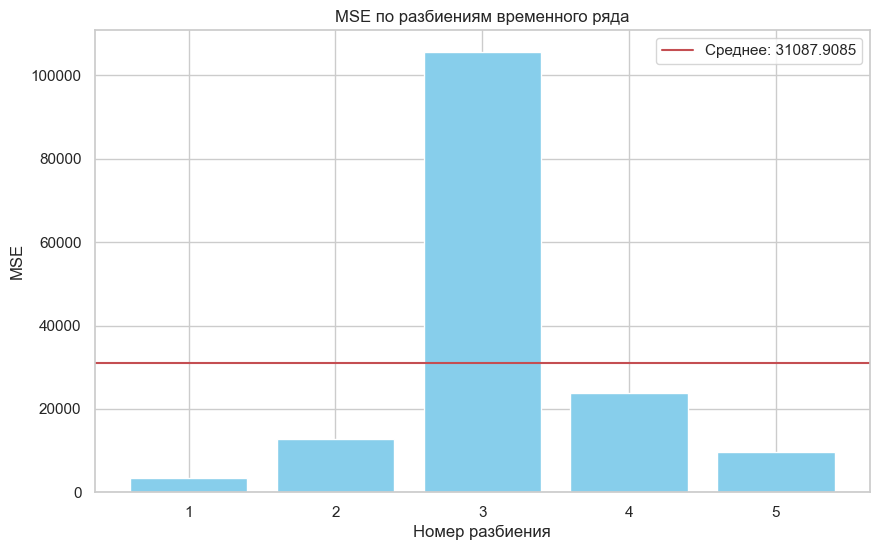

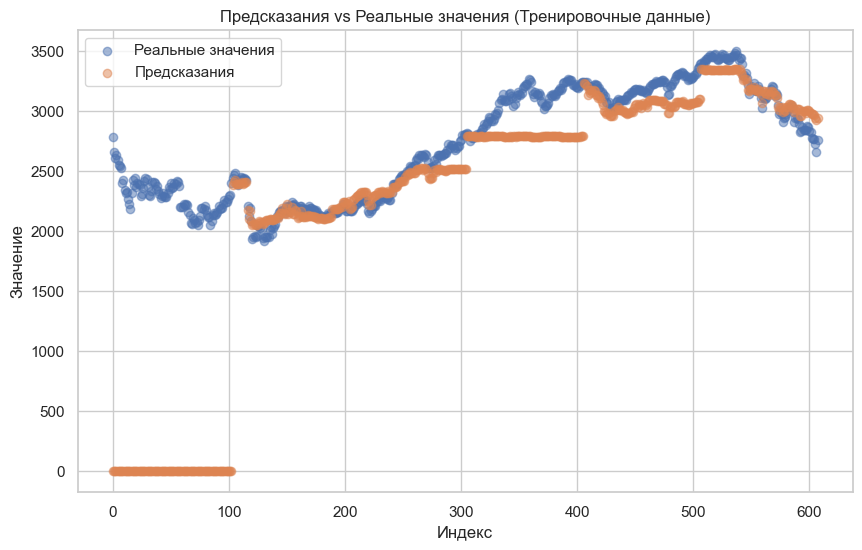

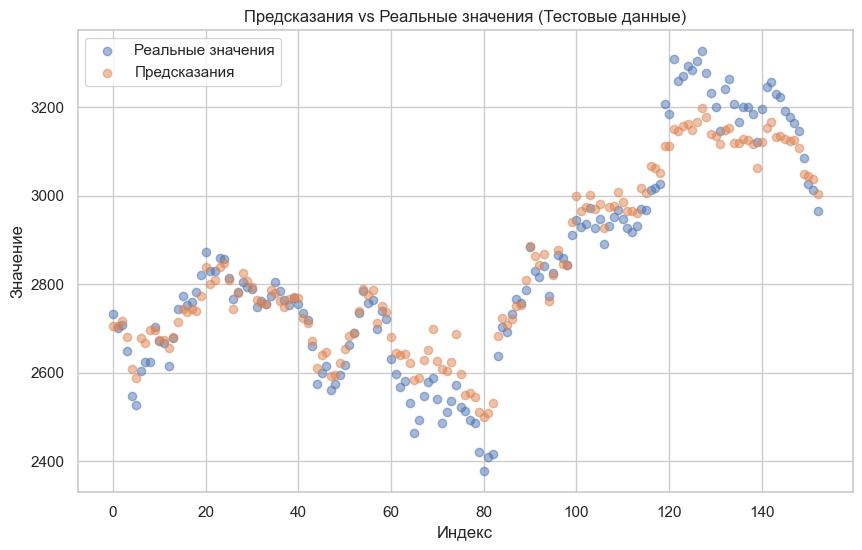

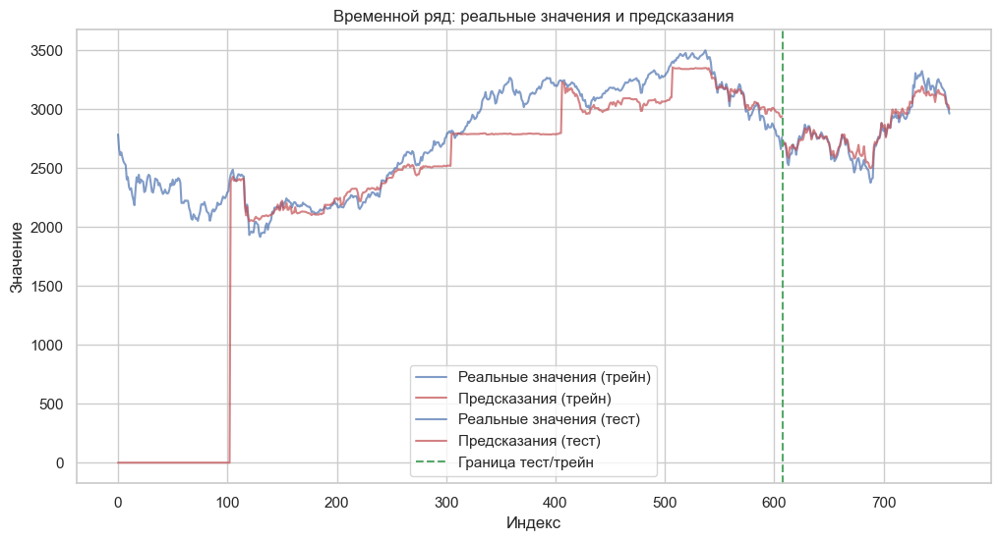

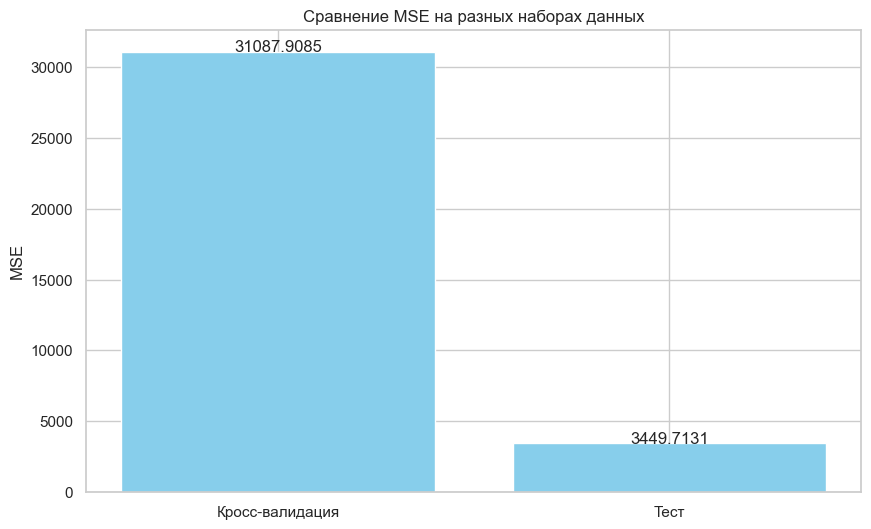

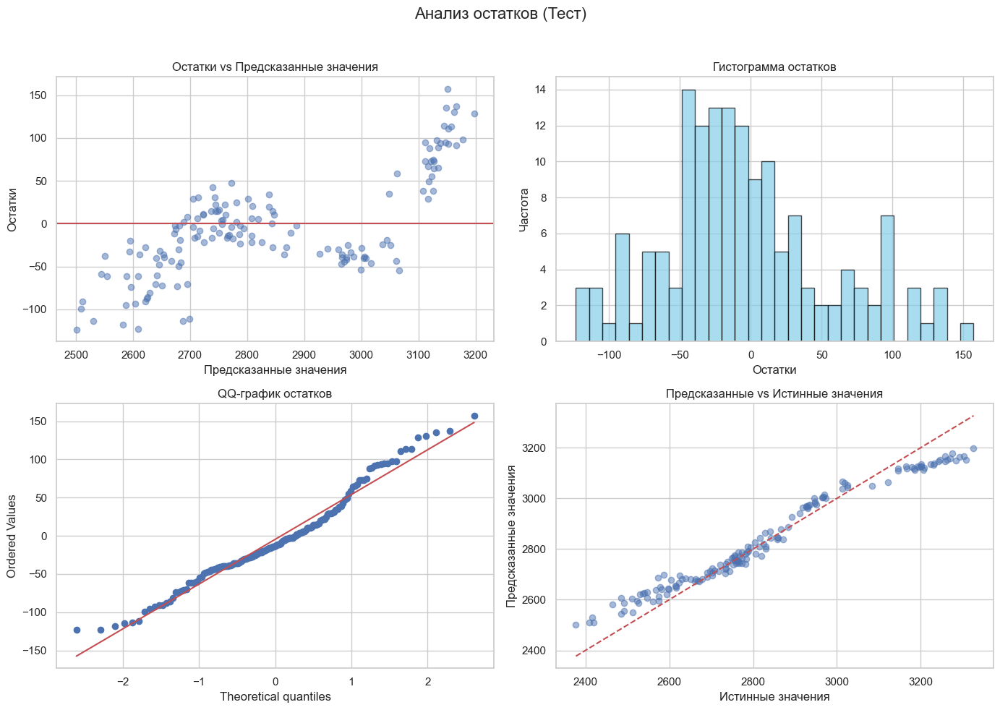

In [451]:
space_catboost = {
    'iterations':        4900,
    'depth':             2,
    'learning_rate':     hp.uniform('learning_rate', 0.0423, 0.04255),
    'l2_leaf_reg':       14,
    'random_strength':   hp.uniform('random_strength', 0.142, 0.143),
    'bagging_temperature': hp.uniform('bagging_temperature', 0.4, 0.41),
    'bootstrap_type':    hp.choice('bootstrap_type', ['Bayesian']),

}
results = run_hyperopt_on_original(
    X_train=X_train_gbdt[selected_features],
    y_train=y_original_train_gbdt,
    X_test=X_test_gbdt[selected_features],
    y_test=y_original_test_gbdt,
    model_class=cb.CatBoostRegressor,
    space=space_catboost,
    n_iter=500,
    early_stopping_rounds=10,
    random_state=42
)

In [453]:
df_log = results['log_df']

display(df_log)

,iteration,iterations,depth,learning_rate,l2_leaf_reg,random_strength,bagging_temperature,random_seed,verbose,bootstrap_type,cv_rmse,test_rmse
0,1,4900,2,0.042,14,0.143,0.409,42,0,Bayesian,148.879,61.005
1,2,4900,2,0.042,14,0.142,0.409,42,0,Bayesian,150.855,60.845
2,3,4900,2,0.042,14,0.142,0.406,42,0,Bayesian,148.720,60.395
3,4,4900,2,0.042,14,0.142,0.406,42,0,Bayesian,147.511,60.458
4,5,4900,2,0.042,14,0.143,0.403,42,0,Bayesian,152.481,60.876
...,...,...,...,...,...,...,...,...,...,...,...,...
495,496,4900,2,0.042,14,0.142,0.406,42,0,Bayesian,149.341,61.107
496,497,4900,2,0.042,14,0.143,0.408,42,0,Bayesian,149.874,60.166
497,498,4900,2,0.042,14,0.142,0.406,42,0,Bayesian,147.899,60.247
498,499,4900,2,0.042,14,0.143,0.404,42,0,Bayesian,150.595,59.687


In [477]:
min_value = (df_log['test_rmse'].min())
df_log[df_log['test_rmse'] == min_value]

,iteration,iterations,depth,learning_rate,l2_leaf_reg,random_strength,bagging_temperature,random_seed,verbose,bootstrap_type,cv_rmse,test_rmse
429,430,4900,2,0.042,14,0.143,0.407,42,0,Bayesian,150.061,58.734


D:\Anaconda\Lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

D:\Anaconda\Lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

D:\Anaconda\Lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide



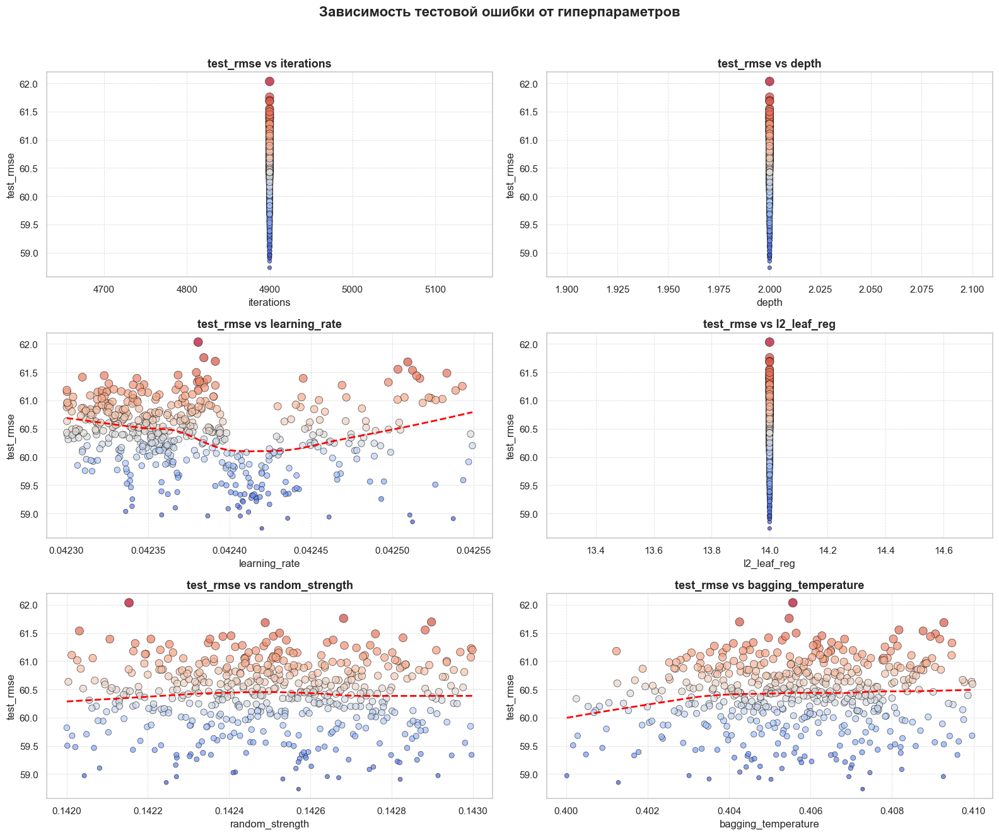

In [455]:
params_to_plot = [
    'iterations',
    'depth',
    'learning_rate',
    'l2_leaf_reg',
    'random_strength',
    'bagging_temperature'
    # 'subsample'
]

plot_hyperopt_param_influence(
    trials_df=df_log,
    params_to_plot=params_to_plot,
    metric_col='test_rmse',
    title="Зависимость тестовой ошибки от гиперпараметров"
)

### Лучшая модель

Hyperopt:   0%|                                                                                  | 0/1 [00:00<?, ?it/s]


===> Запуск objective, итерация 1 <===
  [Objective] Параметры: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241993497221932, 'l2_leaf_reg': 14, 'random_strength': 0.14257063311625118, 'bagging_temperature': 0.40727936635483564, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'}
  [CV] fold 1: train=103, val=101
    fit OK за 0.35 сек
  [CV] fold 2: train=204, val=101
    fit OK за 0.27 сек
  [CV] fold 3: train=305, val=101
    fit OK за 0.35 сек
  [CV] fold 4: train=406, val=101
    fit OK за 0.27 сек
  [CV] fold 5: train=507, val=101
    fit OK за 0.29 сек
  [Objective] mean_cv_rmse: 150.0611
  [Objective] Финальное обучение на всём трейне...
[1] Params: {'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241993497221932, 'l2_leaf_reg': 14, 'random_strength': 0.14257063311625118, 'bagging_temperature': 0.40727936635483564, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian'} | CV RMSE: 150.0611 | Test RMSE: 58.7343


Hyperopt: 100%|██████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.10s/it]



Лучшие параметры по test_rmse: {'iteration': 1, 'iterations': 4900, 'depth': 2, 'learning_rate': 0.04241993497221932, 'l2_leaf_reg': 14, 'random_strength': 0.14257063311625118, 'bagging_temperature': 0.40727936635483564, 'random_seed': 42, 'verbose': 0, 'bootstrap_type': 'Bayesian', 'cv_rmse': 150.06111445941227, 'test_rmse': 58.734258040663754}
Hyperopt завершен за 4.10 секунд


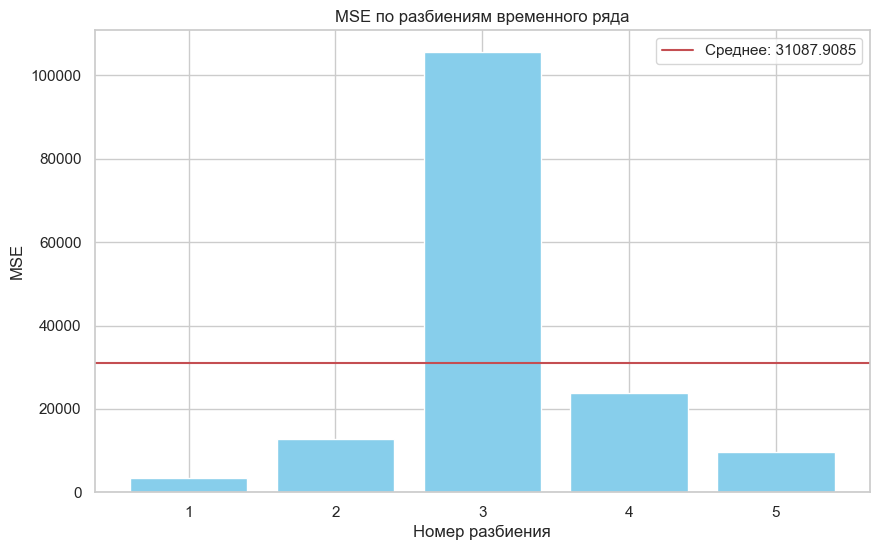

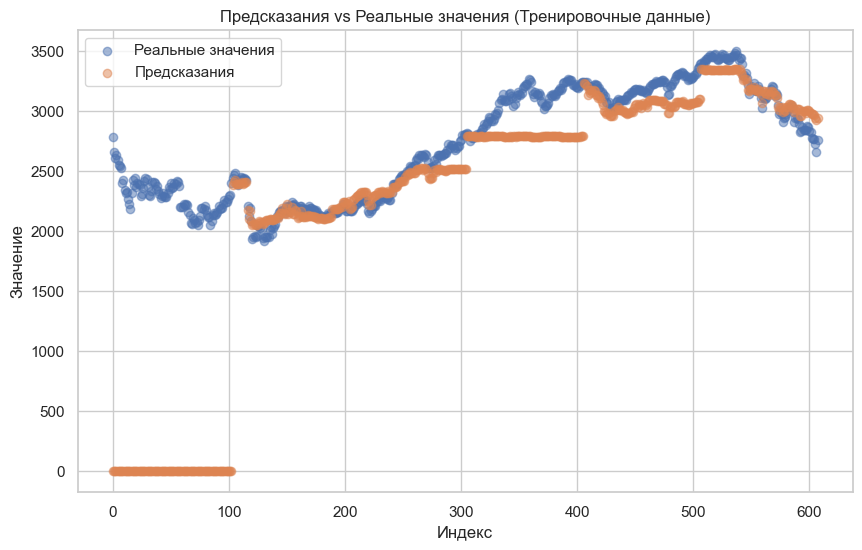

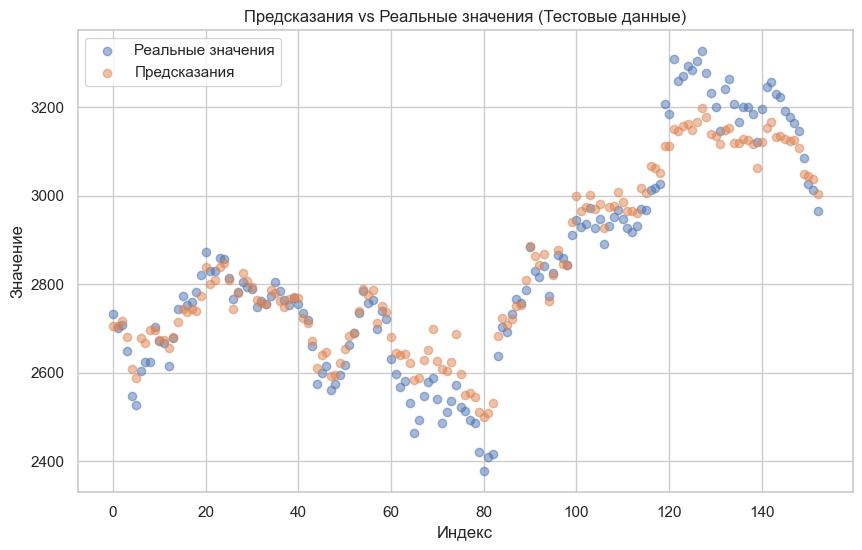

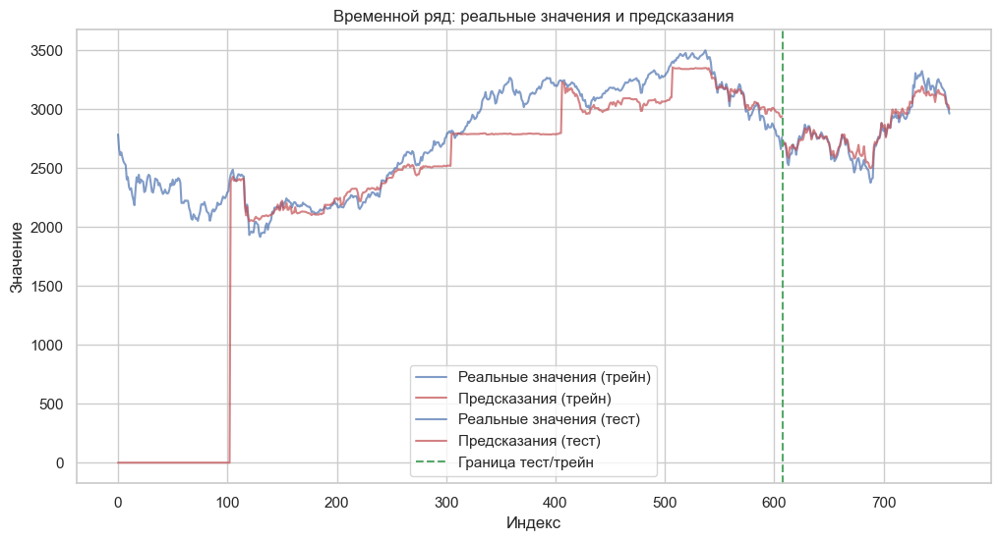

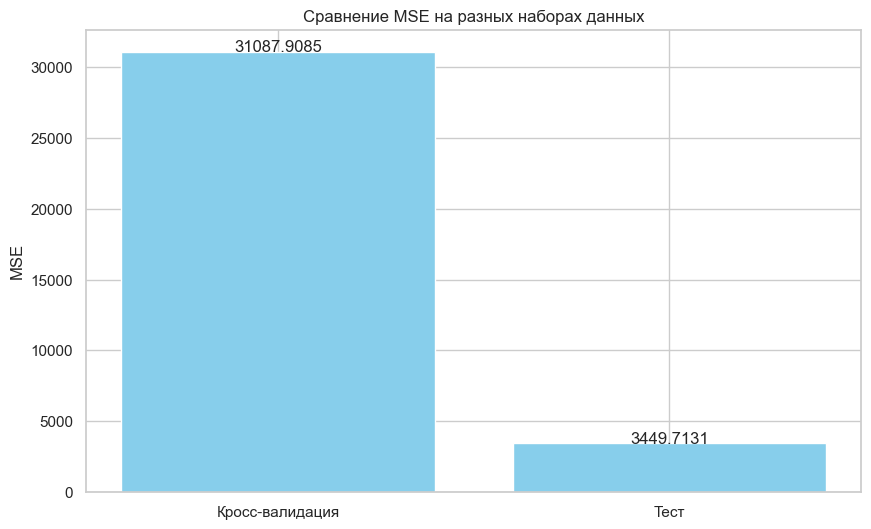

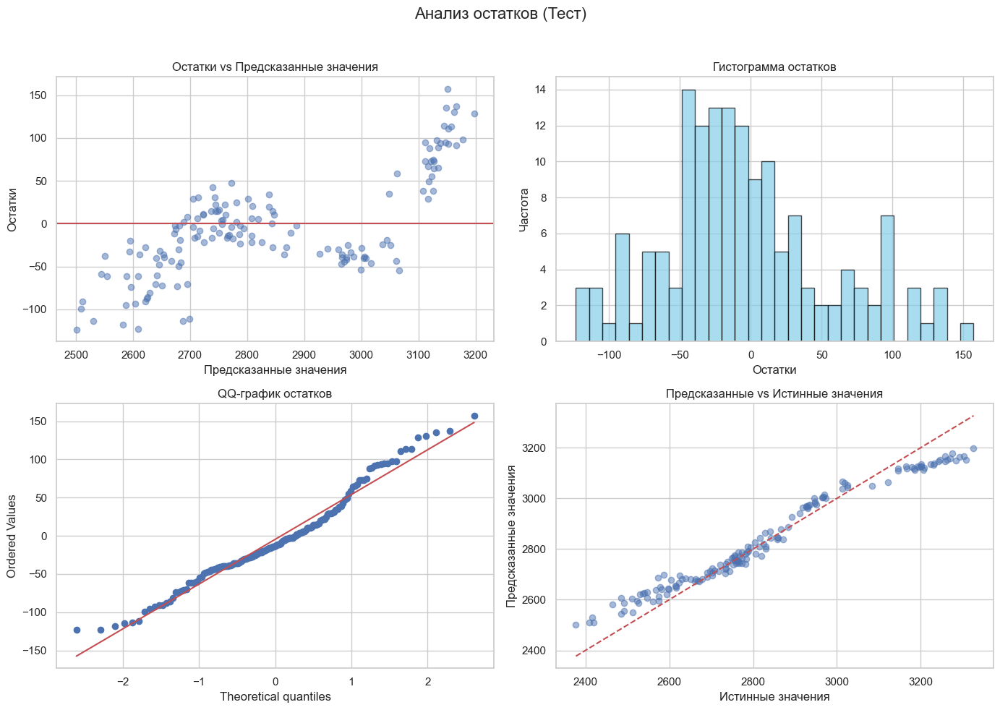

In [569]:
# Лучшие параметры по test_rmse: {'iteration': 430, 'iterations': 4900, 'depth': 2, 
# 'learning_rate': 0.04241993497221932, 'l2_leaf_reg': 14, 'random_strength': 0.14257063311625118, 
# 'bagging_temperature': 0.40727936635483564, 'random_seed': 42, 'verbose': 0, 
# 'bootstrap_type': 'Bayesian', 'cv_rmse': 150.06111445941227, 'test_rmse': 58.734258040663754}
# Hyperopt завершен за 2004.86 секунд


# Параметры из space_catboost
params = {
    'iterations': 4900,
    'depth': 2,
    'learning_rate': 0.04241993497221932,
    'l2_leaf_reg': 14,
    'random_strength': 0.14257063311625118,
    'bagging_temperature': 0.40727936635483564,
    'bootstrap_type': 'Bayesian',
    'loss_function': 'RMSE',
    'eval_metric': 'RMSE',
    'random_seed': 42,
    'verbose': 100
}

results = run_hyperopt_on_original(
    X_train=X_train_gbdt[selected_features],
    y_train=y_original_train_gbdt,
    X_test=X_test_gbdt[selected_features],
    y_test=y_original_test_gbdt,
    model_class=cb.CatBoostRegressor,
    space=space_catboost,
    n_iter=1,
    early_stopping_rounds=10,
    random_state=42
)

In [572]:
cv_results = results['cv_results']
y_pred_gbdt = cv_results['test_predictions']

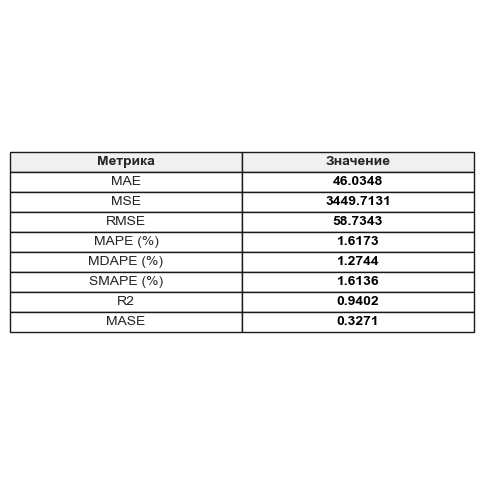

,Метрика,Значение
0,MAE,46.035
1,MSE,3449.713
2,RMSE,58.734
3,MAPE (%),1.617
4,MDAPE (%),1.274
5,SMAPE (%),1.614
6,R2,0.940
7,MASE,0.327


In [576]:
metrics_report(y_true=y_original_test_gbdt, y_pred=y_pred_gbdt, seasonality=14, model_name='CatBoostRegressor')

## Еще более хорошие метрики можно найти в `IMOEX_valuation`!!!

# Глава 3

### Adversarial Validation

In [590]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, roc_curve

def adversarial_validation(X_train, X_test, test_size=0.3, random_state=42):
    """
    Adversarial validation между X_train и X_test с визуализацией ROC-кривой и важности признаков.
    """

    # Преобразования
    X_train = X_train.to_frame() if isinstance(X_train, pd.Series) else X_train
    X_test = X_test.to_frame() if isinstance(X_test, pd.Series) else X_test

    # Проверки
    if set(X_train.columns) != set(X_test.columns):
        raise ValueError("Колонки X_train и X_test должны совпадать")
    if any(not np.issubdtype(X_train[col].dtype, np.number) for col in X_train.columns):
        raise ValueError("Все признаки должны быть числовыми")

    # Собираем общий датафрейм и метки
    X_combined = pd.concat([X_train, X_test], axis=0)
    y_combined = np.array([0] * len(X_train) + [1] * len(X_test))

    # Индексы для разбиения (temporal split)
    train_idx = np.where(y_combined == 0)[0]
    test_idx = np.where(y_combined == 1)[0]

    split_train = int(len(train_idx) * 0.7)
    split_test = int(len(test_idx) * 0.7)

    train_part_idx = np.concatenate([train_idx[:split_train], test_idx[:split_test]])
    val_part_idx = np.concatenate([train_idx[split_train:], test_idx[split_test:]])

    X_dev, y_dev = X_combined.iloc[train_part_idx], y_combined[train_part_idx]
    X_val, y_val = X_combined.iloc[val_part_idx], y_combined[val_part_idx]

    # Модель
    model = XGBClassifier(
        max_depth=3,
        learning_rate=0.1,
        n_estimators=100,
        objective='binary:logistic',
        random_state=random_state,
        base_score=0.5
    )

    model.fit(X_dev, y_dev)
    y_pred = model.predict_proba(X_val)[:, 1]
    auc = roc_auc_score(y_val, y_pred)

    print(f"ROC AUC: {auc:.4f}")

    # ROC-кривая с заливкой площади
    fpr, tpr, _ = roc_curve(y_val, y_pred)
    plt.figure(figsize=(10, 6))
    plt.fill_between(fpr, tpr, 0, color='#ADD2FF', label='AUC (площадь)')
    plt.plot(fpr, tpr, color='#EA3338', linewidth=2.5, linestyle='--', label=f'ROC AUC = {auc:.4f}')
    plt.plot([0, 1], [0, 1], 'k--', linewidth=1.4, label='Случайный классификатор (ROC AUC = 0.5)')
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title('ROC-кривая Adversarial Validation XGBClassifier', fontsize=16, fontweight='bold')
    plt.legend()
    plt.grid(True, alpha=0.35)
    plt.tight_layout()
    plt.show()

    # Важность признаков - сплошная заливка, черный контур
    feature_importance = pd.DataFrame({
        'Признак': X_combined.columns,
        'Важность': model.feature_importances_
    }).sort_values('Важность', ascending=False)

    plt.figure(figsize=(12, 6))
    bars = plt.barh(
        feature_importance['Признак'].head(10)[::-1], 
        feature_importance['Важность'].head(10)[::-1], 
        color='#EA3338',
        edgecolor='black',
        linewidth=1.2
    )
    # Топ-1 выделяем голубым (в конце, т.к. plot обратный)
    if len(bars) > 0:
        bars[0].set_color('#ADD2FF')
    plt.title('Топ-10 признаков по важности', fontsize=16, fontweight='bold')
    plt.xlabel('Важность (Feature Importance)', fontsize=12)
    plt.ylabel('Признак', fontsize=12)
    plt.gca().invert_yaxis()
    plt.grid(True, linestyle='--', alpha=0.7, axis='x')
    plt.tight_layout()
    plt.show()

    return auc, feature_importance

ROC AUC: 0.9645


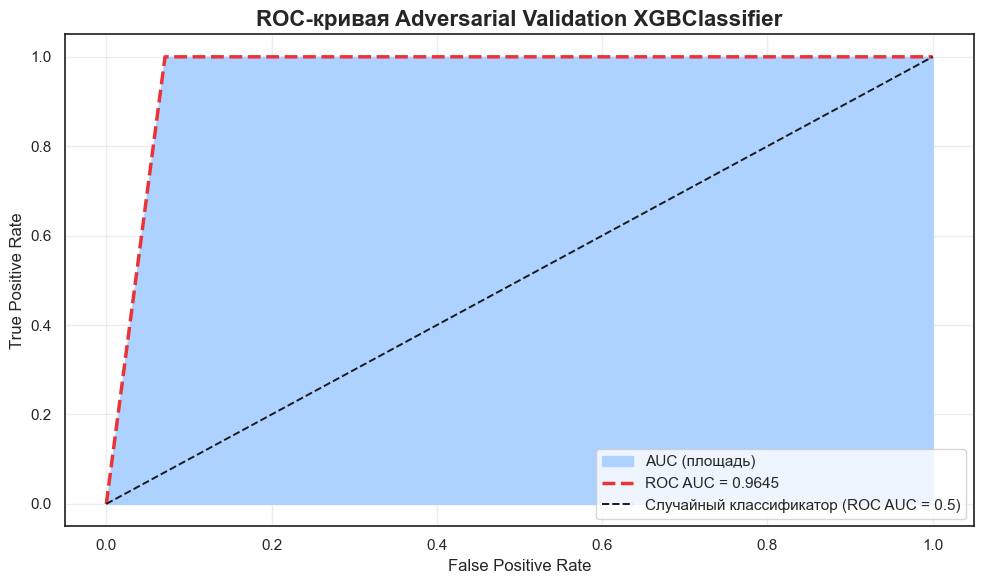

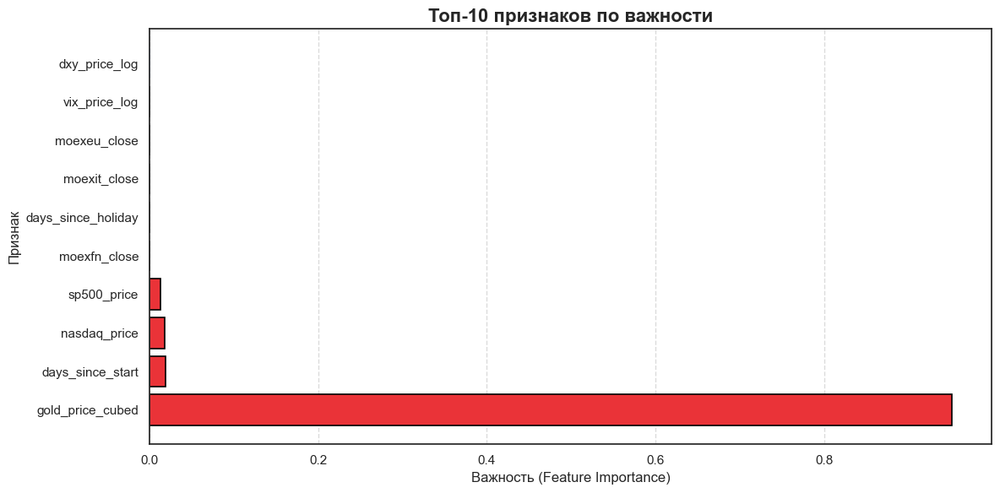

In [591]:
auc, feature_importance = adversarial_validation(
    X_train=X_train_gbdt[selected_features],
    X_test=X_test_gbdt[selected_features]
)

### Колмогоров-Смирнов

In [595]:
def kolmogorov_smirnov_target_analysis(
    train_y, test_y, bins=30, 
    target_name='IMOEX',
    plot_type='kde',
    xlabel='Значения',
    ylabel='Плотность'
):
    """
    KS-анализ с поддержкой кастомных названий и подписей осей.
    """

    arr_train = train_y.dropna().values
    arr_test = test_y.dropna().values

    if len(arr_train) == 0 or len(arr_test) == 0:
        print("Ошибка: train или test содержит пустой массив.")
        return

    train_sorted = np.sort(arr_train)
    test_sorted = np.sort(arr_test)

    # 1. Плотность или гистограмма
    plt.figure(figsize=(12, 5))
    if plot_type == 'kde':
        sns.kdeplot(arr_train, label='Train: распределение таргета', fill=True, color='#EA3338', alpha=0.4)
        sns.kdeplot(arr_test, label='Test: распределение таргета', fill=True, color='#ADD2FF', alpha=0.4)
        plt.title(f'Диаграмма плотности (KDE) таргета ({target_name})', fontsize=14, fontweight='bold')
    else:
        bins_range = np.linspace(min(arr_train.min(), arr_test.min()), max(arr_train.max(), arr_test.max()), bins + 1)
        plt.hist(arr_train, bins=bins_range, alpha=0.5, label='Train: распределение таргета', density=True, color='#EA3338')
        plt.hist(arr_test, bins=bins_range, alpha=0.5, label='Test: распределение таргета', density=True, color='#ADD2FF')
        plt.title(f'Гистограмма распределения таргета ({target_name})', fontsize=14, fontweight='bold')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # 2. ECDF
    plt.figure(figsize=(12, 5))
    plt.plot(train_sorted, np.arange(1, len(train_sorted) + 1) / len(train_sorted), label='Train: ECDF', color='#EA3338')
    plt.plot(test_sorted, np.arange(1, len(test_sorted) + 1) / len(test_sorted), label='Test: ECDF', color='#ADD2FF')
    plt.title(f'Эмпирические функции распределения (ECDF) таргета ({target_name})', fontsize=14, fontweight='bold')
    plt.xlabel(xlabel)
    plt.ylabel('Доля наблюдений')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # 3. Приведённые распределения
    train_to_test = np.searchsorted(train_sorted, test_sorted) / len(train_sorted)
    test_ecdf = np.arange(1, len(test_sorted) + 1) / len(test_sorted)
    ks_diff = np.abs(train_to_test - test_ecdf)
    ks_stat_idx = np.argmax(ks_diff)
    ks_stat = ks_diff[ks_stat_idx]
    x_ks = test_sorted[ks_stat_idx]

    ks_result = ks_2samp(arr_train, arr_test)

    legend_lines = [
        'Train: ECDF в точках Test',
        'Test: ECDF',
        f'KS-статистика = {ks_stat:.4f}',
        f'p-value: {ks_result.pvalue:.4f}'
    ]

    plt.figure(figsize=(12, 5))
    plt.plot(test_sorted, train_to_test, color='#EA3338')
    plt.plot(test_sorted, test_ecdf, color='#ADD2FF')
    plt.vlines(
        x_ks,
        ymin=test_ecdf[ks_stat_idx],
        ymax=train_to_test[ks_stat_idx],
        color='black', linestyle='--', linewidth=2
    )
    y_text = (train_to_test[ks_stat_idx] + test_ecdf[ks_stat_idx]) / 2
    plt.text(x_ks, y_text, f"{ks_stat:.4f}", fontsize=10, color='black')
    plt.title(f'KS-тест и приведённые ECDF для таргета ({target_name})', fontsize=14, fontweight='bold')
    plt.xlabel(xlabel)
    plt.ylabel('ECDF / Доля наблюдений')

    from matplotlib.lines import Line2D
    custom_lines = [
        Line2D([0], [0], color='#EA3338', lw=2),
        Line2D([0], [0], color='#ADD2FF', lw=2),
        Line2D([0], [0], color='black', lw=2, linestyle='--'),
        Line2D([0], [0], color='white', lw=0)
    ]
    plt.legend(custom_lines, legend_lines, loc='upper left', frameon=True)

    plt.grid(True)
    plt.tight_layout()
    plt.show()

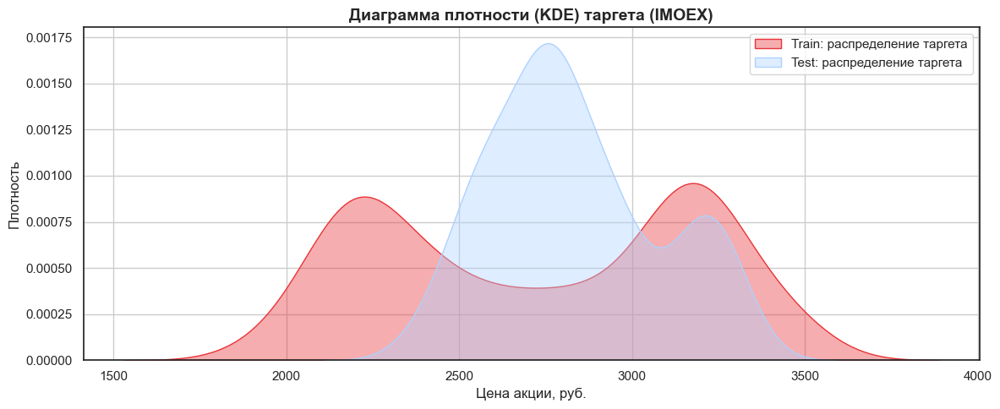

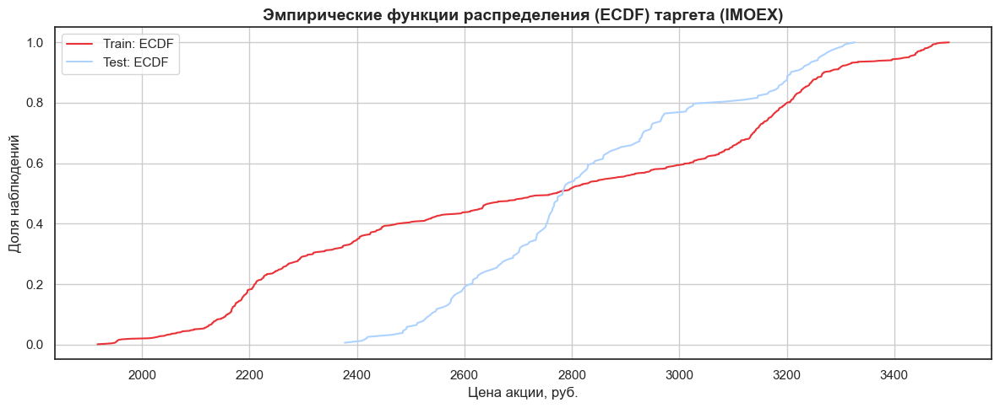

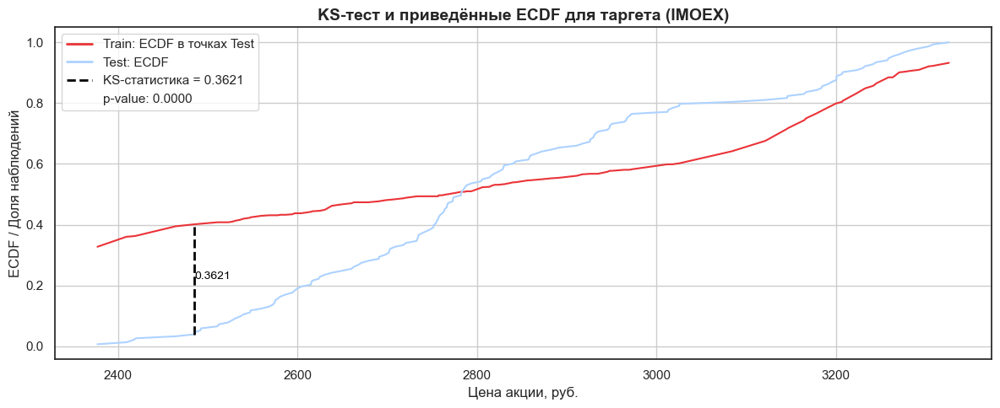

In [597]:
kolmogorov_smirnov_target_analysis(
    y_original_train_gbdt, y_original_test_gbdt,
    bins=40,
    target_name='IMOEX',
    xlabel='Цена акции, руб.',
    ylabel='Плотность'
)

In [598]:
def format_ks_test_results(sample1, sample2, name='таргета (IMOEX)'):
    """
    Выполняет тест Колмогорова–Смирнова (двусторонний, less, greater),
    формирует и выводит таблицу с результатами в нужном стиле.

    Аргументы:
        sample1: первая выборка
        sample2: вторая выборка
        name: имя переменной для отображения

    Возвращает:
        DataFrame с округлёнными результатами.
    """
    ks_result = ks_2samp(sample1, sample2, alternative='two-sided')
    ks_less = ks_2samp(sample1, sample2, alternative='less')
    ks_greater = ks_2samp(sample1, sample2, alternative='greater')

    df = pd.DataFrame({
        'Метрика': [
            'KS-статистика (двусторонний тест)',
            'KS-статистика (альтернатива: less)',
            'KS-статистика (альтернатива: greater)',
            'p-value (двусторонний тест)'
        ],
        'Значение': [
            f"{ks_result.statistic:.4f}",
            f"{ks_less.statistic:.4f}",
            f"{ks_greater.statistic:.4f}",
            f"{ks_result.pvalue:.4f}"
        ]
    })

    print(f"\nРезультаты KS-теста для {name}:\n")
    print(df.to_markdown(index=False, tablefmt="grid", colalign=("left", "right")))

    return df

In [599]:
format_ks_test_results(y_original_train_gbdt, y_original_test_gbdt, name='таргета (IMOEX)')


Результаты KS-теста для таргета (IMOEX):

+---------------------------------------+------------+
| Метрика                               |   Значение |
+=======================================+============+
| KS-статистика (двусторонний тест)     |     0.3686 |
+---------------------------------------+------------+
| KS-статистика (альтернатива: less)    |     0.1954 |
+---------------------------------------+------------+
| KS-статистика (альтернатива: greater) |     0.3686 |
+---------------------------------------+------------+
| p-value (двусторонний тест)           |          0 |
+---------------------------------------+------------+


,Метрика,Значение
0,KS-статистика (двусторонний тест),0.3686
1,KS-статистика (альтернатива: less),0.1954
2,KS-статистика (альтернатива: greater),0.3686
3,p-value (двусторонний тест),0.0000
